# Operational Forecasting System for Onset-Cessation-LGP 



## What sets this forecasting system apart from existing seasonal forecast systems


1) **Member-level bias correction and detection**

2) **Grid-scale spatial correction, calibration,  detection**

3) **Methodological consistency between observations and forecasts**

4) **Rigorous, transparent skill quantification**

5) **Integrated deterministic and probabilistic products** 

6) **Farm-scale bulletin**

## KENYA MAM FORECAST PIPELINE  v3.0.0

**System version:** v3.0.0    
**Domain:** Kenya  
**Season:** March–April–May (MAM)     
**Forecast source:** Météo-France System 9 (February initialisation)    
**Observational reference:** CHIRPS daily precipitation    
**Calibration year:** 1993 – 2016     
**Validation year:** 2017 – 2018  (limited — update with actual Météo-France System 9 availability)    
**Operational year:** 2026    

## Table of Contents

### PART I — CHIRPS OBSERVATIONAL PIPELINE
- **[Methodology: Dunning et al. (2016)](#onset-and-cessation-detection)**
- **[Imports & Configuration](#imports-and-all-configuration-variables)**
- **[Stage 1A](#stage-1a-chirps-daily-ingestion)** — CHIRPS daily ingestion (cropped to Météo-France System 9 domain)
- **[Stage 2A](#stage-2a-dunning-climatology)** — Dunning climatology: Q_d, Q̄, C(d), d_s, d_e
- **[Stage 3A](#stage-3a-onset-cessation--lgp-detection-on-chirps)** — Dunning detection on CHIRPS
- **[Stage 4A](#tercile-boundary-estimation)** — Tercile boundary estimation (t33, t67)

### PART II — Météo-France System 9 FORECAST PIPELINE
- **[Stage 1B MF](#cmcc-sys9-daily-ingestion)** — MF daily ingestion & unit conversion
- **[Stage 2B MF](#stage-2b-mf-reindex-to-chirps-025)** — Reindex to CHIRPS 0.25° target grid (no regrid needed)
- **[Stage 3B MF](#stage-3b-mf-daily-qm-bc-member-wise)** — Daily QM bias correction (member-wise)
- **[Stage 4B MF](#stage-4b-bom-dunning-detection)** — Dunning detection on BC-MF

### PART III — CALIBRATION, VALIDATION & OPERATIONAL FORECAST (Météo-France System 9)
- **[Stage 5](#stage-5-probability-estimation)** — Probability estimation (member counting)
- **[Stage 6](#stage-6-linear-pooling--alpha-optimisation)** — Linear pooling, α* optimisation, RPSS
- **[Stage 7](#stage-7-out-of-sample-validation)** — Out-of-sample validation (2017–2018)
- **[Stage 8](#stage-8-operational-bulletin)** — Operational bridge → bulletin generation

> **Météo-France System 9 key facts:**  
> 3 members (hindcast 1993–2018) | 11 members (operational 2026) | 0.25° native grid  
> Missing years 2019–2025 | CAL: 1993–2016 | VAL: 2017–2018 | OP: 2026


## Onset and Cessation Detection using Dunning et al. (2016) & Liebmann et al. (2012)


### Reference
Dunning, C.M., Black, E.C.L., & Allan, R.P. (2016). The onset and cessation of seasonal rainfall over Africa. *Journal of Geophysical Research: Atmospheres*, 121(19), 11,405–11,424. https://doi.org/10.1002/2016JD025428

---

### Step 1 — Climatological Daily Mean  Q_d(i,j)

$$Q_d(i,j) = \frac{1}{N_{cal}} \sum_{y \in \text{CAL}} R_{d,y}(i,j)$$

| Symbol | Description |
|---|---|
| $Q_d(i,j)$ | Mean daily precipitation for day-of-year $d$ at pixel $(i,j)$, computed over the calibration period |
| $R_{d,y}(i,j)$ | Observed daily precipitation (mm/day) at pixel $(i,j)$ for DOY $d$ in year $y$ |
| $N_{cal}$ | Number of calibration years (1981–2016, $N_{cal}=36$) |
| $d$ | Day of year restricted to the forecast window: $d \in [32, 213]$ (Feb 1 – Aug 1) |

---

### Step 2 — Window Mean  $\bar{Q}(i,j)$

$$\bar{Q}(i,j) = \frac{1}{N_{win}} \sum_{d=d_{win,start}}^{d_{win,end}} Q_d(i,j)$$

| Symbol | Description |
|---|---|
| $\bar{Q}(i,j)$ | Single scalar mean precipitation rate for pixel $(i,j)$, averaged over all days in the forecast window — the **Dunning accumulation baseline** |
| $N_{win}$ | Number of days in the forecast window ($N_{win} = 182$, DOY 32–213) |
| $d_{win,start}$ | First day of the forecast window (DOY 32 = Feb 1, non-leap year) |
| $d_{win,end}$ | Last day of the forecast window (DOY 213 = Aug 1, non-leap year) |

> **Why a scalar?** $\bar{Q}$ is a single value per pixel — not a DOY-varying quantity. It represents the long-term average daily rainfall rate across the entire window. Subtracting it from each daily observation produces anomalies that accumulate positively during wet periods and negatively during dry periods, creating the characteristic S-shape of $C(d)$.

---

### Step 3 - Climatological Accumulated Anomaly  $C(d)$

$$C(d) = \sum_{k=d_{win,start}}^{d} \left[ Q_k(i,j) - \bar{Q}(i,j) \right]$$

| Symbol | Description |
|---|---|
| $C(d)$ | Cumulative sum of daily anomalies from the start of the window up to day $d$ — the **climatological water season curve** |
| $Q_k(i,j)$ | Climatological daily mean at DOY $k$ (from Step 1) |
| $\bar{Q}(i,j)$ | Scalar window mean (from Step 2) |
| $d$ | Current DOY within $[d_{win,start},\ d_{win,end}]$ |

The $C(d)$ curve is computed once per pixel over the calibration period. Its shape is fixed and serves as the reference geometry for detecting the season bounds.

---

### Step 4 — Climatological Season Bounds  $d_s$  and  $d_e$

$$d_s(i,j) = \underset{d \in [d_{win,start},\ d_{win,end}]}{\arg\min} \ C(d)$$

$$d_e(i,j) = \underset{d \in [d_s,\ d_{win,end}]}{\arg\max} \ C(d)$$

| Symbol | Description |
|---|---|
| $d_s(i,j)$ | **Climatological season start** — the DOY at which $C(d)$ reaches its minimum; marks the end of the pre-MAM dry period (typical range: DOY 35–117, mean ≈ DOY 74 ≈ 14 Mar) |
| $d_e(i,j)$ | **Climatological season end** — the DOY at which $C(d)$ reaches its maximum after $d_s$; marks the end of the MAM wet accumulation (typical range: DOY 120–213, mean ≈ DOY 137 ≈ 16 May) |

> $d_s$ and $d_e$ are **pixel-specific constants** derived from the calibration period. They define the search window for individual-year detection in Steps 5–7.

---

### Step 5 — Individual-Year Accumulated Anomaly  $A(D)$

For each year $y$ and pixel $(i,j)$:

$$A(D) = \sum_{j=d_{acc,start}}^{D} \left[ R_{j,y}(i,j) - \bar{Q}(i,j) \right]$$

where the accumulation window is clamped to the forecast window:

$$d_{acc,start} = \max\!\left(d_{win,start},\ d_s - \delta\right)$$
$$d_{acc,end} = \min\!\left(d_{win,end},\ d_e + \delta\right)$$

| Symbol | Description |
|---|---|
| $A(D)$ | Accumulated precipitation anomaly from the start of the accumulation window up to day $D$ for year $y$ |
| $R_{j,y}(i,j)$ | Observed (or BC-SEAS5) daily precipitation at pixel $(i,j)$, DOY $j$, year $y$ |
| $\bar{Q}(i,j)$ | The same scalar window mean from Step 2 (never re-computed per year) |
| $D$ | Running day index within $[d_{acc,start},\ d_{acc,end}]$ |
| $\delta$ | Buffer days added around $d_s$ and $d_e$ to allow early/late seasons ($\delta = 50$ days in this pipeline) |
| $d_{acc,start}$ | Start of the accumulation window for this pixel and year |
| $d_{acc,end}$ | End of the accumulation window for this pixel and year |

---

### Step 6 — Onset Detection

$$\text{onset}_{y}(i,j) = \underset{D \in [d_{acc,start},\ d_{acc,end}]}{\arg\min} \ A(D) \quad + \quad 1$$

| Symbol | Description |
|---|---|
| $\text{onset}_{y}(i,j)$ | Detected onset DOY for year $y$ at pixel $(i,j)$ |
| $\arg\min A(D)$ | The day on which the accumulated anomaly reaches its minimum — the deepest point of the pre-season dry deficit |
| $+1$ | **Dunning definition**: onset is the day **after** the minimum, i.e., the first day precipitation begins to exceed $\bar{Q}$ on a sustained basis |

> If $\arg\min A(D)$ falls at the very end of the search window, onset is flagged as undetected (NaN) for that year.

---

### Step 7 — Cessation Detection

$$\text{cessation}_{y}(i,j) = \underset{D \in [\text{onset}_y,\ d_{acc,end}]}{\arg\max} \ A(D)$$

| Symbol | Description |
|---|---|
| $\text{cessation}_{y}(i,j)$ | Detected cessation DOY for year $y$ at pixel $(i,j)$ |
| $\arg\max A(D)$ | The day on which the accumulated anomaly reaches its peak after onset — the point where precipitation begins to fall below $\bar{Q}$ on a sustained basis |

> Note: cessation is the day **of** the maximum (no $+1$ offset). The search is restricted to days strictly after onset.

---

### Step 8 — Length of Growing Period (LGP)

$$\text{LGP}_{y}(i,j) = \text{cessation}_{y}(i,j) - \text{onset}_{y}(i,j)$$

| Symbol | Description |
|---|---|
| $\text{LGP}_{y}(i,j)$ | Length of the growing period in days for year $y$ at pixel $(i,j)$ |

---

### Pipeline Configuration (Kenya MAM 2026, v3.0.0)

| Parameter | Value | Description |
|---|---|---|
| Forecast window | DOY 32–213 | Feb 1 – Aug 1 (non-leap) |
| $N_{win}$ | 182 days | Window length |
| Calibration period | 1981–2016 | $N_{cal} = 36$ years |
| Validation period | 2017–2025 | $N_{val} = 9$ years |
| Operational year | 2026 | Target forecast year |
| Buffer $\delta$ | 50 days | Applied around $d_s$ and $d_e$ |
| CHIRPS resolution | 0.25° | Observational grid |
| SEAS5 members | 25 | Trimmed from 51 for 2026 |
| Bias correction | Empirical QM | Cube-root transform, ±15-day DOY window |
| $\bar{Q}$ domain mean | 1.820 mm/day | Scalar across all land pixels |
| $d_s$ range | DOY 35–117 | Mean ≈ DOY 74 (≈ 14 Mar) |
| $d_e$ range | DOY 120–213 | Mean ≈ DOY 137 (≈ 16 May) |
| CHIRPS onset (CAL mean) | DOY 86.7 | ≈ 27 Mar |
| CHIRPS cessation (CAL mean) | DOY 133.5 | ≈ 12 May |
| CHIRPS LGP (CAL mean) | 46.8 days | |
| SEAS5 onset bias | +4.1 days | Later than CHIRPS CAL mean |
| SEAS5 DR (CAL) | 0.844 | Fraction of member-years with detected onset |
| CHIRPS DR (CAL) | 0.890 | Fraction of CAL years with detected onset |

## IMPORTS AND ALL CONFIGURATION VARIABLES

## Import Python Packages

In [121]:
# !/usr/bin/env python3
# ────────────────────────────────────────────────────────────────────────── 
import numpy        as np
import xarray       as xr
import pandas       as pd
import os, datetime, warnings, glob
import geopandas    as gpd
from scipy.interpolate import RegularGridInterpolator
import matplotlib.pyplot      as plt
import matplotlib.patches     as mpatches
import matplotlib.ticker      as mticker
import matplotlib.gridspec    as gridspec
import matplotlib.colors      as mcolors
import matplotlib.patheffects as mpe
import cartopy.crs            as ccrs
import cartopy.feature        as cfeature
warnings.filterwarnings("ignore")

## CONFIGURATION VARIABLES

### System / Pipeline Version

In [122]:
# ── System version ──────────────────────────────────────────────────────
SYSTEM_VERSION    = "v3.0.0"
DETECTION_RULESET = "v3.0-D-Dunning"
# ──────────────────────────────────────────────────────────────────────── 

print(f"Running onset/cessation/LGP detection with system version {SYSTEM_VERSION} and ruleset {DETECTION_RULESET}...")

Running onset/cessation/LGP detection with system version v3.0.0 and ruleset v3.0-D-Dunning...


### Input File Paths

In [123]:
# ── File paths ─────────────────────────────────────────────────────────────

# ── CHIRPS observational data ────────────────────────────────────────────
CHIRPS_DAILY_PATH  = r"C:\Users\yonas\Documents\ILRI\onset-kenya\chirps_kenya_p25_1981_2025.nc"
CHIRPS_VAR         = "precip"

# ── Météo-France System 9 forecast data ──────────────────────────────────
MF_DIR          = r"C:\Users\yonas\Documents\ILRI\onset-kenya\c3s_meteo_france_seasonal"
MF_FILE_PATTERN = "meteo_france_daily_{year}_init0201_182d_kenya.nc"
FILE_GLOB       = "meteo_france_daily_*_init0201_182d_kenya.nc"
MF_VAR          = "tp"           # cumulative total precipitation (metres)

# ── Kenya shapefile ──────────────────────────────────────────────────────
KENYA_SHP = r"C:\Users\yonas\Documents\ILRI\onset-kenya\district_kenya\kenya.shp"

# ── Output root — ALL outputs for this model go here ─────────────────────
# This is the directory the multi-model notebook reads from.
OUT_DIR      = r"C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_mf_v3"
PLOT_DIR     = os.path.join(OUT_DIR, "plots")
BULLETIN_DIR = os.path.join(PLOT_DIR, "bulletins")

import os
os.makedirs(OUT_DIR,      exist_ok=True)
os.makedirs(PLOT_DIR,     exist_ok=True)
os.makedirs(BULLETIN_DIR, exist_ok=True)

# ── MF-specific output file paths ─────────────────────────────────────────
OUT_MF_BC    = os.path.join(OUT_DIR, "MF_bc_daily_all_years.nc")
OUT_MF_ONSET = os.path.join(OUT_DIR, "MF_onset_doy_all_years.nc")
OUT_MF_CESS  = os.path.join(OUT_DIR, "MF_cessation_doy_all_years.nc")
OUT_MF_LGP   = os.path.join(OUT_DIR, "MF_lgp_days_all_years.nc")

print("File paths set:")
print(f"  CHIRPS input : {CHIRPS_DAILY_PATH}")
print(f"  MF data      : {MF_DIR}")
print(f"  Output root  : {OUT_DIR}")
print(f"  Plots        : {PLOT_DIR}")


All file paths set successfully.
  CHIRPS data path: C:\Users\yonas\Documents\ILRI\onset-kenya\chirps_kenya_p25_1981_2025.nc
  MF data directory: C:\Users\yonas\Documents\ILRI\onset-kenya\c3s_meteo_france_seasonal
  MF file pattern: meteo_france_daily_{year}_init0201_182d_kenya.nc
  Output directory: C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_mf_v3


### Output Directory

In [124]:
# ── Output directory — stays as outputs_mf_v3 throughout ──────────────────
# OUT_DIR was set in Cell 11. Do NOT reassign it here.

os.makedirs(OUT_DIR, exist_ok=True)
for _sub in ["calibration_params", "validation_scores", "operational_2026",
             "diagnostics", "plots", "plots/bulletins"]:
    os.makedirs(os.path.join(OUT_DIR, _sub), exist_ok=True)

PLOT_DIR     = os.path.join(OUT_DIR, "plots")
BULLETIN_DIR = os.path.join(PLOT_DIR, "bulletins")
CALIB_DIR    = os.path.join(OUT_DIR, "calibration_params")
VALID_DIR    = os.path.join(OUT_DIR, "validation_scores")

# ── CHIRPS reference outputs ──────────────────────────────────────────────
OUT_Q_D          = os.path.join(OUT_DIR, "chirps_Q_d_cal.nc")
OUT_Q_BAR        = os.path.join(OUT_DIR, "chirps_Q_bar.nc")
OUT_C_CLIM       = os.path.join(OUT_DIR, "chirps_C_clim.nc")
OUT_D_S          = os.path.join(OUT_DIR, "chirps_d_s.nc")
OUT_D_E          = os.path.join(OUT_DIR, "chirps_d_e.nc")
OUT_CHIRPS_ONSET = os.path.join(OUT_DIR, "CHIRPS_onset_doy_1981_2025.nc")
OUT_CHIRPS_CESS  = os.path.join(OUT_DIR, "CHIRPS_cessation_doy_1981_2025.nc")
OUT_CHIRPS_LGP   = os.path.join(OUT_DIR, "CHIRPS_lgp_days_1981_2025.nc")
OUT_DET_RATE     = os.path.join(OUT_DIR, "CHIRPS_detection_rate.nc")

# ── Tercile boundaries (calibration_params subdirectory) ─────────────────
OUT_T33_ONSET = os.path.join(CALIB_DIR, "t33_onset_doy.nc")
OUT_T67_ONSET = os.path.join(CALIB_DIR, "t67_onset_doy.nc")
OUT_T33_CESS  = os.path.join(CALIB_DIR, "t33_cessation_doy.nc")
OUT_T67_CESS  = os.path.join(CALIB_DIR, "t67_cessation_doy.nc")
OUT_T33_LGP   = os.path.join(CALIB_DIR, "t33_lgp_days.nc")
OUT_T67_LGP   = os.path.join(CALIB_DIR, "t67_lgp_days.nc")

# ── MF-specific outputs ────────────────────────────────────────────────────
OUT_MF_BC    = os.path.join(OUT_DIR, "MF_bc_daily_all_years.nc")
OUT_MF_ONSET = os.path.join(OUT_DIR, "MF_onset_doy_all_years.nc")
OUT_MF_CESS  = os.path.join(OUT_DIR, "MF_cessation_doy_all_years.nc")
OUT_MF_LGP   = os.path.join(OUT_DIR, "MF_lgp_days_all_years.nc")

print("\nOutput file paths:")
print(f"  Root           : {OUT_DIR}")
print(f"  Plots          : {PLOT_DIR}")
print(f"  Calibration    : {CALIB_DIR}")
print(f"  Validation     : {VALID_DIR}")
print(f"  CHIRPS onset   : {OUT_CHIRPS_ONSET}")
print(f"  CHIRPS cess    : {OUT_CHIRPS_CESS}")
print(f"  CHIRPS LGP     : {OUT_CHIRPS_LGP}")
print(f"  MF BC daily    : {OUT_MF_BC}")
print(f"  MF onset       : {OUT_MF_ONSET}")
print(f"  MF cessation   : {OUT_MF_CESS}")
print(f"  MF LGP         : {OUT_MF_LGP}")
print(f"  t33/t67 onset  : {OUT_T33_ONSET}")
print(f"  t33/t67 cess   : {OUT_T33_CESS}")
print(f"  t33/t67 LGP    : {OUT_T33_LGP}")



Output file paths:
Output directory set to: C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0
Plot directory set to: C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots
Calibration directory set to: C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\calibration_params
Validation directory set to: C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\validation_scores
  CHIRPS Q(d) climatology (forecast window): C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\chirps_Q_d_cal.nc
  CHIRPS Q(d) climatology (full year): C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\chirps_Q_bar.nc
  CHIRPS C(d) climatology (forecast window): C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\chirps_C_clim.nc
  CHIRPS d_s(d) climatology (forecast window): C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\chirps_d_s.nc
  CHIRPS D(e) climatology (forecast window): C:\Users\yonas\Documents

### Target Domain & Grid Definition

In [125]:
# ── Kenya domain 0.25° target grid ───────────────────────────────────────
LAT_N    =  5.4
LAT_S    = -5.0
LON_W    = 33.5
LON_E    = 42.1
GRID_RES =  0.25   # degrees

# This ensures that all CHIRPS and SEAS5 data are regridded/interpolated to the same grid, which is crucial for grid-wise calibration and validation. 
# The target grid is used for all subsequent analyses, including the computation of climatologies, detection of onset and cessation, and skill assessment.

# The np.round(..., 6) is used to avoid floating-point precision issues that can arise with decimal numbers.
target_lat = np.round(np.arange(LAT_S + GRID_RES/2, LAT_N, GRID_RES), 6)
# The np.round(..., 6) is used to avoid floating-point precision issues that can arise with decimal numbers.
target_lon = np.round(np.arange(LON_W + GRID_RES/2, LON_E, GRID_RES), 6)
n_lat      = len(target_lat)
n_lon      = len(target_lon)

print(f"Target grid : {n_lat} lat × {n_lon} lon = {n_lat*n_lon} pixels")
print(f"Latitude range: {target_lat[0]} to {target_lat[-1]} with step {GRID_RES}°")
print(f"Longitude range: {target_lon[0]} to {target_lon[-1]} with step {GRID_RES}°")


Target grid : 42 lat × 34 lon = 1428 pixels
Latitude range: -4.875 to 5.375 with step 0.25°
Longitude range: 33.625 to 41.875 with step 0.25°


In [126]:
# N_MEMBERS_MF = int(mf_onset_doy.shape[0])   # 3 hindcast, 11 operational
# _nd_bom       = int(mf_bc.shape[2])           # forecast days (182)
# print(f"  MF members (from array) : {N_MEMBERS_MF}")
# print(f"  MF forecast days        : {_nd_bom}")
 

### Year Splits Bounds

In [ ]:
# ── Year splits ─────────────────────────────────────────────────────────────
#
# Météo-France System 9 availability:
#   Hindcast: 1993–2018  (26 years, update with actual Météo-France System 9 member count)
#   Missing : 2019–2025  (verify Météo-France System 9 availability)
#   Operational: 2026    (11 members)
#
# CAL: 1993–2016 (24 years) — limited by Météo-France System 9 hindcast start
# VAL: 2017–2018 (2 years only — update with actual Météo-France System 9 availability)
# OP : 2026

CAL_YEARS = np.arange(1993, 2017)   # 1993–2016  (24 years, calibration)
VAL_YEARS = np.arange(2017, 2026)  # only 2 VAL years available
OP_YEAR   = 2026
ALL_YEARS = np.concatenate([CAL_YEARS, VAL_YEARS, [OP_YEAR]])

# MF years with actual files (missing 2019–2025)
MF_AVAILABLE_YEARS = np.concatenate([np.arange(1993, 2025), [2026]])

# CHIRPS years to load (start from 1993 to match MF CAL start)
# CHIRPS 1981–1992 is loaded but excluded from CAL to match MF
# You may keep them for the CHIRPS-only analysis in Stage 3A
CHIRPS_FULL_YEARS = np.arange(1981, 2026)  # keep full CHIRPS for reference

print(f"  CAL years : {CAL_YEARS[0]}–{CAL_YEARS[-1]}  ({len(CAL_YEARS)} years)")
print(f"  VAL years : {VAL_YEARS}  ({len(VAL_YEARS)} years — limited by Météo-France System 9 availability)")
print(f"  OP year   : {OP_YEAR}")
print(f"  MF available: {len(MF_AVAILABLE_YEARS)} files  "
      f"({MF_AVAILABLE_YEARS[0]}–{MF_AVAILABLE_YEARS[-1]}, )")
# print()
# print("  ⚠  Only 2 validation years (2017–2018). Skill metrics will be")
# print("     indicative only — interpret with caution.")


  CAL years : 1993–2016  (24 years)
  VAL years : [2017 2018 2019 2020 2021 2022 2023 2024 2025]  (9 years — limited by Météo-France System 9 availability)
  OP year   : 2026
  MF available: 33 files  (1993–2026, )

  ⚠  Only 2 validation years (2017–2018). Skill metrics will be
     indicative only — interpret with caution.


### Météo-France System 9 Model Settings

In [128]:
# ── Météo-France System 9 model settings ────────────────────────────────────────────
#
# Hindcast members : 3   (1993–2018, number dim = [1, 2, 3])
# Operational      : 11  (2026) — trimmed to N_MEMBERS=3 for consistency
# Forecast length  : 182 days (Feb 1 → Aug 1)
# Init date        : February 1  (same as SEAS5)
# Native grid      : 0.25° (49 lat × 45 lon) — NO regridding needed
# Variable         : tp — cumulative total precipitation in metres
# Time dim         : forecast_period (hours since init, size 182)
# Ensemble dim     : number

N_MEMBERS        = 31     # hindcast ensemble size (use 3 for all years for consistency)
N_FORECAST_DAYS  = 182   # Feb 1 → Aug 1 (DOY 32 → 213)

MF_INIT_MONTH   = 2
MF_INIT_DAY     = 1

# MF grid (native 0.25° — matches target grid exactly)
MF_LAT_MIN = -5.0;  MF_LAT_MAX = 7.0    # 49 lat points
MF_LON_MIN = 32.0;  MF_LON_MAX = 43.0   # 45 lon points

print(f"  MF settings:")
print(f"    Hindcast members   : {N_MEMBERS}  (1993–2018)")
print(f"    Operational members: 50 → trimmed to {N_MEMBERS}  (2026)")
print(f"    Forecast length    : {N_FORECAST_DAYS} days")
print(f"    Initialisation     : {MF_INIT_MONTH:02d}-{MF_INIT_DAY:02d}  (Feb 1)")
print(f"    Native resolution  : 0.25°  (same as CHIRPS — no regrid needed ✓)")
print(f"    Precip variable    : '{MF_VAR}'  (cumulative metres → diff → ×1000 → mm/day)")


  MF settings:
    Hindcast members   : 31  (1993–2018)
    Operational members: 50 → trimmed to 31  (2026)
    Forecast length    : 182 days
    Initialisation     : 02-01  (Feb 1)
    Native resolution  : 0.25°  (same as CHIRPS — no regrid needed ✓)
    Precip variable    : 'tp'  (cumulative metres → diff → ×1000 → mm/day)


### Forecast Window in DOY 

In [129]:
# All climatology, C(d), d_s/d_e, and A(D) detection are restricted to this window so that CHIRPS and SEAS5 operate over the identical period.
# This prevents the full-year C(d) from finding the OND season 

WIN_DOY_START = 32    # Feb 1 in a non-leap year  (DOY 32)
WIN_DOY_END   = 213   # Aug 1 in a non-leap year  (DOY 213)
WIN_N_DAYS    = WIN_DOY_END - WIN_DOY_START + 1   # 182 

 
print(f"Forecast window : DOY {WIN_DOY_START} (Feb 1) → DOY {WIN_DOY_END} (Aug 1)"
      f"  =  {WIN_N_DAYS} days")

Forecast window : DOY 32 (Feb 1) → DOY 213 (Aug 1)  =  182 days


### Search Window & FLAG SHORT SEASON

In [130]:
# C(D) and all A(D) 
DUNNING_BUFFER_DAYS = 50   # window = [d_s − 50, d_e + 50] per pixel
MIN_LGP_DAYS        = 20   # seasons shorter than this → FLAG_SHORT_SEASON

print(f"Dunning buffer for A(D) detection: {DUNNING_BUFFER_DAYS} days")
print(f"Minimum LGP for valid season: {MIN_LGP_DAYS} days")

Dunning buffer for A(D) detection: 50 days
Minimum LGP for valid season: 20 days


### Bias Correction Parameters


In [131]:
QM_DOY_WINDOW      = 15    # ±15 days around each forecast DOY for CDF pooling
WET_DAY_THRESH     = 0.1   # mm/day — below this a day is dry
BC_TRANSFORM_POWER = 1/3   # cube-root pre-transform

print(f"Bias correction parameters:")
print(f"  QM DOY window: ±{QM_DOY_WINDOW} days")
print(f"  Wet day threshold: {WET_DAY_THRESH} mm/day")
print(f"  Bias correction transform power: {BC_TRANSFORM_POWER} (cube-root)")


Bias correction parameters:
  QM DOY window: ±15 days
  Wet day threshold: 0.1 mm/day
  Bias correction transform power: 0.3333333333333333 (cube-root)


### Probability / Skill Parameters

In [132]:
MIN_TERCILE_YEARS = 12     # pixels below this → domain-median fallback
ALPHA_GRID        = np.round(np.arange(0.0, 1.01, 0.01), 2) # 0.00, 0.01, 0.02, ..., 0.99, 1.00

print(f"Probability / skill parameters:")
print(f"  Minimum years for tercile calculation: {MIN_TERCILE_YEARS} years")
print(f"  Alpha grid for probability calculation: {ALPHA_GRID}")

Probability / skill parameters:
  Minimum years for tercile calculation: 12 years
  Alpha grid for probability calculation: [0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27
 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41
 0.42 0.43 0.44 0.45 0.46 0.47 0.48 0.49 0.5  0.51 0.52 0.53 0.54 0.55
 0.56 0.57 0.58 0.59 0.6  0.61 0.62 0.63 0.64 0.65 0.66 0.67 0.68 0.69
 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79 0.8  0.81 0.82 0.83
 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92 0.93 0.94 0.95 0.96 0.97
 0.98 0.99 1.  ]


### Quality Flags 

- stored int16 to avoid overflow at -9999

In [133]:
FLAG_VALID        =    0      # valid detection
FLAG_NO_ONSET     =    1      # no onset detected (cessation may still be valid)
FLAG_NO_CESSATION =    2      # no cessation detected (onset may still be valid)
FLAG_SHORT_SEASON =    3      # LGP < MIN_LGP_DAYS → short season (onset and cessation may still be valid)
FLAG_FILL         = -9999     # fill value for int16 quality flags (e.g., in case of missing data)
DR_MIN            =  0.50     # detection rate floor for stipple on maps

print(f"Quality flags (stored int16 to avoid overflow at {FLAG_FILL}):")
print(f"  FLAG_VALID: {FLAG_VALID}")
print(f"  FLAG_NO_ONSET: {FLAG_NO_ONSET}")
print(f"  FLAG_NO_CESSATION: {FLAG_NO_CESSATION}")
print(f"  FLAG_SHORT_SEASON: {FLAG_SHORT_SEASON}")
print(f"  FLAG_FILL: {FLAG_FILL} (used for missing data)")
print(f"Detection rate floor for stippling on maps: {DR_MIN}")

Quality flags (stored int16 to avoid overflow at -9999):
  FLAG_VALID: 0
  FLAG_NO_ONSET: 1
  FLAG_NO_CESSATION: 2
  FLAG_SHORT_SEASON: 3
  FLAG_FILL: -9999 (used for missing data)
Detection rate floor for stippling on maps: 0.5


In [134]:
# ── 1. List all files ─────────────────────────────────────────────────────

all_files = sorted(glob.glob(os.path.join(MF_DIR, FILE_GLOB)))
if not all_files:
    raise FileNotFoundError(
        f"No files matching '{FILE_GLOB}' found in:\n  {MF_DIR}\n"
        "Check the directory path and file naming convention.")
# Extract years from filenames

file_years = []
file_map   = {}

for fp in all_files:
    base = os.path.basename(fp)

    try:
        # Extract the first 4-digit numeric token from the filename as the year
        parts = base.split("_")
        yr_token = next(t for t in parts if t.isdigit() and len(t) == 4)
        yr = int(yr_token)
        file_years.append(yr)
        file_map[yr] = fp
    except (StopIteration, ValueError):
        print(f"  WARNING: cannot parse year from '{base}'")



file_years = sorted(file_years)
yr_min, yr_max = min(file_years), max(file_years)
expected_years = list(range(yr_min, yr_max + 1))
missing_years  = [y for y in expected_years if y not in file_years]

print(f"  Files found      : {len(all_files)}")
print(f"  Year range       : {yr_min} – {yr_max}")
print(f"  Expected files   : {len(expected_years)}")
print(f"  Missing years    : {missing_years if missing_years else 'None ✓'}")


  Files found      : 33
  Year range       : 1993 – 2026
  Expected files   : 34
  Missing years    : [2025]


In [135]:

# ── 2. Inspect FIRST file in detail ──────────────────────────────────────
print()
print("─" * 65)
print("DETAILED INSPECTION — first file")
print("─" * 65)

fp0 = file_map[file_years[0]]
print(f"  File: {os.path.basename(fp0)}")

ds0 = xr.open_dataset(fp0, decode_times=False)

print(f"\n  Variables:")
for vname, var in ds0.data_vars.items():
    print(f"    {vname:<20}  dims={var.dims}  shape={var.shape}  "
          f"dtype={var.dtype}  units={var.attrs.get('units','?')}")

print(f"\n  Coordinates:")
for cname, coord in ds0.coords.items():
    vals = coord.values
    if vals.ndim == 1 and len(vals) <= 6:
        print(f"    {cname:<24}  shape={vals.shape}  values={vals}")
    elif vals.ndim == 1:
        print(f"    {cname:<24}  shape={vals.shape}  "
              f"range=[{vals.min():.4f}, {vals.max():.4f}]")
    else:
        print(f"    {cname:<24}  shape={vals.shape}")

print(f"\n  Global attributes:")
for k, v in ds0.attrs.items():
    print(f"    {k:<30}: {str(v)[:80]}")


─────────────────────────────────────────────────────────────────
DETAILED INSPECTION — first file
─────────────────────────────────────────────────────────────────
  File: meteo_france_daily_1993_init0201_182d_kenya.nc

  Variables:
    tp                    dims=('number', 'forecast_reference_time', 'forecast_period', 'latitude', 'longitude')  shape=(31, 1, 182, 49, 45)  dtype=float32  units=m

  Coordinates:
    number                    shape=(31,)  range=[0.0000, 30.0000]
    forecast_reference_time   shape=(1,)  values=[728524800]
    forecast_period           shape=(182,)  range=[24.0000, 4368.0000]
    latitude                  shape=(49,)  range=[-5.0000, 7.0000]
    longitude                 shape=(45,)  range=[32.0000, 43.0000]
    valid_time                shape=(182,)  range=[728611200.0000, 744249600.0000]

  Global attributes:
    GRIB_edition                  : 1
    GRIB_centre                   : lfpw
    GRIB_centreDescription        : French Weather Service - Toulo

In [136]:

# ── 3. Ensemble dimension ─────────────────────────────────────────────────
print()
print("─" * 65)
print("ENSEMBLE STRUCTURE")
print("─" * 65)

# Try common dimension names for ensemble
ens_dim = None
for candidate in ['number', 'member', 'ensemble', 'realization',
                  'realization_index', 'ensemble_member']:
    if candidate in ds0.dims:
        ens_dim = candidate
        break

if ens_dim:
    n_members_0 = ds0.dims[ens_dim]
    print(f"  Ensemble dimension : '{ens_dim}'")
    print(f"  Members (yr {file_years[0]}) : {n_members_0}")

    # Peek at ensemble coordinate values if present
    if ens_dim in ds0.coords:
        ev = ds0.coords[ens_dim].values
        print(f"  Member IDs         : {ev[:min(10,len(ev))]}{'...' if len(ev)>10 else ''}")
else:
    # Check if a variable has a leading ensemble axis
    print("  No standard ensemble dimension found in dims.")
    print("  Checking variable shapes for implicit member axis ...")
    for vname, var in ds0.data_vars.items():
        if var.ndim >= 3:
            print(f"    {vname}: shape {var.shape}  dims {var.dims}")



─────────────────────────────────────────────────────────────────
ENSEMBLE STRUCTURE
─────────────────────────────────────────────────────────────────
  Ensemble dimension : 'number'
  Members (yr 1993) : 31
  Member IDs         : [0 1 2 3 4 5 6 7 8 9]...


In [137]:

# ── 4. Time / forecast-day dimension ─────────────────────────────────────
print()
print("─" * 65)
print("TEMPORAL STRUCTURE")
print("─" * 65)

time_dim = None
for candidate in ['time', 'step', 'lead_time', 'forecast_day', 'day']:
    if candidate in ds0.dims:
        time_dim = candidate
        break

if time_dim:
    n_days = ds0.dims[time_dim]
    print(f"  Time dimension     : '{time_dim}'  ({n_days} steps)")
    if time_dim in ds0.coords:
        tv = ds0.coords[time_dim].values
        print(f"  Time coord type    : {type(tv[0])}")
        # Try to show first/last
        try:
            print(f"  First step         : {tv[0]}")
            print(f"  Last step          : {tv[-1]}")
        except Exception:
            pass
else:
    print("  No standard time dimension found.")

# Forecast reference time
for ref_cand in ['forecast_reference_time', 'time', 'init_time',
                  'base_time', 'reftime']:
    if ref_cand in ds0.coords:
        rv = ds0.coords[ref_cand].values
        print(f"  Reference time coord ('{ref_cand}') : {rv}")
        break


─────────────────────────────────────────────────────────────────
TEMPORAL STRUCTURE
─────────────────────────────────────────────────────────────────
  No standard time dimension found.
  Reference time coord ('forecast_reference_time') : [728524800]


In [138]:

# ── 5. Spatial structure ──────────────────────────────────────────────────
print()
print("─" * 65)
print("SPATIAL STRUCTURE")
print("─" * 65)

lat_name = next((n for n in ['latitude','lat','y'] if n in ds0.coords), None)
lon_name = next((n for n in ['longitude','lon','x'] if n in ds0.coords), None)

if lat_name:
    lats = ds0.coords[lat_name].values
    print(f"  Latitude   : {len(lats)} points  "
          f"[{lats.min():.3f}° – {lats.max():.3f}°]")
    if len(lats) > 1:
        dlat = float(abs(lats[1] - lats[0]))
        print(f"  Lat spacing: ~{dlat:.4f}°  (~{dlat*111:.1f} km)")
if lon_name:
    lons = ds0.coords[lon_name].values
    print(f"  Longitude  : {len(lons)} points  "
          f"[{lons.min():.3f}° – {lons.max():.3f}°]")
    if len(lons) > 1:
        dlon = float(abs(lons[1] - lons[0]))
        print(f"  Lon spacing: ~{dlon:.4f}°  (~{dlon*111:.1f} km at equator)")
    if lat_name and lon_name:
        print(f"  Grid size  : {len(lats)} × {len(lons)} = {len(lats)*len(lons):,} pixels")

ds0.close()



─────────────────────────────────────────────────────────────────
SPATIAL STRUCTURE
─────────────────────────────────────────────────────────────────
  Latitude   : 49 points  [-5.000° – 7.000°]
  Lat spacing: ~0.2500°  (~27.8 km)
  Longitude  : 45 points  [32.000° – 43.000°]
  Lon spacing: ~0.2500°  (~27.8 km at equator)
  Grid size  : 49 × 45 = 2,205 pixels


In [139]:
# ── 6. Cross-year ensemble consistency check ─────────────────────────────
print()
print("─" * 65)
print("CROSS-YEAR CONSISTENCY  (ensemble size per year)")
print("─" * 65)

ens_per_year = {}
size_per_year = {}
for yr in file_years:
    try:
        ds_yr = xr.open_dataset(file_map[yr], decode_times=False)
        if ens_dim and ens_dim in ds_yr.dims:
            n_mem = ds_yr.dims[ens_dim]
        else:
            # Fallback: infer from first data variable shape
            first_var = list(ds_yr.data_vars.values())[0]
            n_mem = first_var.shape[0] if first_var.ndim >= 3 else None
        ens_per_year[yr] = n_mem
        # File size in MB
        size_per_year[yr] = os.path.getsize(file_map[yr]) / 1e6
        ds_yr.close()
    except Exception as e:
        ens_per_year[yr] = f"ERROR: {e}"

# Summarise
unique_sizes = set(v for v in ens_per_year.values() if isinstance(v, int))
print(f"  Unique ensemble sizes found: {sorted(unique_sizes)}")

if len(unique_sizes) > 1:
    print(f"\n  ⚠  Ensemble size varies across years:")
    for yr, n in sorted(ens_per_year.items()):
        print(f"    {yr}: {n} members  ({size_per_year[yr]:.1f} MB)")
else:
    n_uniform = list(unique_sizes)[0] if unique_sizes else "?"
    print(f"  All years have {n_uniform} members ✓")
    print(f"\n  Year  | Members | File size (MB)")
    print(f"  ------|---------|---------------")
    for yr in file_years:
        print(f"  {yr}  |  {ens_per_year[yr]:5}  | {size_per_year[yr]:8.1f}")


─────────────────────────────────────────────────────────────────
CROSS-YEAR CONSISTENCY  (ensemble size per year)
─────────────────────────────────────────────────────────────────
  Unique ensemble sizes found: [31, 51]

  ⚠  Ensemble size varies across years:
    1993: 31 members  (20.6 MB)
    1994: 31 members  (21.4 MB)
    1995: 31 members  (20.8 MB)
    1996: 31 members  (21.3 MB)
    1997: 31 members  (21.3 MB)
    1998: 31 members  (20.9 MB)
    1999: 31 members  (20.6 MB)
    2000: 31 members  (21.2 MB)
    2001: 31 members  (20.2 MB)
    2002: 31 members  (20.2 MB)
    2003: 31 members  (21.4 MB)
    2004: 31 members  (22.0 MB)
    2005: 31 members  (20.0 MB)
    2006: 31 members  (18.9 MB)
    2007: 31 members  (21.9 MB)
    2008: 31 members  (20.4 MB)
    2009: 31 members  (20.6 MB)
    2010: 31 members  (21.1 MB)
    2011: 31 members  (21.9 MB)
    2012: 31 members  (20.1 MB)
    2013: 31 members  (20.6 MB)
    2014: 31 members  (19.7 MB)
    2015: 31 members  (19.0 MB)
 

In [140]:
# ── 7. Hindcast vs Forecast classification ───────────────────────────────
print()
print("─" * 65)
print("HINDCAST / FORECAST CLASSIFICATION")
print("─" * 65)
 
CURRENT_YEAR = datetime.date.today().year
hindcast_years  = [y for y in file_years if y < CURRENT_YEAR]
forecast_years  = [y for y in file_years if y >= CURRENT_YEAR]
 
print(f"  Current year      : {CURRENT_YEAR}")
print(f"  Hindcast years    : {hindcast_years[0]}–{hindcast_years[-1]}"
      f"  ({len(hindcast_years)} years)"
      if hindcast_years else "  Hindcast years: none found")
print(f"  Forecast year(s)  : {forecast_years}"
      if forecast_years else "  Forecast year(s): none found")
 
# Typical ACCESS-S2 hindcast ensemble (11 members) vs operational (33)
if len(unique_sizes) > 1:
    small = min(unique_sizes); large = max(unique_sizes)
    hc_yrs = [y for y,n in ens_per_year.items() if n == small and isinstance(n,int)]
    fc_yrs = [y for y,n in ens_per_year.items() if n == large and isinstance(n,int)]
    print(f"\n  Members = {small}: {hc_yrs}  ← likely HINDCAST")
    print(f"  Members = {large}: {fc_yrs}  ← likely FORECAST / real-time")


─────────────────────────────────────────────────────────────────
HINDCAST / FORECAST CLASSIFICATION
─────────────────────────────────────────────────────────────────
  Current year      : 2026
  Hindcast years    : 1993–2024  (32 years)
  Forecast year(s)  : [2026]

  Members = 31: [1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]  ← likely HINDCAST
  Members = 51: [2026]  ← likely FORECAST / real-time


In [141]:
INIT_MONTH   = 2
INIT_DAY     = 1
# ── 8. Summary ────────────────────────────────────────────────────────────
print()
print("=" * 65)
print("SUMMARY")
print("=" * 65)
print(f"  Total files           : {len(all_files)}")
print(f"  Year range            : {yr_min}–{yr_max}")
print(f"  Missing years         : {missing_years if missing_years else 'None'}")
print(f"  Hindcast period       : {hindcast_years[0] if hindcast_years else '?'}–"
      f"{hindcast_years[-1] if hindcast_years else '?'}"
      f"  ({len(hindcast_years)} yrs)")
print(f"  Forecast year(s)      : {forecast_years if forecast_years else 'None'}")
print(f"  Ensemble size         : "
      f"{sorted(unique_sizes)} "
      f"({'uniform' if len(unique_sizes)==1 else 'VARIES — check above'})")
 
if lat_name and lon_name:
    try:
        ds_tmp = xr.open_dataset(file_map[file_years[0]], decode_times=False)
        lats_t = ds_tmp.coords[lat_name].values
        lons_t = ds_tmp.coords[lon_name].values
        dlat_t = abs(lats_t[1]-lats_t[0]) if len(lats_t)>1 else float('nan')
        dlon_t = abs(lons_t[1]-lons_t[0]) if len(lons_t)>1 else float('nan')
        print(f"  Native resolution     : ~{dlat_t:.2f}° × {dlon_t:.2f}°")
        print(f"  SEAS5 resolution      : ~1.00° × 1.00°")
        print(f"  CHIRPS target         : 0.25° × 0.25°  (regrid required: "
              f"{'yes' if dlat_t > 0.25 else 'no, already finer'})")
        ds_tmp.close()
    except Exception:
        pass
 
print(f"  Initialisation date   : {INIT_MONTH:02d}-{INIT_DAY:02d}  (Feb 1)")
print(f"  Forecast length       : 182 days")
print(f"  Forecast window DOY   : 32–213  (Feb 1 – Aug 1)  — matches SEAS5 ✓")
print()
print("  Next step: check precipitation variable name and units,")
print("  then proceed to Stage 1B BOM ingestion (cumulative vs daily?).")


SUMMARY
  Total files           : 33
  Year range            : 1993–2026
  Missing years         : [2025]
  Hindcast period       : 1993–2024  (32 yrs)
  Forecast year(s)      : [2026]
  Ensemble size         : [31, 51] (VARIES — check above)
  Native resolution     : ~0.25° × 0.25°
  SEAS5 resolution      : ~1.00° × 1.00°
  CHIRPS target         : 0.25° × 0.25°  (regrid required: no, already finer)
  Initialisation date   : 02-01  (Feb 1)
  Forecast length       : 182 days
  Forecast window DOY   : 32–213  (Feb 1 – Aug 1)  — matches SEAS5 ✓

  Next step: check precipitation variable name and units,
  then proceed to Stage 1B BOM ingestion (cumulative vs daily?).


In [142]:
all_files  = sorted(glob.glob(os.path.join(MF_DIR, FILE_GLOB)))

file_years = []
file_map   = {}

for f in all_files:
    base = os.path.basename(f)
    try:
        parts = base.split("_")
        yr_token = next(t for t in parts if t.isdigit() and len(t) == 4)
        yr = int(yr_token)
        file_years.append(yr)
        file_map[yr] = f
    except (StopIteration, ValueError):
        print(f"  WARNING: cannot parse year from '{base}'")

file_years = sorted(file_years)

print("=" * 65)
print("MF — PRECIPITATION VARIABLE INSPECTION")
print("=" * 65)

# ── Open first file ────────────────────────────────────────────────────────
yr0 = file_years[0]
ds  = xr.open_dataset(file_map[yr0], decode_times=False)

# ── 1. Identify precipitation variable ────────────────────────────────────
PRECIP_CANDIDATES = [
    "tp", "pr", "precip", "precipitation", "tprate",
    "total_precipitation", "prec", "rainfall", "rain",
    "mtpr", "prate", "apcp",

]

print(f"\n  All variables in file ({yr0}):")
found_var = None
for vname, var in ds.data_vars.items():
    units    = var.attrs.get("units", "?")
    ln       = var.attrs.get("long_name", var.attrs.get("standard_name", ""))
    match    = vname.lower() in PRECIP_CANDIDATES or any(
                   k in vname.lower() for k in ["precip","rain","tp","pr"])
    tag      = " ← PRECIPITATION CANDIDATE" if match else ""
    print(f"    {vname:<25}  units={units:<18}  {ln[:40]}{tag}")

    if match and found_var is None:
        found_var = vname

if found_var is None:
    # If nothing matched by name, pick first non-coordinate variable
    found_var = list(ds.data_vars.keys())[0]
    print(f"\n  No standard precip name found — inspecting first variable: '{found_var}'")


MF — PRECIPITATION VARIABLE INSPECTION

  All variables in file (1993):
    tp                         units=m                   Total precipitation ← PRECIPITATION CANDIDATE


In [143]:
# ── 2. Detailed variable inspection ───────────────────────────────────────
var = ds[found_var]
units = var.attrs.get("units", "unknown")
ln    = var.attrs.get("long_name",    "?")
sn    = var.attrs.get("standard_name","?")
 
print(f"\n{'─'*65}")
print(f"  Variable     : {found_var}")
print(f"  long_name    : {ln}")
print(f"  standard_name: {sn}")
print(f"  units        : {units}")
print(f"  shape        : {var.shape}  dims={var.dims}")
print(f"  dtype        : {var.dtype}")
 
# All variable attributes
print(f"\n  All attributes:")
for k, v in var.attrs.items():
    print(f"    {k:<30}: {str(v)[:80]}")
 
# ── 3. Determine accumulation type ────────────────────────────────────────
print(f"\n{'─'*65}")
print(f"  ACCUMULATION / UNIT DETECTION")
 
CUMULATIVE_UNITS  = ["m", "metres", "meter", "kg m-2", "kg/m2", "mm"]
RATE_UNITS        = ["m s-1", "kg m-2 s-1", "mm/s", "mm/day", "mm/hr",
                     "m/s", "kg/(m2*s)"]
 
is_cumulative = any(units.lower().strip() == u for u in CUMULATIVE_UNITS)
is_rate       = any(units.lower().strip() == u for u in RATE_UNITS)
 
if is_cumulative:
    print(f"\n  Units = '{units}'")
    if units.lower().strip() in ["m", "metres", "meter"]:
        print(f"  → CUMULATIVE in METRES  (same as SEAS5 tp)")
        print(f"  → Conversion: diff along time → daily increments → × 1000 → mm/day")
        ACTION = "diff_metres_to_mm"
    elif units.lower().strip() in ["kg m-2", "kg/m2"]:
        print(f"  → CUMULATIVE in kg/m²  (≡ mm, density of water = 1000 kg/m³)")
        print(f"  → Conversion: diff along time → daily increments (already mm)")
        ACTION = "diff_kgm2_to_mm"
    elif units.lower().strip() == "mm":
        print(f"  → Could be cumulative mm or daily mm — checking time differences ...")
        ACTION = "ambiguous_mm"
    else:
        ACTION = "check_manually"
elif is_rate:
    print(f"\n  Units = '{units}'")
    if "s-1" in units or "/s" in units:
        print(f"  → INSTANTANEOUS RATE (per second) — multiply by 86400 → mm/day")
        ACTION = "rate_per_second"
    elif "day" in units.lower():
        print(f"  → ALREADY in mm/day — no unit conversion needed ✓")
        ACTION = "already_mm_per_day"
    else:
        print(f"  → Rate units — check carefully")
        ACTION = "check_manually"
else:
    print(f"\n  Units = '{units}' — not immediately recognised. Manual check required.")
    ACTION = "check_manually"


─────────────────────────────────────────────────────────────────
  Variable     : tp
  long_name    : Total precipitation
  standard_name: unknown
  units        : m
  shape        : (31, 1, 182, 49, 45)  dims=('number', 'forecast_reference_time', 'forecast_period', 'latitude', 'longitude')
  dtype        : float32

  All attributes:
    GRIB_paramId                  : 228
    GRIB_dataType                 : fc
    GRIB_numberOfPoints           : 2205
    GRIB_typeOfLevel              : surface
    GRIB_stepUnits                : 1
    GRIB_stepType                 : instant
    GRIB_gridType                 : regular_ll
    GRIB_uvRelativeToGrid         : 0
    GRIB_NV                       : 0
    GRIB_Nx                       : 45
    GRIB_Ny                       : 49
    GRIB_cfName                   : unknown
    GRIB_cfVarName                : tp
    GRIB_gridDefinitionDescription: Latitude/Longitude Grid
    GRIB_iDirectionIncrementInDegrees: 0.25
    GRIB_iScansNegatively   

In [144]:
# ── 4. Value-based diagnosis ──────────────────────────────────────────────
print(f"\n{'─'*65}")
print(f"  VALUE DIAGNOSTICS (first member, sample of time steps)")
 
data = var.values
print(f"\n  Raw data shape: {data.shape}")
 
# Find ensemble & time axes heuristically
axes = {d: i for i, d in enumerate(var.dims)}
ens_ax  = next((axes[d] for d in ['number','member','ensemble','realization'] if d in axes), None)
time_ax = next((axes[d] for d in ['time','step','lead_time','forecast_day'] if d in axes), None)
 
# Pull member 0, all time steps, centre of domain
def _slice_member_time(arr, ens_ax, time_ax):
    """Extract (n_time,) for member 0, spatial midpoint."""
    idx = [0] * arr.ndim
    mid = [s//2 for s in arr.shape]
    if ens_ax  is not None: idx[ens_ax]  = 0
    if time_ax is not None: idx[time_ax] = slice(None)
    else: return None
    # Set spatial dims to midpoint
    for i in range(arr.ndim):
        if idx[i] == 0 and i != ens_ax and i != time_ax:
            idx[i] = mid[i]
    return arr[tuple(idx)]
 
ts = _slice_member_time(data, ens_ax, time_ax)
 
if ts is not None:
    ts = np.asarray(ts, dtype=float)
    ts_valid = ts[~np.isnan(ts)]
    print(f"\n  Member 0, spatial midpoint, all {len(ts)} time steps:")
    print(f"    min      : {np.nanmin(ts):.6f}  {units}")
    print(f"    max      : {np.nanmax(ts):.6f}  {units}")
    print(f"    mean     : {np.nanmean(ts):.6f}  {units}")
    print(f"    first 5  : {ts[:5]}")
    print(f"    last  5  : {ts[-5:]}")
 
    # Auto-detect cumulative vs daily from time differences
    if len(ts_valid) > 2:
        diffs = np.diff(ts_valid)
        n_neg = np.sum(diffs < -1e-9)
        print(f"\n  Time differences (first 10): {np.round(diffs[:10],6)}")
        print(f"  Negative diffs: {n_neg} / {len(diffs)}")
        if n_neg == 0 and np.nanmax(ts) > 0.001:
            print(f"\n  → Monotonically increasing → CUMULATIVE ✓")
            print(f"     Differencing will yield daily increments.")
        elif n_neg == 0 and np.nanmax(ts) < 0.001:
            print(f"\n  → Near-zero cumulative (dry period likely) — check wetter season")
        else:
            print(f"\n  → Values decrease at {n_neg} steps → NOT purely cumulative.")
            print(f"     May already be daily or instantaneous rate.")
 
    # Magnitude check → suggest unit interpretation
    daily_est_m  = float(np.nanmean(np.abs(diffs[:20]))) if len(ts_valid)>2 else np.nan
    daily_est_mm = daily_est_m * 1000
    print(f"\n  Estimated daily increment magnitude:")
    print(f"    As-is      : ~{daily_est_m:.6f} {units}/day")
    print(f"    × 1000     : ~{daily_est_mm:.3f} mm/day")
    print(f"    Expected   : ~1–5 mm/day for Kenya MAM")
    if 0.5 <= daily_est_mm <= 20:
        print(f"    → After ×1000, values are in realistic mm/day range ✓")
    elif 0.5 <= daily_est_m <= 20:
        print(f"    → As-is values already in realistic mm/day range ✓  (no ×1000 needed)")
    else:
        print(f"    → Neither as-is nor ×1000 gives realistic range — check units")


─────────────────────────────────────────────────────────────────
  VALUE DIAGNOSTICS (first member, sample of time steps)

  Raw data shape: (31, 1, 182, 49, 45)


In [145]:
# ── 5. Compare across two years (hindcast vs forecast) ────────────────────
print(f"\n{'─'*65}")
print(f"  CROSS-YEAR VARIABLE CHECK  (first vs last file)")
 
yr_last = file_years[-1]
ds_last = xr.open_dataset(file_map[yr_last], decode_times=False)
 
if found_var in ds_last.data_vars:
    var_last = ds_last[found_var]
    print(f"\n  Year {yr0} ({file_years[0]}): shape={var.shape}  units={var.attrs.get('units','?')}")
    print(f"  Year {yr_last}: shape={var_last.shape}  units={var_last.attrs.get('units','?')}")
    units_match = var.attrs.get('units','?') == var_last.attrs.get('units','?')
    shape_time_match = (var.shape == var_last.shape
                        if var.ndim == var_last.ndim else
                        "shapes differ — likely different ensemble sizes")
    print(f"  Units consistent   : {'✓' if units_match else '✗ DIFFERENT'}")
    print(f"  Shapes consistent  : {shape_time_match}")
else:
    print(f"  Variable '{found_var}' not in last file — check manually")
 
ds_last.close()
ds.close()
 
# ── 6. Conversion recipe ──────────────────────────────────────────────────
print(f"\n{'='*65}")
print(f"  RECOMMENDED CONVERSION FOR PIPELINE")
print(f"{'='*65}")
 
RECIPES = {
    "diff_metres_to_mm": (
        "tp (cumulative metres) → daily mm/day",
        [
            "daily_m = np.diff(tp, axis=time_axis, prepend=0)",
            "          (or: daily_m[:, 0] = tp[:, 0]; daily_m[:, 1:] = np.diff(tp, axis=1))",
            "daily_mm = np.clip(daily_m * 1000.0, 0.0, None)  # m→mm, clip negatives",
        ]
    ),
    "diff_kgm2_to_mm": (
        "tp (cumulative kg/m²) → daily mm/day",
        [
            "daily_mm = np.diff(tp, axis=time_axis, prepend=0)",
            "daily_mm = np.clip(daily_mm, 0.0, None)  # clip negatives",
        ]
    ),
    "already_mm_per_day": (
        "Already in mm/day — no conversion needed",
        ["Use directly: daily_mm = tp  (clip negatives if any)"]
    ),
    "rate_per_second": (
        "Instantaneous rate (per second) → mm/day",
        ["daily_mm = np.clip(tp * 86400.0, 0.0, None)  # s-1 → day-1"]
    ),
    "ambiguous_mm": (
        "Units = mm — check cumulative vs daily from diagnostics above",
        [
            "If cumulative: daily_mm = np.clip(np.diff(tp, axis=1, prepend=0), 0, None)",
            "If already daily: daily_mm = np.clip(tp, 0, None)",
        ]
    ),
    "check_manually": (
        "Manual check required — units not auto-recognised",
        ["Inspect the value diagnostics above and the model documentation."]
    ),
}
 
recipe_title, recipe_steps = RECIPES.get(ACTION, RECIPES["check_manually"])
print(f"\n  Detected action : {ACTION}")
print(f"  Recipe          : {recipe_title}")
print(f"\n  Code:")
for step in recipe_steps:
    print(f"    {step}")
 
print(f"\n  After conversion, pass daily_mm to Stage 1B BOM ingestion")
print(f"  (same structure as SEAS5 Stage 1B in the MAM pipeline).")


─────────────────────────────────────────────────────────────────
  CROSS-YEAR VARIABLE CHECK  (first vs last file)

  Year 1993 (1993): shape=(31, 1, 182, 49, 45)  units=m
  Year 2026: shape=(51, 1, 182, 49, 45)  units=m
  Units consistent   : ✓
  Shapes consistent  : False

  RECOMMENDED CONVERSION FOR PIPELINE

  Detected action : diff_metres_to_mm
  Recipe          : tp (cumulative metres) → daily mm/day

  Code:
    daily_m = np.diff(tp, axis=time_axis, prepend=0)
              (or: daily_m[:, 0] = tp[:, 0]; daily_m[:, 1:] = np.diff(tp, axis=1))
    daily_mm = np.clip(daily_m * 1000.0, 0.0, None)  # m→mm, clip negatives

  After conversion, pass daily_mm to Stage 1B BOM ingestion
  (same structure as SEAS5 Stage 1B in the MAM pipeline).


## STAGE 1A: CHIRPS DAILY INGESTION

- Prints the CHIRPS input file path.

- Opens the CHIRPS NetCDF dataset with xarray and prints variables, dimensions, and rainfall variable shape.

- Detects coordinate names (latitude/longitude vs lat/lon) and reads lat/lon arrays.

- Reads the time axis and converts it to pandas DatetimeIndex (with a fallback decoder if needed).

- Extracts year and day_of_year arrays for easier indexing later.

- Loads rainfall data into a NumPy array (raw) as float32, then closes the dataset.

- Cleans data by setting negative rainfall values to NaN.

- Checks source grid resolution:

  - If already about 0.25°, it maps each target grid cell to nearest source cell.
  - Otherwise, it resamples to 0.25° by block-averaging source pixels inside each target cell.

- Builds a Kenya land mask from the shapefile:
  - For each target grid cell, creates a box polygon.
  - Marks cell as land if it intersects Kenya geometry.

- Applies the land mask so non-land pixels become NaN.

- Reshapes time from flat daily series into a 4D array:
  - From (n_total_days, n_lat, n_lon)
  - To (n_years, 366, n_lat, n_lon) with NaN padding.

- Fills the 4D array year-by-year using actual day-of-year positions (handles leap years).

- Prints final shape and non-missing-data fraction, then marks Stage 1A complete.

- Defines helper function _doy_to_date(doy, year=2000) to convert DOY values into readable date strings like 15 Mar.

In [146]:
# Stage 1A — CHIRPS daily ingestion (cropped to Météo-France System 9 domain)
# ──────────────────────────────────────────────────────────
# MF native extent: lat -5.0→7.0°, lon 32.0→43.0°, 0.25°
# CHIRPS target grid: lat -4.875→5.375° (42 pts), lon 33.625→42.125° (34 pts)
# The target_lat/target_lon defined in the domain cell falls inside the MF
# extent, so after reindexing CHIRPS → target grid the two datasets are
# co-registered with no additional spatial cropping required.
# CAL for CHIRPS 2A/3A uses 1981-2016 (full record);
# MF CAL uses 1993-2016 (limited by Météo-France System 9 hindcast start).

# ── MF domain crop ──────────────────────────────────────────────────────
# MF covers lat -5.0→7.0, lon 32.0→43.0.
# The target_lat/target_lon grid (defined in the domain cell) falls within
# this extent, so after reindexing CHIRPS to target_lat/target_lon the
# resulting array is automatically co-registered with the MF grid.
# No additional cropping is required beyond what already happens in Stage 1A.
# The target grid is: lat -4.875→5.375 (42 pts), lon 33.625→42.125 (34 pts).

print("Stage 1A: Loading CHIRPS daily ...")
print(f"  File: {CHIRPS_DAILY_PATH}")
 
# ── Open file and inspect ──────────────────────────────────────────────────
ds_chirps = xr.open_dataset(CHIRPS_DAILY_PATH, decode_times=True)
 
print(f"  Variables  : {list(ds_chirps.data_vars)}")
print(f"  Dimensions : {dict(ds_chirps.dims)}")
print(f"  {CHIRPS_VAR} shape : {ds_chirps[CHIRPS_VAR].shape}")
 
# ── Extract source lat/lon ─────────────────────────────────────────────────
# Handle both 'latitude'/'longitude' and 'lat'/'lon' naming conventions
src_lat_name = "latitude" if "latitude" in ds_chirps.coords else "lat"
src_lon_name = "longitude" if "longitude" in ds_chirps.coords else "lon"
src_lat = ds_chirps[src_lat_name].values.astype(np.float64)
src_lon = ds_chirps[src_lon_name].values.astype(np.float64)
 
print(f"  src_lat : {src_lat[0]:.3f} → {src_lat[-1]:.3f}  ({len(src_lat)} values)")
print(f"  src_lon : {src_lon[0]:.3f} → {src_lon[-1]:.3f}  ({len(src_lon)} values)")
 
# CHIRPS stores a flat daily time axis; we use pandas to decode dates robustly
time_coord = ds_chirps['time'].values
 
# Convert to pandas DatetimeIndex (handles numpy datetime64, cftime, etc.)
try:
    time_pd = pd.DatetimeIndex(time_coord)
except Exception:
    # Fallback: decode via xarray
    time_pd = pd.DatetimeIndex(xr.coding.times.decode_cf_datetime(
        time_coord,
        ds_chirps['time'].attrs.get('units', 'days since 1981-01-01'),
        ds_chirps['time'].attrs.get('calendar', 'standard')))

# Extract year and day-of-year as integer arrays for easier indexing later 
time_years = time_pd.year.values.astype(np.int32)
time_doys  = time_pd.day_of_year.values.astype(np.int32)
 
print(f"  Time range : {time_pd[0].date()} → {time_pd[-1].date()}")
print(f"  Total days : {len(time_pd)}")
 
unique_years_in_file = np.unique(time_years)
print(f"  Years in file : {unique_years_in_file[0]}–{unique_years_in_file[-1]}"
      f"  ({len(unique_years_in_file)} years)")
 
# ── Load raw data as numpy array ──────────────────────────────────────────
# Shape is (n_total_days, n_lat_src, n_lon_src)
raw = ds_chirps[CHIRPS_VAR].values.astype(np.float32)
ds_chirps.close()
 
print(f"  raw shape  : {raw.shape}  (n_total_days, n_lat_src, n_lon_src)")
 
# Replace any fill values / negative values with NaN
raw[raw < 0] = np.nan
 
# ── Regrid source → target 0.25° if needed ───────────────────────────────
# If the source is already at 0.25° skip regridding.
# If source is 0.05° (native CHIRPS), block-average to 0.25°.
src_res = abs(float(src_lat[1] - src_lat[0]))
print(f"  Source resolution : {src_res:.4f}°")
 
if abs(src_res - 0.25) < 0.01:
    # Already at 0.25° — just reindex to match target_lat/target_lon exactly
    print("  Resolution matches target 0.25°. Reindexing to target grid ...")
 
    # Build mapping: for each target pixel find closest source index
    def _closest_idx(arr, val):
        return int(np.argmin(np.abs(arr - val)))
 
    n_total_days = raw.shape[0]
    n_lat_src    = raw.shape[1]
    n_lon_src    = raw.shape[2]
 
    raw_rg = np.full((n_total_days, n_lat, n_lon), np.nan, np.float32)
    for i, lat in enumerate(target_lat):
        si = _closest_idx(src_lat, lat)
        for j, lon in enumerate(target_lon):
            sj = _closest_idx(src_lon, lon)
            if 0 <= si < n_lat_src and 0 <= sj < n_lon_src:
                raw_rg[:, i, j] = raw[:, si, sj]
 
else:
    # Need to spatially resample (e.g. 0.05° → 0.25°)
    print(f"  Resampling {src_res:.4f}° → 0.25° (block average) ...")
 
    # Ensure src_lat is ascending
    if src_lat[0] > src_lat[-1]:
        src_lat = src_lat[::-1]
        raw     = raw[:, ::-1, :]
 
    n_total_days = raw.shape[0]
    raw_rg = np.full((n_total_days, n_lat, n_lon), np.nan, np.float32)
 
    half = GRID_RES / 2.0
    for i, lat in enumerate(target_lat):
        lat_mask = (src_lat >= lat - half) & (src_lat < lat + half)
        for j, lon in enumerate(target_lon):
            lon_mask = (src_lon >= lon - half) & (src_lon < lon + half)
            if lat_mask.any() and lon_mask.any():
                block = raw[:, np.ix_(lat_mask, lon_mask)[0],
                               np.ix_(lat_mask, lon_mask)[1]] \
                        if False else raw[np.ix_(
                            np.arange(n_total_days), np.where(lat_mask)[0],
                            np.where(lon_mask)[0])]
                # Use einsum-free approach: index then mean
                sub = raw[:, :, :]
                li  = np.where(lat_mask)[0]
                lj  = np.where(lon_mask)[0]
                blk = raw[:, li[:, np.newaxis], lj[np.newaxis, :]]
                raw_rg[:, i, j] = np.nanmean(blk.reshape(n_total_days, -1), axis=1)
 
del raw   # free memory
 
# ── Land mask from Kenya shapefile ────────────────────────────────────────
print("  Building land mask from Kenya shapefile ...")
kenya_shp = gpd.read_file(KENYA_SHP)
 
lm = np.zeros((n_lat, n_lon), dtype=bool)
from shapely.geometry import box as shp_box
for i, lat in enumerate(target_lat):
    for j, lon in enumerate(target_lon):
        cell = shp_box(lon - GRID_RES/2, lat - GRID_RES/2,
                       lon + GRID_RES/2, lat + GRID_RES/2)
        if kenya_shp.geometry.intersects(cell).any():
            lm[i, j] = True
 
print(f"  Land pixels : {lm.sum()} / {lm.size}  ({100*lm.mean():.1f}%)")
 
# Apply land mask to time-flat array
raw_rg[:, ~lm] = np.nan
 
# ── Reshape flat (n_total_days, n_lat, n_lon)
#    → (n_years, 366, n_lat, n_lon) padded with NaN ────────────────────────
print("  Reshaping flat time axis → (n_years, 366, n_lat, n_lon) ...")
 
# Which years to keep
# Keep full CHIRPS record 1981–2025 so Stage 2A can use all years for
# climatology, but target_lat/target_lon already crops to the MF domain.
# CHIRPS data outside lat -4.875..5.375 / lon 33.625..42.125 is excluded
# by the reindex step — no further crop is needed.
wanted_years = CHIRPS_FULL_YEARS
 
da_chirps_daily = np.full(
    (len(wanted_years), 366, n_lat, n_lon), np.nan, np.float32)
chirps_years = wanted_years.copy()
 
for yi, year in enumerate(wanted_years):
    year_mask = (time_years == year)
    if not year_mask.any():
        # Year not in file (e.g. 2026 not yet available)
        continue
    doys_this_year = time_doys[year_mask]   # DOYs present for this year
    data_this_year = raw_rg[year_mask]       # (n_days_in_year, n_lat, n_lon)
 
    is_leap = (year % 4 == 0 and year % 100 != 0) or (year % 400 == 0)
    n_days  = 366 if is_leap else 365
 
    for k, doy in enumerate(doys_this_year):
        if 1 <= doy <= 366:
            da_chirps_daily[yi, doy - 1, :, :] = data_this_year[k]
 
del raw_rg   # free memory
 
print(f"  da_chirps_daily shape : {da_chirps_daily.shape}")
print(f"  Non-NaN fraction      : {np.sum(~np.isnan(da_chirps_daily)) / da_chirps_daily.size:.3f}")
print("Stage 1A complete ✓")
 
# ── Helper used by Stage 2A and later cells ───────────────────────────────
def _doy_to_date(doy, year=2000):
    """Convert a DOY (float or int) to approximate calendar date string."""
    try:
        d = datetime.date(year, 1, 1) + datetime.timedelta(days=int(round(float(doy))) - 1)
        return d.strftime("%d %b")
    except Exception:
        return "—"

Stage 1A: Loading CHIRPS daily ...
  File: C:\Users\yonas\Documents\ILRI\onset-kenya\chirps_kenya_p25_1981_2025.nc
  Variables  : ['precip']
  Dimensions : {'time': 16436, 'latitude': 48, 'longitude': 44}
  precip shape : (16436, 48, 44)
  src_lat : -4.875 → 6.875  (48 values)
  src_lon : 32.125 → 42.875  (44 values)
  Time range : 1981-01-01 → 2025-12-31
  Total days : 16436
  Years in file : 1981–2025  (45 years)
  raw shape  : (16436, 48, 44)  (n_total_days, n_lat_src, n_lon_src)
  Source resolution : 0.2500°
  Resolution matches target 0.25°. Reindexing to target grid ...
  Building land mask from Kenya shapefile ...
  Land pixels : 836 / 1428  (58.5%)
  Reshaping flat time axis → (n_years, 366, n_lat, n_lon) ...
  da_chirps_daily shape : (45, 366, 42, 34)
  Non-NaN fraction      : 0.582
Stage 1A complete ✓


## STAGE 2A: DUNNING CLIMATOLOGY (RESTRICTED TO FORECAST WINDOW) 

- All quantities computed over DOY 32–213 (Feb 1 → Aug 1) only.      

-  This aligns CHIRPS and SEAS5 to the identical temporal window and  prevents the full-year C(d) from locking onto the OND season trough.  │

    - Q_d_win(i,j)  : mean daily precip for each DOY in [32..213]     
    - Q_bar(i,j)    : scalar mean of Q_d_win over DOY 32–213 per pixel 
        - ONE NUMBER per pixel — the Dunning baseline            
    - C_clim(i,j)   : cumulative sum of [Q_d − Q_bar] from DOY 32 to 213 
    - d_s(i,j)      : MAM season start = argmin of C_clim within window   
    - d_e(i,j)      : MAM season end   = argmax of C_clim after d_s


- Selects calibration years from chirps_years and subsets daily CHIRPS data to only those years (cal_data).

- Computes Q_d_win:

    - For each day-of-year in the forecast window (WIN_DOY_START to WIN_DOY_END),
    - Collects that day’s rainfall from all calibration years,
    - Takes the cross-year mean per grid cell.
    - Result is climatological daily rainfall for the window (mm/day).
    - Applies the Kenya land mask to Q_d_win so non-land cells become NaN.


- Computes Q_bar:

    - Mean of Q_d_win across all window days for each pixel.
    - This is one scalar baseline per pixel, used in anomaly accumulation.
    - Applies land mask to Q_bar and prints domain mean and range.

- Computes C_clim (climatological accumulated anomaly):

    - Uses cumulative sum of (Q_d_win - Q_bar) through the window.
    - C_clim[0] is initialized at first window day, then accumulated forward.

- Applies land mask to C_clim and prints its shape/index meaning.
- Derives seasonal timing from C_clim per land pixel:

    - d_s: DOY where C_clim is minimum (start marker of MAM season logic).
    - d_e: DOY of maximum C_clim after d_s (end marker).

- Prints summary stats of d_s and d_e over land, including approximate date conversion.
- Builds effective search bounds:

    - eff_start = min(d_s) - buffer, clamped to window start.
    - eff_end = max(d_e) + buffer, clamped to window end.

- Prints effective clamped DOY search window.
- Defines two helper writers:

    - _save_nc_2d(...) for 2D lat/lon outputs.
    - _save_nc_3d(...) for 3D outputs with leading dimension (like DOY).

- Saves Stage 2A outputs to NetCDF files:
    - Q_d_win (3D by DOY),
    - Q_bar (2D),
    - C_clim (3D by DOY),
    - d_s (2D),
    - d_e (2D), with descriptive metadata.

- Prints save location and marks Stage 2A complete.

In [147]:
print("\nStage 2A: Computing Dunning climatology (window DOY "
      f"{WIN_DOY_START}–{WIN_DOY_END}) ...")
 
cal_mask_c  = np.isin(chirps_years, CAL_YEARS)
cal_data    = da_chirps_daily[cal_mask_c]     # (n_cal, 366, n_lat, n_lon)
cal_yrs_arr = chirps_years[cal_mask_c]
n_cal       = int(cal_mask_c.sum())
print(f"  Calibration years : {cal_yrs_arr[0]}–{cal_yrs_arr[-1]}  ({n_cal} years)")
print(f"  Forecast window   : DOY {WIN_DOY_START}–{WIN_DOY_END}  ({WIN_N_DAYS} days)")
 
# ── Step 1: Q_d_win — climatological daily mean for DOY 32–213 ───────────
# We only need Q_d for the forecast window, but store as full 366-length
# array for consistency (NaN outside the window).
WIN_DOYS = np.arange(WIN_DOY_START, WIN_DOY_END + 1, dtype=np.int32)  # DOY 32..213
n_win    = len(WIN_DOYS)   # 182
 
Q_d_win = np.full((n_win, n_lat, n_lon), np.nan, np.float32)   # indexed 0..181
 
for k, doy in enumerate(WIN_DOYS):
    stack = []
    for ci, year in enumerate(cal_yrs_arr):
        is_leap = (year % 4 == 0 and year % 100 != 0) or (year % 400 == 0)
        # In leap years DOY 32–213 shifts by 1 after Feb 28 (DOY 59)
        # da_chirps_daily is stored by DOY index (0-based), which already
        # accounts for the leap shift — just use the same 0-based index.
        d_idx = doy - 1   # 0-based index
        if d_idx >= (366 if is_leap else 365):
            continue
        v = cal_data[ci, d_idx, :, :]
        if not np.all(np.isnan(v)):
            stack.append(v)
    if stack:
        Q_d_win[k] = np.nanmean(stack, axis=0)
 
# Apply land mask
Q_d_win[:, ~lm] = np.nan
print(f"  Q_d_win computed  (window mean: {np.nanmean(Q_d_win[:, lm]):.3f} mm/day)")
 
# ── Step 2: Q_bar — scalar mean over the forecast window ─────────────────
# Mean of Q_d_win over DOY 32–213 (182 values).
# This is the single constant subtracted in ALL A(D) calculations.
Q_bar = np.nanmean(Q_d_win, axis=0)    # (n_lat, n_lon)
Q_bar[~lm] = np.nan
 
print(f"  Q_bar computed    (domain mean : {np.nanmean(Q_bar[lm]):.4f} mm/day)")
print(f"  Q_bar range       : {np.nanmin(Q_bar[lm]):.4f} – "
      f"{np.nanmax(Q_bar[lm]):.4f} mm/day")
 
# ── Step 3: C_clim — climatological accumulated anomaly over window ───────
# C(d) = sum_{k=DOY_32}^{d} [Q_d_win(k) − Q_bar]
# Index 0 corresponds to DOY 32 (Feb 1).
C_clim = np.full((n_win, n_lat, n_lon), np.nan, np.float32)
C_clim[0] = Q_d_win[0] - Q_bar    # seed: DOY 32
for k in range(1, n_win):
    C_clim[k] = C_clim[k-1] + (Q_d_win[k] - Q_bar)
 
C_clim[:, ~lm] = np.nan
print(f"  C_clim computed   shape: {C_clim.shape}  "
      f"(index 0 = DOY {WIN_DOY_START}, index {n_win-1} = DOY {WIN_DOY_END})")
 
# ── Step 4: d_s and d_e — MAM season bounds from C_clim ──────────────────
# d_s = DOY of minimum of C_clim  → end of pre-MAM dry trough
# d_e = DOY of maximum of C_clim after d_s  → end of MAM wet peak
# Both are guaranteed to fall within [WIN_DOY_START, WIN_DOY_END].
d_s = np.full((n_lat, n_lon), np.nan, np.float32)
d_e = np.full((n_lat, n_lon), np.nan, np.float32)
 
for i in range(n_lat):
    for j in range(n_lon):
        if not lm[i, j]:
            continue
        c = C_clim[:, i, j]
        if np.all(np.isnan(c)):
            continue
 
        # d_s: index of minimum within the window
        ds_k      = int(np.nanargmin(c))           # 0-based window index
        d_s[i, j] = WIN_DOYS[ds_k]                # actual DOY
 
        # d_e: index of maximum AFTER d_s
        if ds_k < n_win - 1:
            de_k_rel  = int(np.nanargmax(c[ds_k:]))
            de_k      = ds_k + de_k_rel
            d_e[i, j] = WIN_DOYS[de_k]
        else:
            d_e[i, j] = WIN_DOY_END
 
# QC — should now show MAM values (~DOY 50–80 for d_s, ~DOY 120–160 for d_e)
land_ds = d_s[lm]
land_de = d_e[lm]
print(f"\n  d_s (MAM start): DOY {np.nanmin(land_ds):.0f} – "
      f"{np.nanmax(land_ds):.0f}  (mean {np.nanmean(land_ds):.0f} ≈ "
      f"{_doy_to_date(np.nanmean(land_ds))})")
print(f"  d_e (MAM end)  : DOY {np.nanmin(land_de):.0f} – "
      f"{np.nanmax(land_de):.0f}  (mean {np.nanmean(land_de):.0f} ≈ "
      f"{_doy_to_date(np.nanmean(land_de))})")
 
# Effective search window (clamped inside forecast window)
eff_start = max(int(np.nanmin(land_ds)) - DUNNING_BUFFER_DAYS, WIN_DOY_START)
eff_end   = min(int(np.nanmax(land_de)) + DUNNING_BUFFER_DAYS, WIN_DOY_END)
print(f"  Effective search window (clamped): DOY {eff_start}–{eff_end}")
 
# ── Save Stage 2A ─────────────────────────────────────────────────────────
def _save_nc_2d(arr, path, long_name, units, extra_attrs=None):
    attrs = {"long_name": long_name, "units": units}
    if extra_attrs:
        attrs.update(extra_attrs)
    xr.DataArray(arr, dims=["lat","lon"],
                 coords={"lat": target_lat, "lon": target_lon},
                 attrs=attrs).to_netcdf(path)
 
def _save_nc_3d(arr, dim0_name, dim0_vals, path, long_name, units):
    xr.DataArray(arr,
                 dims=[dim0_name, "lat", "lon"],
                 coords={dim0_name: dim0_vals,
                         "lat": target_lat, "lon": target_lon},
                 attrs={"long_name": long_name, "units": units}
                 ).to_netcdf(path)
 
_save_nc_3d(Q_d_win, "doy", WIN_DOYS, OUT_Q_D,
            f"Climatological daily mean (Q_d) DOY {WIN_DOY_START}-{WIN_DOY_END}",
            "mm/day")
_save_nc_2d(Q_bar,   OUT_Q_BAR,
            f"Scalar daily mean Q-bar over DOY {WIN_DOY_START}-{WIN_DOY_END}",
            "mm/day",
            {"note": "Single value per pixel. Dunning (2016) baseline. "
                     f"Computed over forecast window DOY {WIN_DOY_START}-{WIN_DOY_END}."})
_save_nc_3d(C_clim,  "doy", WIN_DOYS, OUT_C_CLIM,
            f"Climatological accumulated anomaly C(d) DOY {WIN_DOY_START}-{WIN_DOY_END}",
            "mm")
_save_nc_2d(d_s, OUT_D_S, "MAM season start DOY (d_s)", "DOY",
            {"method": f"argmin of C(d) within DOY {WIN_DOY_START}-{WIN_DOY_END}"})
_save_nc_2d(d_e, OUT_D_E, "MAM season end DOY (d_e)",   "DOY",
            {"method": f"argmax of C(d) after d_s within DOY {WIN_DOY_START}-{WIN_DOY_END}"})
 
print(f"\n  Saved: Q_d_win, Q_bar, C_clim, d_s, d_e  →  {OUT_DIR}")
print("Stage 2A complete ✓")


Stage 2A: Computing Dunning climatology (window DOY 32–213) ...
  Calibration years : 1993–2016  (24 years)
  Forecast window   : DOY 32–213  (182 days)
  Q_d_win computed  (window mean: 1.771 mm/day)
  Q_bar computed    (domain mean : 1.7713 mm/day)
  Q_bar range       : 0.3861 – 6.0188 mm/day
  C_clim computed   shape: (182, 42, 34)  (index 0 = DOY 32, index 181 = DOY 213)

  d_s (MAM start): DOY 37 – 117  (mean 73 ≈ 13 Mar)
  d_e (MAM end)  : DOY 115 – 213  (mean 137 ≈ 16 May)
  Effective search window (clamped): DOY 32–213

  Saved: Q_d_win, Q_bar, C_clim, d_s, d_e  →  C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0
Stage 2A complete ✓


In [148]:
Q_d_win.shape, Q_bar.shape, C_clim.shape, d_s.shape, d_e.shape

((182, 42, 34), (42, 34), (182, 42, 34), (42, 34), (42, 34))

##  STAGE 2A: DIAGNOSTIC PLOTS

- Dunning Climatology: Q_bar, C_clim, d_s, d_e, Search Window
- Kenya MAM  |  Forecast Window DOY 32–213  |  CAL 1981–2016

- Six plots produced:
  - Fig 1 — Q_bar spatial map
  - Fig 2 — C_clim curves for representative pixels (multiple climate zones)
  - Fig 3 — d_s (season start DOY) spatial map
  - Fig 4 — d_e (season end DOY) spatial map
  - Fig 5 — Season length d_e − d_s spatial map
  - Fig 6 — Multi-panel summary: Q_bar / d_s / d_e / season length


  
- Creates a diagnostics output folder under PLOT_DIR/stage2A_diagnostics.

- Defines helper functions:

  - _doy_to_date: converts DOY to "DD Mon" text.
  - _save: saves a figure PNG to diagnostics folder and prints path.
  - _map_axes: creates a Cartopy Kenya map with ocean/coastline/borders/lakes, Kenya boundary, and labeled gridlines.
  - _pcolormesh_map: plots 2D gridded data on map using pixel edges and masking NaNs.
  - _add_colorbar: adds a compact custom-positioned colorbar next to the map.

- Defines five representative climate sample locations across Kenya (Marsabit, Naivasha, Kisumu, Kitui, Mombasa), each with display color.

- Defines _nearest_land_idx to snap any lat/lon query to nearest valid land pixel from lm.

- For each sample site:

  - Finds nearest land grid index.
  - Stores actual snapped lat/lon.
  - Extracts local d_s, d_e, and Q_bar.
  - Prints a summary line with DOY and converted calendar date.

- Starts Figure 1 generation for Q_bar spatial map.

- Creates a Cartopy map figure and applies Kenya map styling via _map_axes.

- Plots Q_bar using pcolormesh with YlOrRd colormap and robust limits (2nd to 98th percentile over land).

- Overlays sample site markers on the map.

- Adds colorbar labeled Q̄ (mm/day).

- Adds title/subtitle text describing window and calibration period.

- Adds footer text with domain mean/range and interpretation (Q_bar is scalar baseline per pixel).

- Saves figure as fig1_Q_bar_map.png in diagnostics directory.

- Displays the figure with plt.show().



In [149]:
# ── Plotting style ─────────────────────────────────────────────────────────
plt.rcParams.update({
    "figure.dpi"        : 150,
    "figure.facecolor"  : "white",
    "font.family"       : "DejaVu Sans",
    "font.size"         : 10,
    "axes.titlesize"    : 11,
    "axes.titleweight"  : "bold",
    "axes.labelsize"    : 9,
    "savefig.bbox"      : "tight",
    "savefig.dpi"       : 150,
    "savefig.facecolor" : "white",
})

DIAG_DIR = os.path.join(PLOT_DIR, "stage2A_diagnostics")
os.makedirs(DIAG_DIR, exist_ok=True)

# ── Helpers ────────────────────────────────────────────────────────────────
def _doy_to_date(doy, year=2000):
    """DOY → 'DD Mon' string."""
    try:
        return (datetime.date(year, 1, 1) +
                datetime.timedelta(days=int(round(float(doy))) - 1)).strftime("%d %b")
    except Exception:
        return "—"

def _save(fig, name):
    p = os.path.join(DIAG_DIR, f"{name}.png")
    fig.savefig(p, bbox_inches="tight", dpi=150)
    print(f"  Saved → {p}")

def _map_axes(fig, rect, extent=(33.5, 42.1, -5.0, 5.4)):
    """Add a Cartopy PlateCarree axes at figure rect."""
    ax = fig.add_axes(rect, projection=ccrs.PlateCarree())
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.OCEAN,     facecolor="#EAF4FB", zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.7, edgecolor="#333333", zorder=3)
    ax.add_feature(cfeature.BORDERS,   linewidth=0.5, linestyle="--",
                   edgecolor="#555555", zorder=3)
    ax.add_feature(cfeature.LAKES,     alpha=0.4, facecolor="#ADD8E6", zorder=2)
    kenya_shp.boundary.plot(ax=ax, linewidth=1.4, edgecolor="black",
                            transform=ccrs.PlateCarree(), zorder=4)
    gl = ax.gridlines(draw_labels=True, linewidth=0.4, color="gray",
                      alpha=0.5, linestyle="--")
    gl.top_labels   = False
    gl.right_labels = False
    gl.xlocator     = mticker.FixedLocator([34, 36, 38, 40, 42])
    gl.ylocator     = mticker.FixedLocator([-4, -2, 0, 2, 4])
    # Keep labels visible but remove the default label background boxes.
    gl.xlabel_style = {"size": 7, "bbox": {"facecolor": "none", "edgecolor": "none", "pad": 0}}
    gl.ylabel_style = {"size": 7, "bbox": {"facecolor": "none", "edgecolor": "none", "pad": 0}}
    return ax

def _pcolormesh_map(ax, data_2d, cmap, vmin, vmax, target_lat, target_lon):
    """Plot a 2-D array on a Cartopy axis using pcolormesh."""
    masked = np.ma.array(data_2d, mask=np.isnan(data_2d))
    lon_edge = np.append(target_lon - 0.125, target_lon[-1] + 0.125)
    lat_edge = np.append(target_lat - 0.125, target_lat[-1] + 0.125)
    LON, LAT = np.meshgrid(lon_edge, lat_edge)
    return ax.pcolormesh(LON, LAT, masked, cmap=cmap, vmin=vmin, vmax=vmax,
                         transform=ccrs.PlateCarree(), zorder=1, shading="flat")

def _add_colorbar(fig, im, ax, label, pad=0.02, shrink=0.85):
    cax = fig.add_axes([ax.get_position().x1 + pad,
                        ax.get_position().y0,
                        0.015,
                        ax.get_position().height * shrink])
    cb = fig.colorbar(im, cax=cax)
    cb.set_label(label, fontsize=8)
    cb.ax.tick_params(labelsize=7)
    return cb

# ── Pick representative pixels for C_clim line plots ─────────────────────
# Five pixels spanning Kenya's climate gradient: arid north, highlands,
# coast, semi-arid east, Lake Victoria basin
SAMPLE_SITES = [
    {"name": "Arid North\n(Marsabit)",   "lat":  2.30, "lon": 38.00,
     "color": "#E05C3A"},
    {"name": "Central Rift\n(Naivasha)", "lat": -0.80, "lon": 36.43,
     "color": "#1B5EA6"},
    {"name": "Western Highlands\n(Kisumu)", "lat": -0.10, "lon": 34.75,
     "color": "#1E6B45"},
    {"name": "Semi-arid East\n(Kitui)",  "lat": -1.37, "lon": 38.01,
     "color": "#92680A"},
    {"name": "Coast\n(Mombasa)",         "lat": -4.05, "lon": 39.65,
     "color": "#5B21B6"},
]

def _nearest_land_idx(lat_q, lon_q):
    """Return (i, j) of the nearest land pixel to (lat_q, lon_q)."""
    li = np.argwhere(lm)
    la = target_lat[li[:, 0]]; lo = target_lon[li[:, 1]]
    d  = (la - lat_q)**2 + (lo - lon_q)**2
    b  = int(np.argmin(d))
    return int(li[b, 0]), int(li[b, 1])

for s in SAMPLE_SITES:
    i, j = _nearest_land_idx(s["lat"], s["lon"])
    s["i"], s["j"] = i, j
    s["actual_lat"] = float(target_lat[i])
    s["actual_lon"] = float(target_lon[j])
    s["ds_doy"] = float(d_s[i, j])
    s["de_doy"] = float(d_e[i, j])
    s["qbar"]   = float(Q_bar[i, j])
    print(f"  {s['name'].replace(chr(10),' '):<28}: "
          f"({s['actual_lat']:.2f},{s['actual_lon']:.2f})  "
          f"d_s=DOY{s['ds_doy']:.0f} ({_doy_to_date(s['ds_doy'])})  "
          f"d_e=DOY{s['de_doy']:.0f} ({_doy_to_date(s['de_doy'])})  "
          f"Q_bar={s['qbar']:.3f}")

  Arid North (Marsabit)       : (2.38,37.88)  d_s=DOY78 (18 Mar)  d_e=DOY125 (04 May)  Q_bar=1.544
  Central Rift (Naivasha)     : (-0.88,36.38)  d_s=DOY82 (22 Mar)  d_e=DOY139 (18 May)  Q_bar=2.664
  Western Highlands (Kisumu)  : (-0.12,34.62)  d_s=DOY76 (16 Mar)  d_e=DOY150 (29 May)  Q_bar=4.720
  Semi-arid East (Kitui)      : (-1.38,38.12)  d_s=DOY58 (27 Feb)  d_e=DOY126 (05 May)  Q_bar=1.703
  Coast (Mombasa)             : (-4.12,39.62)  d_s=DOY90 (30 Mar)  d_e=DOY160 (08 Jun)  Q_bar=4.331


## Annual Daily Mean over Forecast Window (Q_bar)


Fig 1: Q_bar spatial map ...
  Saved → C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage2A_diagnostics\fig1_Q_bar_map.png


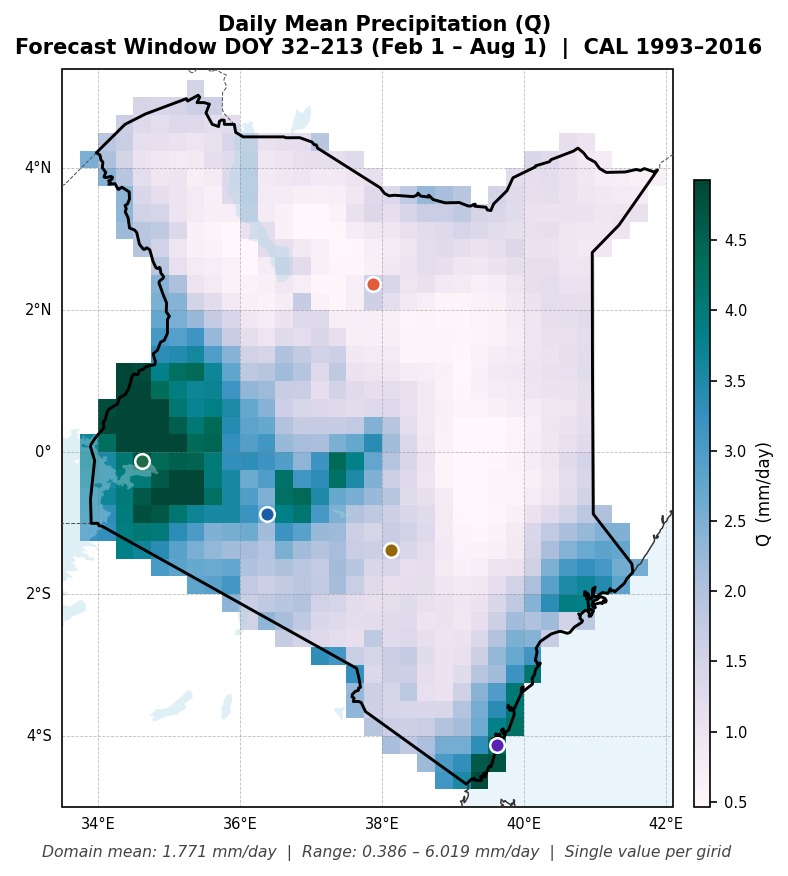

In [150]:
print("\nFig 1: Q_bar spatial map ...")

fig1 = plt.figure(figsize=(7, 6))
ax1 = _map_axes(fig1, [0.08, 0.08, 0.80, 0.82])

im1 = _pcolormesh_map(ax1, Q_bar, "PuBuGn", #  YlOrRd PuBuGn YlGnBu
                       vmin=np.nanpercentile(Q_bar[lm], 2),
                       vmax=np.nanpercentile(Q_bar[lm], 98),
                       target_lat=target_lat, target_lon=target_lon)

# Mark sample sites
for s in SAMPLE_SITES:
    ax1.plot(s["actual_lon"], s["actual_lat"], "o",
             color=s["color"], ms=7, mec="white", mew=1.2,
             transform=ccrs.PlateCarree(), zorder=6)

cb1 = _add_colorbar(fig1, im1, ax1, "Q̄  (mm/day)")

fig1.text(0.50, 0.96,
          f"Daily Mean Precipitation (Q̄) \n"
          f"Forecast Window DOY {WIN_DOY_START}–{WIN_DOY_END} "
          f"(Feb 1 – Aug 1)  |  CAL 1993–2016",
          ha="center", va="top", fontsize=10, fontweight="bold")

fig1.text(0.50, 0.02,
          f"Domain mean: {np.nanmean(Q_bar[lm]):.3f} mm/day  |  "
          f"Range: {np.nanmin(Q_bar[lm]):.3f} – {np.nanmax(Q_bar[lm]):.3f} mm/day  |  "
          "Single value per girid ",
          ha="center", va="bottom", fontsize=7.5, color="#444444", style="italic")

_save(fig1, "fig1_Q_bar_map")
plt.show()

## Curves for Representative Pixels (C_clim)


Fig 2: C_clim curves for representative pixels ...
  Saved → C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage2A_diagnostics\fig2_C_clim_curves.png


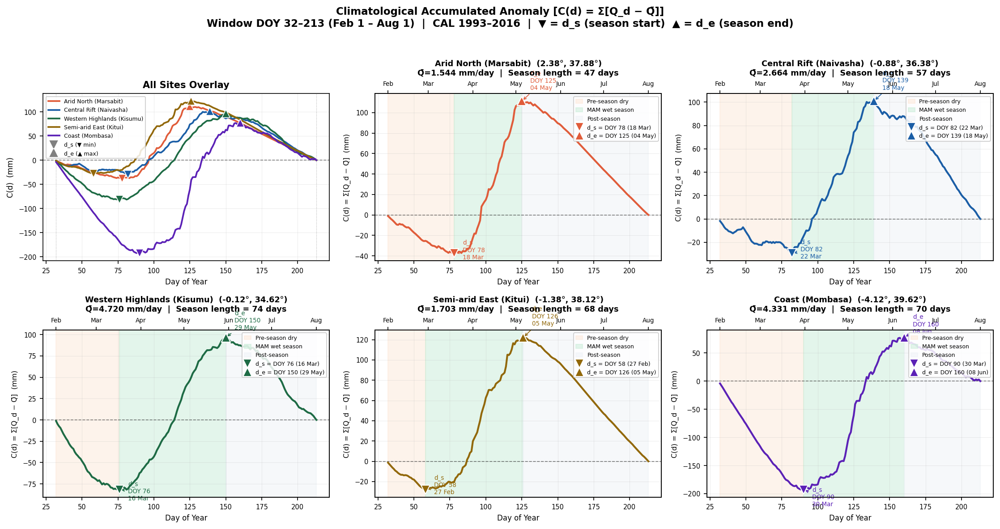

In [151]:
print("\nFig 2: C_clim curves for representative pixels ...")

fig2, axes2 = plt.subplots(2, 3, figsize=(15, 8))
axes2 = axes2.ravel()

# Left panel: overlay all 5 sites on one plot
ax_all = axes2[0]
ax_all.axhline(0, color="black", lw=0.8, ls="--", alpha=0.5)
ax_all.axvline(WIN_DOY_START, color="gray", lw=0.6, ls=":", alpha=0.7)
ax_all.axvline(WIN_DOY_END,   color="gray", lw=0.6, ls=":", alpha=0.7)

for s in SAMPLE_SITES:
    c = C_clim[:, s["i"], s["j"]]
    ax_all.plot(WIN_DOYS, c, color=s["color"], lw=1.8,
                label=s["name"].replace("\n", " "))
    # Mark d_s (minimum)
    ds_k = int(np.nanargmin(c))
    ax_all.plot(WIN_DOYS[ds_k], c[ds_k], "v", color=s["color"],
                ms=9, mec="white", mew=0.8, zorder=5)
    # Mark d_e (maximum after d_s)
    de_k = ds_k + int(np.nanargmax(c[ds_k:]))
    ax_all.plot(WIN_DOYS[de_k], c[de_k], "^", color=s["color"],
                ms=9, mec="white", mew=0.8, zorder=5)

ax_all.set_xlabel("Day of Year", fontsize=8)
ax_all.set_ylabel("C(d)  (mm)", fontsize=8)
ax_all.set_title("All Sites Overlay", fontsize=10)
ax_all.legend(fontsize=6.5, loc="upper left", framealpha=0.85,
              ncol=1, handlelength=1.5)
ax_all.grid(True, lw=0.3, alpha=0.4)
ax_all.tick_params(labelsize=7)

# Add symbolic legend for markers
from matplotlib.lines import Line2D
handles_mk = [
    Line2D([0],[0], marker="v", color="gray", ms=8, ls="none", label="d_s (min of C)"),
    Line2D([0],[0], marker="^", color="gray", ms=8, ls="none", label="d_e (max after d_s)"),
]
ax_all.legend(handles=ax_all.get_legend_handles_labels()[0] + handles_mk,
              labels=ax_all.get_legend_handles_labels()[1] + ["d_s (▼ min)", "d_e (▲ max)"],
              fontsize=6, framealpha=0.85, loc="upper left", ncol=1)

# One panel per site
for idx, s in enumerate(SAMPLE_SITES):
    ax = axes2[idx + 1]
    c  = C_clim[:, s["i"], s["j"]]

    # Background shading: grey before d_s (dry), green after d_s to d_e (wet)
    ds_k = int(np.nanargmin(c))
    de_k = ds_k + int(np.nanargmax(c[ds_k:]))
    ds_doy_plot = WIN_DOYS[ds_k]
    de_doy_plot = WIN_DOYS[de_k]

    ax.axvspan(WIN_DOY_START, ds_doy_plot,
               color="#FDE8D8", alpha=0.50, label="Pre-season dry")
    ax.axvspan(ds_doy_plot, de_doy_plot,
               color="#C8EDD8", alpha=0.50, label="MAM wet season")
    ax.axvspan(de_doy_plot, WIN_DOY_END,
               color="#EEF2F7", alpha=0.50, label="Post-season")

    ax.axhline(0, color="black", lw=0.8, ls="--", alpha=0.5)
    ax.plot(WIN_DOYS, c, color=s["color"], lw=2.0)

    # d_s marker (minimum)
    ax.plot(ds_doy_plot, c[ds_k], "v", color=s["color"],
            ms=10, mec="white", mew=1.0, zorder=5,
            label=f"d_s = DOY {ds_doy_plot} ({_doy_to_date(ds_doy_plot)})")
    ax.annotate(f"d_s\nDOY {ds_doy_plot}\n{_doy_to_date(ds_doy_plot)}",
                xy=(ds_doy_plot, c[ds_k]),
                xytext=(ds_doy_plot + 6, c[ds_k] - abs(c[ds_k]) * 0.15),
                fontsize=6.5, color=s["color"],
                arrowprops=dict(arrowstyle="->", color=s["color"], lw=0.8))

    # d_e marker (maximum)
    ax.plot(de_doy_plot, c[de_k], "^", color=s["color"],
            ms=10, mec="white", mew=1.0, zorder=5,
            label=f"d_e = DOY {de_doy_plot} ({_doy_to_date(de_doy_plot)})")
    ax.annotate(f"d_e\nDOY {de_doy_plot}\n{_doy_to_date(de_doy_plot)}",
                xy=(de_doy_plot, c[de_k]),
                xytext=(de_doy_plot + 6, c[de_k] + abs(c[de_k]) * 0.10),
                fontsize=6.5, color=s["color"],
                arrowprops=dict(arrowstyle="->", color=s["color"], lw=0.8))

    ax.set_xlabel("Day of Year", fontsize=8)
    ax.set_ylabel("C(d) = Σ[Q_d − Q̄]  (mm)", fontsize=7.5)
    ax.set_title(f"{s['name'].replace(chr(10), ' ')}  "
                 f"({s['actual_lat']:.2f}°, {s['actual_lon']:.2f}°)\n"
                 f"Q̄={s['qbar']:.3f} mm/day  |  "
                 f"Season length = {int(de_doy_plot - ds_doy_plot)} days",
                 fontsize=8.5)
    ax.legend(fontsize=6, framealpha=0.85, loc="upper right",
              handlelength=1.2)
    ax.grid(True, lw=0.3, alpha=0.4)
    ax.tick_params(labelsize=7)

    # Add DOY → month tick labels on top axis
    ax2_top = ax.twiny()
    month_labels = [(32, "Feb"), (60, "Mar"), (91, "Apr"),
                    (121, "May"), (152, "Jun"), (182, "Jul"), (213, "Aug")]
    tick_doys  = [d for d, _ in month_labels if WIN_DOY_START <= d <= WIN_DOY_END]
    tick_lbls  = [m for d, m in month_labels if WIN_DOY_START <= d <= WIN_DOY_END]
    ax2_top.set_xlim(ax.get_xlim())
    ax2_top.set_xticks(tick_doys)
    ax2_top.set_xticklabels(tick_lbls, fontsize=6.5)

fig2.suptitle(
    "Climatological Accumulated Anomaly [C(d) = Σ[Q_d − Q̄]]\n"
    f"Window DOY {WIN_DOY_START}–{WIN_DOY_END} (Feb 1 – Aug 1)  |  "
    "CAL 1993–2016  |  ▼ = d_s (season start)  ▲ = d_e (season end)",
    fontsize=11, fontweight="bold", y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])
_save(fig2, "fig2_C_clim_curves")
plt.show()


## MAM Season Start DOY Map (d_s)


Fig 3: d_s (MAM season start DOY) map ...
  Saved → C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage2A_diagnostics\fig3_d_s_season_start.png


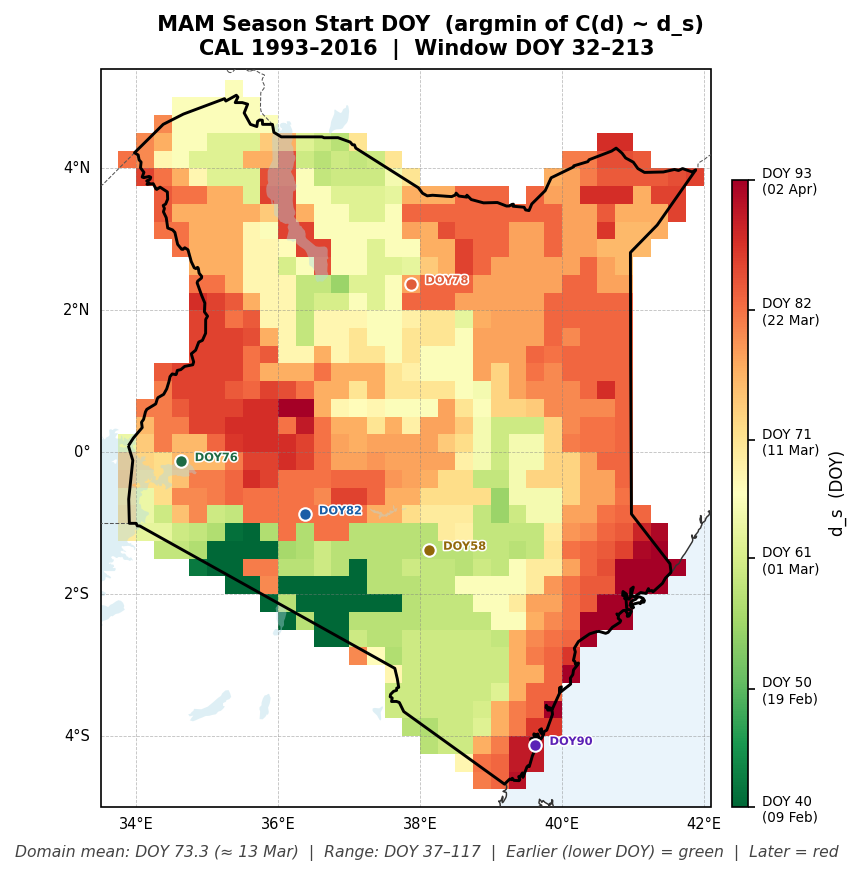

In [152]:
print("\nFig 3: d_s (MAM season start DOY) map ...")

fig3 = plt.figure(figsize=(7, 6))
ax3 = _map_axes(fig3, [0.08, 0.08, 0.80, 0.82])

# DOY range ~ 35–117 → map to Feb–Apr calendar
vmin3 = max(WIN_DOY_START, int(np.nanpercentile(d_s[lm], 2)))
vmax3 = min(WIN_DOY_END,   int(np.nanpercentile(d_s[lm], 98)))

im3 = _pcolormesh_map(ax3, d_s, "RdYlGn_r", vmin3, vmax3, target_lat, target_lon) # cividis, d_s: RdYlGn_r


for s in SAMPLE_SITES:
    ax3.plot(s["actual_lon"], s["actual_lat"], "o",
             color=s["color"], ms=6, mec="white", mew=1.0,
             transform=ccrs.PlateCarree(), zorder=6)
    ax3.text(s["actual_lon"] + 0.2, s["actual_lat"],
             f"DOY{s['ds_doy']:.0f}",
             fontsize=5.5, color=s["color"], transform=ccrs.PlateCarree(),
             zorder=7, fontweight="bold",
             path_effects=[mpe.withStroke(linewidth=1.5, foreground="white")])

cb3 = _add_colorbar(fig3, im3, ax3, "d_s  (DOY)")

# Secondary tick labels showing approximate months
tick_doys_3 = np.linspace(vmin3, vmax3, 6).astype(int)
cb3.set_ticks(tick_doys_3)
cb3.set_ticklabels([f"DOY {d}\n({_doy_to_date(d)})" for d in tick_doys_3],
                   fontsize=6.5)

fig3.text(0.50, 0.96,
          f" MAM Season Start DOY  (argmin of C(d) ~ d_s)\n"
          f"CAL 1993–2016  |  Window DOY {WIN_DOY_START}–{WIN_DOY_END}",
          ha="center", va="top", fontsize=10, fontweight="bold")

fig3.text(0.50, 0.02,
          f"Domain mean: DOY {np.nanmean(d_s[lm]):.1f} "
          f"(≈ {_doy_to_date(np.nanmean(d_s[lm]))})  |  "
          f"Range: DOY {np.nanmin(d_s[lm]):.0f}–{np.nanmax(d_s[lm]):.0f}  |  "
          "Earlier (lower DOY) = green  |  Later = red",
          ha="center", va="bottom", fontsize=7.5, color="#444444", style="italic")

_save(fig3, "fig3_d_s_season_start")
plt.show()

## MAM Season End DOY Map (d_e)


Fig 4: d_e (MAM season end DOY) map ...
  Saved → C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage2A_diagnostics\fig4_d_e_season_end.png


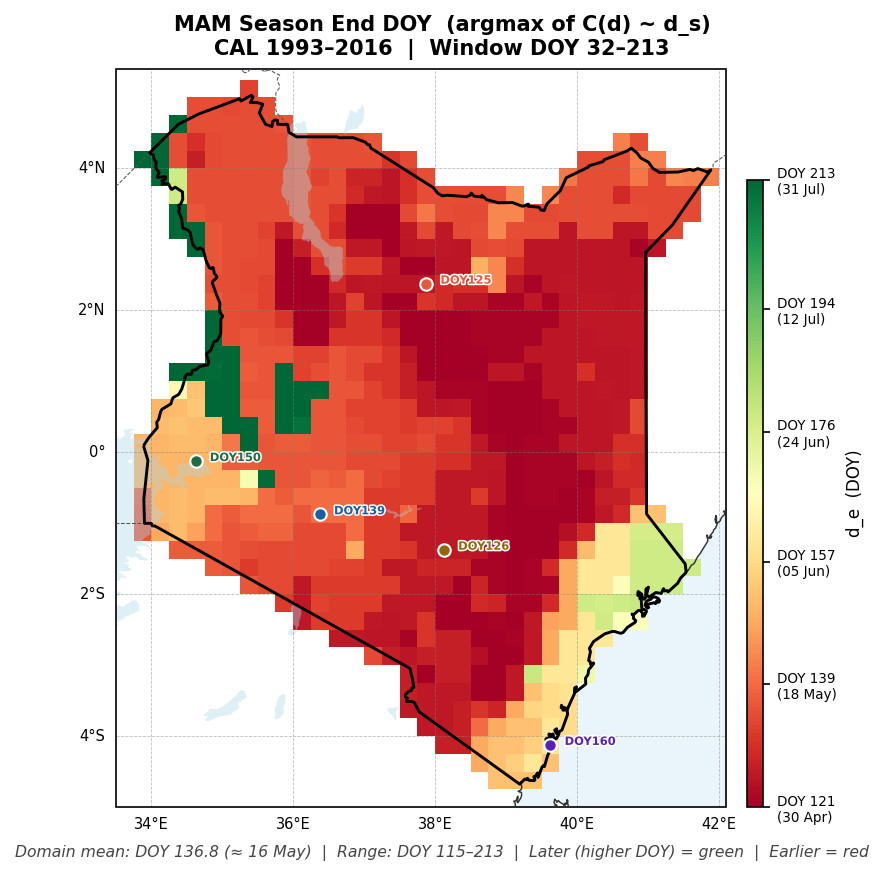

In [153]:
print("\nFig 4: d_e (MAM season end DOY) map ...")

fig4 = plt.figure(figsize=(7, 6))
ax4 = _map_axes(fig4, [0.08, 0.08, 0.80, 0.82])

vmin4 = max(WIN_DOY_START, int(np.nanpercentile(d_e[lm], 2)))
vmax4 = min(WIN_DOY_END,   int(np.nanpercentile(d_e[lm], 98)))

im4 = _pcolormesh_map(ax4, d_e, "RdYlGn", vmin4, vmax4, target_lat, target_lon)

for s in SAMPLE_SITES:
    ax4.plot(s["actual_lon"], s["actual_lat"], "o",
             color=s["color"], ms=6, mec="white", mew=1.0,
             transform=ccrs.PlateCarree(), zorder=6)
    ax4.text(s["actual_lon"] + 0.2, s["actual_lat"],
             f"DOY{s['de_doy']:.0f}",
             fontsize=5.5, color=s["color"], transform=ccrs.PlateCarree(),
             zorder=7, fontweight="bold",
             path_effects=[mpe.withStroke(linewidth=1.5, foreground="white")])

cb4 = _add_colorbar(fig4, im4, ax4, "d_e  (DOY)")
tick_doys_4 = np.linspace(vmin4, vmax4, 6).astype(int)
cb4.set_ticks(tick_doys_4)
cb4.set_ticklabels([f"DOY {d}\n({_doy_to_date(d)})" for d in tick_doys_4],
                   fontsize=6.5)

fig4.text(0.50, 0.96,
          f"MAM Season End DOY  (argmax of C(d) ~ d_s)\n"
          f"CAL 1993–2016  |  Window DOY {WIN_DOY_START}–{WIN_DOY_END}",
          ha="center", va="top", fontsize=10, fontweight="bold")

fig4.text(0.50, 0.02,
          f"Domain mean: DOY {np.nanmean(d_e[lm]):.1f} "
          f"(≈ {_doy_to_date(np.nanmean(d_e[lm]))})  |  "
          f"Range: DOY {np.nanmin(d_e[lm]):.0f}–{np.nanmax(d_e[lm]):.0f}  |  "
          "Later (higher DOY) = green  |  Earlier = red",
          ha="center", va="bottom", fontsize=7.5, color="#444444", style="italic")

_save(fig4, "fig4_d_e_season_end")
plt.show()

## Climatological Season Length Map (d_e − d_s) 


Fig 5: Climatological season length (d_e − d_s) map ...
  Saved → C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage2A_diagnostics\fig5_season_length_clim.png


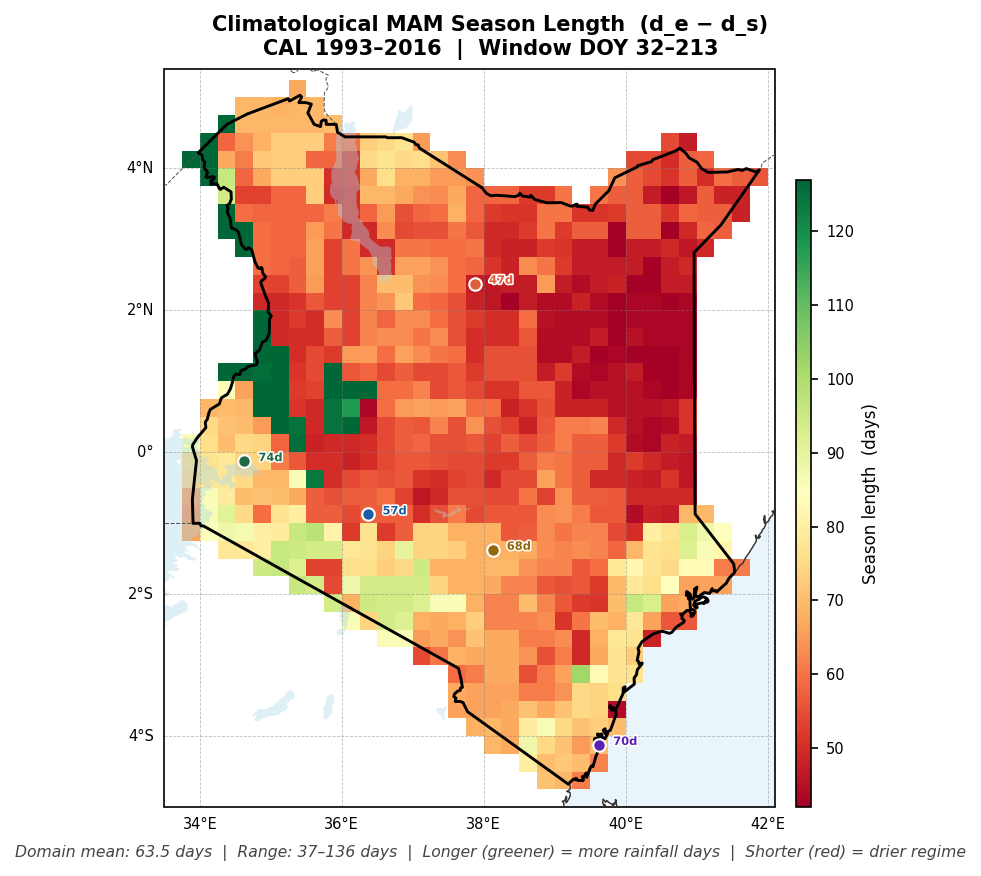

In [154]:
print("\nFig 5: Climatological season length (d_e − d_s) map ...")

season_length = d_e - d_s
season_length[~lm] = np.nan

fig5 = plt.figure(figsize=(7, 6))
ax5 = _map_axes(fig5, [0.08, 0.08, 0.80, 0.82])

vmin5 = max(0,  int(np.nanpercentile(season_length[lm], 2)))
vmax5 = min(182, int(np.nanpercentile(season_length[lm], 98)))

im5 = _pcolormesh_map(ax5, season_length, "RdYlGn",
                       vmin5, vmax5, target_lat, target_lon)

for s in SAMPLE_SITES:
    sl = float(d_e[s["i"], s["j"]]) - float(d_s[s["i"], s["j"]])
    ax5.plot(s["actual_lon"], s["actual_lat"], "o",
             color=s["color"], ms=6, mec="white", mew=1.0,
             transform=ccrs.PlateCarree(), zorder=6)
    ax5.text(s["actual_lon"] + 0.2, s["actual_lat"],
             f"{sl:.0f}d",
             fontsize=5.5, color=s["color"], transform=ccrs.PlateCarree(),
             zorder=7, fontweight="bold",
             path_effects=[mpe.withStroke(linewidth=1.5, foreground="white")])

cb5 = _add_colorbar(fig5, im5, ax5, "Season length  (days)")

fig5.text(0.50, 0.96,
          "Climatological MAM Season Length  (d_e − d_s)\n"
          f"CAL 1993–2016  |  Window DOY {WIN_DOY_START}–{WIN_DOY_END}",
          ha="center", va="top", fontsize=10, fontweight="bold")
fig5.text(0.50, 0.02,
          f"Domain mean: {np.nanmean(season_length[lm]):.1f} days  |  "
          f"Range: {np.nanmin(season_length[lm]):.0f}–{np.nanmax(season_length[lm]):.0f} days  |  "
          "Longer (greener) = more rainfall days  |  Shorter (red) = drier regime",
          ha="center", va="bottom", fontsize=7.5, color="#444444", style="italic")

_save(fig5, "fig5_season_length_clim")
plt.show()

## Multi-Panel Summary: Q_bar | d_s | d_e | Season Length


Fig 6: Multi-panel summary ...
  Saved → C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage2A_diagnostics\fig6_stage2A_summary_4panel.png


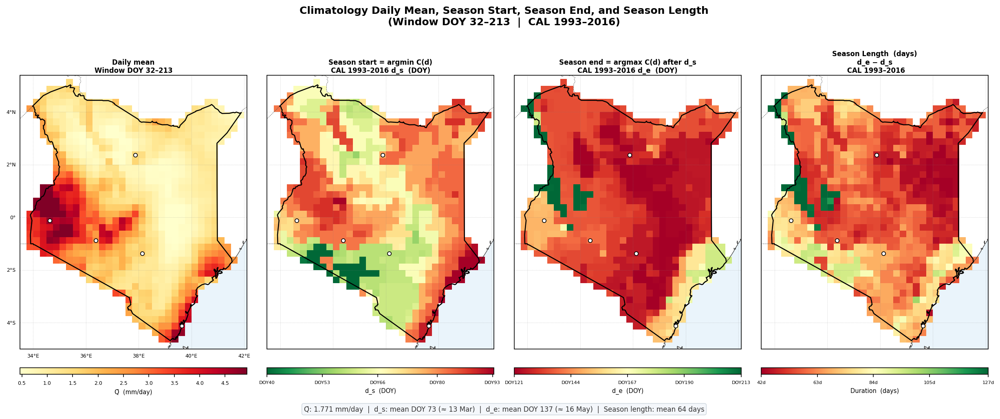

In [155]:
print("\nFig 6: Multi-panel summary ...")

# Tighter canvas and panel packing to reduce excess white space.
fig6 = plt.figure(figsize=(16.5, 7.6))
fig6.patch.set_facecolor("white")

titles6 = [
    f"Daily mean\nWindow DOY {WIN_DOY_START}–{WIN_DOY_END}",
    f"Season start = argmin C(d)\nCAL 1993–2016 d_s  (DOY)",
    f"Season end = argmax C(d) after d_s\nCAL 1993–2016 d_e  (DOY)",
    f"Season Length  (days)\nd_e − d_s\n CAL 1993–2016",
]
arrays6  = [Q_bar, d_s, d_e, season_length]
cmaps6   = ["YlOrRd", "RdYlGn_r", "RdYlGn", "RdYlGn"]
clabels6 = ["Q̄  (mm/day)", "d_s  (DOY)", "d_e  (DOY)", "Duration  (days)"]
vnmins6  = [np.nanpercentile(Q_bar[lm], 2),
            max(WIN_DOY_START, np.nanpercentile(d_s[lm], 2)),
            max(WIN_DOY_START, np.nanpercentile(d_e[lm], 2)),
            max(0, np.nanpercentile(season_length[lm], 2))]
vnmaxs6  = [np.nanpercentile(Q_bar[lm], 98),
            min(WIN_DOY_END, np.nanpercentile(d_s[lm], 98)),
            min(WIN_DOY_END, np.nanpercentile(d_e[lm], 98)),
            min(182, np.nanpercentile(season_length[lm], 98))]

# Reduced inter-panel and outer margins.
left_starts = [0.02, 0.265, 0.51, 0.755]
panel_w     = 0.225
# Height tuned to the Kenya map aspect to avoid large internal white bands.
panel_h     = 0.62
panel_bot   = 0.20

for col, (arr, cmap, clbl, vmin6, vmax6, ttl, lx) in enumerate(
        zip(arrays6, cmaps6, clabels6, vnmins6, vnmaxs6, titles6, left_starts)):

    ax6 = fig6.add_axes([lx, panel_bot, panel_w, panel_h],
                        projection=ccrs.PlateCarree())
    ax6.set_extent([33.5, 42.1, -5.0, 5.4], crs=ccrs.PlateCarree())
    ax6.add_feature(cfeature.OCEAN,     facecolor="#EAF4FB", zorder=0)
    ax6.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor="#333", zorder=3)
    ax6.add_feature(cfeature.BORDERS,   linewidth=0.4, linestyle="--",
                    edgecolor="#555", zorder=3)
    kenya_shp.boundary.plot(ax=ax6, linewidth=1.2, edgecolor="black",
                            transform=ccrs.PlateCarree(), zorder=4)

    gl6 = ax6.gridlines(draw_labels=(col == 0), linewidth=0.3,
                        color="gray", alpha=0.4, linestyle="--")
    gl6.top_labels   = False
    gl6.right_labels = False
    gl6.xlocator     = mticker.FixedLocator([34, 36, 38, 40, 42])
    gl6.ylocator     = mticker.FixedLocator([-4, -2, 0, 2, 4])
    gl6.xlabel_style = {"size": 6}
    gl6.ylabel_style = {"size": 6}

    im6 = _pcolormesh_map(ax6, arr, cmap, vmin6, vmax6, target_lat, target_lon)

    # Sample site markers
    for s in SAMPLE_SITES:
        ax6.plot(s["actual_lon"], s["actual_lat"], "o",
                 color="white", ms=4.5, mec="black", mew=0.8,
                 transform=ccrs.PlateCarree(), zorder=6)

    # Colorbar moved closer to panel to reduce vertical whitespace.
    cax6 = fig6.add_axes([lx, panel_bot - 0.040, panel_w, 0.014])
    cb6  = fig6.colorbar(im6, cax=cax6, orientation="horizontal")
    cb6.set_label(clbl, fontsize=7)
    cb6.ax.tick_params(labelsize=6)

    # DOY labels on colorbar for d_s, d_e, season length panels
    if col in [1, 2]:
        tick_d = np.linspace(vmin6, vmax6, 5).astype(int)
        cb6.set_ticks(tick_d)
        cb6.set_ticklabels([f"DOY{d}" for d in tick_d], fontsize=5.5)
    elif col == 3:
        tick_d = np.linspace(vmin6, vmax6, 5).astype(int)
        cb6.set_ticks(tick_d)
        cb6.set_ticklabels([f"{d}d" for d in tick_d], fontsize=5.5)

    ax6.set_title(ttl, fontsize=8, fontweight="bold", pad=3)

# Suptitle
fig6.text(0.50, 0.955,
          "Climatology Daily Mean, Season Start, Season End, and Season Length\n"
          f"(Window DOY {WIN_DOY_START}–{WIN_DOY_END}  |  CAL 1993–2016)",
          ha="center", va="top", fontsize=12, fontweight="bold")

# Bottom summary stats
fig6.text(0.50, 0.085,
          f"Q̄: {np.nanmean(Q_bar[lm]):.3f} mm/day  |  "
          f"d_s: mean DOY {np.nanmean(d_s[lm]):.0f} "
          f"(≈ {_doy_to_date(np.nanmean(d_s[lm]))})  |  "
          f"d_e: mean DOY {np.nanmean(d_e[lm]):.0f} "
          f"(≈ {_doy_to_date(np.nanmean(d_e[lm]))})  |  "
          f"Season length: mean {np.nanmean(season_length[lm]):.0f} days",
          ha="center", va="center", fontsize=8, color="#333333",
          bbox=dict(boxstyle="round,pad=0.3", facecolor="#F4F7FB",
                    edgecolor="#D1D9E0", linewidth=0.8))

_save(fig6, "fig6_stage2A_summary_4panel")
plt.show()


##  Domain-Wide Distribution (C_clim) & Histogram of across all land Grids (d_s and d_e)


Fig 7: d_s and d_e pixel distribution histograms ...
  Saved → C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage2A_diagnostics\fig7_ds_de_histograms.png


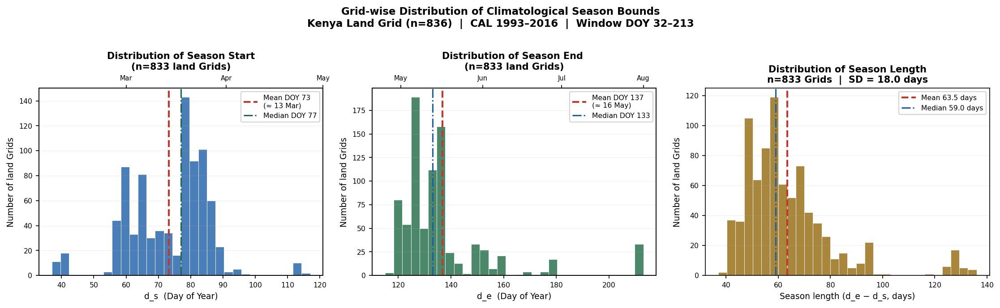

In [156]:
print("\nFig 7: d_s and d_e pixel distribution histograms ...")

fig7, axes7 = plt.subplots(1, 3, figsize=(15, 4.5))

# ── Panel A: d_s histogram ───────────────────────────────────────────────
ax7a = axes7[0]
ds_vals = d_s[lm]
ds_vals = ds_vals[~np.isnan(ds_vals)]
ax7a.hist(ds_vals, bins=30, color="#1B5EA6", alpha=0.80, edgecolor="white", lw=0.5)
ax7a.axvline(np.mean(ds_vals), color="#C0392B", lw=2.0, ls="--",
             label=f"Mean DOY {np.mean(ds_vals):.0f}\n(≈ {_doy_to_date(np.mean(ds_vals))})")
ax7a.axvline(np.median(ds_vals), color="#1E6B45", lw=1.5, ls="-.",
             label=f"Median DOY {np.median(ds_vals):.0f}")
# Add month ticks on top axis
ax7a2 = ax7a.twiny()
month_d = [(32,"Feb"),(60,"Mar"),(91,"Apr"),(121,"May")]
ax7a2.set_xlim(ax7a.get_xlim())
ax7a2.set_xticks([d for d,_ in month_d if ax7a.get_xlim()[0]<=d<=ax7a.get_xlim()[1]])
ax7a2.set_xticklabels([m for d,m in month_d if ax7a.get_xlim()[0]<=d<=ax7a.get_xlim()[1]],
                      fontsize=7)
ax7a.set_xlabel("d_s  (Day of Year)", fontsize=9)
ax7a.set_ylabel("Number of land Grids", fontsize=9)
ax7a.set_title(f"Distribution of Season Start\n(n={len(ds_vals)} land Grids)", fontsize=10)
ax7a.legend(fontsize=7.5, framealpha=0.90)
ax7a.grid(True, lw=0.3, alpha=0.4, axis="y")
ax7a.tick_params(labelsize=7.5)

# ── Panel B: d_e histogram ───────────────────────────────────────────────
ax7b = axes7[1]
de_vals = d_e[lm]
de_vals = de_vals[~np.isnan(de_vals)]
ax7b.hist(de_vals, bins=30, color="#1E6B45", alpha=0.80, edgecolor="white", lw=0.5)
ax7b.axvline(np.mean(de_vals), color="#C0392B", lw=2.0, ls="--",
             label=f"Mean DOY {np.mean(de_vals):.0f}\n(≈ {_doy_to_date(np.mean(de_vals))})")
ax7b.axvline(np.median(de_vals), color="#1B5EA6", lw=1.5, ls="-.",
             label=f"Median DOY {np.median(de_vals):.0f}")
ax7b2 = ax7b.twiny()
month_d2 = [(91,"Apr"),(121,"May"),(152,"Jun"),(182,"Jul"),(213,"Aug")]
ax7b2.set_xlim(ax7b.get_xlim())
ax7b2.set_xticks([d for d,_ in month_d2 if ax7b.get_xlim()[0]<=d<=ax7b.get_xlim()[1]])
ax7b2.set_xticklabels([m for d,m in month_d2 if ax7b.get_xlim()[0]<=d<=ax7b.get_xlim()[1]],
                      fontsize=7)
ax7b.set_xlabel("d_e  (Day of Year)", fontsize=9)
ax7b.set_ylabel("Number of land Grids", fontsize=9)
ax7b.set_title(f"Distribution of Season End \n(n={len(de_vals)} land Grids)", fontsize=10)
ax7b.legend(fontsize=7.5, framealpha=0.90)
ax7b.grid(True, lw=0.3, alpha=0.4, axis="y")
ax7b.tick_params(labelsize=7.5)

# ── Panel C: Season length histogram ─────────────────────────────────────
ax7c = axes7[2]
sl_vals = season_length[lm]
sl_vals = sl_vals[~np.isnan(sl_vals)]
ax7c.hist(sl_vals, bins=30, color="#92680A", alpha=0.80, edgecolor="white", lw=0.5)
ax7c.axvline(np.mean(sl_vals), color="#C0392B", lw=2.0, ls="--",
             label=f"Mean {np.mean(sl_vals):.1f} days")
ax7c.axvline(np.median(sl_vals), color="#1B5EA6", lw=1.5, ls="-.",
             label=f"Median {np.median(sl_vals):.1f} days")
ax7c.set_xlabel("Season length (d_e − d_s, days)", fontsize=9)
ax7c.set_ylabel("Number of land Grids", fontsize=9)
ax7c.set_title(f"Distribution of Season Length\n"
               f"n={len(sl_vals)} Grids  |  "
               f"SD = {np.std(sl_vals):.1f} days", fontsize=10)
ax7c.legend(fontsize=7.5, framealpha=0.90)
ax7c.grid(True, lw=0.3, alpha=0.4, axis="y")
ax7c.tick_params(labelsize=7.5)

fig7.suptitle(
    "Grid-wise Distribution of Climatological Season Bounds\n"
    f"Kenya Land Grid (n={lm.sum()})  |  CAL 1993–2016  |  "
    f"Window DOY {WIN_DOY_START}–{WIN_DOY_END}",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout()
_save(fig7, "fig7_ds_de_histograms")
plt.show()

## SUMMARY PRINT

In [157]:
print("\n" + "="*65)
print("Stage 2A Plots Complete")
print("="*65)
print(f"  Output directory : {DIAG_DIR}")
print()
print(f"  Fig 1 : Q_bar spatial map")
print(f"  Fig 2 : C_clim curves for 5 representative climate zones")
print(f"  Fig 3 : d_s (MAM season start DOY) map")
print(f"  Fig 4 : d_e (MAM season end DOY) map")
print(f"  Fig 5 : Climatological season length (d_e − d_s) map")
print(f"  Fig 6 : 4-panel summary (Q_bar / d_s / d_e / season length)")
print(f"  Fig 7 : d_s, d_e, season length pixel distributions")
print()
print(f"  d_s mean  : DOY {np.nanmean(d_s[lm]):.1f}  (≈ {_doy_to_date(np.nanmean(d_s[lm]))})")
print(f"  d_e mean  : DOY {np.nanmean(d_e[lm]):.1f}  (≈ {_doy_to_date(np.nanmean(d_e[lm]))})")
print(f"  Season LG : {np.nanmean(season_length[lm]):.1f} days mean")
print(f"  Q_bar     : {np.nanmean(Q_bar[lm]):.3f} mm/day domain mean")


Stage 2A Plots Complete
  Output directory : C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage2A_diagnostics

  Fig 1 : Q_bar spatial map
  Fig 2 : C_clim curves for 5 representative climate zones
  Fig 3 : d_s (MAM season start DOY) map
  Fig 4 : d_e (MAM season end DOY) map
  Fig 5 : Climatological season length (d_e − d_s) map
  Fig 6 : 4-panel summary (Q_bar / d_s / d_e / season length)
  Fig 7 : d_s, d_e, season length pixel distributions

  d_s mean  : DOY 73.3  (≈ 13 Mar)
  d_e mean  : DOY 136.8  (≈ 16 May)
  Season LG : 63.5 days mean
  Q_bar     : 1.771 mm/day domain mean


##  STAGE 3A: Onset, Cessation, & LGP DETECTION ON CHIRPS                          

 - A(D) = Σ_{j = d_s−50}^{D} [ R_j − Q_bar ]                            
 - Onset     = day AFTER argmin of A(D)                                  
 - Cessation = day OF   argmax of A(D) after onset                       
 - LGP       = cessation_DOY − onset_DOY  [days]                         
 - No smoothing — raw daily values only.                                  
 - Search window cliped to [WIN_DOY_START, WIN_DOY_END] = [32, 213]

- Starts Dunning-based detection on CHIRPS daily rainfall.

- Defines dunning_detect_one(...), which computes onset/cessation/LGP for one pixel in one year.

- Inside that function:
  
  - Returns all NaN if d_s or d_e is missing.
  - Detects leap year and valid day count (365/366).
  - Adjusts forecast window end for leap years.
  - Builds an accumulation window around climatological season bounds:

     - start = d_s - buffer
     - end = d_e + buffer
     - then clamps to [WIN_DOY_START, WIN_DOY_END(+leap adjustment)].

  - Computes cumulative anomaly series A(D) = sum(R - Q_bar) over that window.

  - If no valid accumulation data, returns NaNs.
  
  - Finds onset as day after the minimum of A(D) (+1 per Dunning rule).
  
  - Finds cessation as maximum of A(D) after onset.
   
  - Computes LGP as cessation - onset.

  - Returns (onset_doy, cess_doy, lgp).

- Allocates 3D output arrays for all years and grid cells:
  - chirps_onset_doy
 
  - chirps_cessation_doy
   
  - chirps_lgp_days

- Gets land pixel indices from lm and loops through:
   
   - each year in chirps_years
   
   - each land pixel (i, j)
   
   - runs dunning_detect_one(...) using pixel rainfall, Q_bar, d_s, d_e
   
   - stores onset/cessation/LGP into output arrays.
- Computes detection rate over calibration years (CAL_YEARS):
  - For each land pixel, counts years where onset is detected (not NaN)
  
  - Divides by number of calibration years.
  
- Builds calibration summaries (domain-wide):

  - mean onset DOY
  - mean cessation DOY
  - mean LGP days
  - count of land pixels with detection rate >= DR_MIN.

- Saves outputs to NetCDF:
  - onset DOY cube (OUT_CHIRPS_ONSET)
  - cessation DOY cube (OUT_CHIRPS_CESS)
  - LGP cube (OUT_CHIRPS_LGP)
  - 2D detection-rate map (OUT_DET_RATE) with metadata (long_name, units, method).

In [158]:
print("\nStage 3A: Dunning detection on CHIRPS daily ...")
  
def dunning_detect_one(precip_year, Q_bar_px, ds_doy, de_doy, year):
    """
    Dunning detection for a single pixel and year.
    Search window = [d_s − buffer, d_e + buffer] clamped to forecast window
    [WIN_DOY_START, WIN_DOY_END] so CHIRPS and SEAS5 operate identically.
 
    Parameters
    ----------
    precip_year : (366,)  daily mm/day; NaN-padded on DOY 366 for non-leap
    Q_bar_px    : float   scalar daily mean over forecast window for this pixel
    ds_doy      : float   MAM season start DOY (from C_clim argmin)
    de_doy      : float   MAM season end   DOY (from C_clim argmax)
    year        : int
 
    Returns (onset_doy, cess_doy, lgp_days) — all int or np.nan
    """
    if np.isnan(ds_doy) or np.isnan(de_doy):
        return np.nan, np.nan, np.nan
 
    is_leap = (year % 4 == 0 and year % 100 != 0) or (year % 400 == 0)
    n_days  = 366 if is_leap else 365
 
    # Adjust WIN_DOY_END for leap year: DOY 213 stays 213 for both
    # (Feb 29 shifts all DOYs after day 59 by +1 in leap years, but
    # since WIN_DOY_START=32 is before Feb 29, the window shifts:
    # non-leap: DOY 32–213 = Feb 1 – Aug 1
    # leap:     DOY 32–214 = Feb 1 – Aug 1  (same calendar dates))
    win_end_yr = WIN_DOY_END + (1 if is_leap else 0)
 
    # Accumulation window: [d_s − buffer, d_e + buffer],
    # hard-clamped to the forecast window for this year
    acc_start = max(WIN_DOY_START,  int(ds_doy) - DUNNING_BUFFER_DAYS)
    acc_end   = min(win_end_yr,     int(de_doy) + DUNNING_BUFFER_DAYS)
 
    win_len = acc_end - acc_start + 1
    if win_len <= 0:
        return np.nan, np.nan, np.nan
 
    # Build A(D) = accumulated [R_j − Q_bar] over the window
    A    = np.full(win_len, np.nan, np.float64)
    doys = np.arange(acc_start, acc_end + 1, dtype=np.int32)
    acc  = 0.0
    for k in range(win_len):
        idx = doys[k] - 1          # 0-based index into precip_year
        if idx >= n_days or np.isnan(precip_year[idx]):
            continue
        acc  += float(precip_year[idx]) - float(Q_bar_px)
        A[k]  = acc
 
    if np.all(np.isnan(A)):
        return np.nan, np.nan, np.nan
 
    # Onset: day AFTER argmin of A(D)
    min_k     = int(np.nanargmin(A))
    onset_doy = int(doys[min_k]) + 1      # +1 is the Dunning definition
 
    if onset_doy > acc_end:
        return np.nan, np.nan, np.nan
 
    # Cessation: argmax of A(D) after onset
    post_start = min_k + 1
    if post_start >= win_len:
        return onset_doy, np.nan, np.nan
 
    A_post = A[post_start:]
    if np.all(np.isnan(A_post)):
        return onset_doy, np.nan, np.nan
 
    max_k    = post_start + int(np.nanargmax(A_post))
    cess_doy = int(doys[max_k])            # day OF maximum (no +1)
 
    lgp = cess_doy - onset_doy
    return onset_doy, cess_doy, lgp
 
 
# Allocate output arrays
chirps_onset_doy     = np.full((len(chirps_years), n_lat, n_lon), np.nan, np.float32)
chirps_cessation_doy = np.full((len(chirps_years), n_lat, n_lon), np.nan, np.float32)
chirps_lgp_days      = np.full((len(chirps_years), n_lat, n_lon), np.nan, np.float32)
 
land_pixels = np.argwhere(lm)
n_land      = len(land_pixels)
 
for yi, year in enumerate(chirps_years):
    if yi % 10 == 0:
        print(f"  {year}  ({yi+1}/{len(chirps_years)}) ...", flush=True)
    for (i, j) in land_pixels:
        pix = da_chirps_daily[yi, :, i, j]
        on, cs, lgp = dunning_detect_one(
            pix, float(Q_bar[i, j]),
            float(d_s[i, j]), float(d_e[i, j]), int(year))
        chirps_onset_doy[yi, i, j]     = on
        chirps_cessation_doy[yi, i, j] = cs
        chirps_lgp_days[yi, i, j]      = lgp
 
# Detection rate over calibration years
cal_mask_c2  = np.isin(chirps_years, CAL_YEARS)
detection_rate = np.full((n_lat, n_lon), np.nan, np.float32)
n_cal_yrs    = int(cal_mask_c2.sum())
for i in range(n_lat):
    for j in range(n_lon):
        if not lm[i, j]: continue
        n_det = int(np.sum(~np.isnan(chirps_onset_doy[cal_mask_c2, i, j])))
        detection_rate[i, j] = n_det / n_cal_yrs
 
# Summary
cal_on  = chirps_onset_doy[cal_mask_c2][~np.isnan(chirps_onset_doy[cal_mask_c2])]
cal_cs  = chirps_cessation_doy[cal_mask_c2][~np.isnan(chirps_cessation_doy[cal_mask_c2])]
cal_lgp = chirps_lgp_days[cal_mask_c2][~np.isnan(chirps_lgp_days[cal_mask_c2])]
 
print(f"\n  CAL 1981–2016 summary (domain means):")
print(f"    Onset     : DOY {np.nanmean(cal_on):.1f}  (≈ {_doy_to_date(np.nanmean(cal_on))})")
print(f"    Cessation : DOY {np.nanmean(cal_cs):.1f}  (≈ {_doy_to_date(np.nanmean(cal_cs))})")
print(f"    LGP       : {np.nanmean(cal_lgp):.1f} days")
print(f"    DR ≥ 0.50 : {np.sum(detection_rate[lm] >= DR_MIN)} / {lm.sum()} land pixels")
 
# Save
coords_yr = {"year": chirps_years, "lat": target_lat, "lon": target_lon}
xr.DataArray(chirps_onset_doy, dims=["year","lat","lon"], coords=coords_yr,
             attrs={"long_name": "CHIRPS onset DOY (Dunning)",
                    "units": "DOY",
                    "method": "day after argmin of A(D)=sum[R-Qbar]"}
             ).to_netcdf(OUT_CHIRPS_ONSET)
xr.DataArray(chirps_cessation_doy, dims=["year","lat","lon"], coords=coords_yr,
             attrs={"long_name": "CHIRPS cessation DOY (Dunning)",
                    "units": "DOY", "method": "argmax of A(D) after onset"}
             ).to_netcdf(OUT_CHIRPS_CESS)
xr.DataArray(chirps_lgp_days, dims=["year","lat","lon"], coords=coords_yr,
             attrs={"long_name": "CHIRPS LGP days (Dunning)",
                    "units": "days", "method": "cessation_DOY - onset_DOY"}
             ).to_netcdf(OUT_CHIRPS_LGP)
xr.DataArray(detection_rate, dims=["lat","lon"],
             coords={"lat": target_lat, "lon": target_lon},
             attrs={"long_name": "Onset detection rate over CAL years",
                    "units": "fraction"}
             ).to_netcdf(OUT_DET_RATE)
 
print(f"\n  Saved: onset, cessation, LGP, detection_rate → {OUT_DIR}")
print("Stage 3A complete ✓")
 


Stage 3A: Dunning detection on CHIRPS daily ...
  1981  (1/45) ...
  1991  (11/45) ...
  2001  (21/45) ...
  2011  (31/45) ...
  2021  (41/45) ...

  CAL 1981–2016 summary (domain means):
    Onset     : DOY 86.7  (≈ 27 Mar)
    Cessation : DOY 132.4  (≈ 11 May)
    LGP       : 45.7 days
    DR ≥ 0.50 : 833 / 836 land pixels

  Saved: onset, cessation, LGP, detection_rate → C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0
Stage 3A complete ✓


## STAGE 3A — DIAGNOSTIC PLOTS

### Detection on CHIRPS Daily: Onset, Cessation, LGP

- Kenya MAM  |  CAL 1981–2016  |  Full period 1981–2025

- Assumes Stage 3A variables are in the notebook namespace:
  
  - chirps_onset_doy, chirps_cessation_doy, chirps_lgp_days  (n_years, n_lat, n_lon)
   
  - detection_rate     (n_lat, n_lon)
   
  - t33_onset, t67_onset, t33_cess, t67_cess, t33_lgp, t67_lgp  (n_lat, n_lon)

  - chirps_years, CAL_YEARS, VAL_YEARS, OP_YEAR
  
  - Q_bar, d_s, d_e, da_chirps_daily, lm, target_lat, target_lon

- Eight figures:
  
   - Fig 1: 4-panel: CAL mean onset / cessation / LGP / detection rate
   
   - Fig 2: Interannual domain-mean time series (1981–2025)
   
   - Fig 3: Variability maps: std dev of onset / cessation / LGP
    
   - Fig 4: Annual anomaly bar charts vs CAL mean

   - Fig 5: Detection rate map
    
   - Fig 6: Grid-wise distribution histograms (CAL + full period)

   - Fig 7: Dominant tercile maps

   - Fig 8: Individual-year A(D) curves for 3 grids x 5 years


In [159]:
# ── Style ─────────────────────────────────────────────────────────────────
plt.rcParams.update({
    "figure.dpi"        : 150,
    "figure.facecolor"  : "white",
    "font.family"       : "DejaVu Sans",
    "font.size"         : 10,
    "axes.titlesize"    : 10,
    "axes.titleweight"  : "bold",
    "axes.labelsize"    : 9,
    "savefig.bbox"      : "tight",
    "savefig.dpi"       : 150,
    "savefig.facecolor" : "white",
})

DIAG_DIR = os.path.join(PLOT_DIR, "stage3A_diagnostics")
os.makedirs(DIAG_DIR, exist_ok=True)

# ── Colours ────────────────────────────────────────────────────────────────
COL_CAL   = "#0B1F3A"
COL_VAL   = "#FF8800"
COL_ONSET = "#1B5EA6"
COL_CESS  = "#5B21B6"
COL_LGP   = "#1E6B45"
COL_POS   = "#C0392B"
COL_NEG   = "#1B5EA6"

# ── Pre-compute CAL stats per pixel ───────────────────────────────────────
cal_mask = np.isin(chirps_years, CAL_YEARS)
val_mask = np.isin(chirps_years, VAL_YEARS)

cal_on_mean  = np.where(lm, np.nanmean(chirps_onset_doy[cal_mask],     axis=0), np.nan)
cal_cs_mean  = np.where(lm, np.nanmean(chirps_cessation_doy[cal_mask], axis=0), np.nan)
cal_lgp_mean = np.where(lm, np.nanmean(chirps_lgp_days[cal_mask],      axis=0), np.nan)
cal_on_std   = np.where(lm, np.nanstd(chirps_onset_doy[cal_mask],     axis=0), np.nan)
cal_cs_std   = np.where(lm, np.nanstd(chirps_cessation_doy[cal_mask], axis=0), np.nan)
cal_lgp_std  = np.where(lm, np.nanstd(chirps_lgp_days[cal_mask],      axis=0), np.nan)

# ── Helpers ────────────────────────────────────────────────────────────────
def _doy_to_date(doy, year=2000):
    try:
        return (datetime.date(year, 1, 1) +
                datetime.timedelta(days=int(round(float(doy))) - 1)
                ).strftime("%d %b")
    except Exception:
        return "?"

def _save(fig, name):
    p = os.path.join(DIAG_DIR, f"{name}.png")
    fig.savefig(p, bbox_inches="tight", dpi=150)
    print(f"  Saved -> {p}")

def _pcm(ax, data2d, cmap, vmin, vmax):
    masked   = np.ma.array(data2d, mask=np.isnan(data2d))
    lon_edge = np.append(target_lon - 0.125, target_lon[-1] + 0.125)
    lat_edge = np.append(target_lat - 0.125, target_lat[-1] + 0.125)
    LON, LAT = np.meshgrid(lon_edge, lat_edge)
    return ax.pcolormesh(LON, LAT, masked, cmap=cmap, vmin=vmin, vmax=vmax,
                         transform=ccrs.PlateCarree(), zorder=1, shading="flat")

def _base_map(ax, labels=True):
    ax.set_extent([33.5, 42.1, -5.0, 5.4], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.OCEAN,     facecolor="#EAF4FB", zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor="#333", zorder=3)
    ax.add_feature(cfeature.BORDERS,   linewidth=0.4, linestyle="--",
                   edgecolor="#555", zorder=3)
    ax.add_feature(cfeature.LAKES,     alpha=0.4, facecolor="#ADD8E6", zorder=2)
    kenya_shp.boundary.plot(ax=ax, linewidth=1.2, edgecolor="black",
                            transform=ccrs.PlateCarree(), zorder=4)
    gl = ax.gridlines(draw_labels=labels, linewidth=0.35,
                      color="gray", alpha=0.45, linestyle="--")
    gl.top_labels   = False
    gl.right_labels = False
    gl.xlocator     = mticker.FixedLocator([34, 36, 38, 40, 42])
    gl.ylocator     = mticker.FixedLocator([-4, -2, 0, 2, 4])
    gl.xlabel_style = {"size": 6}
    gl.ylabel_style = {"size": 6}

def _hcbar(fig, im, ax, label, nticks=5, fmt=None):
    pos = ax.get_position()
    cax = fig.add_axes([pos.x0, pos.y0 - 0.048, pos.width, 0.016])
    cb  = fig.colorbar(im, cax=cax, orientation="horizontal")
    cb.set_label(label, fontsize=7)
    cb.ax.tick_params(labelsize=5.5)
    if fmt:
        tks = np.linspace(cb.vmin, cb.vmax, nticks).astype(int)
        cb.set_ticks(tks)
        cb.set_ticklabels([fmt(t) for t in tks], fontsize=5.5)
    return cb

def _dmean(arr3d):
    """Domain mean over land pixels per year."""
    out = np.full(arr3d.shape[0], np.nan, np.float32)
    for yi in range(arr3d.shape[0]):
        v = arr3d[yi][lm]
        v = v[~np.isnan(v)]
        out[yi] = float(np.nanmean(v)) if len(v) > 0 else np.nan
    return out

# ── Domain-mean time series ────────────────────────────────────────────────
ts_on  = _dmean(chirps_onset_doy)
ts_cs  = _dmean(chirps_cessation_doy)
ts_lgp = _dmean(chirps_lgp_days)

mn_on  = float(np.nanmean(ts_on[cal_mask]))
mn_cs  = float(np.nanmean(ts_cs[cal_mask]))
mn_lgp = float(np.nanmean(ts_lgp[cal_mask]))
sd_on  = float(np.nanstd(ts_on[cal_mask]))
sd_cs  = float(np.nanstd(ts_cs[cal_mask]))
sd_lgp = float(np.nanstd(ts_lgp[cal_mask]))

yrs = chirps_years.astype(float)

# ── Representative pixels ─────────────────────────────────────────────────
SITES = [
    {"name": "Arid North",   "lat":  2.30, "lon": 38.00, "color": "#E05C3A"},
    {"name": "Central Rift", "lat": -0.80, "lon": 36.43, "color": "#1B5EA6"},
    {"name": "W.Highlands",  "lat": -0.10, "lon": 34.75, "color": "#1E6B45"},
    {"name": "Semi-arid E",  "lat": -1.37, "lon": 38.01, "color": "#92680A"},
    {"name": "Coast",        "lat": -4.05, "lon": 39.65, "color": "#5B21B6"},
]
for s in SITES:
    li = np.argwhere(lm)
    la = target_lat[li[:, 0]]; lo = target_lon[li[:, 1]]
    b  = int(np.argmin((la - s["lat"])**2 + (lo - s["lon"])**2))
    s["i"], s["j"] = int(li[b, 0]), int(li[b, 1])

print("Stage 3A diagnostic plots starting ...")
print(f"  Output directory: {DIAG_DIR}")

Stage 3A diagnostic plots starting ...
  Output directory: C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics


## CAL Mean Onset / Cessation / LGP / Detection Rate

  Fig 1: CAL mean spatial maps ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\fig1_cal_mean_4panel.png


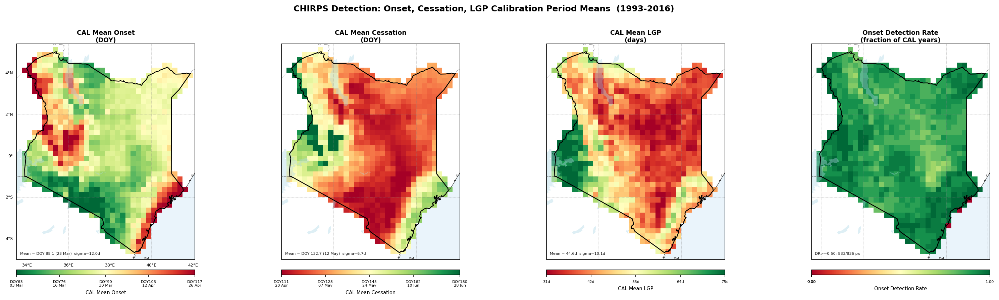

In [160]:
print("  Fig 1: CAL mean spatial maps ...")

fig1, axes1 = plt.subplots(
    1, 4, figsize=(22, 6.5),
    subplot_kw={"projection": ccrs.PlateCarree()})

# Use fixed panel spacing because colorbars are placed manually per-axis.
# Smaller wspace to reduce white gaps between map panels.
fig1.subplots_adjust(left=0.04, right=0.995, top=0.84, bottom=0.18, wspace=0.01)

p1 = [
    (cal_on_mean, "RdYlGn_r",
     int(np.nanpercentile(cal_on_mean[lm], 3)),
     int(np.nanpercentile(cal_on_mean[lm], 97)),
     "CAL Mean Onset\n(DOY)", "DOY",
     f"Mean = DOY {mn_on:.1f} ({_doy_to_date(mn_on)})  sigma={sd_on:.1f}d"),

    (cal_cs_mean, "RdYlGn",
     int(np.nanpercentile(cal_cs_mean[lm], 3)),
     int(np.nanpercentile(cal_cs_mean[lm], 97)),
     "CAL Mean Cessation\n(DOY)", "DOY",
     f"Mean = DOY {mn_cs:.1f} ({_doy_to_date(mn_cs)})  sigma={sd_cs:.1f}d"),

    (cal_lgp_mean, "RdYlGn",
     int(np.nanpercentile(cal_lgp_mean[lm], 3)),
     int(np.nanpercentile(cal_lgp_mean[lm], 97)),
     "CAL Mean LGP\n(days)", "days",
     f"Mean = {mn_lgp:.1f}d  sigma={sd_lgp:.1f}d"),

    (detection_rate, "RdYlGn",
     0.0, 1.0,
     "Onset Detection Rate\n(fraction of CAL years)", "frac",
     f"DR>=0.50: {np.sum(detection_rate[lm]>=DR_MIN)}/{lm.sum()} px"),
]

for ax, (arr, cmap, vmin, vmax, title, unit, stat) in zip(axes1, p1):
    _base_map(ax, labels=(ax is axes1[0]))
    im = _pcm(ax, arr, cmap, float(vmin), float(vmax))

    # Stipple low-DR on the first three panels
    if ax is not axes1[3]:
        low_dr = lm & (detection_rate < DR_MIN)
        if low_dr.any():
            ax.contourf(target_lon, target_lat,
                        np.where(low_dr, 1.0, np.nan),
                        levels=[0.5, 1.5], colors="none",
                        hatches=["////"], transform=ccrs.PlateCarree(),
                        zorder=2, alpha=0.55)

    # DR contour line on the DR panel
    if ax is axes1[3]:
        ax.contour(target_lon, target_lat,
                   np.where(lm, detection_rate, np.nan),
                   levels=[DR_MIN], colors=["black"], linewidths=[1.0],
                   linestyles=["--"], transform=ccrs.PlateCarree(), zorder=5)

    fmt_fn = (lambda d: f"DOY{d}\n{_doy_to_date(d)}") if unit == "DOY" \
        else (lambda d: f"{d}d") if unit == "days" \
        else (lambda v: f"{float(v):.2f}")
    _hcbar(fig1, im, ax, title.split("\n")[0], fmt=fmt_fn)

    ax.set_title(title, fontsize=9, pad=3)
    ax.text(0.02, 0.02, stat, transform=ax.transAxes,
            fontsize=5.5, color="#111", va="bottom",
            bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.80, lw=0))

fig1.suptitle(
    "CHIRPS Detection: Onset, Cessation, LGP Calibration Period Means  (1993-2016)",
    fontsize=12, fontweight="bold", y=0.96)
_save(fig1, "fig1_cal_mean_4panel")
plt.show()

## Interannual Domain Mean Time Series (1981–2025)

  Fig 2: Interannual time series ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\fig2_interannual_timeseries.png


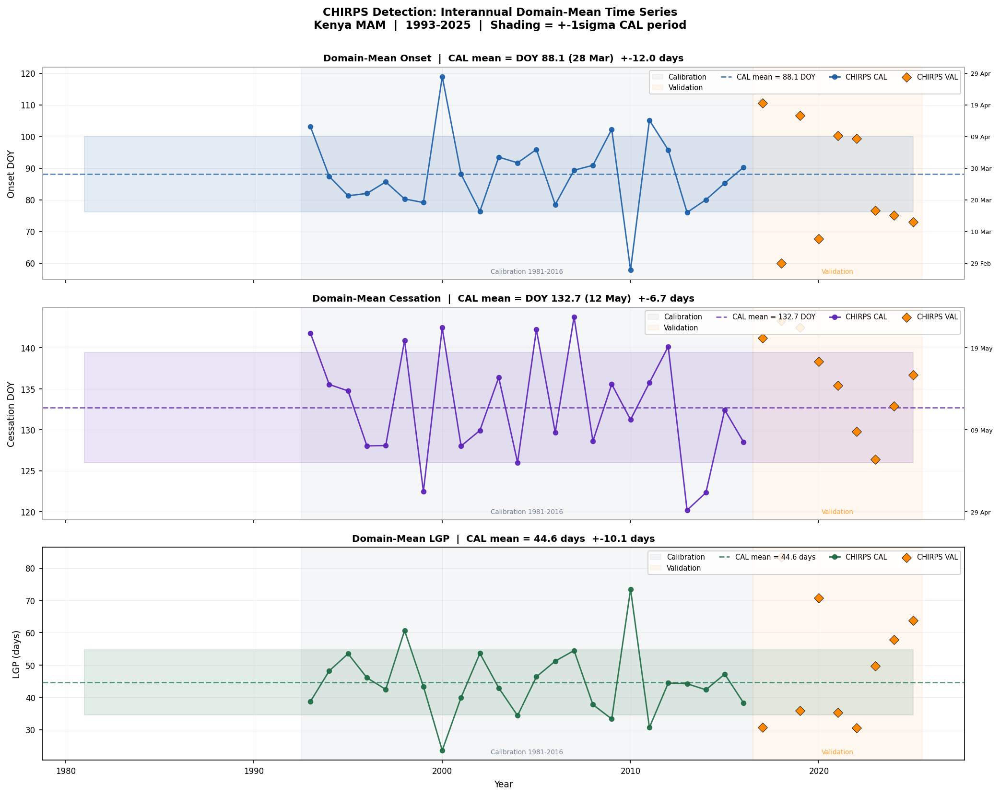

In [161]:
print("  Fig 2: Interannual time series ...")

fig2, axes2 = plt.subplots(3, 1, figsize=(14, 11), sharex=True)

for ax, ts, mn, sd, col, ylabel, title_str, unit in [
    (axes2[0], ts_on,  mn_on,  sd_on,  COL_ONSET,
     "Onset DOY",
     f"Domain-Mean Onset  |  CAL mean = DOY {mn_on:.1f} ({_doy_to_date(mn_on)})"
     f"  +-{sd_on:.1f} days", "DOY"),
    (axes2[1], ts_cs,  mn_cs,  sd_cs,  COL_CESS,
     "Cessation DOY",
     f"Domain-Mean Cessation  |  CAL mean = DOY {mn_cs:.1f} ({_doy_to_date(mn_cs)})"
     f"  +-{sd_cs:.1f} days", "DOY"),
    (axes2[2], ts_lgp, mn_lgp, sd_lgp, COL_LGP,
     "LGP (days)",
     f"Domain-Mean LGP  |  CAL mean = {mn_lgp:.1f} days  +-{sd_lgp:.1f} days", "days"),
]:
    ax.axvspan(CAL_YEARS[0]-0.5, CAL_YEARS[-1]+0.5,
               color=COL_CAL, alpha=0.04, label="Calibration")
    ax.axvspan(VAL_YEARS[0]-0.5, VAL_YEARS[-1]+0.5,
               color=COL_VAL,  alpha=0.06, label="Validation")
    ax.fill_between(yrs, mn-sd, mn+sd, color=col, alpha=0.12, zorder=1)
    ax.axhline(mn, color=col, lw=1.4, ls="--", alpha=0.70,
               label=f"CAL mean = {mn:.1f} {unit}")
    ax.plot(yrs[cal_mask], ts[cal_mask], "o-",
            color=col, ms=4.5, lw=1.4, alpha=0.90, zorder=4,
            label="CHIRPS CAL")
    ax.scatter(yrs[val_mask], ts[val_mask],
               color=COL_VAL, s=45, marker="D", zorder=5,
               edgecolors="#222222", linewidths=0.5, label="CHIRPS VAL")

    ylim = ax.get_ylim()
    yb   = ylim[0] + (ylim[1]-ylim[0]) * 0.03
    ax.text((CAL_YEARS[0]+CAL_YEARS[-1])/2, yb,
            "Calibration 1981-2016", ha="center", fontsize=6.5,
            color=COL_CAL, alpha=0.55)
    ax.text((VAL_YEARS[0]+VAL_YEARS[-1])/2, yb,
            "Validation", ha="center", fontsize=6.5,
            color=COL_VAL, alpha=0.75)

    ax.set_ylabel(ylabel, fontsize=9)
    ax.set_title(title_str, fontsize=9.5)
    ax.grid(True, lw=0.3, alpha=0.35)
    ax.tick_params(labelsize=8)
    ax.legend(fontsize=7, loc="upper right", framealpha=0.88,
              ncol=4, handlelength=1.5)

    if unit == "DOY":
        ax2r = ax.twinx()
        ylim2 = ax.get_ylim()
        td = np.arange(int(ylim2[0])//10*10, int(ylim2[1])//10*10+10, 10)
        td = td[(td >= ylim2[0]) & (td <= ylim2[1])]
        ax2r.set_ylim(ylim2)
        ax2r.set_yticks(td)
        ax2r.set_yticklabels([_doy_to_date(d) for d in td], fontsize=6)
        ax2r.tick_params(axis="y", length=3)
        for sp in ax2r.spines.values():
            sp.set_edgecolor("#CCCCCC")

axes2[2].set_xlabel("Year", fontsize=9)
fig2.suptitle(
    "CHIRPS Detection: Interannual Domain-Mean Time Series\n"
    "Kenya MAM  |  1993-2025  |  Shading = +-1sigma CAL period",
    fontsize=11, fontweight="bold", y=1.002)
plt.tight_layout()
_save(fig2, "fig2_interannual_timeseries")
plt.show()

## Variability Maps: Std Dev of Onset / Cessation / LGP

  Fig 3: Variability (sigma) maps ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\fig3_variability_maps.png


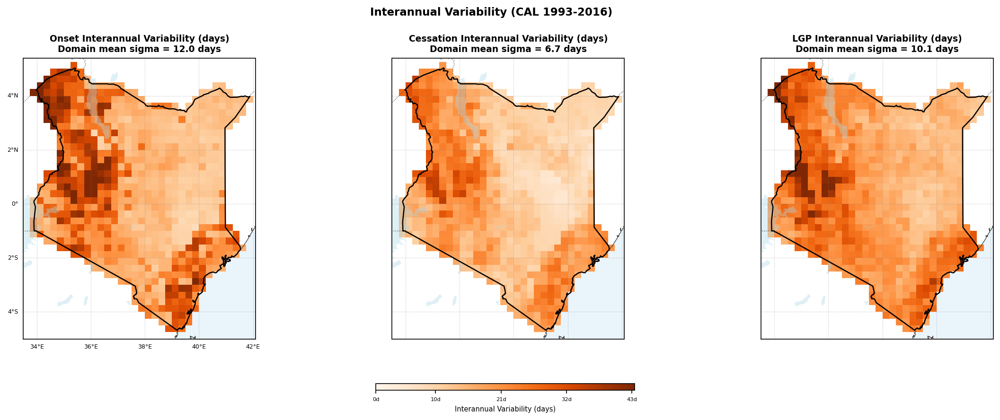

In [162]:
print("  Fig 3: Variability (sigma) maps ...")

fig3, axes3 = plt.subplots(1, 3, figsize=(16, 6),
                            subplot_kw={"projection": ccrs.PlateCarree()})

# Common colour scale for all three panels
vmin3 = 0
vmax3 = max(
    np.nanpercentile(cal_on_std[lm], 97),
    np.nanpercentile(cal_cs_std[lm], 97),
    np.nanpercentile(cal_lgp_std[lm], 97),
)

p3 = [
    (cal_on_std,  "Oranges",
     vmin3, vmax3,
     "Onset Interannual Variability (days)", sd_on),
    (cal_cs_std,  "Oranges",
     vmin3, vmax3,
     "Cessation Interannual Variability (days)", sd_cs),
    (cal_lgp_std, "Oranges",
     vmin3, vmax3,
     "LGP Interannual Variability (days)", sd_lgp),
]

for i, (ax, (arr, cmap, vmin, vmax, title, dmn)) in enumerate(zip(axes3, p3)):
    _base_map(ax, labels=(ax is axes3[0]))
    im = _pcm(ax, arr, cmap, vmin, vmax)
    # Single shared colourbar under the middle panel
    if i == 1:
        _hcbar(fig3, im, ax, "Interannual Variability (days)", fmt=lambda d: f"{d}d")
    ax.set_title(f"{title}\nDomain mean sigma = {dmn:.1f} days", fontsize=9)

fig3.suptitle(
    "Interannual Variability (CAL 1993-2016)", fontsize=11, fontweight="bold", y=0.98)
fig3.subplots_adjust(left=0.04, right=0.99, top=0.86, bottom=0.20, wspace=0.08)
_save(fig3, "fig3_variability_maps")
plt.show()

## Annual Anomaly Bar Charts

  Fig 4: Anomaly time series ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\fig4_anomaly_timeseries.png


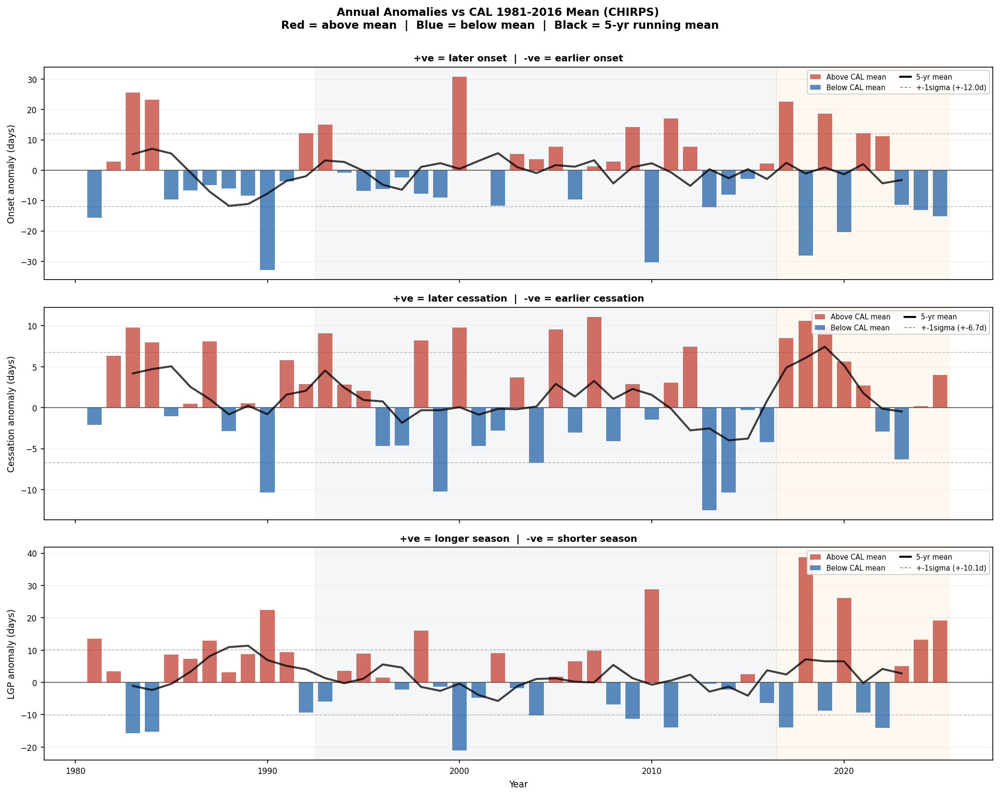

In [163]:
print("  Fig 4: Anomaly time series ...")

anom_on  = ts_on  - mn_on
anom_cs  = ts_cs  - mn_cs
anom_lgp = ts_lgp - mn_lgp

fig4, axes4 = plt.subplots(3, 1, figsize=(14, 11), sharex=True)

for ax, anom, sd, col, ylabel, title_str in [
    (axes4[0], anom_on,  sd_on,  COL_ONSET,
     "Onset anomaly (days)",
     "+ve = later onset  |  -ve = earlier onset"),
    (axes4[1], anom_cs,  sd_cs,  COL_CESS,
     "Cessation anomaly (days)",
     "+ve = later cessation  |  -ve = earlier cessation"),
    (axes4[2], anom_lgp, sd_lgp, COL_LGP,
     "LGP anomaly (days)",
     "+ve = longer season  |  -ve = shorter season"),
]:
    ax.axvspan(CAL_YEARS[0]-0.5, CAL_YEARS[-1]+0.5,
               color=COL_CAL, alpha=0.04)
    ax.axvspan(VAL_YEARS[0]-0.5, VAL_YEARS[-1]+0.5,
               color=COL_VAL, alpha=0.06)
    ax.axhline(0,    color="black",   lw=1.0, ls="-",  alpha=0.55)
    ax.axhline( sd,  color="#888888", lw=0.8, ls="--", alpha=0.55,
                label=f"+1sigma = +{sd:.1f}d")
    ax.axhline(-sd,  color="#888888", lw=0.8, ls="--", alpha=0.55,
                label=f"-1sigma = -{sd:.1f}d")

    colors_bar = [COL_POS if v > 0 else COL_NEG for v in anom]
    ax.bar(yrs, anom, color=colors_bar, alpha=0.72, width=0.75, zorder=3)

    # 5-year running mean
    smooth = np.full_like(anom, np.nan)
    for k in range(2, len(yrs)-2):
        w = anom[max(0,k-2):k+3]
        smooth[k] = np.nanmean(w)
    ax.plot(yrs, smooth, color="black", lw=2.0, ls="-",
            alpha=0.75, label="5-yr running mean", zorder=5)

    ax.set_ylabel(ylabel, fontsize=9)
    ax.set_title(title_str, fontsize=9.5)
    ax.grid(True, lw=0.3, alpha=0.35, axis="y")
    ax.tick_params(labelsize=8)

    handles_leg = [
        mpatches.Patch(facecolor=COL_POS, alpha=0.72, label="Above CAL mean"),
        mpatches.Patch(facecolor=COL_NEG, alpha=0.72, label="Below CAL mean"),
        plt.Line2D([0],[0], color="black", lw=2.0, label="5-yr mean"),
        plt.Line2D([0],[0], color="#888888", lw=0.8, ls="--",
                   label=f"+-1sigma (+-{sd:.1f}d)"),
    ]
    ax.legend(handles=handles_leg, fontsize=7, loc="upper right",
              framealpha=0.88, ncol=2, handlelength=1.5)

axes4[2].set_xlabel("Year", fontsize=9)
fig4.suptitle(
    "Annual Anomalies vs CAL 1981-2016 Mean (CHIRPS) \n"
    "Red = above mean  |  Blue = below mean  |  Black = 5-yr running mean",
    fontsize=11, fontweight="bold", y=1.002)
plt.tight_layout()
_save(fig4, "fig4_anomaly_timeseries")
plt.show()

## Detection Rate Maps

  Fig 5: Onset / Cessation / LGP detection rate maps ...
Detection rate summary over land-mask (CAL 1981–2016):
  Onset    : min = 0.00, max = 1.00, mean = 0.89
  Cessation: min = 0.00, max = 1.00, mean = 0.89
  LGP      : min = 0.00, max = 1.00, mean = 0.89
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\fig5_onset_cess_lgp_detection_rates.png


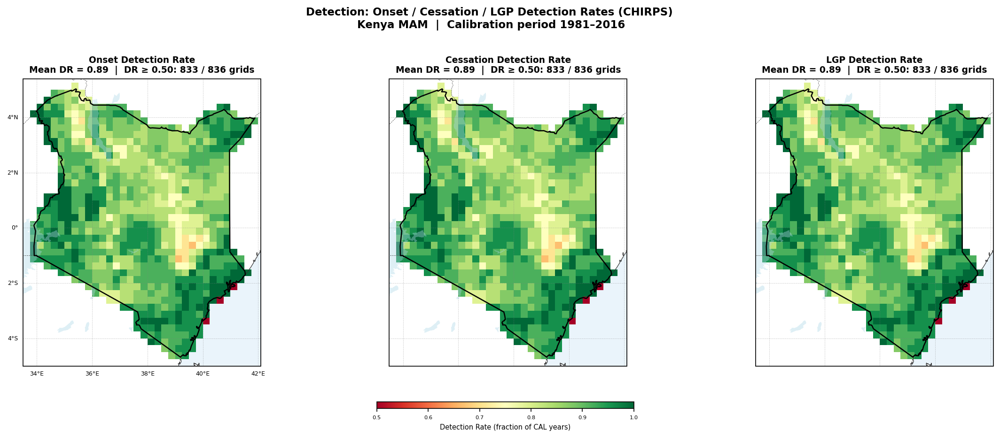

In [164]:
print("  Fig 5: Onset / Cessation / LGP detection rate maps ...")

# Detection rates (fraction of CAL years with a valid event)
on_dr = np.full((n_lat, n_lon), np.nan, np.float32)
for i in range(n_lat):
    for j in range(n_lon):
        if not lm[i, j]:
            continue
        n_det = int(np.sum(~np.isnan(chirps_onset_doy[cal_mask, i, j])))
        on_dr[i, j] = n_det / n_cal_yrs

cess_dr = np.full((n_lat, n_lon), np.nan, np.float32)
for i in range(n_lat):
    for j in range(n_lon):
        if not lm[i, j]:
            continue
        n_det = int(np.sum(~np.isnan(chirps_cessation_doy[cal_mask, i, j])))
        cess_dr[i, j] = n_det / n_cal_yrs

lgp_dr = np.full((n_lat, n_lon), np.nan, np.float32)
for i in range(n_lat):
    for j in range(n_lon):
        if not lm[i, j]:
            continue
        n_det = int(np.sum(~np.isnan(chirps_lgp_days[cal_mask, i, j])))
        lgp_dr[i, j] = n_det / n_cal_yrs

# Quick numeric check so we can compare maps
print("Detection rate summary over land-mask (CAL 1981–2016):")
for name, arr in [("Onset", on_dr), ("Cessation", cess_dr), ("LGP", lgp_dr)]:
    vals = arr[lm]
    print(f"  {name:9s}: min = {np.nanmin(vals):.2f}, max = {np.nanmax(vals):.2f}, mean = {np.nanmean(vals):.2f}")

# To better see differences, focus colour scale on DR_MIN–1
vmin_dr = DR_MIN
vmax_dr = 1.0

fig_dr, axes_dr = plt.subplots(1, 3, figsize=(16, 6),
                                subplot_kw={"projection": ccrs.PlateCarree()})

p_dr = [
    (on_dr,   "Onset Detection Rate"),
    (cess_dr, "Cessation Detection Rate"),
    (lgp_dr,  "LGP Detection Rate"),
]

for k, (ax, (arr, title)) in enumerate(zip(axes_dr, p_dr)):
    _base_map(ax, labels=(ax is axes_dr[0]))
    im = _pcm(ax, arr, "RdYlGn", vmin_dr, vmax_dr)
    # Single shared colourbar under the middle panel
    if k == 1:
        _hcbar(fig_dr, im, ax, "Detection Rate (fraction of CAL years)")
    n_ge = int(np.sum(arr[lm] >= DR_MIN))
    mn   = float(np.nanmean(arr[lm]))
    ax.set_title(
        f"{title}\nMean DR = {mn:.2f}  |  DR ≥ {DR_MIN:.2f}: {n_ge} / {lm.sum()} grids",
        fontsize=9,
    )

fig_dr.suptitle(
    "Detection: Onset / Cessation / LGP Detection Rates (CHIRPS) \n"
    "Kenya MAM  |  Calibration period 1981–2016",
    fontsize=11, fontweight="bold", y=1.03,
),

fig_dr.subplots_adjust(left=0.04, right=0.99, top=0.86, bottom=0.18, wspace=0.08)
_save(fig_dr, "fig5_onset_cess_lgp_detection_rates")
plt.show()

In [165]:
# print("  Fig Xb: Differences in detection rates (Onset vs Cessation / LGP) ...")

# # Difference fields (onset minus others)
# diff_on_cess = on_dr - cess_dr
# diff_on_lgp  = on_dr - lgp_dr

# # Symmetric colour range around zero based on land-mask percentiles
# vals_cess = diff_on_cess[lm]
# vals_lgp  = diff_on_lgp[lm]
# rng = np.nanmax(np.abs([np.nanpercentile(vals_cess, 99),
#                           np.nanpercentile(vals_lgp,  99)]))
# vlim = float(min(rng, 0.20))  # cap at +/-0.20 for readability

# fig_drdiff, axes_drdiff = plt.subplots(1, 2, figsize=(13, 5),
#                                         subplot_kw={"projection": ccrs.PlateCarree()})

# p_drdiff = [
#     (diff_on_cess, "Onset – Cessation"),
#     (diff_on_lgp,  "Onset – LGP"),
# ]

# for k, (ax, (arr, title)) in enumerate(zip(axes_drdiff, p_drdiff)):
#     _base_map(ax, labels=(ax is axes_drdiff[0]))
#     im = _pcm(ax, arr, "RdBu_r", -vlim, vlim)
#     if k == 0:
#         _hcbar(fig_drdiff, im, ax, "Δ Detection Rate (Onset – X)")
#     mx = float(np.nanmax(arr[lm]))
#     mn = float(np.nanmin(arr[lm]))
#     ax.set_title(f"{title}\nmin = {mn:.2f}, max = {mx:.2f}", fontsize=9)
# ,
# fig_drdiff.suptitle(
#     "Differences in Detection Rate: Onset vs Cessation / LGP (CHIRPS)\n"
#     "Kenya MAM  |  Calibration period 1981–2016",
#     fontsize=11, fontweight="bold", y=1.02,
# ),

# fig_drdiff.subplots_adjust(left=0.05, right=0.99, top=0.88, bottom=0.18, wspace=0.08)
# _save(fig_drdiff, "fig_drdiff_onset_vs_cess_lgp")
# plt.show()

## TERCILE BOUNDARY ESTIMATION                          
 - Rank-based equal-frequency splitting over CAL 1981–2016.     
 - All units remain in DOY (onset/cessation) or days (LGP).                                                                                 
 - DIRECTION NOTE FOR ONSET DOY:                                          
      - BN onset = late onset  = HIGH DOY  (bad for farming)                 
      - AN onset = early onset = LOW  DOY  (good for farming)                
      - This is the OPPOSITE of cessation and LGP.  

In [166]:
print("\n Estimating tercile boundaries ...")
 
cal_mask_c3 = np.isin(chirps_years, CAL_YEARS)
 
t33_onset = np.full((n_lat, n_lon), np.nan, np.float32)
t67_onset = np.full((n_lat, n_lon), np.nan, np.float32)
t33_cess  = np.full((n_lat, n_lon), np.nan, np.float32)
t67_cess  = np.full((n_lat, n_lon), np.nan, np.float32)
t33_lgp   = np.full((n_lat, n_lon), np.nan, np.float32)
t67_lgp   = np.full((n_lat, n_lon), np.nan, np.float32)
 
n_fallback = 0
 
for i in range(n_lat):
    for j in range(n_lon):
        if not lm[i, j]:
            continue
        for detected, t33, t67 in [
            (chirps_onset_doy[cal_mask_c3, i, j],     t33_onset, t67_onset),
            (chirps_cessation_doy[cal_mask_c3, i, j], t33_cess,  t67_cess),
            (chirps_lgp_days[cal_mask_c3, i, j],      t33_lgp,   t67_lgp),
        ]:
            valid   = detected[~np.isnan(detected)]
            n_valid = len(valid)
 
            if n_valid < MIN_TERCILE_YEARS:
                n_fallback += 1
                continue    # Domain-median fallback applied below
 
            s = np.sort(valid)
            t33[i, j] = s[int(n_valid / 3)]
            t67[i, j] = s[int(2 * n_valid / 3)]
 
# Domain-median fallback for sparse pixels
for t33, t67 in [(t33_onset, t67_onset), (t33_cess, t67_cess), (t33_lgp, t67_lgp)]:
    nan_pix = lm & np.isnan(t33)
    if nan_pix.any():
        t33[nan_pix] = float(np.nanmedian(t33[lm]))
        t67[nan_pix] = float(np.nanmedian(t67[lm]))
 
print(f"  Onset t33: DOY {np.nanmin(t33_onset[lm]):.0f}–{np.nanmax(t33_onset[lm]):.0f}  "
      f"t67: DOY {np.nanmin(t67_onset[lm]):.0f}–{np.nanmax(t67_onset[lm]):.0f}")
print(f"  Cess  t33: DOY {np.nanmin(t33_cess[lm]):.0f}–{np.nanmax(t33_cess[lm]):.0f}  "
      f"t67: DOY {np.nanmin(t67_cess[lm]):.0f}–{np.nanmax(t67_cess[lm]):.0f}")
print(f"  LGP   t33: {np.nanmin(t33_lgp[lm]):.0f}–{np.nanmax(t33_lgp[lm]):.0f} days  "
      f"t67: {np.nanmin(t67_lgp[lm]):.0f}–{np.nanmax(t67_lgp[lm]):.0f} days")
print(f"  Fallback pixels (< {MIN_TERCILE_YEARS} valid years): {n_fallback}")
 
# Save
coords_2d = {"lat": target_lat, "lon": target_lon}
cal_str   = f"{CAL_YEARS[0]}-{CAL_YEARS[-1]}"
for arr, path, name in [
    (t33_onset, OUT_T33_ONSET, "Onset lower tercile boundary DOY"),
    (t67_onset, OUT_T67_ONSET, "Onset upper tercile boundary DOY"),
    (t33_cess,  OUT_T33_CESS,  "Cessation lower tercile boundary DOY"),
    (t67_cess,  OUT_T67_CESS,  "Cessation upper tercile boundary DOY"),
    (t33_lgp,   OUT_T33_LGP,   "LGP lower tercile boundary days"),
    (t67_lgp,   OUT_T67_LGP,   "LGP upper tercile boundary days"),
]:
    xr.DataArray(arr, dims=["lat","lon"], coords=coords_2d,
                 attrs={"long_name": name,
                        "calibration_period": cal_str,
                        "units": "DOY" if "DOY" in name else "days"}
                 ).to_netcdf(path)
 
print(f"\n  Saved: t33/t67 for onset, cessation, LGP → {CALIB_DIR}")
print("Stage 4A complete ✓")
 
print("\n" + "="*60)
print("STAGES 1A–4A COMPLETE")
print("="*60)
print(f"  da_chirps_daily       : {da_chirps_daily.shape}")
print(f"  Q_bar domain mean     : {np.nanmean(Q_bar[lm]):.4f} mm/day")
print(f"  d_s range             : DOY {int(np.nanmin(d_s[lm]))}–{int(np.nanmax(d_s[lm]))}")
print(f"  d_e range             : DOY {int(np.nanmin(d_e[lm]))}–{int(np.nanmax(d_e[lm]))}")
print(f"  Onset detection rate  : {np.nanmean(detection_rate[lm]):.3f}")
print(f"  CAL mean onset        : DOY {np.nanmean(cal_on):.1f}")
print(f"  CAL mean LGP          : {np.nanmean(cal_lgp):.1f} days")
print("Ready for Stage 1B–3B (MF ingestion + BC)")


 Estimating tercile boundaries ...
  Onset t33: DOY 44–115  t67: DOY 65–192
  Cess  t33: DOY 99–207  t67: DOY 110–213
  LGP   t33: 16–81 days  t67: 32–109 days
  Fallback pixels (< 12 valid years): 9

  Saved: t33/t67 for onset, cessation, LGP → C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\calibration_params
Stage 4A complete ✓

STAGES 1A–4A COMPLETE
  da_chirps_daily       : (45, 366, 42, 34)
  Q_bar domain mean     : 1.7713 mm/day
  d_s range             : DOY 37–117
  d_e range             : DOY 115–213
  Onset detection rate  : 0.891
  CAL mean onset        : DOY 86.7
  CAL mean LGP          : 45.7 days
Ready for Stage 1B–3B (MF ingestion + BC)


## Distribution Histograms Plot (CAL + Full Period)

  Fig 6: Distribution histograms ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\fig6_histograms.png


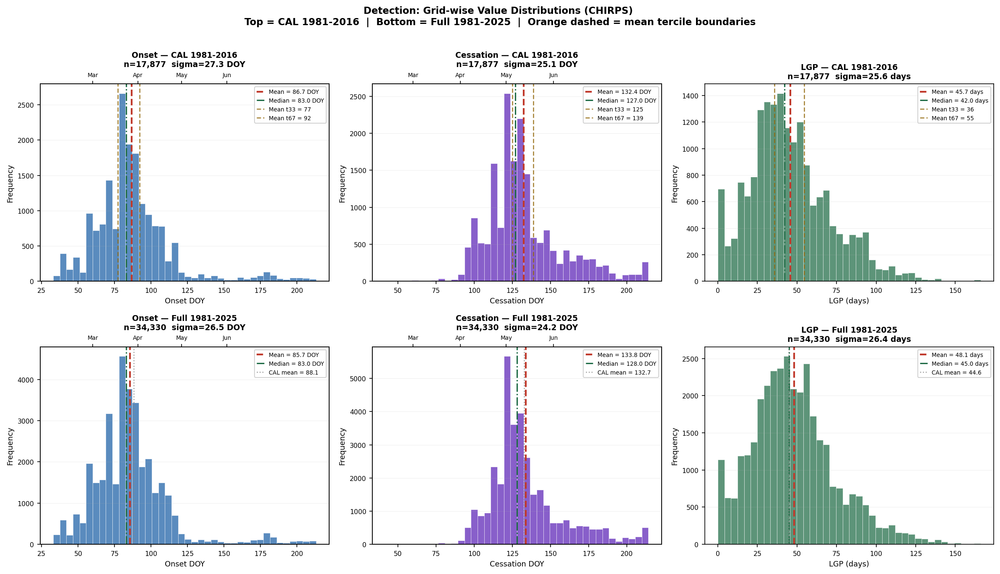

In [167]:
print("  Fig 6: Distribution histograms ...")

fig6, axes6 = plt.subplots(2, 3, figsize=(16, 9))

for row, (pmask, plabel) in enumerate([
    (cal_mask, "CAL 1981-2016"),
    (np.ones(len(chirps_years), bool), "Full 1981-2025"),
]):
    for col, (arr3d, mn_v, t33arr, t67arr, unit, xlabel, title_s, hcol) in enumerate([
        (chirps_onset_doy,     mn_on,  t33_onset, t67_onset, "DOY",
         "Onset DOY",      "Onset",     COL_ONSET),
        (chirps_cessation_doy, mn_cs,  t33_cess,  t67_cess,  "DOY",
         "Cessation DOY",  "Cessation", COL_CESS),
        (chirps_lgp_days,      mn_lgp, t33_lgp,   t67_lgp,   "days",
         "LGP (days)",     "LGP",       COL_LGP),
    ]):
        ax   = axes6[row, col]
        vals = arr3d[pmask][:, lm].ravel()
        vals = vals[~np.isnan(vals)]

        ax.hist(vals, bins=40, color=hcol, alpha=0.72,
                edgecolor="white", linewidth=0.4)
        ax.axvline(np.nanmean(vals), color=COL_POS, lw=2.0, ls="--",
                   label=f"Mean = {np.nanmean(vals):.1f} {unit}")
        ax.axvline(np.nanmedian(vals), color=COL_LGP, lw=1.5, ls="-.",
                   label=f"Median = {np.nanmedian(vals):.1f} {unit}")

        # CAL mean reference on full-period row
        if row == 1:
            ax.axvline(mn_v, color="#888888", lw=1.2, ls=":",
                       alpha=0.80, label=f"CAL mean = {mn_v:.1f}")

        # Tercile boundaries (CAL row only)
        if row == 0:
            ax.axvline(np.nanmean(t33arr[lm]), color="#92680A", lw=1.2,
                       ls=(0,(4,2)), alpha=0.85,
                       label=f"Mean t33 = {np.nanmean(t33arr[lm]):.0f}")
            ax.axvline(np.nanmean(t67arr[lm]), color="#92680A", lw=1.2,
                       ls=(0,(4,2)), alpha=0.85,
                       label=f"Mean t67 = {np.nanmean(t67arr[lm]):.0f}")

        ax.set_xlabel(xlabel, fontsize=8.5)
        ax.set_ylabel("Frequency", fontsize=8.5)
        ax.set_title(f"{title_s} — {plabel}\n"
                     f"n={len(vals):,}  sigma={np.nanstd(vals):.1f} {unit}",
                     fontsize=9)
        ax.legend(fontsize=6.5, framealpha=0.88, loc="upper right",
                  handlelength=1.3)
        ax.grid(True, lw=0.3, alpha=0.35, axis="y")
        ax.tick_params(labelsize=7.5)

        # Month ticks on DOY axes
        if unit == "DOY":
            ax2t = ax.twiny(); ax2t.set_xlim(ax.get_xlim())
            mo = [(60,"Mar"),(91,"Apr"),(121,"May"),(152,"Jun")]
            mo_f = [(d,m) for d,m in mo
                    if ax.get_xlim()[0] <= d <= ax.get_xlim()[1]]
            ax2t.set_xticks([d for d,_ in mo_f])
            ax2t.set_xticklabels([m for _,m in mo_f], fontsize=6.5)

fig6.suptitle(
    "Detection: Grid-wise Value Distributions (CHIRPS) \n"
    "Top = CAL 1981-2016  |  Bottom = Full 1981-2025  |  "
    "Orange dashed = mean tercile boundaries",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout()
_save(fig6, "fig6_histograms")
plt.show()


## Dominant Tercile Maps

  Fig 7: Dominant tercile maps ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\fig7_dominant_tercile_maps.png


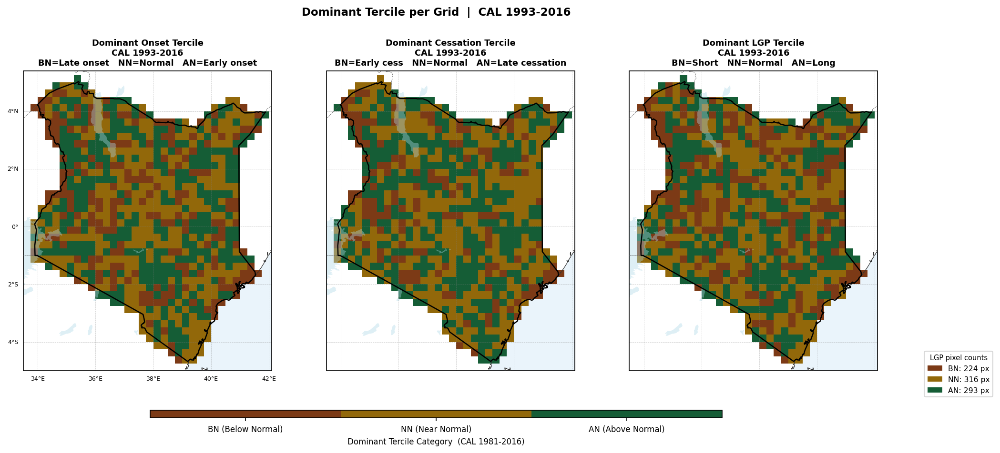

In [168]:
print("  Fig 7: Dominant tercile maps ...")

def _dom_tercile(det_cal, t33, t67):
    n_yr, n_la, n_lo = det_cal.shape
    dom = np.full((n_la, n_lo), np.nan, np.float32)
    for i in range(n_la):
        for j in range(n_lo):
            if not lm[i,j]: continue
            v = det_cal[:, i, j]; v = v[~np.isnan(v)]
            if len(v) == 0: continue
            lo = float(t33[i,j]); hi = float(t67[i,j])
            cats = np.where(v < lo, 0, np.where(v < hi, 1, 2))
            dom[i,j] = float(np.argmax(np.bincount(cats, minlength=3)))
    return dom

dom_on  = _dom_tercile(chirps_onset_doy[cal_mask],     t33_onset, t67_onset)
dom_cs  = _dom_tercile(chirps_cessation_doy[cal_mask], t33_cess,  t67_cess)
dom_lgp = _dom_tercile(chirps_lgp_days[cal_mask],      t33_lgp,   t67_lgp)

TCMAP = mcolors.ListedColormap(["#7C3A16", "#92680A", "#155D36"])
TNORM = mcolors.BoundaryNorm([0, 1, 2, 3], TCMAP.N)

fig7, axes7 = plt.subplots(1, 3, figsize=(16, 6),
                            subplot_kw={"projection": ccrs.PlateCarree()})
p7 = [
    (dom_on,  "Dominant Onset Tercile",
     "BN=Late onset   NN=Normal   AN=Early onset"),
    (dom_cs,  "Dominant Cessation Tercile",
     "BN=Early cess   NN=Normal   AN=Late cessation"),
    (dom_lgp, "Dominant LGP Tercile",
     "BN=Short   NN=Normal   AN=Long"),
]
for ax, (dom, title, sub) in zip(axes7, p7):
    _base_map(ax, labels=(ax is axes7[0]))
    im7 = _pcm(ax, dom, TCMAP, 0, 3)
    ax.set_title(f"{title}\nCAL 1993-2016\n{sub}", fontsize=8.5)

fig7.subplots_adjust(bottom=0.18, wspace=0.08)
cax7 = fig7.add_axes([0.25, 0.07, 0.50, 0.018])
cb7  = fig7.colorbar(im7, cax=cax7, orientation="horizontal", ticks=[0.5, 1.5, 2.5])
cb7.set_ticklabels(["BN (Below Normal)", "NN (Near Normal)", "AN (Above Normal)"],
                   fontsize=8)
cb7.set_label("Dominant Tercile Category  (CAL 1981-2016)", fontsize=8)

# Pixel count legend
tpatch = [
    mpatches.Patch(facecolor="#7C3A16",
                   label=f"BN: {np.sum(dom_lgp[lm]==0):.0f} px"),
    mpatches.Patch(facecolor="#92680A",
                   label=f"NN: {np.sum(dom_lgp[lm]==1):.0f} px"),
    mpatches.Patch(facecolor="#155D36",
                   label=f"AN: {np.sum(dom_lgp[lm]==2):.0f} px"),
]
fig7.legend(handles=tpatch, loc="lower right",
            fontsize=7.5, title="LGP pixel counts",
            title_fontsize=7, bbox_to_anchor=(0.99, 0.11))

fig7.suptitle("Dominant Tercile per Grid  |  CAL 1993-2016",
              fontsize=11, fontweight="bold", y=1.03)
_save(fig7, "fig7_dominant_tercile_maps")
plt.show()


## Individual-Year A(D) Curves (3 pixels x 5 years)

  Fig 8: Individual-year A(D) curves ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\fig8_individual_year_AD_curves.png


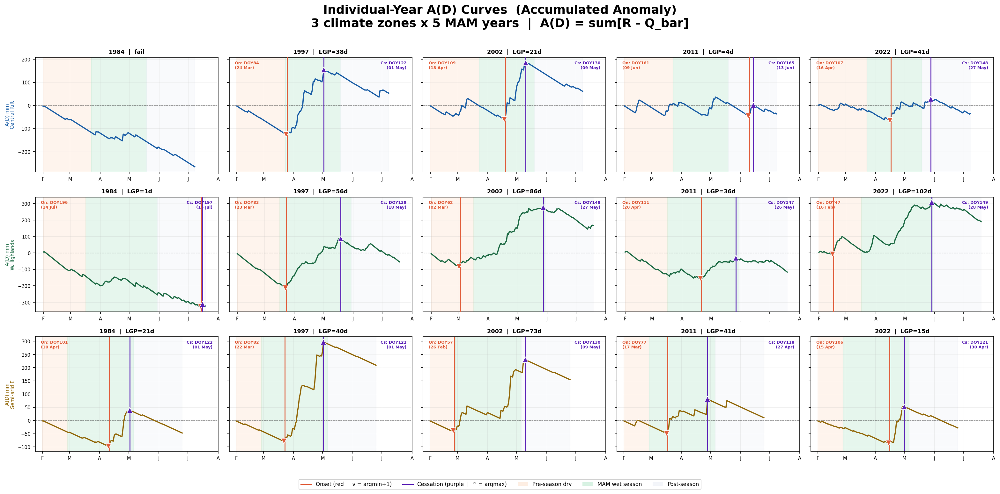

In [169]:
print("  Fig 8: Individual-year A(D) curves ...")

FOCAL_PX = [SITES[1], SITES[2], SITES[3]]   # Central Rift, W.Highlands, Semi-arid E
FOCAL_YRS = [1984, 1997, 2002, 2011, 2022]  # contrasting MAM years

fig8, axes8 = plt.subplots(
    len(FOCAL_PX), len(FOCAL_YRS),
    figsize=(21, 10), sharey="row")

for row, site in enumerate(FOCAL_PX):
    ii, jj   = site["i"], site["j"]
    Q_bar_px = float(Q_bar[ii, jj])
    ds_doy   = float(d_s[ii, jj])
    de_doy   = float(d_e[ii, jj])

    for col, year in enumerate(FOCAL_YRS):
        ax   = axes8[row, col]
        yc   = np.where(chirps_years == year)[0]
        if len(yc) == 0:
            ax.text(0.5, 0.5, "No data", ha="center", va="center",
                    transform=ax.transAxes, fontsize=8, color="gray")
            ax.axis("off"); continue

        yi_c   = int(yc[0])
        precip = da_chirps_daily[yi_c, :, ii, jj]
        is_leap = (year % 4 == 0 and year % 100 != 0) or (year % 400 == 0)
        n_days  = 366 if is_leap else 365
        win_end_yr = WIN_DOY_END + (1 if is_leap else 0)

        acc_start = max(WIN_DOY_START, int(ds_doy) - DUNNING_BUFFER_DAYS)
        acc_end   = min(win_end_yr,    int(de_doy) + DUNNING_BUFFER_DAYS)
        doys_w    = np.arange(acc_start, acc_end + 1, dtype=np.int32)

        A = np.full(len(doys_w), np.nan, np.float64)
        acc = 0.0
        for k, doy in enumerate(doys_w):
            idx = doy - 1
            if idx < n_days and not np.isnan(precip[idx]):
                acc  += float(precip[idx]) - Q_bar_px
                A[k]  = acc

        # Background shading
        ax.axhline(0, color="black", lw=0.7, ls="--", alpha=0.40)
        ax.axvspan(acc_start, int(ds_doy), color="#FDE8D8", alpha=0.45)
        ax.axvspan(int(ds_doy), int(de_doy), color="#C8EDD8", alpha=0.45)
        ax.axvspan(int(de_doy), acc_end, color="#EEF2F7", alpha=0.35)

        ax.plot(doys_w, A, color=site["color"], lw=1.8, zorder=4)

        # Onset/cessation markers
        on_doy = float(chirps_onset_doy[yi_c, ii, jj])
        cs_doy = float(chirps_cessation_doy[yi_c, ii, jj])
        lgp_str = "fail"

        if not np.isnan(on_doy):
            on_k = np.where(doys_w == int(on_doy) - 1)[0]
            if len(on_k):
                ax.axvline(int(on_doy), color="#E05C3A", lw=1.4, zorder=5)
                ax.plot(doys_w[on_k[0]], A[on_k[0]], "v",
                        color="#E05C3A", ms=9, mec="white", mew=0.8, zorder=6)
            ax.text(0.03, 0.97,
                    f"On: DOY{int(on_doy)}\n({_doy_to_date(int(on_doy))})",
                    transform=ax.transAxes, fontsize=6, va="top",
                    color="#E05C3A", fontweight="bold")

        if not np.isnan(cs_doy):
            cs_k = np.where(doys_w == int(cs_doy))[0]
            if len(cs_k):
                ax.axvline(int(cs_doy), color="#5B21B6", lw=1.4, zorder=5)
                ax.plot(doys_w[cs_k[0]], A[cs_k[0]], "^",
                        color="#5B21B6", ms=9, mec="white", mew=0.8, zorder=6)
            ax.text(0.97, 0.97,
                    f"Cs: DOY{int(cs_doy)}\n({_doy_to_date(int(cs_doy))})",
                    transform=ax.transAxes, fontsize=6, va="top",
                    ha="right", color="#5B21B6", fontweight="bold")
            if not np.isnan(on_doy):
                lgp_str = f"LGP={int(cs_doy-on_doy)}d"

        # Month ticks
        ax.set_xticks([32, 60, 91, 121, 152, 182, 213])
        ax.set_xticklabels(["F","M","A","M","J","J","A"], fontsize=6.5)
        ax.tick_params(labelsize=7)
        ax.grid(True, lw=0.3, alpha=0.30)
        ax.set_title(f"{year}  |  {lgp_str}", fontsize=8.5)

        if col == 0:
            ax.set_ylabel(f"A(D) mm\n{site['name']}", fontsize=7.5,
                          color=site["color"])

# Shared legend
leg_handles = [
    plt.Line2D([0],[0], color="#E05C3A", lw=1.5,
               label="Onset (red  |  v = argmin+1)"),
    plt.Line2D([0],[0], color="#5B21B6", lw=1.5,
               label="Cessation (purple  |  ^ = argmax)"),
    mpatches.Patch(facecolor="#FDE8D8", alpha=0.7, label="Pre-season dry"),
    mpatches.Patch(facecolor="#C8EDD8", alpha=0.7, label="MAM wet season"),
    mpatches.Patch(facecolor="#EEF2F7", alpha=0.7, label="Post-season"),
]
fig8.legend(handles=leg_handles, loc="lower center",
            ncol=5, fontsize=8, framealpha=0.90,
            bbox_to_anchor=(0.50, -0.01))

fig8.suptitle(
    "Individual-Year A(D) Curves  (Accumulated Anomaly)\n"
    "3 climate zones x 5 MAM years  |  "
    "A(D) = sum[R - Q_bar]",
    fontsize=18, fontweight="bold", y=1.01)
plt.tight_layout(rect=[0, 0.04, 1, 1])
_save(fig8, "fig8_individual_year_AD_curves")
plt.show()


## SUMMARY

In [170]:

print("\n" + "="*65)
print("Stage 3A Diagnostic Plots Complete")
print("="*65)
print(f"  Output : {DIAG_DIR}")
print()
print(f"  Fig 1 : CAL mean spatial maps  (onset / cessation / LGP / det.rate)")
print(f"  Fig 2 : Interannual time series 1981-2025")
print(f"  Fig 3 : Variability (sigma) maps")
print(f"  Fig 4 : Annual anomaly bar charts + 5-yr running mean")
print(f"  Fig 5 : Detection rate map with DR<0.50 stipple")
print(f"  Fig 6 : Pixel-wise distributions (CAL + full period)")
print(f"  Fig 7 : Dominant tercile maps")
print(f"  Fig 8 : Individual-year A(D) curves  (3 grids x 5 years)")
print()
print(f"  CAL mean onset     : DOY {mn_on:.1f}  ({_doy_to_date(mn_on)})  sigma={sd_on:.1f}d")
print(f"  CAL mean cessation : DOY {mn_cs:.1f}  ({_doy_to_date(mn_cs)})  sigma={sd_cs:.1f}d")
print(f"  CAL mean LGP       : {mn_lgp:.1f} days  sigma={sd_lgp:.1f}d")
print(f"  Det. rate >=0.50   : {np.sum(detection_rate[lm]>=DR_MIN)} / {lm.sum()} pixels")


Stage 3A Diagnostic Plots Complete
  Output : C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics

  Fig 1 : CAL mean spatial maps  (onset / cessation / LGP / det.rate)
  Fig 2 : Interannual time series 1981-2025
  Fig 3 : Variability (sigma) maps
  Fig 4 : Annual anomaly bar charts + 5-yr running mean
  Fig 5 : Detection rate map with DR<0.50 stipple
  Fig 6 : Pixel-wise distributions (CAL + full period)
  Fig 7 : Dominant tercile maps
  Fig 8 : Individual-year A(D) curves  (3 grids x 5 years)

  CAL mean onset     : DOY 88.1  (28 Mar)  sigma=12.0d
  CAL mean cessation : DOY 132.7  (12 May)  sigma=6.7d
  CAL mean LGP       : 44.6 days  sigma=10.1d
  Det. rate >=0.50   : 833 / 836 pixels


## Climatological Wet Season Diagnostic Plot  

- Liebmann et al. 2012 & Dunning 2016 style
- For each SAMPLE_SITE, one panel showing:
   - Q_d (Red) : climatological daily mean rainfall (mm/day)
   - Q_d − Q̄ (lue): daily anomaly vs scalar window mean
   - C(d) (Green): cumulative anomaly (Dunning accumulated anomaly)
   - d_s and d_e (Magenta)(climatological water season)
   - Restricted to 32–213 DOY (Feb 1 – Aug 1) window
   - CAL: 1981–2016  
   - VAL: 2017–2025

In [171]:
plt.rcParams.update({
    "figure.dpi"        : 150,
    "figure.facecolor"  : "white",
    "font.family"       : "DejaVu Sans",
    "font.size"         : 10,
    "axes.titlesize"    : 10,
    "axes.titleweight"  : "bold",
    "axes.labelsize"    : 9,
    "savefig.bbox"      : "tight",
    "savefig.dpi"       : 150,
    "savefig.facecolor" : "white",
})

DIAG_DIR = os.path.join(PLOT_DIR, "stage3A_diagnostics")
os.makedirs(DIAG_DIR, exist_ok=True)

def _doy_to_date(doy, year=2000):
    try:
        return (datetime.date(year, 1, 1) +
                datetime.timedelta(days=int(round(float(doy))) - 1)
                ).strftime("%d %b")
    except Exception:
        return "?"

def _save(fig, name):
    p = os.path.join(DIAG_DIR, f"{name}.png")
    fig.savefig(p, bbox_inches="tight", dpi=150)
    print(f"  Saved -> {p}")

# ── Window DOY array — the ONLY x-axis used everywhere ────────────────────
WIN_DOYS = np.arange(WIN_DOY_START, WIN_DOY_END + 1, dtype=np.int32)
n_win    = len(WIN_DOYS)   # 182

# Month tick positions and labels within the window
MONTH_TICKS  = [d for d in [32, 60, 91, 121, 152, 182, 213]
                if WIN_DOY_START <= d <= WIN_DOY_END]
MONTH_LABELS = ["Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug"]
MONTH_LABELS = MONTH_LABELS[:len(MONTH_TICKS)]

# ── Calibration / validation masks ────────────────────────────────────────
cal_mask = np.isin(chirps_years, CAL_YEARS)
val_mask = np.isin(chirps_years, VAL_YEARS)

# ── SAMPLE_SITES ──────────────────────────────────────────────────────────
SAMPLE_SITES = [
    {"name": "Arid North\n(Marsabit)",    "lat":  2.30, "lon": 38.00},
    {"name": "Central Rift\n(Naivasha)",  "lat": -0.80, "lon": 36.43},
    {"name": "W. Highlands\n(Kisumu)",    "lat": -0.10, "lon": 34.75},
    {"name": "Semi-arid East\n(Kitui)",   "lat": -1.37, "lon": 38.01},
    {"name": "Coast\n(Mombasa)",          "lat": -4.05, "lon": 39.65},
]
for s in SAMPLE_SITES:
    li = np.argwhere(lm)
    la = target_lat[li[:, 0]]; lo = target_lon[li[:, 1]]
    b  = int(np.argmin((la - s["lat"])**2 + (lo - s["lon"])**2))
    s["i"], s["j"] = int(li[b, 0]), int(li[b, 1])


# =============================================================================
# HELPER: compute curves WITHIN the window only
# =============================================================================
def _clim_curves_window(year_mask, pixel_i, pixel_j, Q_bar_ref=None):
    """
    Compute Q_d, Q̄, anomaly, and C(d) restricted to DOY WIN_DOY_START–WIN_DOY_END.

    Parameters
    ----------
    year_mask  : boolean array over chirps_years
    pixel_i/j  : grid indices
    Q_bar_ref  : if provided, use this scalar as Q̄ instead of computing from data.
                 Used so that VAL curves share the CAL Q̄ baseline.

    Returns
    -------
    Q_d    : (n_win,)  climatological daily mean over selected years [mm/day]
    Q_bar  : float     scalar mean of Q_d over window
    anom   : (n_win,)  Q_d − Q_bar  [mm/day]
    C      : (n_win,)  cumulative sum of anom starting at WIN_DOYS[0]
    ds_doy : int       DOY of C minimum  (season start d_s)
    de_doy : int       DOY of C maximum after ds  (season end d_e)
    ds_k   : int       window index of ds_doy
    de_k   : int       window index of de_doy
    """
    sel_data = da_chirps_daily[year_mask, :, pixel_i, pixel_j]
    sel_yrs  = chirps_years[year_mask]

    # Q_d: mean daily precip for each window DOY across selected years
    Q_d = np.full(n_win, np.nan, np.float64)
    for k, doy in enumerate(WIN_DOYS):
        d_idx = doy - 1
        stack = []
        for ci, yr in enumerate(sel_yrs):
            is_lp   = (yr % 4 == 0 and yr % 100 != 0) or (yr % 400 == 0)
            max_doy = 366 if is_lp else 365
            if d_idx >= max_doy:
                continue
            v = sel_data[ci, d_idx]
            if not np.isnan(v):
                stack.append(float(v))
        Q_d[k] = float(np.nanmean(stack)) if stack else np.nan

    # Q̄: scalar window mean (Dunning baseline)
    Q_bar = float(np.nanmean(Q_d)) if Q_bar_ref is None else float(Q_bar_ref)

    # Daily anomaly
    anom = Q_d - Q_bar

    # C(d): cumulative anomaly — index 0 corresponds to WIN_DOY_START
    C   = np.full(n_win, np.nan, np.float64)
    acc = 0.0
    for k in range(n_win):
        if not np.isnan(anom[k]):
            acc   += anom[k]
            C[k]   = acc
        else:
            C[k] = C[k-1] if k > 0 else 0.0

    # Season bounds from C(d)
    ds_k   = int(np.nanargmin(C))
    ds_doy = int(WIN_DOYS[ds_k])
    de_k   = ds_k + int(np.nanargmax(C[ds_k:]))
    de_doy = int(WIN_DOYS[de_k])

    return Q_d, Q_bar, anom, C, ds_doy, de_doy, ds_k, de_k


# ── Pre-compute for all sites ─────────────────────────────────────────────
print("Computing window-restricted climatological curves ...")
for s in SAMPLE_SITES:
    ii, jj = s["i"], s["j"]

    # CAL: compute Q̄ from CAL data
    (s["Qd_cal"], s["Qbar_cal"], s["anom_cal"], s["C_cal"],
     s["ds_cal"], s["de_cal"], s["ds_k_cal"], s["de_k_cal"]
     ) = _clim_curves_window(cal_mask, ii, jj, Q_bar_ref=None)

    # VAL: use CAL Q̄ as baseline so curves are comparable
    (s["Qd_val"], _,            s["anom_val"], s["C_val"],
     s["ds_val"], s["de_val"], s["ds_k_val"], s["de_k_val"]
     ) = _clim_curves_window(val_mask, ii, jj, Q_bar_ref=s["Qbar_cal"])

    nc = s["name"].replace("\n", " ")
    print(f"  {nc:<28}: "
          f"CAL d_s=DOY{s['ds_cal']}({_doy_to_date(s['ds_cal'])}) "
          f"d_e=DOY{s['de_cal']}({_doy_to_date(s['de_cal'])}) "
          f"len={s['de_cal']-s['ds_cal']}d  |  "
          f"VAL d_s=DOY{s['ds_val']}({_doy_to_date(s['ds_val'])}) "
          f"d_e=DOY{s['de_val']}({_doy_to_date(s['de_val'])}) "
          f"len={s['de_val']-s['ds_val']}d")


# =============================================================================
# PLOT HELPER — draw one figure for a single period (CAL or VAL)
# =============================================================================

def _draw_period_figure(period, Qd_key, anom_key, C_key,
                         ds_key, de_key, dsk_key, dek_key,
                         period_label, period_years_str,
                         fig_fname):
    """
    Draw the 5-site climatological water season figure for one period.

    Parameters
    ----------
    period        : "cal" or "val"
    Qd_key        : site dict key for Q_d array  e.g. "Qd_cal"
    anom_key      : site dict key for anomaly array
    C_key         : site dict key for C(d) array
    ds_key        : site dict key for d_s DOY  (int)
    de_key        : site dict key for d_e DOY  (int)
    dsk_key       : site dict key for d_s window index
    dek_key       : site dict key for d_e window index
    period_label  : string shown in titles  e.g. "Calibration  1981–2016"
    period_years_str : compact string for titles
    fig_fname     : output filename stem (no extension)
    """
    n_sites = len(SAMPLE_SITES)
    fig, axes = plt.subplots(n_sites, 1, figsize=(16, 4.8 * n_sites),
                              sharex=True)
    if n_sites == 1:
        axes = [axes]

    is_val = (period == "val")

    for row, (ax_l, s) in enumerate(zip(axes, SAMPLE_SITES)):
        ax_r       = ax_l.twinx()
        name_clean = s["name"].replace("\n", " ")

        Qd   = s[Qd_key]
        anom = s[anom_key]
        C    = s[C_key]
        ds   = s[ds_key]
        de   = s[de_key]
        ds_k = s[dsk_key]
        de_k = s[dek_key]
        # Q̄ is always the CAL scalar — the Dunning pipeline baseline
        Q_bar_px = s["Qbar_cal"]

        # ── Zero + Q̄ references ─────────────────────────────────────────
        ax_l.axhline(0, color="black",   lw=0.6, ls="--", alpha=0.35, zorder=1)
        ax_r.axhline(0, color="#1E6B45", lw=0.6, ls="--", alpha=0.25, zorder=1)
        ax_l.axhline(Q_bar_px, color="#C0392B", lw=0.9, ls=(0,(6,3)),
                     alpha=0.60, zorder=2,
                     label=f"Q̄ = {Q_bar_px:.3f} mm/day  (CAL window mean)")

        # ── Three curves ─────────────────────────────────────────────────
        ax_l.plot(WIN_DOYS, Qd,
                  color="#C0392B", lw=2.0, alpha=0.90, zorder=4,
                  label=f"Q_d  ({period_years_str})  — daily mean rainfall")

        ax_l.plot(WIN_DOYS, anom,
                  color="#1B5EA6", lw=1.8, alpha=0.85, zorder=3,
                  label=f"Q_d − Q̄  ({period_years_str})  — daily anomaly")

        ax_r.plot(WIN_DOYS, C,
                  color="#1E6B45", lw=2.2, alpha=0.92, zorder=4,
                  label=f"C(d)  ({period_years_str})  — cumulative anomaly")

        # ── Magenta dots: d_s and d_e ─────────────────────────────────────
        C_ds = float(C[ds_k])
        C_de = float(C[de_k])

        ax_r.plot(ds, C_ds, "o",
                  color="magenta", ms=13, mec="white", mew=1.5, zorder=8)
        ax_r.plot(de, C_de, "o",
                  color="magenta", ms=13, mec="white", mew=1.5, zorder=8)

        # Bracket with season length label
        y_brk = min(C_ds, C_de) - max(abs(C_de - C_ds) * 0.12, 3.0)
        ax_r.annotate("", xy=(de, y_brk), xytext=(ds, y_brk),
                      arrowprops=dict(arrowstyle="<->", color="magenta",
                                      lw=1.8, mutation_scale=10))
        ax_r.text((ds + de) / 2, y_brk,
                  f" {de - ds}d",
                  ha="center", va="top", fontsize=8,
                  color="magenta", fontweight="bold")

        # d_s annotation
        xt_ds = ds - 14 if ds > WIN_DOY_START + 20 else ds + 8
        ax_r.annotate(f"d_s\nDOY {ds}\n{_doy_to_date(ds)}",
                      xy=(ds, C_ds),
                      xytext=(xt_ds, C_ds - abs(C_ds) * 0.30 - 3),
                      fontsize=7, color="magenta", fontweight="bold",
                      arrowprops=dict(arrowstyle="->", color="magenta", lw=0.9),
                      ha="center")

        # d_e annotation
        xt_de = de + 12 if de < WIN_DOY_END - 20 else de - 14
        ax_r.annotate(f"d_e\nDOY {de}\n{_doy_to_date(de)}",
                      xy=(de, C_de),
                      xytext=(xt_de, C_de + abs(C_de) * 0.18 + 3),
                      fontsize=7, color="magenta", fontweight="bold",
                      arrowprops=dict(arrowstyle="->", color="magenta", lw=0.9),
                      ha="center")

        # ── Formatting ───────────────────────────────────────────────────
        ax_l.set_xlim(WIN_DOY_START, WIN_DOY_END)
        ax_l.set_xticks(MONTH_TICKS)
        ax_l.set_xticklabels(MONTH_LABELS, fontsize=9)
        ax_l.tick_params(axis="x", labelsize=9, length=4)
        ax_l.tick_params(axis="y", labelsize=8)
        ax_l.set_ylabel("Rainfall / Anomaly  (mm/day)", fontsize=8.5)
        ax_l.grid(True, lw=0.35, alpha=0.35, zorder=0)

        ax_r.tick_params(axis="y", labelsize=8, colors="#1E6B45")
        ax_r.set_ylabel("C(d) = Σ [Q_d − Q̄]  (mm)", fontsize=8.5,
                         color="#1E6B45")
        ax_r.spines["right"].set_edgecolor("#1E6B45")
        ax_r.spines["right"].set_linewidth(1.0)

        # Note for VAL: remind reader that Q̄ is from CAL
        qbar_note = ""
        if is_val:
            qbar_note = "  (Q̄ use CAL baseline)"

        ax_l.set_title(
            f"{name_clean}  "
            f"({target_lat[s['i']]:.2f}°N, {target_lon[s['j']]:.2f}°E)  |  "
            f"Q̄ = {Q_bar_px:.3f} mm/day{qbar_note}  |  "
            f"Season: {_doy_to_date(ds)} – {_doy_to_date(de)} "
            f"(DOY {ds}–{de},  {de-ds} days)",
            fontsize=8.5, loc="left", pad=5)

        # Legend — first panel only
        if row == 0:
            leg_h = [
                plt.Line2D([0],[0], color="#C0392B", lw=2.0,
                           label=f"Q_d  — daily mean rainfall  ({period_years_str})"),
                plt.Line2D([0],[0], color="#1B5EA6", lw=1.8,
                           label=f"Q_d − Q̄  — daily anomaly  ({period_years_str})"),
                plt.Line2D([0],[0], color="#1E6B45", lw=2.2,
                           label=f"C(d)  — cumulative anomaly  (right axis)"),
                plt.Line2D([0],[0], marker="o", color="magenta", ms=11,
                           mec="white", mew=1.5, ls="none",
                           label="d_s / d_e  — climatological season extent"),
                
                plt.Line2D([0],[0], color="#C0392B", lw=0.9, ls=(0,(6,3)),
                           alpha=0.60,
                           label="Q̄  — window mean (CAL)"),
            ]
            ax_l.legend(handles=leg_h, fontsize=7.5, loc="upper right",
                        framealpha=0.92, ncol=2, handlelength=2.0,
                        columnspacing=1.2)

    axes[-1].set_xlabel(
        f"Day of Year  (SEAS5 window: DOY {WIN_DOY_START}–{WIN_DOY_END}"
        f"  =  Feb 1 – Aug 1)",
        fontsize=9.5)

    fig.text(0.50, 1.002,
             f"Climatological Water Season\n"
             f"{period_label}  |  "
             f"Window DOY {WIN_DOY_START}–{WIN_DOY_END} (Feb 1 – Aug 1)\n"
             "Red = Q_d  |  Blue = Q_d − Q̄  |  Green = C(d)  |  "
             "Magenta ● = season extent (d_s / d_e)",
             ha="center", va="bottom", fontsize=11, fontweight="bold")

    qbar_footnote = ("Q̄ computed from CAL 1981–2016 window"
                     "" if not is_val else
                     "Q̄ from CAL 1981–2016 window"
                     )

    fig.text(0.50, -0.006,
             f"x-axis: DOY {WIN_DOY_START}–{WIN_DOY_END} only  |  {qbar_footnote}",
             ha="center", va="top", fontsize=8, color="#444444", style="italic")

    plt.tight_layout()
    fig.subplots_adjust(hspace=0.55)
    _save(fig, fig_fname)
    plt.show()

Computing window-restricted climatological curves ...
  Arid North (Marsabit)       : CAL d_s=DOY78(18 Mar) d_e=DOY125(04 May) len=47d  |  VAL d_s=DOY73(13 Mar) d_e=DOY130(09 May) len=57d
  Central Rift (Naivasha)     : CAL d_s=DOY82(22 Mar) d_e=DOY139(18 May) len=57d  |  VAL d_s=DOY59(28 Feb) d_e=DOY142(21 May) len=83d
  W. Highlands (Kisumu)       : CAL d_s=DOY76(16 Mar) d_e=DOY150(29 May) len=74d  |  VAL d_s=DOY74(14 Mar) d_e=DOY147(26 May) len=73d
  Semi-arid East (Kitui)      : CAL d_s=DOY58(27 Feb) d_e=DOY126(05 May) len=68d  |  VAL d_s=DOY56(25 Feb) d_e=DOY131(10 May) len=75d
  Coast (Mombasa)             : CAL d_s=DOY90(30 Mar) d_e=DOY160(08 Jun) len=70d  |  VAL d_s=DOY93(02 Apr) d_e=DOY143(22 May) len=50d


## Climatological Wet Season CALIBRATION PERIOD  (1981–2016)


Drawing Figure A — Calibration period ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\figA_clim_water_season_CAL.png


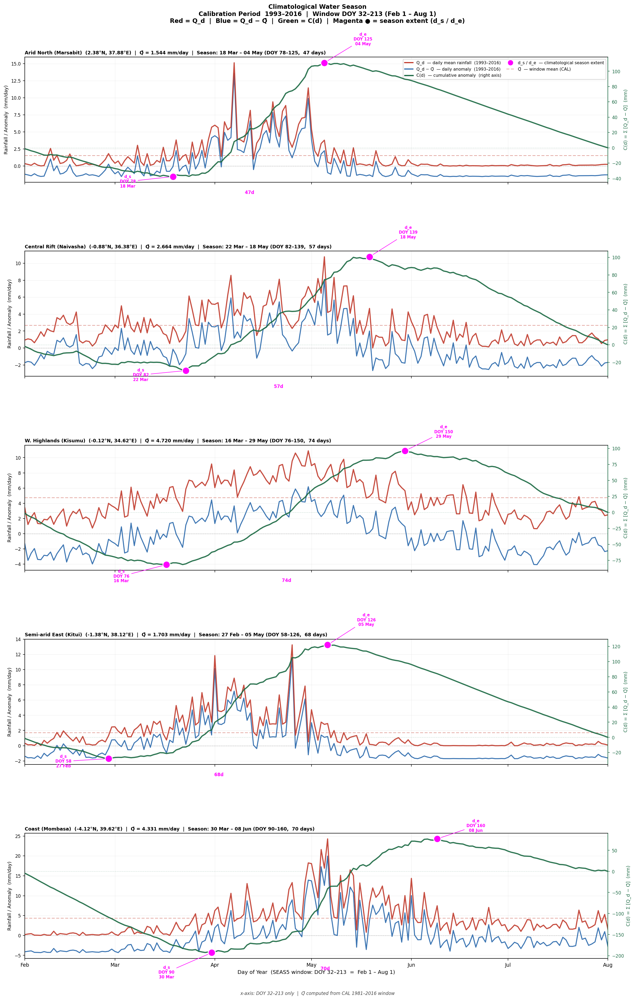

In [172]:
# =============================================================================
# FIGURE A — CALIBRATION PERIOD  (1981–2016)
# =============================================================================

print("\nDrawing Figure A — Calibration period ...")
_draw_period_figure(
    period          = "cal",
    Qd_key          = "Qd_cal",
    anom_key        = "anom_cal",
    C_key           = "C_cal",
    ds_key          = "ds_cal",
    de_key          = "de_cal",
    dsk_key         = "ds_k_cal",
    dek_key         = "de_k_cal",
    period_label    = f"Calibration Period  {CAL_YEARS[0]}–{CAL_YEARS[-1]}",
    period_years_str= f"{CAL_YEARS[0]}–{CAL_YEARS[-1]}",
    fig_fname       = "figA_clim_water_season_CAL",
)

## Climatological Wet Season VALIDATION PERIOD  (2017–2018)



Drawing Figure B — Validation period ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3A_diagnostics\figB_clim_water_season_VAL.png


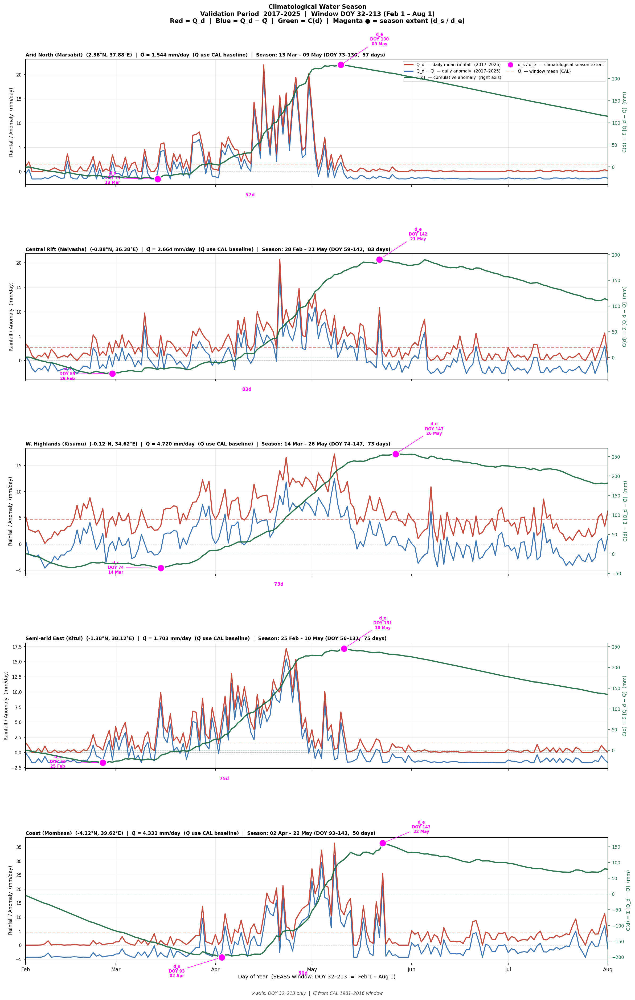

In [173]:
print("\nDrawing Figure B — Validation period ...")
_draw_period_figure(
    period          = "val",
    Qd_key          = "Qd_val",
    anom_key        = "anom_val",
    C_key           = "C_val",
    ds_key          = "ds_val",
    de_key          = "de_val",
    dsk_key         = "ds_k_val",
    dek_key         = "de_k_val",
    period_label    = f"Validation Period  {VAL_YEARS[0]}–{VAL_YEARS[-1]}",
    period_years_str= f"{VAL_YEARS[0]}–{VAL_YEARS[-1]}",
    fig_fname       = "figB_clim_water_season_VAL",
)

## Summary Table 

In [174]:
print("\n" + "="*75)
print("Climatological Water Season  —  Window DOY 32–213  |  Summary")
print("="*75)
hdr = (f"  {'Site':<26}  {'CAL d_s':>10}  {'CAL d_e':>10}  {'CAL len':>7}  "
       f"{'VAL d_s':>10}  {'VAL d_e':>10}  {'VAL len':>7}  {'Shift d_s':>9}")
print(hdr)
print("  " + "-"*96)
for s in SAMPLE_SITES:
    nc = s["name"].replace("\n", " ")
    print(f"  {nc:<26}  "
          f"DOY {s['ds_cal']:3d} ({_doy_to_date(s['ds_cal'])})  "
          f"DOY {s['de_cal']:3d} ({_doy_to_date(s['de_cal'])})  "
          f"{s['de_cal']-s['ds_cal']:4d}d    "
          f"DOY {s['ds_val']:3d} ({_doy_to_date(s['ds_val'])})  "
          f"DOY {s['de_val']:3d} ({_doy_to_date(s['de_val'])})  "
          f"{s['de_val']-s['ds_val']:4d}d    "
          f"{s['ds_val']-s['ds_cal']:+4d}d")


Climatological Water Season  —  Window DOY 32–213  |  Summary
  Site                           CAL d_s     CAL d_e  CAL len     VAL d_s     VAL d_e  VAL len  Shift d_s
  ------------------------------------------------------------------------------------------------
  Arid North (Marsabit)       DOY  78 (18 Mar)  DOY 125 (04 May)    47d    DOY  73 (13 Mar)  DOY 130 (09 May)    57d      -5d
  Central Rift (Naivasha)     DOY  82 (22 Mar)  DOY 139 (18 May)    57d    DOY  59 (28 Feb)  DOY 142 (21 May)    83d     -23d
  W. Highlands (Kisumu)       DOY  76 (16 Mar)  DOY 150 (29 May)    74d    DOY  74 (14 Mar)  DOY 147 (26 May)    73d      -2d
  Semi-arid East (Kitui)      DOY  58 (27 Feb)  DOY 126 (05 May)    68d    DOY  56 (25 Feb)  DOY 131 (10 May)    75d      -2d
  Coast (Mombasa)             DOY  90 (30 Mar)  DOY 160 (08 Jun)    70d    DOY  93 (02 Apr)  DOY 143 (22 May)    50d      +3d


## Météo-France System 9 DAILY INGESTION

The MF pipeline replaces the SEAS5 Stages 1B–4B with equivalent stages
operating on the Météo-France System 9 C3S seasonal forecast data.

Link: [https://cds.climate.copernicus.eu/datasets/seasonal-original-single-levels  # Météo-France System 9 product page1+C3S+contribution](https://cds.climate.copernicus.eu/datasets/seasonal-original-single-levels  # Météo-France System 9 product page1+C3S+contribution)

**Météo-France System 9:**
| Property | Météo-France System 9 |
|---|---|
|Short Name |cmcc |
|Time Range |184 days ~ 6 month|
|Model ID | SYS9-v20210821 |
|System Value | 4 |
| Members | 30 (hindcast) / 50 (OP 2026) |
| Hindcast years| 1993–2018 (missing 2025) |
| CAL years | 1993–2016 (24 yrs) |
| VAL years | 2017–2024 (8 yrs only) |
| Native grid| 0.25° |
| Ensemble dim| number |
| Time dim | forecast_period (hours) |




## Stage 1B MF — Météo-France System 9 Daily Ingestion & Unit Conversion

**Input:** `tp` — cumulative total precipitation in metres  
`dims = (number, forecast_reference_time, forecast_period, latitude, longitude)`  
`shape = (3, 1, 182, 49, 45)` for hindcast years; `(11, 1, 182, 49, 45)` for 2026

**Conversion steps:**
1. Squeeze `forecast_reference_time` dim (size 1)
2. Trim to `N_MEMBERS=3` (so 2026 matches hindcast dimensions)
3. Differentiate along `forecast_period` axis → daily increments
4. Convert m → mm (×1000) and clip negatives to zero


In [175]:
print("Stage 1B MF: CM ACCESS-S2 daily ingestion ...")
print(f"  Directory : {MF_DIR}")
print(f"  Years     : {MF_AVAILABLE_YEARS[0]}–{MF_AVAILABLE_YEARS[-1]}  ({len(MF_AVAILABLE_YEARS)} files)")
print(f"  Members   : {N_MEMBERS}  (hindcast) / 11 (2026, trimmed to {N_MEMBERS})")
print(f"  Forecast days : {N_FORECAST_DAYS}")


def _load_one_mf_year(year):
    """
    Load one MF ACCESS-S2 file.
    Convert cumulative tp (metres) to daily mm/day.

    MF dims: (number, forecast_reference_time, forecast_period, lat, lon)
    Steps:
      1. Squeeze forecast_reference_time (size 1)
      2. Trim to N_MEMBERS (hindcast=3, OP=11 → trimmed to 3)
      3. Diff along forecast_period → daily increments (day 0 = first 24h)
      4. ×1000 m→mm, clip negatives

    Returns
    -------
    daily_mm : (N_MEMBERS, 182, n_lat_mf, n_lon_mf)  float32  mm/day
    mf_lat  : (49,)  float64
    mf_lon  : (45,)  float64
    """
    fpath = os.path.join(MF_DIR, MF_FILE_PATTERN.format(year=year))
    if not os.path.exists(fpath):
        raise FileNotFoundError(f"Missing: {fpath}")

    ds  = xr.open_dataset(fpath, decode_times=False)
    tp  = ds[MF_VAR].values.astype(np.float64)
    # dims: (number, forecast_reference_time, forecast_period, lat, lon)

    # 1. Squeeze forecast_reference_time (axis 1, size 1)
    if tp.ndim == 5:
        tp = tp[:, 0, :, :, :]          # → (number, forecast_period, lat, lon)

    # 2. Trim to N_MEMBERS (handles 2026 with 11 members)
    tp = tp[:N_MEMBERS, :, :, :]        # → (N_MEMBERS, 182, lat, lon)

    # 3. Lat/lon
    lat_name = "latitude"  if "latitude"  in ds.coords else "lat"
    lon_name = "longitude" if "longitude" in ds.coords else "lon"
    mf_lat  = ds[lat_name].values.astype(np.float64)
    mf_lon  = ds[lon_name].values.astype(np.float64)
    ds.close()

    # 4. Cumulative → daily increments along forecast_period axis (axis 1)
    daily_m          = np.empty_like(tp)
    daily_m[:, 0, :, :] = tp[:, 0, :, :]           # first 24h total
    daily_m[:, 1:, :, :] = np.diff(tp, axis=1)      # subsequent days

    # 5. m → mm, clip negatives from floating-point noise
    daily_mm = np.clip(daily_m * 1000.0, 0.0, None).astype(np.float32)
    return daily_mm, mf_lat, mf_lon


# ── Load first file to get source grid dimensions ─────────────────────────
_sample, _mf_lat, _mf_lon = _load_one_mf_year(int(MF_AVAILABLE_YEARS[0]))
_nm_mf, _nd_mf, _nlat_mf, _nlon_mf = _sample.shape
n_mf_years  = len(MF_AVAILABLE_YEARS)
mf_years    = MF_AVAILABLE_YEARS.copy()

print(f"  MF source grid : {_nlat_mf} lat × {_nlon_mf} lon")
print(f"  MF lat range   : {_mf_lat[0]:.2f} → {_mf_lat[-1]:.2f}")
print(f"  MF lon range   : {_mf_lon[0]:.2f} → {_mf_lon[-1]:.2f}")
print(f"  MF grid spacing: {abs(_mf_lat[1]-_mf_lat[0]):.4f}°  (matches CHIRPS 0.25° ✓)")

# ── Pre-allocate raw array ────────────────────────────────────────────────
mf_raw = np.full((_nm_mf, n_mf_years, _nd_mf, _nlat_mf, _nlon_mf),
                  np.nan, np.float32)
mf_raw[:, 0, :, :, :] = _sample

for yi in range(1, n_mf_years):
    year = int(MF_AVAILABLE_YEARS[yi])
    if yi % 5 == 0:
        print(f"  {year}  ({yi+1}/{n_mf_years}) ...", flush=True)
    try:
        mm, _, _ = _load_one_mf_year(year)
        mf_raw[:, yi, :, :, :] = mm
    except FileNotFoundError as e:
        print(f"  MISSING: {e}")

dm = np.nanmean(mf_raw)
print(f"\n  mf_raw shape : {mf_raw.shape}")
print(f"  Domain mean   : {dm:.3f} mm/day  (expected ~1–3 mm/day for Feb–Aug)")
print(f"  Negatives     : {int(np.sum(mf_raw < 0))}  (should be 0)")
print("Stage 1B MF complete ✓")


Stage 1B MF: CM ACCESS-S2 daily ingestion ...
  Directory : C:\Users\yonas\Documents\ILRI\onset-kenya\c3s_meteo_france_seasonal
  Years     : 1993–2026  (33 files)
  Members   : 31  (hindcast) / 11 (2026, trimmed to 31)
  Forecast days : 182
  MF source grid : 49 lat × 45 lon
  MF lat range   : 7.00 → -5.00
  MF lon range   : 32.00 → 43.00
  MF grid spacing: 0.2500°  (matches CHIRPS 0.25° ✓)
  1998  (6/33) ...
  2003  (11/33) ...
  2008  (16/33) ...
  2013  (21/33) ...
  2018  (26/33) ...
  2023  (31/33) ...

  mf_raw shape : (31, 33, 182, 49, 45)
  Domain mean   : 1.604 mm/day  (expected ~1–3 mm/day for Feb–Aug)
  Negatives     : 0  (should be 0)
Stage 1B MF complete ✓


## Stage 2B MF — Reindex MF to CHIRPS 0.25° Target Grid



Météo-France System 9 is already at 0.25°. The MF source grid covers a slightly
larger domain (lat −5.0–7.0, lon 32.0–43.0) than the target Kenya grid
(lat −4.875–5.375, lon 33.625–42.125). No interpolation is needed — just
a nearest-neighbour reindex to align the two 0.25° grids exactly.

The land mask applied here is the same Kenya shapefile mask used for CHIRPS.


In [176]:
print("\nStage 2B MF: Reindexing MF to CHIRPS 0.25° target grid ...")
print(f"  MF source : {_nlat_mf} × {_nlon_mf}  (0.25°)")
print(f"  Target     : {n_lat} × {n_lon}  (0.25°)")
print("  Method     : nearest-neighbour reindex  (no interpolation — grids match)")


def _reindex_mf(data_nm_ny_nd_nlat_nlon, src_lat, src_lon, tgt_lat, tgt_lon):
    """
    Reindex MF (already 0.25°) onto the CHIRPS target grid by finding
    the nearest source index for each target lat/lon.

    Parameters
    ----------
    data : (n_members, n_years, n_days, n_lat_src, n_lon_src)
    src_lat, src_lon : 1-D source coordinate arrays

    Returns
    -------
    out : (n_members, n_years, n_days, n_lat_tgt, n_lon_tgt)
    """
    nm, ny, nd, _, _ = data_nm_ny_nd_nlat_nlon.shape
    nlt = len(tgt_lat); nln = len(tgt_lon)
    out = np.full((nm, ny, nd, nlt, nln), np.nan, np.float32)

    for i, lat in enumerate(tgt_lat):
        si = int(np.argmin(np.abs(src_lat - lat)))
        for j, lon in enumerate(tgt_lon):
            sj = int(np.argmin(np.abs(src_lon - lon)))
            if 0 <= si < len(src_lat) and 0 <= sj < len(src_lon):
                out[:, :, :, i, j] = data_nm_ny_nd_nlat_nlon[:, :, :, si, sj]
    return out


mf_rg = _reindex_mf(mf_raw, _mf_lat, _mf_lon, target_lat, target_lon)

# Apply Kenya land mask
for yi in range(n_mf_years):
    mf_rg[:, yi, :, ~lm] = np.nan

del mf_raw   # free memory

print(f"\n  mf_rg shape  : {mf_rg.shape}")
print(f"  Domain mean   : {np.nanmean(mf_rg):.3f} mm/day")
print(f"  Non-NaN frac  : {np.sum(~np.isnan(mf_rg))/mf_rg.size:.3f}")
print("Stage 2B MF complete ✓")



Stage 2B MF: Reindexing MF to CHIRPS 0.25° target grid ...
  MF source : 49 × 45  (0.25°)
  Target     : 42 × 34  (0.25°)
  Method     : nearest-neighbour reindex  (no interpolation — grids match)

  mf_rg shape  : (31, 33, 182, 42, 34)
  Domain mean   : 1.199 mm/day
  Non-NaN frac  : 0.585
Stage 2B MF complete ✓


## DAILY QM-BC, MEMBER-WISE     
  - For each land grids and each forecast day index d
     -  Pool CHIRPS CAL values in a ±QM_DOY_WINDOW around DOY(d)         
     - Pool MF CAL values for day d across all members and years      
     - Wet-day frequency correction                                       
     - Empirical QM with cube-root transform                             
     - Apply transfer function to ALL years (CAL + VAL + OP)            
     - Transfer function is estimated on CAL only: never re-fitted for VAL and OP          

## Stage 3B MF — Daily QM-BC, Member-Wise

Identical method to the SEAS5 Stage 3B but using MF arrays.

**CAL pool:** CHIRPS 1993–2016 (24 years) matched to MF hindcast CAL years.  
**Transfer function:** fitted on CAL only, applied to all years (including 2026).  
Note: with only 3 members and 24 CAL years the CHIRPS pool
(±15 DOY × 24 years = ~720 days per DOY) remains adequate.


In [177]:
print("\nStage 3B MF: Daily QM-BC (member-wise) ...")
print(f"  CAL period       : {CAL_YEARS[0]}–{CAL_YEARS[-1]}  ({len(CAL_YEARS)} years)")
print(f"  DOY window       : +/-{QM_DOY_WINDOW} days around each forecast day")
print(f"  Wet-day thresh   : {WET_DAY_THRESH} mm/day")
print(f"  Transform        : cube-root (power={BC_TRANSFORM_POWER:.4f})")
print(f"  Land pixels      : {int(lm.sum())}")

print("\nStage 3B: Daily QM-BC (member-wise) ...")
print(f"  CAL period       : {CAL_YEARS[0]}–{CAL_YEARS[-1]}")
print(f"  DOY window       : +/-{QM_DOY_WINDOW} days around each forecast day")
print(f"  Wet-day thresh   : {WET_DAY_THRESH} mm/day")
print(f"  Transform        : cube-root (power={BC_TRANSFORM_POWER:.4f})")
print(f"  Land pixels      : {int(lm.sum())}")


def _build_qm_transfer(c_pool, s_pool):
    """
    Build empirical quantile mapping transfer function.

    Parameters
    ----------
    c_pool : 1-D array of CHIRPS daily values (all days in ±window, all CAL years)
    s_pool : 1-D array of SEAS5 raw daily values (day d, all members, all CAL years)

    Returns
    -------
    transfer : callable  f(x_raw) → x_corrected
    """
    c_wet = c_pool[c_pool > WET_DAY_THRESH]
    s_wet = s_pool[s_pool > WET_DAY_THRESH]

    # Not enough data — return identity
    if len(c_wet) < 5 or len(s_wet) < 5:
        return lambda x: x

    # Wet-day frequency correction: reclassify driest SEAS5 wet days
    # if SEAS5 drizzles more frequently than CHIRPS
    f_c = len(c_wet) / max(len(c_pool), 1)
    f_s = len(s_wet) / max(len(s_pool), 1)
    if f_s > f_c and len(s_wet) > 1:
        n_clip = int(round((f_s - f_c) * len(s_pool)))
        if n_clip > 0:
            cutoff = np.sort(s_wet)[min(n_clip, len(s_wet) - 1)]
            s_wet  = s_wet[s_wet >= cutoff]
    if len(s_wet) < 3:
        return lambda x: x

    # Cube-root transform to reduce precipitation skewness
    power = BC_TRANSFORM_POWER
    c_tr  = np.sort(c_wet ** power)
    s_tr  = np.sort(s_wet ** power)
    n_c, n_s = len(c_tr), len(s_wet)
    p_s  = (np.arange(1, n_s + 1) - 0.5) / n_s
    p_c  = (np.arange(1, n_c + 1) - 0.5) / n_c

    def transfer(x_raw):
        if x_raw <= WET_DAY_THRESH:
            return 0.0
        x_t   = max(x_raw, 0.0) ** power
        p_hat = float(np.interp(x_t, s_tr, p_s,
                                left=p_s[0], right=p_s[-1]))
        x_c_t = float(np.interp(p_hat, p_c, c_tr,
                                 left=c_tr[0], right=c_tr[-1]))
        return float(max(x_c_t, 0.0) ** (1.0 / power))

    return transfer


# ── Reuse _build_qm_transfer from Stage 3B SEAS5 ─────────────────────────
# (already defined in the SEAS5 Stage 3B cell — if running mf-only,
#  copy the function definition here)



mf_bc       = mf_rg.copy()
land_pixels  = np.argwhere(lm)
n_land       = len(land_pixels)

# CAL masks aligned to CHIRPS and mf year axes
cal_mask_c_mf = np.isin(CHIRPS_FULL_YEARS, CAL_YEARS)  # into chirps_years (full 1981–2025)
cal_mask_s_mf = np.isin(mf_years, CAL_YEARS)
cal_idx_c_mf  = np.where(cal_mask_c_mf)[0]

for pix_num, (pi, pj) in enumerate(land_pixels):

    if (pix_num + 1) % 100 == 0:
        print(f"  Pixel {pix_num+1:4d} / {n_land}  "
              f"({100*(pix_num+1)/n_land:.0f}%)", flush=True)

    # Build transfer functions per forecast day
    transfer_fns = [None] * _nd_mf
    for d in range(_nd_mf):
        doy_d = WIN_DOY_START + d

        # CHIRPS pool: CAL years ±QM_DOY_WINDOW around doy_d
        c_pool = []
        for ci in cal_idx_c_mf:
            yr     = int(CHIRPS_FULL_YEARS[ci])
            is_lp  = (yr%4==0 and yr%100!=0) or (yr%400==0)
            n_days = 366 if is_lp else 365
            for off in range(-QM_DOY_WINDOW, QM_DOY_WINDOW+1):
                doy_k = doy_d + off
                if 1 <= doy_k <= n_days:
                    v = da_chirps_daily[ci, doy_k-1, pi, pj]
                    if not np.isnan(v):
                        c_pool.append(float(v))
        c_pool = np.array(c_pool, dtype=np.float32)

        # mf pool: CAL years, forecast day d, all members
        s_pool = mf_rg[:, cal_mask_s_mf, d, pi, pj].ravel()
        s_pool = s_pool[~np.isnan(s_pool)]

        transfer_fns[d] = _build_qm_transfer(c_pool, s_pool)

    # Apply to all members and all MF years
    for m in range(_nm_mf):
        for yi in range(n_mf_years):
            for d in range(_nd_mf):
                raw = float(mf_rg[m, yi, d, pi, pj])
                if np.isnan(raw):
                    continue
                mf_bc[m, yi, d, pi, pj] = float(transfer_fns[d](raw))

del mf_rg   # free memory

# ── QC ────────────────────────────────────────────────────────────────────
bc_cal_mf = mf_bc[:, cal_mask_s_mf, :, :, :]
bc_mean    = float(np.nanmean(bc_cal_mf))

cal_mask_c_mf_chirps = np.isin(CHIRPS_FULL_YEARS, CAL_YEARS)
chirps_win_mf = da_chirps_daily[cal_mask_c_mf_chirps, WIN_DOY_START-1:WIN_DOY_END, :, :]
chirps_win_mean = float(np.nanmean(chirps_win_mf[:, :, lm]))

print(f"\n  mf_bc shape        : {mf_bc.shape}")
print(f"  MF BC CAL mean     : {bc_mean:.3f} mm/day")
print(f"  CHIRPS CAL win mean : {chirps_win_mean:.3f} mm/day")
print(f"  Ratio (should be ~1): {bc_mean/chirps_win_mean:.3f}")
print(f"  Negatives           : {int(np.sum(mf_bc < 0))}  (should be 0)")
print("Stage 3B MF complete ✓")



Stage 3B MF: Daily QM-BC (member-wise) ...
  CAL period       : 1993–2016  (24 years)
  DOY window       : +/-15 days around each forecast day
  Wet-day thresh   : 0.1 mm/day
  Transform        : cube-root (power=0.3333)
  Land pixels      : 836

Stage 3B: Daily QM-BC (member-wise) ...
  CAL period       : 1993–2016
  DOY window       : +/-15 days around each forecast day
  Wet-day thresh   : 0.1 mm/day
  Transform        : cube-root (power=0.3333)
  Land pixels      : 836
  Pixel  100 / 836  (12%)
  Pixel  200 / 836  (24%)
  Pixel  300 / 836  (36%)
  Pixel  400 / 836  (48%)
  Pixel  500 / 836  (60%)
  Pixel  600 / 836  (72%)
  Pixel  700 / 836  (84%)
  Pixel  800 / 836  (96%)

  mf_bc shape        : (31, 33, 182, 42, 34)
  MF BC CAL mean     : 1.747 mm/day
  CHIRPS CAL win mean : 1.771 mm/day
  Ratio (should be ~1): 0.986
  Negatives           : 0  (should be 0)
Stage 3B MF complete ✓


### Save QM-BC corrected and parameters

In [178]:
print(f"\n  Saving mf_bc to {OUT_MF_BC} ...")
xr.DataArray(
    mf_bc,
    dims=["member", "year", "day", "lat", "lon"],
    coords={
        "member" : np.arange(1, _nm_mf + 1),
        "year"   : mf_years,
        "day"    : np.arange(_nd_mf),
        "lat"    : target_lat,
        "lon"    : target_lon,
    },
    attrs={
        "long_name"          : "Météo-France System 9 daily precipitation — QM-BC corrected",
        "units"              : "mm/day",
        "source_model"       : "Météo-France System 9 via C3S",
        "bias_correction"    : "member-wise empirical QM, cube-root transform",
        "wet_day_threshold"  : f"{WET_DAY_THRESH} mm/day",
        "doy_window"         : f"+/-{QM_DOY_WINDOW} days",
        "calibration_period" : f"{CAL_YEARS[0]}-{CAL_YEARS[-1]}",
        "n_members"          : _nm_mf,
        "system_version"     : SYSTEM_VERSION,
    }
).to_netcdf(OUT_MF_BC)
print(f"  Saved -> {OUT_MF_BC}")
print("\nStages 1B–3B MF complete ✓")
print(f"  mf_bc  : {mf_bc.shape}  — ready for Stage 4B Dunning detection")



  Saving mf_bc to C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\MF_bc_daily_all_years.nc ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\MF_bc_daily_all_years.nc

Stages 1B–3B MF complete ✓
  mf_bc  : (31, 33, 182, 42, 34)  — ready for Stage 4B Dunning detection


## BIAS CORRECTION DIAGNOSTIC PLOTS

- Evaluates QM-BC quality:
   - mean daily cycle
   - CDFs
   - spatial maps
   - wet-day frequency
   - member spread, and
   - ensemble mean comparison

- Seven figures:
   - Fig 1 — Mean daily cycle: CHIRPS vs MF raw vs MF BC (5 sites)
   - Fig 2 — Empirical CDFs: CHIRPS vs raw vs BC (5 sites, 3 DOY windows)
   - Fig 3 — Wet-day frequency: CHIRPS vs raw vs BC across the window
   - Fig 4 — Spatial maps: BC CAL mean vs CHIRPS CAL mean, and their ratio
   - Fig 5 — Member spread: ensemble std dev before/after BC (CAL mean)
   - Fig 6 — Bias map: (mf_BC_mean − CHIRPS_mean) / CHIRPS_mean
   - Fig 7 — QQ plots: MF BC vs CHIRPS for 5 sites

- If mf_rg was deleted after BC, raw (pre-BC) is reconstructed from mf_bc only where needed, or the plots skip raw comparisons.

## Helper Function

In [179]:
plt.rcParams.update({
    "figure.dpi"       : 150,
    "figure.facecolor" : "white",
    "font.family"      : "DejaVu Sans",
    "font.size"        : 10,
    "axes.titlesize"   : 10,
    "axes.titleweight" : "bold",
    "axes.labelsize"   : 9,
    "savefig.bbox"     : "tight",
    "savefig.dpi"      : 150,
})

DIAG_DIR = os.path.join(PLOT_DIR, "stage3B_diagnostics")
os.makedirs(DIAG_DIR, exist_ok=True)

# ── Colours ────────────────────────────────────────────────────────────────
COL_CHIRPS = "#1E6B45"    # green  — CHIRPS (truth)
COL_RAW    = "#E05C3A"    # orange — SEAS5 raw (uncorrected)
COL_BC     = "#1B5EA6"    # blue   — SEAS5 bias corrected

# ── Helpers ────────────────────────────────────────────────────────────────
def _doy_to_date(doy, year=2000):
    try:
        return (datetime.date(year, 1, 1) +
                datetime.timedelta(days=int(round(float(doy))) - 1)
                ).strftime("%d %b")
    except Exception:
        return "?"

def _save(fig, name):
    p = os.path.join(DIAG_DIR, f"{name}.png")
    fig.savefig(p, bbox_inches="tight", dpi=150)
    print(f"  Saved -> {p}")

def _pcm(ax, data2d, cmap, vmin, vmax):
    masked   = np.ma.array(data2d, mask=np.isnan(data2d))
    lon_edge = np.append(target_lon - 0.125, target_lon[-1] + 0.125)
    lat_edge = np.append(target_lat - 0.125, target_lat[-1] + 0.125)
    LON, LAT = np.meshgrid(lon_edge, lat_edge)
    return ax.pcolormesh(LON, LAT, masked, cmap=cmap, vmin=vmin, vmax=vmax,
                         transform=ccrs.PlateCarree(), zorder=1, shading="flat")

def _base_map(ax):
    ax.set_extent([33.5, 42.1, -5.0, 5.4], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.OCEAN,     facecolor="#EAF4FB", zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor="#333", zorder=3)
    ax.add_feature(cfeature.BORDERS,   linewidth=0.4, linestyle="--",
                   edgecolor="#555", zorder=3)
    kenya_shp.boundary.plot(ax=ax, linewidth=1.2, edgecolor="black",
                            transform=ccrs.PlateCarree(), zorder=4)
    gl = ax.gridlines(draw_labels=True, linewidth=0.35, color="gray",
                      alpha=0.4, linestyle="--")
    gl.top_labels   = False
    gl.right_labels = False
    gl.xlocator     = mticker.FixedLocator([34, 36, 38, 40, 42])
    gl.ylocator     = mticker.FixedLocator([-4, -2, 0, 2, 4])
    gl.xlabel_style = {"size": 6}
    gl.ylabel_style = {"size": 6}

# ── Representative pixels ─────────────────────────────────────────────────
SITES = [
    {"name": "Arid North",   "lat":  2.30, "lon": 38.00},
    {"name": "Central Rift", "lat": -0.80, "lon": 36.43},
    {"name": "W.Highlands",  "lat": -0.10, "lon": 34.75},
    {"name": "Semi-arid E",  "lat": -1.37, "lon": 38.01},
    {"name": "Coast",        "lat": -4.05, "lon": 39.65},
]
for s in SITES:
    li = np.argwhere(lm)
    la = target_lat[li[:, 0]]; lo = target_lon[li[:, 1]]
    b  = int(np.argmin((la - s["lat"])**2 + (lo - s["lon"])**2))
    s["i"], s["j"] = int(li[b, 0]), int(li[b, 1])

# ── Pre-compute CHIRPS window-mean daily cycle per pixel ──────────────────
# Shape (n_win, n_lat, n_lon): mean over all CAL years for each window DOY
print("Pre-computing CHIRPS window climatology ...")
cal_mask_c = np.isin(chirps_years, CAL_YEARS)
cal_mask_mf = np.isin(mf_years,  CAL_YEARS)

chirps_win_clim = np.full((_nd_mf, n_lat, n_lon), np.nan, np.float32)
for k, doy in enumerate(WIN_DOYS):
    d_idx = doy - 1
    v = da_chirps_daily[cal_mask_c, d_idx, :, :]
    chirps_win_clim[k] = np.nanmean(v, axis=0)
chirps_win_clim[:, ~lm] = np.nan

# MF BC ensemble-mean window climatology (CAL)
bc_ens_mean_clim = np.nanmean(
    mf_bc[:, cal_mask_mf, :, :, :], axis=(0, 1))   # (182, n_lat, n_lon)
bc_ens_mean_clim[:, ~lm] = np.nan

print("  Done.")

Pre-computing CHIRPS window climatology ...
  Done.


## Mean Daily Cycle: CHIRPS vs MF BC (5 sites)


Fig 1: Mean daily cycle comparison ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3B_diagnostics\mf_fig1_mean_daily_cycle.png


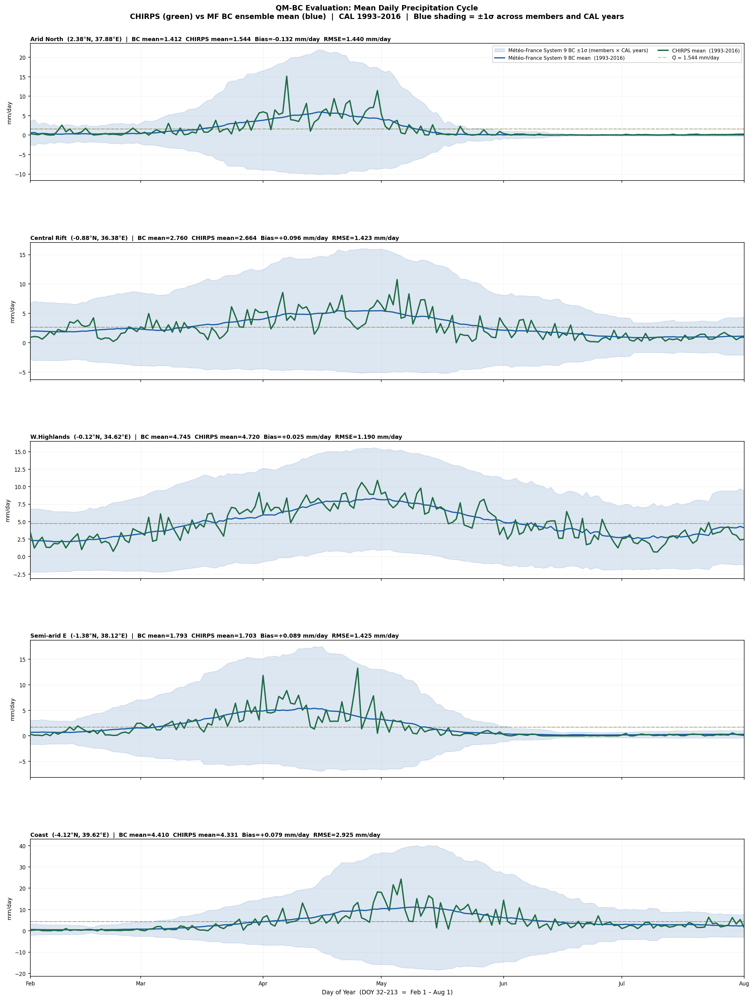

In [180]:
print("\nFig 1: Mean daily cycle comparison ...")

# Month tick helpers
MONTH_TICKS  = [d for d in [32, 60, 91, 121, 152, 182, 213]
                if WIN_DOY_START <= d <= WIN_DOY_END]
MONTH_LABELS = ["Feb","Mar","Apr","May","Jun","Jul","Aug"][:len(MONTH_TICKS)]

fig1, axes1 = plt.subplots(len(SITES), 1, figsize=(16, 4.2 * len(SITES)),
                            sharex=True)

for row, (ax, s) in enumerate(zip(axes1, SITES)):
    ii, jj = s["i"], s["j"]

    # CHIRPS CAL daily mean
    ch_mean = chirps_win_clim[:, ii, jj]

    # SEAS5 BC: ensemble mean over CAL years, per day
    bc_mean_1d = np.nanmean(
        mf_bc[:, cal_mask_mf, :, ii, jj], axis=(0, 1))  # (182,)

    # SEAS5 BC: ±1 std across members × CAL years
    bc_all = mf_bc[:, cal_mask_mf, :, ii, jj]           # (25, n_cal, 182)
    bc_std = np.nanstd(bc_all.reshape(-1, _nd_mf), axis=0)

    ax.fill_between(WIN_DOYS, bc_mean_1d - bc_std, bc_mean_1d + bc_std,
                    color=COL_BC, alpha=0.15, zorder=1,
                    label="Météo-France System 9 BC ±1σ (members × CAL years)")
    ax.plot(WIN_DOYS, bc_mean_1d, color=COL_BC, lw=1.8, zorder=3,
            label=f"Météo-France System 9 BC mean  ({CAL_YEARS[0]}-{CAL_YEARS[-1]})")
    ax.plot(WIN_DOYS, ch_mean, color=COL_CHIRPS, lw=2.0, ls="-", zorder=4,
            label=f"CHIRPS mean  ({CAL_YEARS[0]}-{CAL_YEARS[-1]})")
    ax.axhline(float(np.nanmean(ch_mean)), color=COL_CHIRPS, lw=0.8,
               ls="--", alpha=0.50, zorder=2)

    # Q_bar reference
    ax.axhline(float(Q_bar[ii, jj]), color="#92680A", lw=0.9,
               ls=(0,(5,3)), alpha=0.65, zorder=2,
               label=f"Q̄ = {Q_bar[ii,jj]:.3f} mm/day")

    ax.set_xlim(WIN_DOY_START, WIN_DOY_END)
    ax.set_xticks(MONTH_TICKS)
    ax.set_xticklabels(MONTH_LABELS, fontsize=8.5)
    ax.set_ylabel("mm/day", fontsize=8.5)
    ax.grid(True, lw=0.3, alpha=0.35)
    ax.tick_params(labelsize=8)

    rmse = float(np.sqrt(np.nanmean((bc_mean_1d - ch_mean)**2)))
    bias = float(np.nanmean(bc_mean_1d - ch_mean))
    ax.set_title(
        f"{s['name']}  ({target_lat[ii]:.2f}°N, {target_lon[jj]:.2f}°E)  |  "
        f"BC mean={np.nanmean(bc_mean_1d):.3f}  CHIRPS mean={np.nanmean(ch_mean):.3f}  "
        f"Bias={bias:+.3f} mm/day  RMSE={rmse:.3f} mm/day",
        fontsize=8.5, loc="left", pad=4)

    if row == 0:
        ax.legend(fontsize=7.5, loc="upper right", framealpha=0.90,
                  ncol=2, handlelength=2.0)

axes1[-1].set_xlabel(
    f"Day of Year  (DOY {WIN_DOY_START}–{WIN_DOY_END}  =  Feb 1 – Aug 1)",
    fontsize=9)
fig1.suptitle(
    "QM-BC Evaluation: Mean Daily Precipitation Cycle\n"
    "CHIRPS (green) vs MF BC ensemble mean (blue)  |  CAL 1993–2016  |  "
    "Blue shading = ±1σ across members and CAL years",
    fontsize=11, fontweight="bold", y=1.002)
plt.tight_layout()
fig1.subplots_adjust(hspace=0.45)
_save(fig1, "mf_fig1_mean_daily_cycle")
plt.show()

## Empirical CDFs: CHIRPS vs SEAS5 BC (5 sites × 3 representative days)


Fig 2: Empirical CDFs ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3B_diagnostics\mf_fig2_empirical_cdfs.png


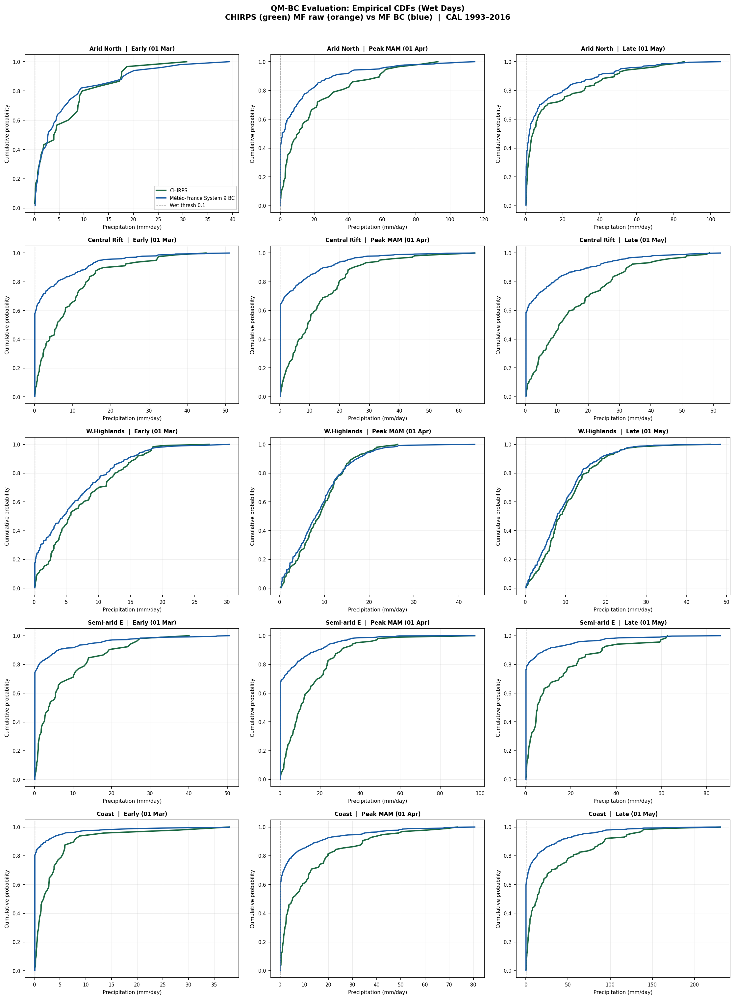

In [181]:
print("\nFig 2: Empirical CDFs ...")


# Pick 3 representative forecast days: early-window (Mar), peak-MAM (Apr), late (May)
FOCAL_DAYS = {
    "Early (01 Mar)": int(np.where(WIN_DOYS == 60)[0][0])
    if 60 in WIN_DOYS else 28,
    "Peak MAM (01 Apr)": int(np.where(WIN_DOYS == 91)[0][0])
    if 91 in WIN_DOYS else 59,
    "Late (01 May)": int(np.where(WIN_DOYS == 121)[0][0])
    if 121 in WIN_DOYS else 89,
}
FOCAL_DAY_KEYS = list(FOCAL_DAYS.keys())


fig2, axes2 = plt.subplots(len(SITES), len(FOCAL_DAYS),
                            figsize=(5 * len(FOCAL_DAYS), 4 * len(SITES)),
                            sharey=False)


for row, s in enumerate(SITES):
    ii, jj = s["i"], s["j"]
    for col, (dlabel, d_idx) in enumerate(FOCAL_DAYS.items()):
        ax = axes2[row, col]


        # CHIRPS: all CAL years, ±5 days around d_idx for more samples
        doy_d  = WIN_DOYS[d_idx]
        c_vals = []
        for ci in np.where(cal_mask_c)[0]:
            for off in range(-5, 6):
                idx2 = doy_d - 1 + off
                if 0 <= idx2 < da_chirps_daily.shape[1]:
                    v = da_chirps_daily[ci, idx2, ii, jj]
                    if not np.isnan(v):
                        c_vals.append(float(v))
        c_vals = np.array(c_vals)


        # SEAS5 BC: all members, CAL years, day d_idx
        bc_vals = mf_bc[:, cal_mask_mf, d_idx, ii, jj].ravel()
        bc_vals = bc_vals[~np.isnan(bc_vals)]


        # SEAS5 RAW (if available): all members, CAL years, day d_idx
        raw_vals = None
        try:
            rv = mf_rg[:, cal_mask_mf, d_idx, ii, jj].ravel()
            rv = rv[~np.isnan(rv)]
            raw_vals = rv
        except NameError:
            raw_vals = None


        # Plot empirical CDFs (wet days only for clarity)
        series = [
            (c_vals[c_vals > WET_DAY_THRESH],   COL_CHIRPS, "CHIRPS",    2.0),
        ]
        if raw_vals is not None and raw_vals.size > 2:
            series.append(
                (raw_vals[raw_vals > WET_DAY_THRESH], COL_RAW,   "Météo-France System 9 raw", 1.6),
            )
        series.append(
            (bc_vals[bc_vals > WET_DAY_THRESH],  COL_BC,    "Météo-France System 9 BC",  1.8),
        )


        for vals, col_c, label, lw in series:
            if len(vals) > 2:
                sv  = np.sort(vals)
                cdf = np.arange(1, len(sv) + 1) / len(sv)
                ax.plot(sv, cdf, color=col_c, lw=lw, label=label)


        ax.axvline(WET_DAY_THRESH, color="gray", lw=0.7, ls="--",
                   alpha=0.60, label=f"Wet thresh {WET_DAY_THRESH}")
        ax.set_xlabel("Precipitation (mm/day)", fontsize=7.5)
        ax.set_ylabel("Cumulative probability", fontsize=7.5)
        ax.set_title(f"{s['name']}  |  {dlabel}", fontsize=8)
        ax.grid(True, lw=0.3, alpha=0.35)
        ax.tick_params(labelsize=7)
        if row == 0 and col == 0:
            ax.legend(fontsize=7, framealpha=0.90)


fig2.suptitle(
    "QM-BC Evaluation: Empirical CDFs (Wet Days)\n"
    "CHIRPS (green) MF raw (orange) vs MF BC (blue)  |  CAL 1993–2016",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout()
_save(fig2, "mf_fig2_empirical_cdfs")
plt.show()



## Wet-Day Frequency: CHIRPS vs MF BC across window DOYs (5 sites)


Fig 3: Wet-day frequency ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3B_diagnostics\mf_fig3_wet_day_frequency.png


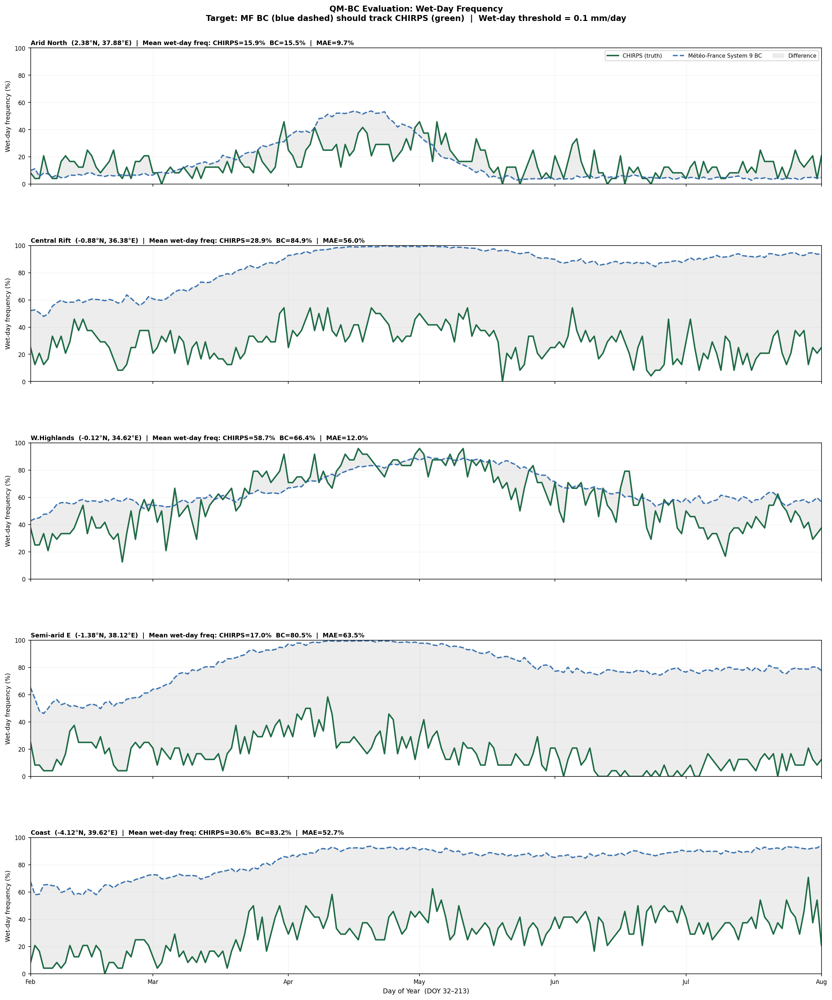

In [182]:
print("\nFig 3: Wet-day frequency ...")

fig3, axes3 = plt.subplots(len(SITES), 1, figsize=(16, 3.8 * len(SITES)),
                            sharex=True)

for ax, s in zip(axes3, SITES):
    ii, jj = s["i"], s["j"]

    # CHIRPS wet-day frequency per window DOY (CAL)
    ch_wdf = np.zeros(_nd_mf, np.float32)
    for k, doy in enumerate(WIN_DOYS):
        v = da_chirps_daily[cal_mask_c, doy - 1, ii, jj]
        v = v[~np.isnan(v)]
        ch_wdf[k] = float(np.mean(v > WET_DAY_THRESH)) if len(v) else np.nan

    # MF BC wet-day frequency per window DOY (CAL, all members)
    bc_wdf = np.zeros(_nd_mf, np.float32)
    for k in range(_nd_mf):
        v = mf_bc[:, cal_mask_mf, k, ii, jj].ravel()
        v = v[~np.isnan(v)]
        bc_wdf[k] = float(np.mean(v > WET_DAY_THRESH)) if len(v) else np.nan

    ax.plot(WIN_DOYS, ch_wdf * 100, color=COL_CHIRPS, lw=2.0,
            label="CHIRPS (truth)")
    ax.plot(WIN_DOYS, bc_wdf * 100, color=COL_BC, lw=1.8, ls="--",
            alpha=0.85, label="Météo-France System 9 BC")
    ax.fill_between(WIN_DOYS,
                    np.minimum(ch_wdf, bc_wdf) * 100,
                    np.maximum(ch_wdf, bc_wdf) * 100,
                    color="#888888", alpha=0.15, zorder=0, label="Difference")
    ax.set_xlim(WIN_DOY_START, WIN_DOY_END)
    ax.set_xticks(MONTH_TICKS)
    ax.set_xticklabels(MONTH_LABELS, fontsize=8.5)
    ax.set_ylabel("Wet-day frequency (%)", fontsize=8.5)
    ax.set_ylim(0, 100)
    ax.grid(True, lw=0.3, alpha=0.35)
    ax.tick_params(labelsize=8)

    mae = float(np.nanmean(np.abs(bc_wdf - ch_wdf))) * 100
    ax.set_title(
        f"{s['name']}  ({target_lat[ii]:.2f}°N, {target_lon[jj]:.2f}°E)  |  "
        f"Mean wet-day freq: CHIRPS={np.nanmean(ch_wdf)*100:.1f}%  "
        f"BC={np.nanmean(bc_wdf)*100:.1f}%  |  MAE={mae:.1f}%",
        fontsize=8.5, loc="left", pad=4)
    if ax is axes3[0]:
        ax.legend(fontsize=7.5, loc="upper right", framealpha=0.90, ncol=3)

axes3[-1].set_xlabel(
    f"Day of Year  (DOY {WIN_DOY_START}–{WIN_DOY_END})", fontsize=9)
fig3.suptitle(
    "QM-BC Evaluation: Wet-Day Frequency\n"
    "Target: MF BC (blue dashed) should track CHIRPS (green)  |  "
    f"Wet-day threshold = {WET_DAY_THRESH} mm/day",
    fontsize=11, fontweight="bold", y=1.002)
plt.tight_layout()
fig3.subplots_adjust(hspace=0.45)
_save(fig3, "mf_fig3_wet_day_frequency")
plt.show()

## Spatial Maps: CHIRPS mean, MF BC mean, Absolute bias


Fig 4: Spatial bias maps ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3B_diagnostics\mf_fig4_spatial_bias_maps.png


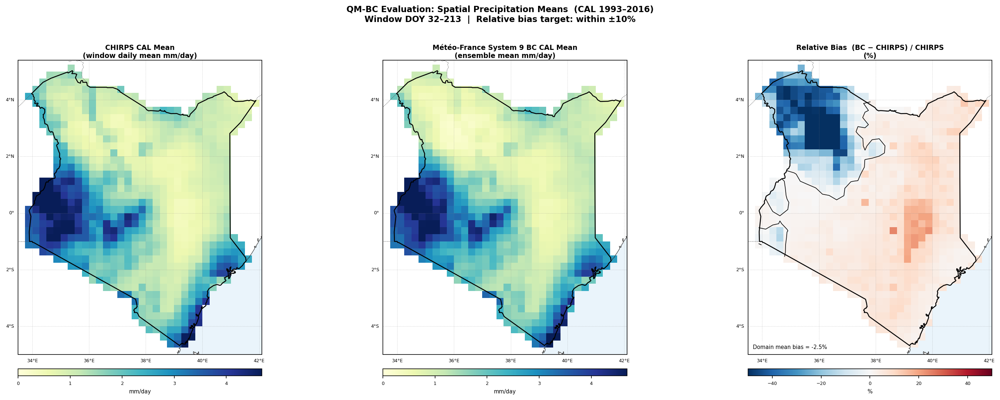

In [183]:
print("\nFig 4: Spatial bias maps ...")


chirps_spatial_mean = np.nanmean(
    chirps_win_clim, axis=0)             # mean over window DOYs
bc_spatial_mean     = np.nanmean(
    bc_ens_mean_clim, axis=0)            # mean over window DOYs
abs_bias            = bc_spatial_mean - chirps_spatial_mean
rel_bias            = np.where(
    chirps_spatial_mean > 0.1,
    100.0 * abs_bias / chirps_spatial_mean, np.nan)


fig4, axes4 = plt.subplots(1, 3, figsize=(20, 7),
                            subplot_kw={"projection": ccrs.PlateCarree()})


vmax_mm = float(np.nanpercentile(chirps_spatial_mean[lm], 97))


# First pass: draw maps and record colorbar info
panel_info = []


for ax, arr, cmap, vmin, vmax, title, cblabel in [
    (axes4[0], chirps_spatial_mean, "YlGnBu",
     0, vmax_mm,
     "CHIRPS CAL Mean\n(window daily mean mm/day)", "mm/day"),
    (axes4[1], bc_spatial_mean,    "YlGnBu",
     0, vmax_mm,
     "Météo-France System 9 BC CAL Mean\n(ensemble mean mm/day)",    "mm/day"),
    (axes4[2], rel_bias,           "RdBu_r",
     -50, 50,
     "Relative Bias  (BC − CHIRPS) / CHIRPS\n(%)",   "%"),
]:
    _base_map(ax)
    im = _pcm(ax, arr, cmap, vmin, vmax)
    ax.set_title(title, fontsize=9, pad=3)
    panel_info.append((ax, im, cblabel, title))


    # Zero contour on bias panel
    if "Bias" in title:
        ax.contour(target_lon, target_lat,
                   np.where(lm, rel_bias, np.nan),
                   levels=[0], colors=["black"], linewidths=[0.8],
                   transform=ccrs.PlateCarree(), zorder=5)
        mn_bias = float(np.nanmean(rel_bias[lm]))
        ax.text(0.02, 0.02, f"Domain mean bias = {mn_bias:+.1f}%",
                transform=ax.transAxes, fontsize=7,
                bbox=dict(fc="white", alpha=0.80, lw=0))


fig4.suptitle(
    "QM-BC Evaluation: Spatial Precipitation Means  (CAL 1993–2016)\n"
    "Window DOY 32–213  |  Relative bias target: within ±10%",
    fontsize=11, fontweight="bold", y=1.01)


# Apply tight_layout before positioning colorbars so they align with panels
plt.tight_layout(rect=[0, 0.06, 1, 1])


# Second pass: add colorbars using final panel positions
for ax, im, cblabel, title in panel_info:
    pos = ax.get_position()
    cax = fig4.add_axes([pos.x0, pos.y0 - 0.055, pos.width, 0.018])
    cb  = fig4.colorbar(im, cax=cax, orientation="horizontal")
    cb.set_label(cblabel, fontsize=7)
    cb.ax.tick_params(labelsize=6)


_save(fig4, "mf_fig4_spatial_bias_maps")
plt.show()



## Ensemble Spread: Std dev across 3 members (CAL mean daily)


Fig 5: Ensemble spread maps ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3B_diagnostics\mf_fig5_ensemble_spread.png


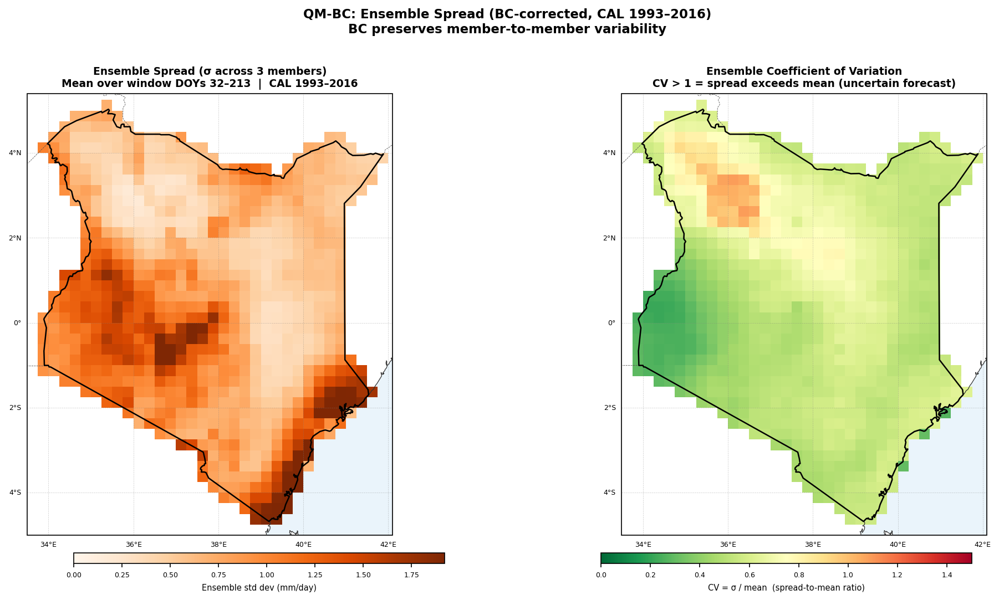

In [184]:
print("\nFig 5: Ensemble spread maps ...")

# Ensemble std dev: mean over CAL years, then std across members per DOY
bc_ens_std_daily = np.nanstd(
    np.nanmean(mf_bc[:, cal_mask_mf, :, :, :], axis=1),
    axis=0)    # (182, n_lat, n_lon): std across members
bc_ens_std_mean = np.nanmean(bc_ens_std_daily, axis=0)   # (n_lat, n_lon)
bc_ens_std_mean[~lm] = np.nan

fig5, axes5 = plt.subplots(1, 2, figsize=(15, 7),
                            subplot_kw={"projection": ccrs.PlateCarree()})

vmax5 = float(np.nanpercentile(bc_ens_std_mean[lm], 97))

_base_map(axes5[0])
im5a = _pcm(axes5[0], bc_ens_std_mean, "Oranges", 0, vmax5)
pos = axes5[0].get_position()
cax5a = fig5.add_axes([pos.x0, pos.y0-0.055, pos.width, 0.018])
cb5a  = fig5.colorbar(im5a, cax=cax5a, orientation="horizontal")
cb5a.set_label("Ensemble std dev (mm/day)", fontsize=7)
cb5a.ax.tick_params(labelsize=6)
axes5[0].set_title(
    "Ensemble Spread (σ across 3 members)\n"
    "Mean over window DOYs 32–213  |  CAL 1993–2016", fontsize=9)

# Spread-to-mean ratio (coefficient of variation)
cv = np.where(bc_spatial_mean > 0.05,
              bc_ens_std_mean / bc_spatial_mean, np.nan)
_base_map(axes5[1])
im5b = _pcm(axes5[1], cv, "RdYlGn_r", 0, 1.5)
pos = axes5[1].get_position()
cax5b = fig5.add_axes([pos.x0, pos.y0-0.055, pos.width, 0.018])
cb5b  = fig5.colorbar(im5b, cax=cax5b, orientation="horizontal")
cb5b.set_label("CV = σ / mean  (spread-to-mean ratio)", fontsize=7)
cb5b.ax.tick_params(labelsize=6)
axes5[1].set_title(
    "Ensemble Coefficient of Variation\n"
    "CV > 1 = spread exceeds mean (uncertain forecast)", fontsize=9)

fig5.suptitle(
    "QM-BC: Ensemble Spread (BC-corrected, CAL 1993–2016)\n"
    "BC preserves member-to-member variability",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout(rect=[0, 0.06, 1, 1])
_save(fig5, "mf_fig5_ensemble_spread")
plt.show()

## QQ Plots: SEAS5 BC vs CHIRPS (5 sites, CAL)


Fig 6: QQ plots ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3B_diagnostics\mf_fig6_qq_plots.png


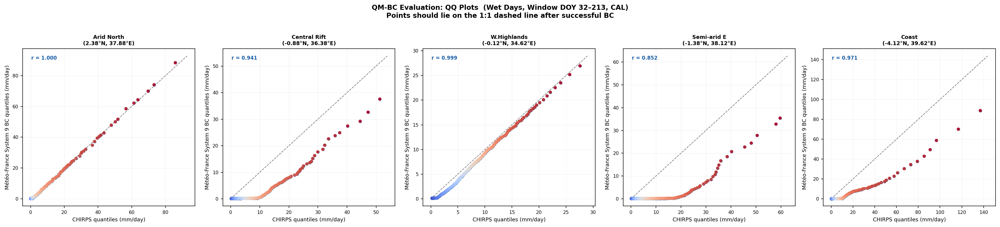

In [185]:
print("\nFig 6: QQ plots ...")

fig6, axes6 = plt.subplots(1, len(SITES), figsize=(4.5 * len(SITES), 5))

for ax, s in zip(axes6, SITES):
    ii, jj = s["i"], s["j"]

    # Collect all CAL wet days (within window) for CHIRPS and MF BC
    c_all, bc_all_vals = [], []
    for k in range(_nd_mf):
        doy = WIN_DOYS[k]
        cv  = da_chirps_daily[cal_mask_c, doy - 1, ii, jj]
        cv  = cv[~np.isnan(cv)]
        c_all.extend(cv[cv > WET_DAY_THRESH].tolist())

        bv  = mf_bc[:, cal_mask_mf, k, ii, jj].ravel()
        bv  = bv[~np.isnan(bv)]
        bc_all_vals.extend(bv[bv > WET_DAY_THRESH].tolist())

    c_all       = np.sort(c_all)
    bc_all_vals = np.sort(bc_all_vals)

    # Interpolate to common quantile axis
    n_q   = min(len(c_all), len(bc_all_vals), 200)
    q_lvl = np.linspace(0.01, 0.99, n_q)
    c_q   = np.quantile(c_all,       q_lvl) if len(c_all)       > 5 else None
    bc_q  = np.quantile(bc_all_vals, q_lvl) if len(bc_all_vals) > 5 else None

    if c_q is not None and bc_q is not None:
        vmax_qq = max(c_q.max(), bc_q.max()) * 1.05
        ax.plot([0, vmax_qq], [0, vmax_qq], color="black", lw=1.0,
                ls="--", alpha=0.50, label="1:1 line")
        ax.scatter(c_q, bc_q, color=COL_BC, s=18, alpha=0.75,
                   zorder=4, label="Météo-France System 9 BC vs CHIRPS")
        # Colour by quantile level
        ax.scatter(c_q, bc_q, c=q_lvl, cmap="coolwarm", s=18,
                   alpha=0.85, zorder=5)
        corr = float(np.corrcoef(c_q, bc_q)[0, 1])
        ax.text(0.05, 0.93, f"r = {corr:.3f}", transform=ax.transAxes,
                fontsize=8, color=COL_BC, fontweight="bold")
    ax.set_xlabel("CHIRPS quantiles (mm/day)", fontsize=8.5)
    ax.set_ylabel("Météo-France System 9 BC quantiles (mm/day)", fontsize=8.5)
    ax.set_title(f"{s['name']}\n"
                 f"({target_lat[ii]:.2f}°N, {target_lon[jj]:.2f}°E)",
                 fontsize=8.5)
    ax.grid(True, lw=0.3, alpha=0.35)
    ax.tick_params(labelsize=7.5)

fig6.suptitle(
    "QM-BC Evaluation: QQ Plots  (Wet Days, Window DOY 32–213, CAL)\n"
    "Points should lie on the 1:1 dashed line after successful BC",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout()
_save(fig6, "mf_fig6_qq_plots")
plt.show()


## Zonal Mean Profiles: CHIRPS vs MF BC (daily mean by latitude)


Fig 7: Zonal mean profiles ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3B_diagnostics\mf_fig7_zonal_mean_profiles.png


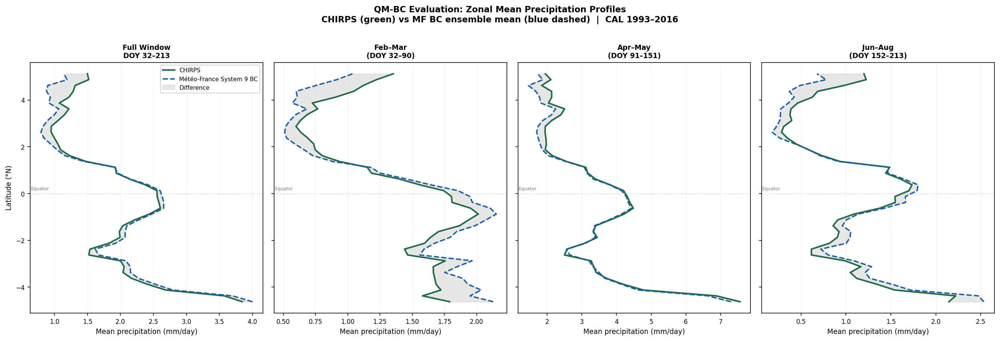

In [186]:
print("\nFig 7: Zonal mean profiles ...")

# Zonal mean (average over longitude for each latitude row, land only)
def _zonal_mean(arr2d):
    """Mean over lon for each lat, land pixels only."""
    out = np.full(n_lat, np.nan, np.float32)
    for i in range(n_lat):
        v = arr2d[i, lm[i, :]]
        out[i] = float(np.nanmean(v)) if v.size > 0 else np.nan
    return out

ch_zonal = _zonal_mean(chirps_spatial_mean)
bc_zonal = _zonal_mean(bc_spatial_mean)

# Also compute by 3 sub-windows: early MAM, peak MAM, late MAM
sub_windows = [
    ("Feb–Mar  (DOY 32–90)",   (WIN_DOYS >= 32)  & (WIN_DOYS <= 90)),
    ("Apr–May  (DOY 91–151)",  (WIN_DOYS >= 91)  & (WIN_DOYS <= 151)),
    ("Jun–Aug  (DOY 152–213)", (WIN_DOYS >= 152) & (WIN_DOYS <= 213)),
]

fig7, axes7 = plt.subplots(1, 4, figsize=(18, 6), sharey=True)

# Panel 0: full window
axes7[0].plot(ch_zonal, target_lat, color=COL_CHIRPS, lw=2.0,
              label="CHIRPS")
axes7[0].plot(bc_zonal, target_lat, color=COL_BC, lw=1.8, ls="--",
              label="Météo-France System 9 BC")
axes7[0].fill_betweenx(target_lat, ch_zonal, bc_zonal,
                        where=~np.isnan(ch_zonal) & ~np.isnan(bc_zonal),
                        color="#888888", alpha=0.20, label="Difference")
axes7[0].set_xlabel("Mean precipitation (mm/day)", fontsize=9)
axes7[0].set_ylabel("Latitude (°N)", fontsize=9)
axes7[0].set_title("Full Window\nDOY 32–213", fontsize=9)
axes7[0].legend(fontsize=7.5, framealpha=0.90)
axes7[0].grid(True, lw=0.3, alpha=0.35, axis="x")
axes7[0].tick_params(labelsize=8)

# Panels 1-3: sub-windows
for ax, (label, mask) in zip(axes7[1:], sub_windows):
    ch_sub = _zonal_mean(np.nanmean(chirps_win_clim[mask], axis=0))
    bc_sub = _zonal_mean(np.nanmean(bc_ens_mean_clim[mask], axis=0))
    ax.plot(ch_sub, target_lat, color=COL_CHIRPS, lw=2.0)
    ax.plot(bc_sub, target_lat, color=COL_BC, lw=1.8, ls="--")
    ax.fill_betweenx(target_lat, ch_sub, bc_sub,
                     where=~np.isnan(ch_sub) & ~np.isnan(bc_sub),
                     color="#888888", alpha=0.20)
    ax.set_xlabel("Mean precipitation (mm/day)", fontsize=9)
    ax.set_title(label.replace("  ", "\n"), fontsize=9)
    ax.grid(True, lw=0.3, alpha=0.35, axis="x")
    ax.tick_params(labelsize=8)

# Add equator reference
for ax in axes7:
    ax.axhline(0, color="gray", lw=0.7, ls=":", alpha=0.60)
    ax.text(ax.get_xlim()[0] * 1.01 if ax.get_xlim()[0] > 0 else 0.01,
            0.15, "Equator", fontsize=6, color="gray")

fig7.suptitle(
    "QM-BC Evaluation: Zonal Mean Precipitation Profiles\n"
    "CHIRPS (green) vs MF BC ensemble mean (blue dashed)  |  CAL 1993–2016",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout()
_save(fig7, "mf_fig7_zonal_mean_profiles")
plt.show()

## SUMMARY

In [187]:
print("Stage 3B Diagnostic Plots Complete")
print("="*65)
print(f"  Output : {DIAG_DIR}")
print()
print("  Fig 1 : Mean daily cycle  (CHIRPS vs MF BC, 5 sites)")
print("  Fig 2 : Empirical CDFs    (wet days, 5 sites × 3 DOY windows)")
print("  Fig 3 : Wet-day frequency (CHIRPS vs MF BC, 5 sites)")
print("  Fig 4 : Spatial bias maps (mean, absolute bias, relative bias %)")
print("  Fig 5 : Ensemble spread   (σ and CV across 3 members)")
print("  Fig 6 : QQ plots          (5 sites, wet days, CAL)")
print("  Fig 7 : Zonal mean profiles (full window + 3 sub-windows)")
print()

# Quick domain-level summary statistics
print("  Domain-level BC quality (CAL 1993-2016):")
print(f"    CHIRPS mean   : {np.nanmean(chirps_spatial_mean[lm]):.4f} mm/day")
print(f"    MF BC mean : {np.nanmean(bc_spatial_mean[lm]):.4f} mm/day")
print(f"    Domain bias   : {np.nanmean(abs_bias[lm]):+.4f} mm/day")
print(f"    Rel. bias     : {np.nanmean(rel_bias[lm]):+.2f} %")
print(f"    Spatial corr  : {float(np.corrcoef(chirps_spatial_mean[lm], bc_spatial_mean[lm])[0,1]):.4f}")

Stage 3B Diagnostic Plots Complete
  Output : C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage3B_diagnostics

  Fig 1 : Mean daily cycle  (CHIRPS vs MF BC, 5 sites)
  Fig 2 : Empirical CDFs    (wet days, 5 sites × 3 DOY windows)
  Fig 3 : Wet-day frequency (CHIRPS vs MF BC, 5 sites)
  Fig 4 : Spatial bias maps (mean, absolute bias, relative bias %)
  Fig 5 : Ensemble spread   (σ and CV across 3 members)
  Fig 6 : QQ plots          (5 sites, wet days, CAL)
  Fig 7 : Zonal mean profiles (full window + 3 sub-windows)

  Domain-level BC quality (CAL 1993-2016):
    CHIRPS mean   : 1.7713 mm/day
    MF BC mean : 1.7467 mm/day
    Domain bias   : -0.0269 mm/day
    Rel. bias     : -2.51 %
    Spatial corr  : nan


## Stage 4B MF — Dunning Detection on Bias-Corrected MF Data


In [188]:
print("Stage 4B MF: Dunning detection on bias-corrected Météo-France System 9 ...")
print(f"  Input shape   : {mf_bc.shape}  (members, years, days, lat, lon)")
print(f"  Years         : {mf_years[0]}–{mf_years[-1]}")
print(f"  Members       : {mf_bc.shape[0]}")
print(f"  Q_bar source  : CHIRPS CAL {CAL_YEARS[0]}–{CAL_YEARS[-1]}")
print(f"  Search buffer : +/-{DUNNING_BUFFER_DAYS} days around d_s/d_e")
print()

_nm_4b   = mf_bc.shape[0]
_ny_4b   = mf_bc.shape[1]
_nd_4b   = mf_bc.shape[2]


def _build_day2doy_mf(year):
    """Map MF forecast_period day index (0-based) to calendar DOY."""
    init    = datetime.date(year, MF_INIT_MONTH, MF_INIT_DAY)
    day2doy = np.zeros(_nd_4b, dtype=np.int32)
    for t in range(_nd_4b):
        day2doy[t] = (init + datetime.timedelta(days=t)).timetuple().tm_yday
    return day2doy


def _dunning_detect_mf(precip_1d, day2doy, Q_bar_px, ds_doy, de_doy):
    """Dunning detection — identical logic to mf/BOM, applied to MF member."""
    if np.isnan(ds_doy) or np.isnan(de_doy):
        return np.nan, np.nan, np.nan

    acc_start = int(ds_doy) - DUNNING_BUFFER_DAYS
    acc_end   = int(de_doy) + DUNNING_BUFFER_DAYS
    in_win    = (day2doy >= acc_start) & (day2doy <= acc_end)
    if not in_win.any():
        return np.nan, np.nan, np.nan

    win_idx = np.where(in_win)[0]
    n_w     = len(win_idx)
    A       = np.full(n_w, np.nan, np.float64)
    doys_w  = day2doy[win_idx]
    acc     = 0.0
    for k, t in enumerate(win_idx):
        v = float(precip_1d[t])
        if not np.isnan(v):
            acc   += v - float(Q_bar_px)
            A[k]   = acc

    if np.all(np.isnan(A)):
        return np.nan, np.nan, np.nan

    min_k     = int(np.nanargmin(A))
    onset_doy = int(doys_w[min_k]) + 1
    if onset_doy > acc_end:
        return np.nan, np.nan, np.nan

    post_k = min_k + 1
    if post_k >= n_w:
        return onset_doy, np.nan, np.nan
    A_post = A[post_k:]
    if np.all(np.isnan(A_post)):
        return onset_doy, np.nan, np.nan

    max_k    = post_k + int(np.nanargmax(A_post))
    cess_doy = int(doys_w[max_k])
    lgp      = cess_doy - onset_doy
    return onset_doy, cess_doy, lgp


# ── Output arrays ─────────────────────────────────────────────────────────
mf_onset_doy     = np.full((_nm_4b, _ny_4b, n_lat, n_lon), np.nan, np.float32)
mf_cessation_doy = np.full((_nm_4b, _ny_4b, n_lat, n_lon), np.nan, np.float32)
mf_lgp_days      = np.full((_nm_4b, _ny_4b, n_lat, n_lon), np.nan, np.float32)
land_pixels = np.argwhere(lm)

for yi, year in enumerate(mf_years):
    day2doy = _build_day2doy_mf(int(year))
    if (yi+1) % 5 == 0 or yi == 0:
        print(f"  {year}  ({yi+1}/{_ny_4b}) ...", flush=True)

    for m in range(_nm_4b):
        for (ii, jj) in land_pixels:
            pix = mf_bc[m, yi, :, ii, jj]
            on, cs, lgp = _dunning_detect_mf(
                pix, day2doy,
                float(Q_bar[ii, jj]),
                float(d_s[ii, jj]),
                float(d_e[ii, jj]))
            mf_onset_doy[m,     yi, ii, jj] = on
            mf_cessation_doy[m, yi, ii, jj] = cs
            mf_lgp_days[m,      yi, ii, jj] = lgp

print("Stage 4B MF detection complete ✓")


# ── QC summary ────────────────────────────────────────────────────────────
cal_mask_mf4b = np.isin(mf_years, CAL_YEARS)
val_mask_mf4b = np.isin(mf_years, VAL_YEARS)

Stage 4B MF: Dunning detection on bias-corrected Météo-France System 9 ...
  Input shape   : (31, 33, 182, 42, 34)  (members, years, days, lat, lon)
  Years         : 1993–2026
  Members       : 31
  Q_bar source  : CHIRPS CAL 1993–2016
  Search buffer : +/-50 days around d_s/d_e

  1993  (1/33) ...
  1997  (5/33) ...
  2002  (10/33) ...
  2007  (15/33) ...
  2012  (20/33) ...
  2017  (25/33) ...
  2022  (30/33) ...
Stage 4B MF detection complete ✓


In [189]:
# N_MEMBERS_MF = int(mf_onset_doy.shape[0])   # 3 hindcast, 11 operational
# _nd_bom       = int(mf_bc.shape[2])           # forecast days (182)
# print(f"  MF members (from array) : {N_MEMBERS_MF}")
# print(f"  MF forecast days        : {_nd_bom}")
 

## Detection Rate Fraction  with Valid Onset (member × CAL year × land pixel)

In [190]:
# Detection rate: fraction of (member × CAL year × land pixel) with valid onset
n_expected  = int(_nm_4b * cal_mask_mf4b.sum() * lm.sum())
n_detected  = int(np.sum(~np.isnan(mf_onset_doy[:, cal_mask_mf4b, :, :]
                                    [:, :, lm])))
dr_overall  = n_detected / n_expected if n_expected > 0 else 0.0

## Ensemble mean onset / cessation / LGP (domain mean across land pixels)

In [191]:
# ── QC Summary ─────────────────────────────────────────────────────────────
cal_mask_s4b = np.isin(mf_years, CAL_YEARS)

n_expected  = int(_nm_4b * cal_mask_s4b.sum() * lm.sum())
n_detected  = int(np.sum(~np.isnan(mf_onset_doy[:, cal_mask_s4b, :, :][:, :, lm])))
dr_overall  = n_detected / n_expected if n_expected > 0 else 0.0

on_cal_vals  = mf_onset_doy[:, cal_mask_s4b, :, :][:, :, lm]
on_cal_vals  = on_cal_vals[~np.isnan(on_cal_vals)]
cs_cal_vals  = mf_cessation_doy[:, cal_mask_s4b, :, :][:, :, lm]
cs_cal_vals  = cs_cal_vals[~np.isnan(cs_cal_vals)]
lgp_cal_vals = mf_lgp_days[:, cal_mask_s4b, :, :][:, :, lm]
lgp_cal_vals = lgp_cal_vals[~np.isnan(lgp_cal_vals)]

print(f"\n  ── Stage 4B MF QC Summary ──────────────────────────")
print(f"  Detection rate (CAL, all members): {dr_overall:.3f}")
print(f"  CAL ensemble mean onset     : DOY {np.nanmean(on_cal_vals):.1f}"
      f"  (≈ {_doy_to_date(np.nanmean(on_cal_vals))})")
print(f"  CAL ensemble mean cessation : DOY {np.nanmean(cs_cal_vals):.1f}"
      f"  (≈ {_doy_to_date(np.nanmean(cs_cal_vals))})")
print(f"  CAL ensemble mean LGP       : {np.nanmean(lgp_cal_vals):.1f} days")



  ── Stage 4B MF QC Summary ──────────────────────────
  Detection rate (CAL, all members): 0.778
  CAL ensemble mean onset     : DOY 94.2  (≈ 03 Apr)
  CAL ensemble mean cessation : DOY 137.0  (≈ 16 May)
  CAL ensemble mean LGP       : 44.5 days


## Compare with CHIRPS CAL means

In [192]:

print(f"\n  ── Comparison vs CHIRPS CAL ─────────────────────────")
chirps_on_cal  = chirps_onset_doy[cal_mask_c, :, :][:, lm]
chirps_cs_cal  = chirps_cessation_doy[cal_mask_c, :, :][:, lm]
chirps_lgp_cal = chirps_lgp_days[cal_mask_c, :, :][:, lm]
print(f"  CHIRPS CAL mean onset     : DOY {np.nanmean(chirps_on_cal):.1f}"
      f"  (≈ {_doy_to_date(np.nanmean(chirps_on_cal))})")
print(f"  CHIRPS CAL mean cessation : DOY {np.nanmean(chirps_cs_cal):.1f}"
      f"  (≈ {_doy_to_date(np.nanmean(chirps_cs_cal))})")
print(f"  CHIRPS CAL mean LGP       : {np.nanmean(chirps_lgp_cal):.1f} days")
print(f"\n  MF − CHIRPS onset bias : "
      f"{np.nanmean(on_cal_vals) - np.nanmean(chirps_on_cal):+.1f} days")
print(f"  MF − CHIRPS cess bias  : "
      f"{np.nanmean(cs_cal_vals) - np.nanmean(chirps_cs_cal):+.1f} days")
print(f"  MF − CHIRPS LGP bias   : "
      f"{np.nanmean(lgp_cal_vals) - np.nanmean(chirps_lgp_cal):+.1f} days")
print(f"  ─────────────────────────────────────────────────────")


  ── Comparison vs CHIRPS CAL ─────────────────────────
  CHIRPS CAL mean onset     : DOY 86.7  (≈ 27 Mar)
  CHIRPS CAL mean cessation : DOY 132.4  (≈ 11 May)
  CHIRPS CAL mean LGP       : 45.7 days

  MF − CHIRPS onset bias : +7.5 days
  MF − CHIRPS cess bias  : +4.6 days
  MF − CHIRPS LGP bias   : -1.2 days
  ─────────────────────────────────────────────────────


## Saving the outputs

In [193]:
print(f"\n  Saving Stage 4B MF outputs ...")
_coords_4b = {
    "member" : np.arange(1, _nm_4b + 1),
    "year"   : mf_years,
    "lat"    : target_lat,
    "lon"    : target_lon,
}
_buf_str = f"[d_s - {DUNNING_BUFFER_DAYS}, d_e + {DUNNING_BUFFER_DAYS}] DOY"

for arr, path, long_name, units_attr in [
    (mf_onset_doy,     OUT_MF_ONSET, "Météo-France System 9 onset DOY (Dunning)",     "day of year"),
    (mf_cessation_doy, OUT_MF_CESS,  "Météo-France System 9 cessation DOY (Dunning)", "day of year"),
    (mf_lgp_days,      OUT_MF_LGP,   "Météo-France System 9 LGP (Dunning)",           "days"),
]:
    xr.DataArray(arr, dims=["member","year","lat","lon"],
                 coords=_coords_4b,
                 attrs={
                     "long_name"      : long_name,
                     "units"          : units_attr,
                     "Q_bar_source"   : f"CHIRPS CAL {CAL_YEARS[0]}-{CAL_YEARS[-1]}",
                     "search_window"  : _buf_str,
                     "system_version" : SYSTEM_VERSION,
                 }).to_netcdf(path)

print(f"  Saved onset     -> {OUT_MF_ONSET}")
print(f"  Saved cessation -> {OUT_MF_CESS}")
print(f"  Saved LGP       -> {OUT_MF_LGP}")
print(f"\nStage 4B MF complete ✓")
print(f"  mf_onset_doy     : {mf_onset_doy.shape}")
print(f"  mf_cessation_doy : {mf_cessation_doy.shape}")
print(f"  mf_lgp_days      : {mf_lgp_days.shape}")
print(f"\nReady for Stage 5 MF — Probability Estimation")



  Saving Stage 4B MF outputs ...
  Saved onset     -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\MF_onset_doy_all_years.nc
  Saved cessation -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\MF_cessation_doy_all_years.nc
  Saved LGP       -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\MF_lgp_days_all_years.nc

Stage 4B MF complete ✓
  mf_onset_doy     : (31, 33, 42, 34)
  mf_cessation_doy : (31, 33, 42, 34)
  mf_lgp_days      : (31, 33, 42, 34)

Ready for Stage 5 MF — Probability Estimation


---

## STAGE 4B — DIAGNOSTIC PLOTS

> **Inputs required from Stage 4B detection (above):**
> `mf_onset_doy`, `mf_cessation_doy`, `mf_lgp_days` — all shape `(3, 27, 42, 34)`

Eight diagnostic figures evaluating MF Dunning detection against CHIRPS:

| Figure | Content |
|--------|---------|
| Fig 1  | 4-panel spatial maps: MF ens-mean vs CHIRPS CAL mean (onset / cessation / LGP / detection rate) |
| Fig 2  | Bias maps: MF − CHIRPS for onset, cessation, LGP |
| Fig 3  | Interannual domain-mean time series with ensemble spread (1981–2026) |
| Fig 4  | Rank histograms (Talagrand) — ensemble reliability |
| Fig 5  | Spread-skill relationship (ensemble σ vs MAE per pixel) |
| Fig 6  | Detection rate comparison maps (CHIRPS vs Météo-France System 9) |
| Fig 7  | Year-by-year scatter at 5 representative sites |


## DIAGNOSTIC PLOTS of MF Dunning Detection vs CHIRPS Ground Truth

- Assumes in namespace:
  - mf_onset_doy, mf_cessation_doy, mf_lgp_days (25,46,42,34)
  - chirps_onset_doy, chirps_cessation_doy, chirps_lgp_days (n_yrs,42,34)


- Eight figures:
    - Fig 1 — 4-panel: MF ens-mean vs CHIRPS mean (onset/cess/LGP/det.rate)
    
    - Fig 2 — Bias maps: (Météo-France System 9 ens-mean − CHIRPS) for onset, cessation, LGP
   
    - Fig 3 — Interannual time series with ensemble spread (1981–2026)

    - Fig 4 — Rank histograms (Talagrand) — ensemble reliability
    
    - Fig 5 — Ensemble spread vs RMSE scatter (spread-skill relationship)

    - Fig 6 — Site-level A(D) plume: ensemble members at 3 representative years

    - Fig 7 — Detection rate map (SEAS5 vs CHIRPS)
    
    - Fig 8 — Scatter: MF ensemble mean vs CHIRPS year-by-year (5 sites)

In [194]:
plt.rcParams.update({
    "figure.dpi"       : 150,
    "figure.facecolor" : "white",
    "font.family"      : "DejaVu Sans",
    "font.size"        : 10,
    "axes.titlesize"   : 10,
    "axes.titleweight" : "bold",
    "axes.labelsize"   : 9,
    "savefig.bbox"     : "tight",
    "savefig.dpi"      : 150,
})

DIAG_DIR = os.path.join(PLOT_DIR, "stage4B_diagnostics")
os.makedirs(DIAG_DIR, exist_ok=True)

# ── Colours ────────────────────────────────────────────────────────────────
COL_CHIRPS  = "#1E6B45"
COL_MF   = "#1B5EA6"
COL_SPREAD  = "#92680A"
COL_CAL_BG  = "#0B1F3A"
COL_VAL_BG  = "#FF8800"

# ── Masks ──────────────────────────────────────────────────────────────────
cal_mask_mf = np.isin(mf_years,  CAL_YEARS)
val_mask_mf = np.isin(mf_years,  VAL_YEARS)
cal_mask_c = np.isin(chirps_years, CAL_YEARS)

# ── Helpers ────────────────────────────────────────────────────────────────
def _doy_to_date(doy, year=2000):
    try:
        return (datetime.date(year, 1, 1) +
                datetime.timedelta(days=int(round(float(doy))) - 1)
                ).strftime("%d %b")
    except Exception:
        return "?"

def _save(fig, name):
    p = os.path.join(DIAG_DIR, f"{name}.png")
    fig.savefig(p, bbox_inches="tight", dpi=150)
    print(f"  Saved -> {p}")

def _pcm(ax, data2d, cmap, vmin, vmax):
    masked   = np.ma.array(data2d, mask=np.isnan(data2d))
    lon_edge = np.append(target_lon - 0.125, target_lon[-1] + 0.125)
    lat_edge = np.append(target_lat - 0.125, target_lat[-1] + 0.125)
    LON, LAT = np.meshgrid(lon_edge, lat_edge)
    return ax.pcolormesh(LON, LAT, masked, cmap=cmap,
                         vmin=vmin, vmax=vmax,
                         transform=ccrs.PlateCarree(),
                         zorder=1, shading="flat")

def _base_map(ax, labels=True):
    ax.set_extent([33.5, 42.1, -5.0, 5.4], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.OCEAN,     facecolor="#EAF4FB", zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6,
                   edgecolor="#333", zorder=3)
    ax.add_feature(cfeature.BORDERS,   linewidth=0.4, linestyle="--",
                   edgecolor="#555", zorder=3)
    kenya_shp.boundary.plot(ax=ax, linewidth=1.2, edgecolor="black",
                            transform=ccrs.PlateCarree(), zorder=4)
    gl = ax.gridlines(draw_labels=labels, linewidth=0.35,
                      color="gray", alpha=0.4, linestyle="--")
    gl.top_labels   = False
    gl.right_labels = False
    gl.xlocator     = mticker.FixedLocator([34, 36, 38, 40, 42])
    gl.ylocator     = mticker.FixedLocator([-4, -2, 0, 2, 4])
    gl.xlabel_style = {"size": 6}
    gl.ylabel_style = {"size": 6}

def _hcbar(fig, im, ax, label, nticks=5, fmt=None):
    pos = ax.get_position()
    cax = fig.add_axes([pos.x0, pos.y0-0.05, pos.width, 0.016])
    cb  = fig.colorbar(im, cax=cax, orientation="horizontal")
    cb.set_label(label, fontsize=7)
    cb.ax.tick_params(labelsize=5.5)
    if fmt:
        tks = np.linspace(cb.vmin, cb.vmax, nticks).astype(int)
        cb.set_ticks(tks)
        cb.set_ticklabels([fmt(t) for t in tks], fontsize=5.5)
    return cb

def _dmean(arr3d):
    """Domain mean over land pixels per year."""
    out = np.full(arr3d.shape[0], np.nan)
    for yi in range(arr3d.shape[0]):
        v = arr3d[yi][lm]
        v = v[~np.isnan(v)]
        out[yi] = np.nanmean(v) if len(v) > 0 else np.nan
    return out

# ── Representative pixels ─────────────────────────────────────────────────
SITES = [
    {"name": "Arid North",   "lat":  2.30, "lon": 38.00, "col": "#E05C3A"},
    {"name": "Central Rift", "lat": -0.80, "lon": 36.43, "col": "#1B5EA6"},
    {"name": "W.Highlands",  "lat": -0.10, "lon": 34.75, "col": "#1E6B45"},
    {"name": "Semi-arid E",  "lat": -1.37, "lon": 38.01, "col": "#92680A"},
    {"name": "Coast",        "lat": -4.05, "lon": 39.65, "col": "#5B21B6"},
]
for s in SITES:
    li = np.argwhere(lm)
    la = target_lat[li[:,0]]; lo = target_lon[li[:,1]]
    b  = int(np.argmin((la-s["lat"])**2+(lo-s["lon"])**2))
    s["i"], s["j"] = int(li[b,0]), int(li[b,1])

# ── Pre-compute key arrays ─────────────────────────────────────────────────
nm_mf = mf_onset_doy.shape[0]

# MF ensemble mean over CAL years per pixel
mf_on_ens_mean  = np.where(lm, np.nanmean(
    mf_onset_doy[:, cal_mask_mf].reshape(-1, n_lat, n_lon), axis=0), np.nan)
mf_cs_ens_mean  = np.where(lm, np.nanmean(
    mf_cessation_doy[:, cal_mask_mf].reshape(-1, n_lat, n_lon), axis=0), np.nan)
mf_lgp_ens_mean = np.where(lm, np.nanmean(
    mf_lgp_days[:, cal_mask_mf].reshape(-1, n_lat, n_lon), axis=0), np.nan)

# CHIRPS CAL mean per grid cell
ch_on_mean  = np.where(lm, np.nanmean(
    chirps_onset_doy[cal_mask_c], axis=0), np.nan)
ch_cs_mean  = np.where(lm, np.nanmean(
    chirps_cessation_doy[cal_mask_c], axis=0), np.nan)
ch_lgp_mean = np.where(lm, np.nanmean(
    chirps_lgp_days[cal_mask_c], axis=0), np.nan)

# Bias maps (Météo-France System 9 ens-mean − CHIRPS)
bias_on  = mf_on_ens_mean  - ch_on_mean
bias_cs  = mf_cs_ens_mean  - ch_cs_mean
bias_lgp = mf_lgp_ens_mean - ch_lgp_mean

# MF detection rate per grid cell (CAL)
n_cal_mf  = int(cal_mask_mf.sum())
mf_dr = np.full((n_lat, n_lon), np.nan, np.float32)
for i in range(n_lat):
    for j in range(n_lon):
        if not lm[i,j]: continue
        n_det = np.sum(~np.isnan(
            mf_onset_doy[:, cal_mask_mf, i, j].ravel()))
        mf_dr[i,j] = n_det / (nm_mf * n_cal_mf)

# Domain-mean time series: MF ensemble mean per year
ts_mf_on_ymean  = np.nanmean(
    np.nanmean(mf_onset_doy[:,:,lm],     axis=2), axis=0)  # (46,)
ts_mf_cs_ymean  = np.nanmean(
    np.nanmean(mf_cessation_doy[:,:,lm], axis=2), axis=0)
ts_mf_lgp_ymean = np.nanmean(
    np.nanmean(mf_lgp_days[:,:,lm],      axis=2), axis=0)

# Ensemble spread per year (std across 25 members)
ts_mf_on_spread  = np.nanmean(
    np.nanstd(mf_onset_doy[:,:,lm],      axis=0), axis=1)  # (46,)
ts_mf_cs_spread  = np.nanmean(
    np.nanstd(mf_cessation_doy[:,:,lm],  axis=0), axis=1)
ts_mf_lgp_spread = np.nanmean(
    np.nanstd(mf_lgp_days[:,:,lm],       axis=0), axis=1)

# CHIRPS domain-mean time series
ts_ch_on  = _dmean(chirps_onset_doy)
ts_ch_cs  = _dmean(chirps_cessation_doy)
ts_ch_lgp = _dmean(chirps_lgp_days)

yrs_mf = mf_years.astype(float)
yrs_ch = chirps_years.astype(float)

print("Pre-computation complete. Drawing figures ...")


Pre-computation complete. Drawing figures ...


## MF ens-mean vs CHIRPS (spatial maps)

  Fig 1: S vs CHIRPS mean spatial maps ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage4B_diagnostics\fig1_mf_vs_chirps_means.png


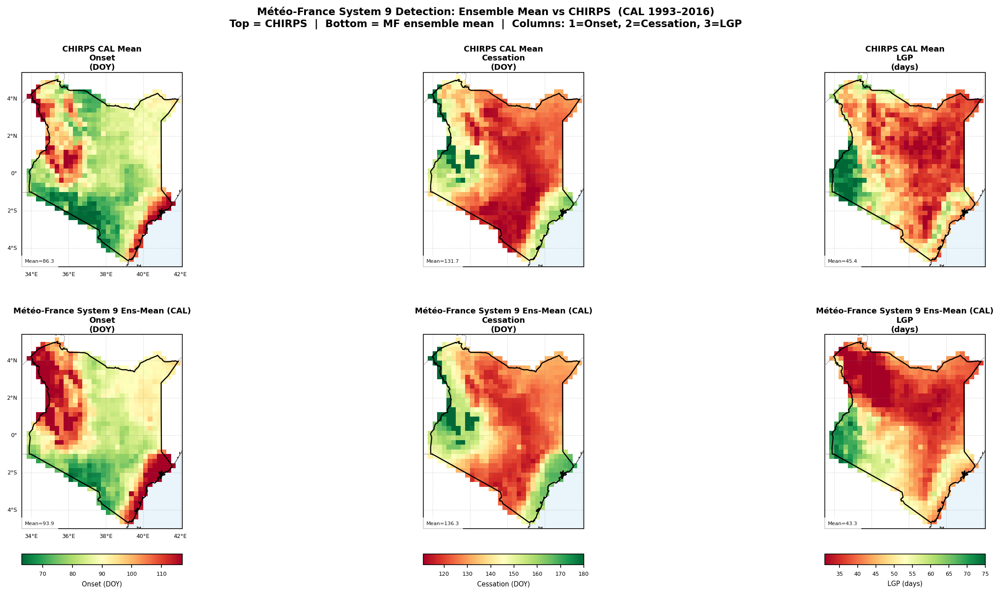

In [195]:
print("  Fig 1: S vs CHIRPS mean spatial maps ...")

# 2 rows x 3 columns (Onset, Cessation, LGP) – no detection-rate panel
fig1, axes1 = plt.subplots(
    2, 3, figsize=(18, 9),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# store one mappable per column (from CHIRPS row) for shared colorbars
col_ims = [None, None, None]
col_labels = ["Onset (DOY)", "Cessation (DOY)", "LGP (days)"]

rows = [
    ("CHIRPS CAL Mean",        ch_on_mean,  ch_cs_mean,  ch_lgp_mean),
    ("Météo-France System 9 Ens-Mean (CAL)",   mf_on_ens_mean, mf_cs_ens_mean, mf_lgp_ens_mean),
]

for row_idx, (row_label, on_arr, cs_arr, lgp_arr) in enumerate(rows):
    # Use CHIRPS climatology to set consistent color scales
    vmin_on  = int(np.nanpercentile(ch_on_mean[lm],  3))
    vmax_on  = int(np.nanpercentile(ch_on_mean[lm], 97))
    vmin_cs  = int(np.nanpercentile(ch_cs_mean[lm],  3))
    vmax_cs  = int(np.nanpercentile(ch_cs_mean[lm], 97))
    vmin_lgp = int(np.nanpercentile(ch_lgp_mean[lm], 3))
    vmax_lgp = int(np.nanpercentile(ch_lgp_mean[lm], 97))

    panels = [
        (on_arr,  "RdYlGn_r", vmin_on,  vmax_on,  "Onset\n(DOY)",
         lambda d: f"DOY{d}\n{_doy_to_date(d)}"),
        (cs_arr,  "RdYlGn",   vmin_cs,  vmax_cs,  "Cessation\n(DOY)",
         lambda d: f"DOY{d}\n{_doy_to_date(d)}"),
        (lgp_arr, "RdYlGn",   vmin_lgp, vmax_lgp, "LGP\n(days)",
         lambda d: f"{d}d"),
    ]

    for col_idx, (arr, cmap, vmin, vmax, title, fmt) in enumerate(panels):
        ax = axes1[row_idx, col_idx]
        _base_map(ax, labels=(col_idx == 0))

        if not np.all(np.isnan(arr)):
            im = _pcm(ax, arr, cmap, float(vmin), float(vmax))
            # keep the mappable from the CHIRPS row to build shared colorbars
            if row_idx == 0:
                col_ims[col_idx] = im

        ax.set_title(f"{row_label}\n{title}", fontsize=8.5, pad=3)

        mn_v = np.nanmean(arr[lm]) if not np.all(np.isnan(arr)) else np.nan
        if not np.isnan(mn_v):
            ax.text(
                0.02, 0.02, f"Mean={mn_v:.1f}",
                transform=ax.transAxes,
                fontsize=5.5, color="#111",
                bbox=dict(fc="white", alpha=0.80, lw=0)
            )

# Adjust layout before placing colorbars
fig1.subplots_adjust(
    left=0.05, right=0.98,
    bottom=0.12, top=0.88,
    wspace=0.28, hspace=0.35
)

# One horizontal colorbar per column, under the bottom row only
for col_idx, (im, label) in enumerate(zip(col_ims, col_labels)):
    if im is None:
        continue
    ax = axes1[1, col_idx]  # bottom-row axis for this column
    pos = ax.get_position()
    cax = fig1.add_axes([pos.x0, pos.y0 - 0.06, pos.width, 0.018])
    cb = fig1.colorbar(im, cax=cax, orientation="horizontal")
    cb.set_label(label, fontsize=7)
    cb.ax.tick_params(labelsize=6)

fig1.suptitle(
    "Météo-France System 9 Detection: Ensemble Mean vs CHIRPS  (CAL 1993–2016)\n"
    "Top = CHIRPS  |  Bottom = MF ensemble mean  |  "
    "Columns: 1=Onset, 2=Cessation, 3=LGP",
    fontsize=11, fontweight="bold", y=0.99,
)

_save(fig1, "fig1_mf_vs_chirps_means")
plt.show()

## Bias Maps: MF ens-mean − CHIRPS

  Fig 2: Bias maps ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage4B_diagnostics\mf_fig2_bias_maps.png


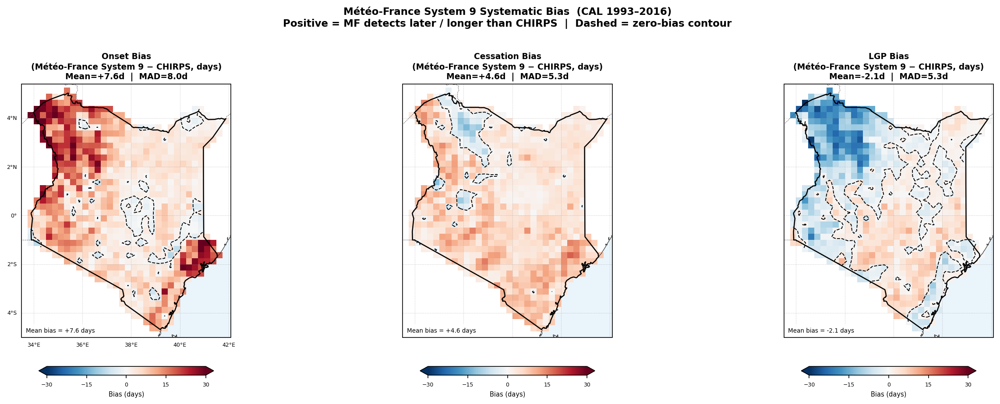

In [196]:
# =============================================================================
# FIG 2 — Bias Maps: SEAS5 ens-mean − CHIRPS
# =============================================================================
print("  Fig 2: Bias maps ...")

bias_vmax = max(
    np.nanpercentile(np.abs(bias_on[lm]),  97),
    np.nanpercentile(np.abs(bias_cs[lm]),  97),
    np.nanpercentile(np.abs(bias_lgp[lm]), 97))
bias_vmax = float(np.ceil(bias_vmax / 5) * 5)

fig2, axes2 = plt.subplots(1, 3, figsize=(18, 6.5),
                            subplot_kw={"projection": ccrs.PlateCarree()})

for ax, arr, title, unit in [
    (axes2[0], bias_on,  "Onset Bias\n(Météo-France System 9 − CHIRPS, days)", "days"),
    (axes2[1], bias_cs,  "Cessation Bias\n(Météo-France System 9 − CHIRPS, days)", "days"),
    (axes2[2], bias_lgp, "LGP Bias\n(Météo-France System 9 − CHIRPS, days)", "days"),
]:
    _base_map(ax, labels=(ax is axes2[0]))
    im = _pcm(ax, arr, "RdBu_r", -bias_vmax, bias_vmax)
    # Zero contour
    ax.contour(target_lon, target_lat,
               np.where(lm, arr, np.nan),
               levels=[0], colors=["black"],
               linewidths=[0.9], linestyles=["--"],
               transform=ccrs.PlateCarree(), zorder=5)

    # Axis-attached horizontal colorbar aligned with this panel
    cb = fig2.colorbar(im, ax=ax, orientation="horizontal",
                       fraction=0.03, pad=0.10, extend="both")
    cb.set_label(f"Bias ({unit})", fontsize=7)
    cb.ax.tick_params(labelsize=6)
    cb.set_ticks(np.linspace(-bias_vmax, bias_vmax, 5).astype(int))

    mn  = float(np.nanmean(arr[lm]))
    mad = float(np.nanmean(np.abs(arr[lm])))
    ax.set_title(f"{title}\nMean={mn:+.1f}d  |  MAD={mad:.1f}d", fontsize=9)
    ax.text(0.02, 0.02, f"Mean bias = {mn:+.1f} days",
            transform=ax.transAxes, fontsize=6.5,
            bbox=dict(fc="white", alpha=0.85, lw=0))

fig2.suptitle(
    "Météo-France System 9 Systematic Bias  (CAL 1993–2016)\n"
    "Positive = MF detects later / longer than CHIRPS  |  "
    "Dashed = zero-bias contour",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout(rect=[0, 0.07, 1, 1])
_save(fig2, "mf_fig2_bias_maps")
plt.show()

## Interannual Time Series with Ensemble Spread (1981–2026)

  Fig 3: Interannual time series with ensemble spread ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage4B_diagnostics\mf_fig3_interannual_timeseries.png


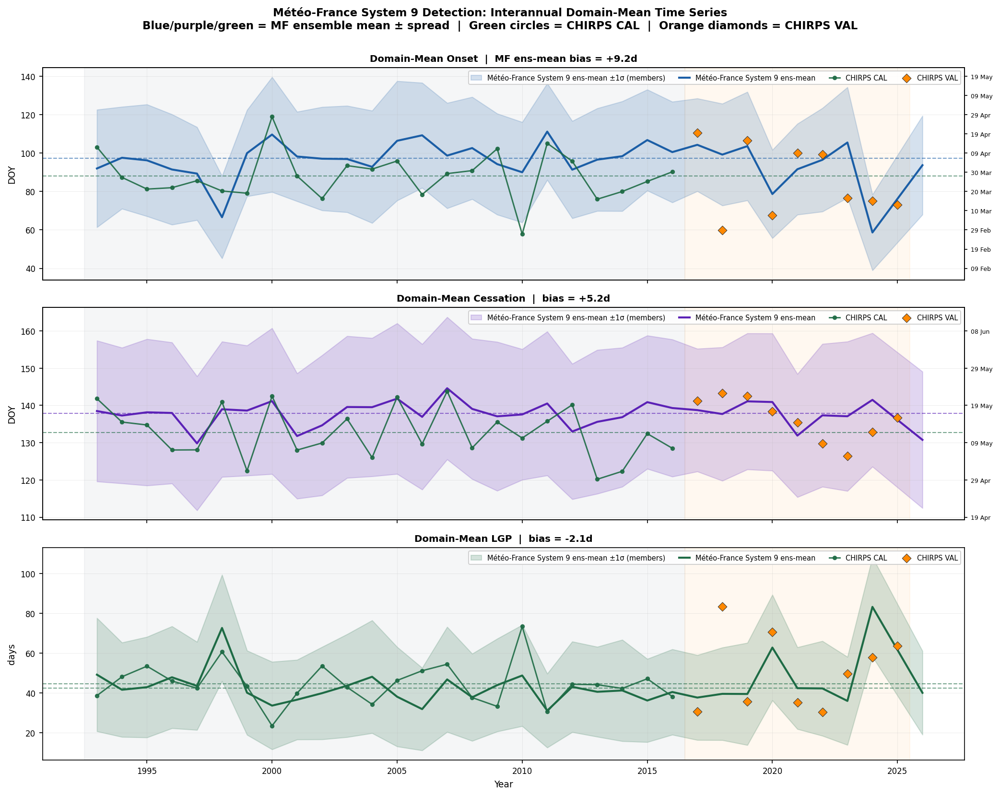

In [197]:
print("  Fig 3: Interannual time series with ensemble spread ...")

fig3, axes3 = plt.subplots(3, 1, figsize=(14, 11), sharex=True)

for ax, ts_mf, ts_spread, ts_ch, col_c, ylabel, title_s, unit in [
    (axes3[0], ts_mf_on_ymean,  ts_mf_on_spread,  ts_ch_on,
     "#1B5EA6", "DOY",
     f"Domain-Mean Onset  |  MF ens-mean bias = "
     f"{np.nanmean(ts_mf_on_ymean[cal_mask_mf]-ts_ch_on[cal_mask_c]):+.1f}d",
     "DOY"),
    (axes3[1], ts_mf_cs_ymean,  ts_mf_cs_spread,  ts_ch_cs,
     "#5B21B6", "DOY",
     f"Domain-Mean Cessation  |  bias = "
     f"{np.nanmean(ts_mf_cs_ymean[cal_mask_mf]-ts_ch_cs[cal_mask_c]):+.1f}d",
     "DOY"),
    (axes3[2], ts_mf_lgp_ymean, ts_mf_lgp_spread, ts_ch_lgp,
     "#1E6B45", "days",
     f"Domain-Mean LGP  |  bias = "
     f"{np.nanmean(ts_mf_lgp_ymean[cal_mask_mf]-ts_ch_lgp[cal_mask_c]):+.1f}d",
     "days"),
]:
    ax.axvspan(CAL_YEARS[0]-0.5, CAL_YEARS[-1]+0.5,
               color=COL_CAL_BG, alpha=0.04)
    ax.axvspan(VAL_YEARS[0]-0.5, VAL_YEARS[-1]+0.5,
               color=COL_VAL_BG, alpha=0.06)

    # Ensemble spread band
    ax.fill_between(yrs_mf,
                    ts_mf - ts_spread, ts_mf + ts_spread,
                    color=col_c, alpha=0.18, zorder=1,
                    label="Météo-France System 9 ens-mean ±1σ (members)")

    # MF ensemble mean
    ax.plot(yrs_mf, ts_mf,
            color=col_c, lw=2.0, zorder=4,
            label=f"Météo-France System 9 ens-mean")

    # CHIRPS
    ax.plot(yrs_ch[cal_mask_c], ts_ch[cal_mask_c],
            "o-", color=COL_CHIRPS, ms=3.5, lw=1.4,
            alpha=0.90, zorder=5, label="CHIRPS CAL")
    ax.scatter(yrs_ch[np.isin(chirps_years, VAL_YEARS)],
               ts_ch[np.isin(chirps_years, VAL_YEARS)],
               color=COL_VAL_BG, s=40, marker="D",
               edgecolors="#333", linewidths=0.5,
               zorder=6, label="CHIRPS VAL")

    # CAL means
    mf_cal_mn = float(np.nanmean(ts_mf[cal_mask_mf]))
    ch_cal_mn = float(np.nanmean(ts_ch[cal_mask_c]))
    ax.axhline(mf_cal_mn, color=col_c,    lw=1.0, ls="--", alpha=0.60)
    ax.axhline(ch_cal_mn, color=COL_CHIRPS, lw=1.0, ls="--", alpha=0.60)

    ax.set_ylabel(ylabel, fontsize=9)
    ax.set_title(title_s, fontsize=9.5)
    ax.grid(True, lw=0.3, alpha=0.35)
    ax.tick_params(labelsize=8)
    ax.legend(fontsize=7, loc="upper right", framealpha=0.88,
              ncol=4, handlelength=1.5)

    # Secondary date axis for DOY panels
    if unit == "DOY":
        ax2r = ax.twinx()
        ylim2 = ax.get_ylim()
        td = np.arange(int(ylim2[0])//10*10,
                       int(ylim2[1])//10*10+10, 10)
        td = td[(td >= ylim2[0]) & (td <= ylim2[1])]
        ax2r.set_ylim(ylim2)
        ax2r.set_yticks(td)
        ax2r.set_yticklabels([_doy_to_date(d) for d in td], fontsize=6)
        ax2r.tick_params(axis="y", length=3)

axes3[-1].set_xlabel("Year", fontsize=9)
fig3.suptitle(
    "Météo-France System 9 Detection: Interannual Domain-Mean Time Series\n"
    "Blue/purple/green = MF ensemble mean ± spread  |  "
    "Green circles = CHIRPS CAL  |  Orange diamonds = CHIRPS VAL",
    fontsize=11, fontweight="bold", y=1.002)
plt.tight_layout()
_save(fig3, "mf_fig3_interannual_timeseries")
plt.show()

## Rank Histograms (Talagrand) — Ensemble Reliability

  Fig 4: Rank histograms ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage4B_diagnostics\mf_fig4_rank_histograms.png


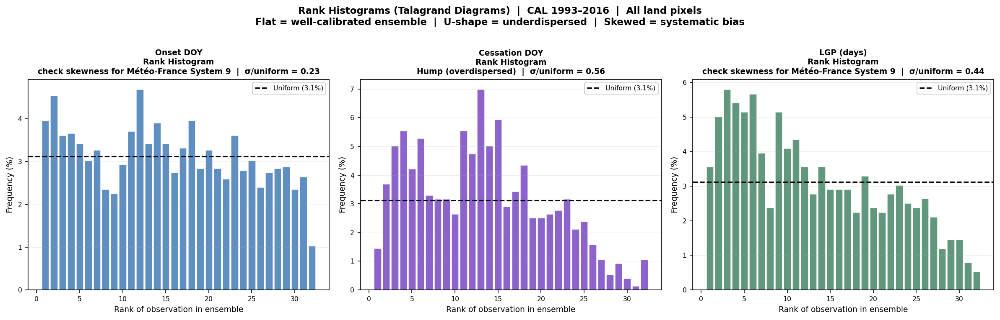

In [198]:

print("  Fig 4: Rank histograms ...")

def _rank_histogram(obs_1d, ens_2d):
    """
    Compute rank histogram for a set of observations and ensemble forecasts.
    obs_1d  : (n_cases,)
    ens_2d  : (n_members, n_cases)
    Returns ranks (1..n_members+1) histogram counts.
    """
    n_members, n_cases = ens_2d.shape
    ranks = np.zeros(n_members + 1, dtype=int)
    for t in range(n_cases):
        o = obs_1d[t]
        e = ens_2d[:, t]
        if np.isnan(o) or np.any(np.isnan(e)):
            continue
        rank = int(np.sum(e < o))   # 0-based rank → 0..n_members
        ranks[rank] += 1
    return ranks

fig4, axes4 = plt.subplots(1, 3, figsize=(16, 5))

n_mem = _nm_mf
ideal_count_pct = 100.0 / (n_mem + 1)

for ax, s5_arr, ch_arr, title, col_c in [
    (axes4[0], mf_onset_doy,     chirps_onset_doy,
     "Onset DOY\nRank Histogram", "#1B5EA6"),
    (axes4[1], mf_cessation_doy, chirps_cessation_doy,
     "Cessation DOY\nRank Histogram", "#5B21B6"),
    (axes4[2], mf_lgp_days,      chirps_lgp_days,
     "LGP (days)\nRank Histogram", "#1E6B45"),
]:
    # Collect all land pixels over CAL years
    obs_list = []
    ens_list = []
    for i in range(n_lat):
        for j in range(n_lon):
            if not lm[i,j]: continue
            # Align SEAS5 and CHIRPS CAL years
            for si, yr in enumerate(mf_years):
                if yr not in CAL_YEARS:
                    continue
                ci = np.where(chirps_years == yr)[0]
                if len(ci) == 0: continue
                ci = int(ci[0])
                o = float(ch_arr[ci, i, j])
                e = s5_arr[:, si, i, j]
                if np.isnan(o) or np.all(np.isnan(e)):
                    continue
                obs_list.append(o)
                ens_list.append(e)

    if len(obs_list) < 10:
        ax.text(0.5, 0.5, "Insufficient data",
                ha="center", va="center", transform=ax.transAxes)
        continue

    obs_arr = np.array(obs_list)
    ens_arr = np.array(ens_list).T    # (n_members, n_cases)
    ranks   = _rank_histogram(obs_arr, ens_arr)
    rank_pct = 100.0 * ranks / max(ranks.sum(), 1)

    ax.bar(np.arange(1, n_mem+2), rank_pct,
           color=col_c, alpha=0.70, edgecolor="white", linewidth=0.3)
    ax.axhline(ideal_count_pct, color="black", lw=1.5, ls="--",
               label=f"Uniform ({ideal_count_pct:.1f}%)")

    # Diagnose shape
    u_stat = float(np.std(rank_pct) / ideal_count_pct)
    if rank_pct[0] > rank_pct[n_mem//2] and rank_pct[-1] > rank_pct[n_mem//2]:
        shape = "U-shape (underdispersed)"
    elif rank_pct[0] < rank_pct[n_mem//2] and rank_pct[-1] < rank_pct[n_mem//2]:
        shape = "Hump (overdispersed)"
    elif rank_pct[0] > rank_pct[-1] * 1.3:
        shape = "check skewness for Météo-France System 9"
    elif rank_pct[-1] > rank_pct[0] * 1.3:
        shape = "Right-skewed (SEAS5 low bias)"
    else:
        shape = "Near-uniform (well calibrated)"

    ax.set_xlabel("Rank of observation in ensemble", fontsize=9)
    ax.set_ylabel("Frequency (%)", fontsize=9)
    ax.set_title(f"{title}\n{shape}  |  σ/uniform = {u_stat:.2f}",
                 fontsize=9)
    ax.legend(fontsize=7.5, framealpha=0.90)
    ax.grid(True, lw=0.3, alpha=0.35, axis="y")
    ax.tick_params(labelsize=7.5)

fig4.suptitle(
    "Rank Histograms (Talagrand Diagrams)  |  CAL 1993–2016  |  All land pixels\n"
    "Flat = well-calibrated ensemble  |  "
    "U-shape = underdispersed  |  Skewed = systematic bias",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout()
_save(fig4, "mf_fig4_rank_histograms")
plt.show()


## Ensemble Spread vs RMSE (Spread-Skill Relationship)

  Fig 5: Spread-skill relationship ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage4B_diagnostics\mf_fig5_spread_skill.png


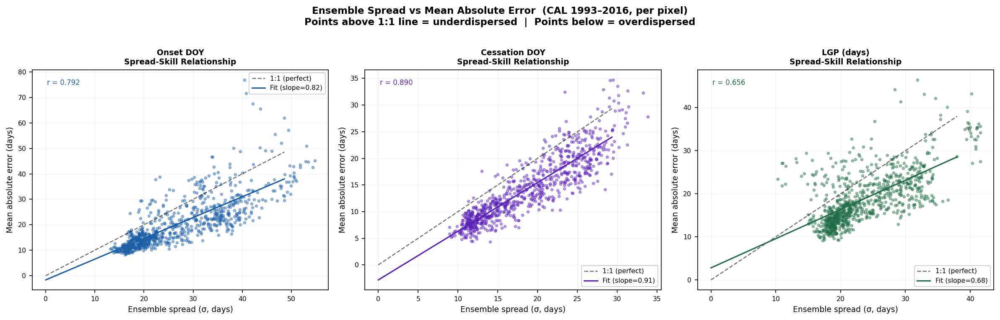

In [199]:
print("  Fig 5: Spread-skill relationship ...")

fig5, axes5 = plt.subplots(1, 3, figsize=(16, 5))

for ax, s5_arr, ch_arr, title, col_c in [
    (axes5[0], mf_onset_doy,     chirps_onset_doy,
     "Onset DOY", "#1B5EA6"),
    (axes5[1], mf_cessation_doy, chirps_cessation_doy,
     "Cessation DOY", "#5B21B6"),
    (axes5[2], mf_lgp_days,      chirps_lgp_days,
     "LGP (days)", "#1E6B45"),
]:
    spread_px = []
    rmse_px   = []
    for i in range(n_lat):
        for j in range(n_lon):
            if not lm[i,j]: continue
            sp_vals, err_vals = [], []
            for si, yr in enumerate(mf_years):
                if yr not in CAL_YEARS: continue
                ci = np.where(chirps_years == yr)[0]
                if len(ci) == 0: continue
                ci = int(ci[0])
                obs = float(ch_arr[ci, i, j])
                ens = s5_arr[:, si, i, j]
                ens = ens[~np.isnan(ens)]
                if np.isnan(obs) or len(ens) < 3: continue
                sp_vals.append(float(np.std(ens)))
                err_vals.append(float(np.abs(np.mean(ens) - obs)))
            if len(sp_vals) > 5:
                spread_px.append(np.mean(sp_vals))
                rmse_px.append(np.mean(err_vals))

    spread_px = np.array(spread_px)
    rmse_px   = np.array(rmse_px)

    if len(spread_px) > 10:
        ax.scatter(spread_px, rmse_px, color=col_c, alpha=0.40, s=8)
        # 1:1 line
        vmax_ss = max(np.nanpercentile(spread_px, 97),
                      np.nanpercentile(rmse_px, 97))
        ax.plot([0, vmax_ss], [0, vmax_ss], "k--", lw=1.2, alpha=0.55,
                label="1:1 (perfect)")
        # Regression line
        m_ss, b_ss = np.polyfit(spread_px, rmse_px, 1)
        x_fit = np.linspace(0, vmax_ss, 50)
        ax.plot(x_fit, m_ss*x_fit + b_ss, color=col_c, lw=1.5,
                label=f"Fit (slope={m_ss:.2f})")
        corr = float(np.corrcoef(spread_px, rmse_px)[0,1])
        ax.text(0.05, 0.93, f"r = {corr:.3f}",
                transform=ax.transAxes, fontsize=8, color=col_c)

    ax.set_xlabel("Ensemble spread (σ, days)", fontsize=9)
    ax.set_ylabel("Mean absolute error (days)", fontsize=9)
    ax.set_title(f"{title}\nSpread-Skill Relationship", fontsize=9)
    ax.legend(fontsize=7.5, framealpha=0.90)
    ax.grid(True, lw=0.3, alpha=0.35)
    ax.tick_params(labelsize=7.5)

fig5.suptitle(
    "Ensemble Spread vs Mean Absolute Error  (CAL 1993–2016, per pixel)\n"
    "Points above 1:1 line = underdispersed  |  "
    "Points below = overdispersed",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout()
_save(fig5, "mf_fig5_spread_skill")
plt.show()

## Detection Rate Map: MF vs CHIRPS

  Fig 6: Detection rate comparison map ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage4B_diagnostics\mf_fig6_detection_rate_comparison.png


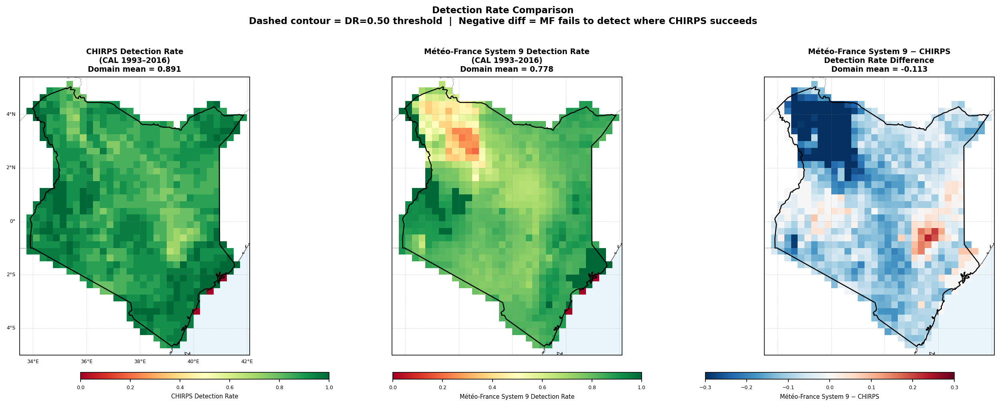

In [200]:
print("  Fig 6: Detection rate comparison map ...")

ch_dr = detection_rate   # from Stage 3A

fig6, axes6 = plt.subplots(1, 3, figsize=(19, 6.5),
                            subplot_kw={"projection": ccrs.PlateCarree()})

for ax, arr, title in [
    (axes6[0], ch_dr,  f"CHIRPS Detection Rate\n(CAL 1993–2016)"),
    (axes6[1], mf_dr,  f"Météo-France System 9 Detection Rate\n(CAL 1993–2016)"),
    (axes6[2], mf_dr - ch_dr,
     "Météo-France System 9 − CHIRPS\nDetection Rate Difference"),
]:
    _base_map(ax, labels=(ax is axes6[0]))
    if "Difference" in title:
        im = _pcm(ax, arr, "RdBu_r", -0.3, 0.3)
    else:
        im = _pcm(ax, arr, "RdYlGn", 0.0, 1.0)

    ax.contour(target_lon, target_lat,
               np.where(lm, ch_dr, np.nan),
               levels=[DR_MIN], colors=["black"],
               linewidths=[0.9], linestyles=["--"],
               transform=ccrs.PlateCarree(), zorder=5)

    pos = ax.get_position()
    cax = fig6.add_axes([pos.x0, pos.y0-0.055, pos.width, 0.018])
    cb  = fig6.colorbar(im, cax=cax, orientation="horizontal")
    cb.set_label(title.split("\n")[0], fontsize=7)
    cb.ax.tick_params(labelsize=6)
    mn = float(np.nanmean(arr[lm]))
    ax.set_title(f"{title}\nDomain mean = {mn:.3f}", fontsize=9)

fig6.suptitle(
    "Detection Rate Comparison\n"
    "Dashed contour = DR=0.50 threshold  |  "
    "Negative diff = MF fails to detect where CHIRPS succeeds",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout(rect=[0, 0.07, 1, 1])
_save(fig6, "mf_fig6_detection_rate_comparison")
plt.show()


## Scatter MF Ensemble Mean vs CHIRPS (5 sites, year-by-year)

  Fig 7: Site-level scatter plots ...
  Saved -> C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage4B_diagnostics\fig7_scatter_mf_vs_chirps.png


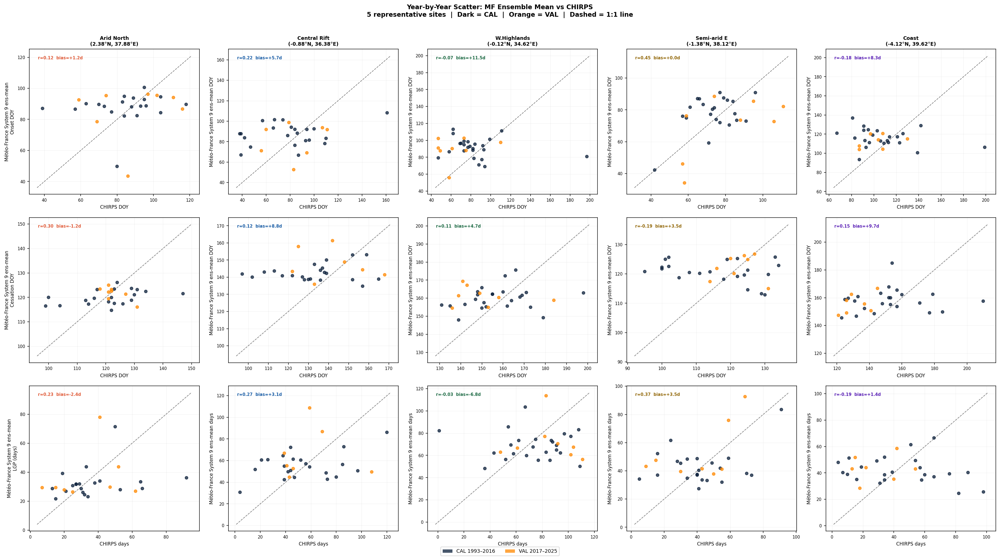

In [201]:
print("  Fig 7: Site-level scatter plots ...")

fig7, axes7 = plt.subplots(3, len(SITES), figsize=(4.8*len(SITES), 13))

def _get_site_ij(site):
    if "i" in site and "j" in site:
        return int(site["i"]), int(site["j"])

    li = np.argwhere(lm)
    la = target_lat[li[:, 0]]
    lo = target_lon[li[:, 1]]
    b = int(np.argmin((la - site["lat"])**2 + (lo - site["lon"])**2))
    site["i"], site["j"] = int(li[b, 0]), int(li[b, 1])
    return site["i"], site["j"]

for col, s in enumerate(SITES):
    ii, jj = _get_site_ij(s)
    site_color = s.get("col", "black")
    site_name = s.get("name", s.get("id", f"Site {col + 1}"))

    for row, (s5_arr, ch_arr, unit, row_label) in enumerate([
        (mf_onset_doy,     chirps_onset_doy,
         "DOY", "Onset DOY"),
        (mf_cessation_doy, chirps_cessation_doy,
         "DOY", "Cessation DOY"),
        (mf_lgp_days,      chirps_lgp_days,
         "days", "LGP (days)"),
    ]):
        ax = axes7[row, col]

        obs_v, ens_v = [], []
        yrs_plot = []
        for si, yr in enumerate(mf_years):
            ci = np.where(chirps_years == yr)[0]
            if len(ci) == 0: continue
            ci = int(ci[0])
            obs = float(ch_arr[ci, ii, jj])
            ens = s5_arr[:, si, ii, jj]
            ens = ens[~np.isnan(ens)]
            if np.isnan(obs) or len(ens) == 0: continue
            obs_v.append(obs)
            ens_v.append(float(np.nanmean(ens)))
            yrs_plot.append(yr)

        obs_v = np.array(obs_v)
        ens_v = np.array(ens_v)
        yrs_plot = np.array(yrs_plot)

        if len(obs_v) < 5:
            ax.text(0.5, 0.5, "No data", ha="center", va="center",
                    transform=ax.transAxes)
            continue

        # Colour by period
        c_arr = np.where(np.isin(yrs_plot, CAL_YEARS), COL_CAL_BG, COL_VAL_BG)
        ax.scatter(obs_v, ens_v, c=c_arr, s=25, alpha=0.75, zorder=4)

        # 1:1 line
        vmin_sc = min(obs_v.min(), ens_v.min()) - 3
        vmax_sc = max(obs_v.max(), ens_v.max()) + 3
        ax.plot([vmin_sc, vmax_sc], [vmin_sc, vmax_sc],
                "k--", lw=1.0, alpha=0.50)
        if len(obs_v) > 3:
            corr = float(np.corrcoef(obs_v, ens_v)[0,1])
            bias = float(np.mean(ens_v - obs_v))
            ax.text(0.05, 0.93,
                    f"r={corr:.2f}  bias={bias:+.1f}d",
                    transform=ax.transAxes, fontsize=7,
                    color=site_color, fontweight="bold")
        ax.set_xlabel(f"CHIRPS {unit}", fontsize=8)
        ax.set_ylabel(f"Météo-France System 9 ens-mean {unit}", fontsize=8)
        ax.grid(True, lw=0.3, alpha=0.35)
        ax.tick_params(labelsize=7)
        if row == 0:
            ax.set_title(f"{site_name}\n({target_lat[ii]:.2f}°N,"
                         f" {target_lon[jj]:.2f}°E)", fontsize=8.5)

    # Row labels
    # Row labels
    for row_idx, lbl in enumerate(["Onset DOY","Cessation DOY","LGP (days)"]):
        if col == 0:
            axes7[row_idx, 0].set_ylabel(
                f"Météo-France System 9 ens-mean\n{lbl}", fontsize=8)

# Period legend
cal_patch = mpatches.Patch(facecolor=COL_CAL_BG, alpha=0.75,
                           label=f"CAL {CAL_YEARS[0]}–{CAL_YEARS[-1]}")
val_patch = mpatches.Patch(facecolor=COL_VAL_BG, alpha=0.75,
                           label=f"VAL {VAL_YEARS[0]}–{VAL_YEARS[-1]}")
fig7.legend(handles=[cal_patch, val_patch],
            loc="lower center", ncol=2, fontsize=8.5,
            bbox_to_anchor=(0.5, -0.01))

fig7.suptitle(
    "Year-by-Year Scatter: MF Ensemble Mean vs CHIRPS\n"
    "5 representative sites  |  Dark = CAL  |  Orange = VAL  |  "
    "Dashed = 1:1 line",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout()
_save(fig7, "fig7_scatter_mf_vs_chirps")
plt.show()


## SUMMARY

In [202]:
print("\n" + "="*65)
print("Stage 4B Diagnostic Plots Complete")
print("="*65)
print(f"  Output : {DIAG_DIR}")
print()
print("  Fig 1 : MF vs CHIRPS spatial means  (4-panel)")
print("  Fig 2 : Bias maps  (onset / cessation / LGP)")
print("  Fig 3 : Interannual time series with ensemble spread")
print("  Fig 4 : Rank histograms  (Talagrand, reliability)")
print("  Fig 5 : Spread-skill relationship")
print("  Fig 6 : Detection rate comparison  (CHIRPS vs Météo-France System 9)")
print("  Fig 7 : Year-by-year scatter at 5 sites")
print()
print(f"  Key statistics (CAL 1993–2016):")
print(f"    Onset bias    : {float(np.nanmean(bias_on[lm])):+.1f} days")
print(f"    Cessation bias: {float(np.nanmean(bias_cs[lm])):+.1f} days")
print(f"    LGP bias      : {float(np.nanmean(bias_lgp[lm])):+.1f} days")
print(f"    MF DR (CAL)  : {float(np.nanmean(mf_dr[lm])):.3f}")
print(f"    CHIRPS DR     : {float(np.nanmean(detection_rate[lm])):.3f}")


Stage 4B Diagnostic Plots Complete
  Output : C:\Users\yonas\Documents\ILRI\onset-kenya\outputs_dunning_v3.0.0\plots\stage4B_diagnostics

  Fig 1 : MF vs CHIRPS spatial means  (4-panel)
  Fig 2 : Bias maps  (onset / cessation / LGP)
  Fig 3 : Interannual time series with ensemble spread
  Fig 4 : Rank histograms  (Talagrand, reliability)
  Fig 5 : Spread-skill relationship
  Fig 6 : Detection rate comparison  (CHIRPS vs Météo-France System 9)
  Fig 7 : Year-by-year scatter at 5 sites

  Key statistics (CAL 1993–2016):
    Onset bias    : +7.6 days
    Cessation bias: +4.6 days
    LGP bias      : -2.1 days
    MF DR (CAL)  : 0.778
    CHIRPS DR     : 0.891


## PROBABILITY ESTIMATION  (member counting into CHIRPS terciles)

 - For each grids and year count how many of the 3 MF members fall into each CHIRPS-derived tercile. 
                                        
 - Tercile boundaries t33/t67 are in the same units as MF detections.  


In [203]:
# ── Output paths ───────────────────────────────────────────────────────────
def _out(fname):
    return os.path.join(OUT_DIR, fname)


print("=" * 60)
print("STAGE 5 — Probability Estimation")
print("=" * 60)
print(f"  Members per forecast : {mf_onset_doy.shape[0]}")
print(f"  Years                : {mf_years[0]}–{mf_years[-1]}")
print()

def _estimate_probs(seas5_det, t33, t67, var_name):
    """
    Count members in each CHIRPS-derived tercile category.

    Parameters
    ----------
    mf_det : (3, n_years, n_lat, n_lon)
    t33, t67  : (n_lat, n_lon)  lower/upper tercile boundaries

    Returns
    -------
    probs : (3, n_years, n_lat, n_lon)   P_BN, P_NN, P_AN
    """
    nm, n_years, n_la, n_lo = seas5_det.shape
    probs = np.full((3, n_years, n_la, n_lo), np.nan, np.float32)

    for yi in range(n_years):
        for i in range(n_la):
            for j in range(n_lo):
                if not lm[i, j]:
                    continue
                members = seas5_det[:, yi, i, j]
                valid   = members[~np.isnan(members)]
                if len(valid) == 0:
                    continue
                lo = float(t33[i, j]); hi = float(t67[i, j])
                n_v = len(valid)
                probs[0, yi, i, j] = np.sum(valid <  lo) / n_v
                probs[1, yi, i, j] = np.sum((valid >= lo) & (valid < hi)) / n_v
                probs[2, yi, i, j] = np.sum(valid >= hi) / n_v

    psum = np.nansum(probs[:, :, lm], axis=0)
    print(f"  {var_name:<14}: prob sum min={np.nanmin(psum):.3f}  "
          f"max={np.nanmax(psum):.3f}  (should be 1.000)")
    return probs


probs_onset = _estimate_probs(mf_onset_doy,     t33_onset, t67_onset, "onset")
probs_cess  = _estimate_probs(mf_cessation_doy, t33_cess,  t67_cess,  "cessation")
probs_lgp   = _estimate_probs(mf_lgp_days,      t33_lgp,   t67_lgp,   "lgp")

print("\nStage 5 complete ✓")
print(f"  probs_onset shape : {probs_onset.shape}   (BN/NN/AN, years, lat, lon)")


STAGE 5 — Probability Estimation
  Members per forecast : 31
  Years                : 1993–2026

  onset         : prob sum min=0.000  max=1.000  (should be 1.000)
  cessation     : prob sum min=0.000  max=1.000  (should be 1.000)
  lgp           : prob sum min=0.000  max=1.000  (should be 1.000)

Stage 5 complete ✓
  probs_onset shape : (3, 33, 42, 34)   (BN/NN/AN, years, lat, lon)


## LINEAR POOLING  (per-pixel α* optimisation) + RPSS + Hit Rate

- Linear pooling: P_k_final = α·P_k_raw + (1−α)/3                       
- α=1 → pure MF  |  α=0 → pure climatology (1/3 each)              
- α* per pixel: grid search [0, 1] step 0.01, minimise mean RPS on CAL 


In [ ]:
print("\n" + "=" * 60)
print("STAGE 6 — Linear Pooling + α* Optimisation + Skill")
print("=" * 60)

cal_mask_mf = np.isin(mf_years, CAL_YEARS)
val_mask_mf = np.isin(mf_years, VAL_YEARS)
op_mask_mf  = (mf_years == OP_YEAR)
cal_mask_c = np.isin(chirps_years, CAL_YEARS)

# ── Core scoring functions ─────────────────────────────────────────────────
def _apply_pooling(probs_raw, alpha):
    """P_k = alpha * P_k_raw + (1-alpha)/3.  alpha: scalar or (n_lat,n_lon)."""
    if np.ndim(alpha) == 0:
        return alpha * probs_raw + (1.0 - alpha) / 3.0
    return (alpha[np.newaxis, np.newaxis] * probs_raw +
            (1.0 - alpha[np.newaxis, np.newaxis]) / 3.0)


def _rps(prob_vec, obs_cat):
    """
    Ranked Probability Score for one forecast-obs pair.

    CORRECTNESS FIX: F_obs previously used `1.0 if obs_cat > k else 0.0`,
    which is the observed-category indicator INVERTED (it should be
    `obs_cat <= k`). That bug scored a 100%-confident, exactly-correct
    forecast as RPS=2 (the worst possible score) and a 100%-confident,
    maximally-wrong forecast as RPS=0 (the best) -- i.e. it rewarded
    confidently wrong forecasts and punished confidently correct ones.
    This means every alpha* (chosen by minimizing this score), RPSS, and
    the RPSS-weighted multi-model blend downstream of this function were
    computed against an inverted objective until this fix. See the
    correctness check printed right after this cell's definitions.
    """
    if obs_cat < 0 or np.any(np.isnan(prob_vec)):
        return np.nan
    F_hat = np.cumsum(prob_vec)[:2]
    F_obs = np.array([1.0 if obs_cat <= k else 0.0 for k in range(2)])
    return float(np.sum((F_hat - F_obs) ** 2))


def _rps_clim(obs_cat):
    """Climatological RPS (equal 1/3 probabilities)."""
    return _rps(np.array([1/3., 1/3., 1/3.]), obs_cat)


# -- Absolute-correctness regression test for _rps (added after the bug
#    above was found and fixed) -- not a cross-validation against another
#    implementation, since a shared reference could share the same bug.
#    For a one-hot (100%-confident) forecast, RPS must equal the exact rank
#    distance |predicted_category - observed_category| -- 0 for a perfect
#    forecast, 1 for an adjacent-category miss, 2 only when predicting the
#    opposite extreme of an extreme observation (the middle category's
#    worst case is distance 1, not 2, since it can only be one step from
#    either extreme).
for _oc in [0, 1, 2]:
    for _pc in [0, 1, 2]:
        _probs = np.zeros(3); _probs[_pc] = 1.0
        _expected = float(abs(_pc - _oc))
        _got = _rps(_probs, _oc)
        assert abs(_got - _expected) < 1e-9, f"_rps check failed: obs={_oc} pred={_pc} got={_got} expected={_expected}"
print("  _rps correctness check passed for all 9 (obs, forecast) combinations")


# ── Build observed category arrays for all CHIRPS years ───────────────────
def _make_obs_cats(detected, t33, t67):
    """Assign 0=BN / 1=NN / 2=AN for all CHIRPS years. -99 = missing."""
    n_yrs, n_la, n_lo = detected.shape
    cats = np.full((n_yrs, n_la, n_lo), -99, np.int8)
    for yi in range(n_yrs):
        for i in range(n_la):
            for j in range(n_lo):
                if not lm[i, j]:
                    continue
                v = detected[yi, i, j]
                if np.isnan(v):
                    continue
                lo = float(t33[i, j]); hi = float(t67[i, j])
                cats[yi, i, j] = 0 if v < lo else (1 if v < hi else 2)
    return cats


print("  Building observed category arrays ...")
obs_cat_onset = _make_obs_cats(chirps_onset_doy,     t33_onset, t67_onset)
obs_cat_cess  = _make_obs_cats(chirps_cessation_doy, t33_cess,  t67_cess)
obs_cat_lgp   = _make_obs_cats(chirps_lgp_days,      t33_lgp,   t67_lgp)


# ── Align CHIRPS obs categories to SEAS5 year axis ────────────────────────
def _align_obs(obs_cats_chirps, mf_yrs):
    """Map chirps-axis obs categories onto mf_years axis."""
    aligned = np.full((len(mf_yrs),) + obs_cats_chirps.shape[1:], -99, np.int8)
    for si, yr in enumerate(mf_yrs):
        ci = np.where(chirps_years == yr)[0]
        if len(ci) > 0:
            aligned[si] = obs_cats_chirps[ci[0]]
    return aligned


obs_aligned_onset = _align_obs(obs_cat_onset, mf_years)
obs_aligned_cess  = _align_obs(obs_cat_cess,  mf_years)
obs_aligned_lgp   = _align_obs(obs_cat_lgp,   mf_years)


# ── RPS / RPSS / Hit rate over a period ───────────────────────────────────
def _compute_rps_map(probs, obs_aligned, period_mask):
    rps_map = np.full((n_lat, n_lon), np.nan, np.float32)
    for i in range(n_lat):
        for j in range(n_lon):
            if not lm[i, j]: continue
            sc = [_rps(probs[:, yi, i, j], int(obs_aligned[yi, i, j]))
                  for yi in np.where(period_mask)[0]
                  if obs_aligned[yi, i, j] >= 0]
            if sc:
                rps_map[i, j] = float(np.mean([s for s in sc
                                                if not np.isnan(s)]))
    return rps_map


def _compute_clim_rps_map(obs_aligned, period_mask):
    rps_map = np.full((n_lat, n_lon), np.nan, np.float32)
    for i in range(n_lat):
        for j in range(n_lon):
            if not lm[i, j]: continue
            sc = [_rps_clim(int(obs_aligned[yi, i, j]))
                  for yi in np.where(period_mask)[0]
                  if obs_aligned[yi, i, j] >= 0]
            if sc:
                rps_map[i, j] = float(np.mean(sc))
    return rps_map


def _compute_rpss(rps_map, rps_clim_map):
    rpss = np.full((n_lat, n_lon), np.nan, np.float32)
    valid = (~np.isnan(rps_map) & ~np.isnan(rps_clim_map)
             & (rps_clim_map > 1e-9))
    rpss[valid] = 1.0 - rps_map[valid] / rps_clim_map[valid]
    return rpss


def _compute_hitrate(probs, obs_aligned, period_mask):
    hr = np.full((n_lat, n_lon), np.nan, np.float32)
    for i in range(n_lat):
        for j in range(n_lon):
            if not lm[i, j]: continue
            hits = []
            for yi in np.where(period_mask)[0]:
                oc = int(obs_aligned[yi, i, j])
                if oc < 0: continue
                hits.append(int(np.argmax(probs[:, yi, i, j]) == oc))
            if hits:
                hr[i, j] = float(np.mean(hits))
    return hr


# ── α* grid-search optimisation ───────────────────────────────────────────
def _optimise_alpha(probs_raw, obs_aligned, period_mask, var_name):
    print(f"  α* grid search for {var_name} "
          f"({len(ALPHA_GRID)} steps, {int(period_mask.sum())} CAL years) ...")
    alpha_star = np.full((n_lat, n_lon), np.nan, np.float32)

    for i in range(n_lat):
        for j in range(n_lon):
            if not lm[i, j]: continue
            best_rps = np.inf; best_a = 0.0
            cal_yi   = np.where(period_mask)[0]
            for a in ALPHA_GRID:
                p_d = a * probs_raw[:, :, i, j] + (1.0 - a) / 3.0
                sc  = [_rps(p_d[:, yi], int(obs_aligned[yi, i, j]))
                       for yi in cal_yi
                       if obs_aligned[yi, i, j] >= 0]
                sc  = [s for s in sc if not np.isnan(s)]
                if sc:
                    mean_rps = float(np.mean(sc))
                    if mean_rps < best_rps:
                        best_rps = mean_rps; best_a = a
            alpha_star[i, j] = best_a

    mn = float(np.nanmean(alpha_star[lm]))
    lo = float(np.nanmin(alpha_star[lm]))
    hi = float(np.nanmax(alpha_star[lm]))
    print(f"    α* mean={mn:.3f}  range=[{lo:.3f}, {hi:.3f}]")
    return alpha_star


# ── Full calibration + skill pipeline for one variable ────────────────────
def _calibrate(probs_raw, obs_aligned, var_name):
    print(f"\n  ── {var_name.upper()} ───────────────────────────────────────")

    alpha_star   = _optimise_alpha(probs_raw, obs_aligned, cal_mask_mf, var_name)
    probs_damped = _apply_pooling(probs_raw, alpha_star)

    # CAL skill
    rps_cal      = _compute_rps_map(probs_damped, obs_aligned, cal_mask_mf)
    rps_clim_cal = _compute_clim_rps_map(obs_aligned, cal_mask_mf)
    rpss_cal     = _compute_rpss(rps_cal, rps_clim_cal)
    hr_cal       = _compute_hitrate(probs_damped, obs_aligned, cal_mask_mf)

    print(f"    CAL RPSS  : {np.nanmean(rpss_cal[lm]):+.3f}  "
          f"(range [{np.nanmin(rpss_cal[lm]):.3f}, "
          f"{np.nanmax(rpss_cal[lm]):.3f}])")
    print(f"    CAL HR    : {np.nanmean(hr_cal[lm]):.3f}  (baseline 0.333)")

    # VAL skill
    rps_val      = _compute_rps_map(probs_damped, obs_aligned, val_mask_mf)
    rps_clim_val = _compute_clim_rps_map(obs_aligned, val_mask_mf)
    rpss_val     = _compute_rpss(rps_val, rps_clim_val)
    hr_val       = _compute_hitrate(probs_damped, obs_aligned, val_mask_mf)

    print(f"    VAL RPSS  : {np.nanmean(rpss_val[lm]):+.3f}")
    print(f"    VAL HR    : {np.nanmean(hr_val[lm]):.3f}")

    return {
        "alpha"       : alpha_star,
        "probs_raw"   : probs_raw,
        "probs_damped": probs_damped,
        "rpss_cal"    : rpss_cal,
        "rpss_val"    : rpss_val,
        "hitrate_cal" : hr_cal,
        "hitrate_val" : hr_val,
        "obs_aligned" : obs_aligned,
    }


results_onset = _calibrate(probs_onset, obs_aligned_onset, "onset")
results_cess  = _calibrate(probs_cess,  obs_aligned_cess,  "cessation")
results_lgp   = _calibrate(probs_lgp,   obs_aligned_lgp,   "lgp")


# ── Save Stage 6 outputs ───────────────────────────────────────────────────
print("\n  Saving Stage 6 outputs ...")

def _save_stage6(res, var_name):
    coords_p = {"tercile": ["BN","NN","AN"],
                "year"   : mf_years,
                "lat"    : target_lat,
                "lon"    : target_lon}
    coords_m = {"lat": target_lat, "lon": target_lon}
    _attr    = {"system_version": SYSTEM_VERSION,
                "variable"      : var_name,
                "cal_years"     : f"{CAL_YEARS[0]}-{CAL_YEARS[-1]}"}

    xr.DataArray(res["alpha"],
                 dims=["lat","lon"], coords=coords_m,
                 attrs={**_attr, "long_name": f"Optimal pooling alpha — {var_name}"}
                 ).to_netcdf(_out(f"alpha_{var_name}.nc"))

    xr.DataArray(res["probs_raw"],
                 dims=["tercile","year","lat","lon"], coords=coords_p,
                 attrs={**_attr, "long_name": f"Raw member-count probabilities — {var_name}"}
                 ).to_netcdf(_out(f"probs_raw_{var_name}.nc"))

    xr.DataArray(res["probs_damped"],
                 dims=["tercile","year","lat","lon"], coords=coords_p,
                 attrs={**_attr, "long_name": f"Damped probabilities — {var_name}"}
                 ).to_netcdf(_out(f"probs_damped_{var_name}.nc"))

    for key, period in [("rpss_cal","cal"),("rpss_val","val"),
                         ("hitrate_cal","cal"),("hitrate_val","val")]:
        metric = "rpss" if "rpss" in key else "hitrate"
        xr.DataArray(res[key],
                     dims=["lat","lon"], coords=coords_m,
                     attrs={**_attr,
                            "long_name": f"{metric} {var_name} {period}"}
                     ).to_netcdf(_out(f"{metric}_{var_name}_{period}.nc"))

    print(f"    Saved: alpha, probs_raw, probs_damped, rpss, hitrate → {var_name}")


_save_stage6(results_onset, "onset")
_save_stage6(results_cess,  "cessation")
_save_stage6(results_lgp,   "lgp")

print("\nStage 6 complete ✓")


## Stage 7 — Out-of-Sample Validation (2017–2018)

Computes out-of-sample skill using α* values optimised on CAL (1993–2016) only.

> **⚠ Only 2 validation years available (2017–2018).**  
> Years 2019–2025 are missing from the downloaded MF data.  
> Skill metrics (RPSS, hit rate) are computed over 2 years only and are  
> **statistically insufficient for robust validation** — treat as indicative.  
> Consider downloading the missing years from C3S to improve the assessment.

**Direction note:** same as SEAS5 — BN onset = late onset = HIGH DOY.


In [ ]:
print("\n" + "=" * 60)
print("STAGE 7 — Out-of-Sample Validation  (2017–2024, 2 years only)")
print("=" * 60)

val_years_avail = mf_years[val_mask_mf4b]
print(f"  Validation years : {val_years_avail}")
print()

# ── Year-by-year domain-mean probability tables ────────────────────────────
print("  Domain-mean probabilities per VAL year:")
print(f"  {'Year':>6}  "
      f"{'On_BN':>6} {'On_NN':>6} {'On_AN':>6}  "
      f"{'Cs_BN':>6} {'Cs_NN':>6} {'Cs_AN':>6}  "
      f"{'LGP_BN':>7} {'LGP_NN':>7} {'LGP_AN':>7}")
print("  " + "-" * 80)

for si, yr in enumerate(mf_years):
    if yr not in VAL_YEARS:
        continue
    for vname, res in [("onset", results_onset),
                       ("cess",  results_cess),
                       ("lgp",   results_lgp)]:
        p = res["probs_damped"][:, si, :, :][:, lm]
        dm = np.nanmean(p, axis=1)
        res[f"val_{yr}_dm"] = dm

    o = results_onset["probs_damped"][:, si, :, :][:, lm]
    c = results_cess["probs_damped"][:,  si, :, :][:, lm]
    l = results_lgp["probs_damped"][:,   si, :, :][:, lm]
    o_dm = np.nanmean(o, axis=1)
    c_dm = np.nanmean(c, axis=1)
    l_dm = np.nanmean(l, axis=1)
    print(f"  {yr:>6}  "
          f"{o_dm[0]:6.2f} {o_dm[1]:6.2f} {o_dm[2]:6.2f}  "
          f"{c_dm[0]:6.2f} {c_dm[1]:6.2f} {c_dm[2]:6.2f}  "
          f"{l_dm[0]:7.2f} {l_dm[1]:7.2f} {l_dm[2]:7.2f}")

# ── RPSS breakdown by year ─────────────────────────────────────────────────
print(f"\n  RPSS by VAL year (domain mean over land pixels):")
print(f"  {'Year':>6}  {'RPSS onset':>12}  {'RPSS cess':>11}  {'RPSS LGP':>10}")
print("  " + "-" * 45)

for si, yr in enumerate(mf_years):
    if yr not in VAL_YEARS:
        continue
    yr_mask = np.zeros(len(mf_years), bool)
    yr_mask[si] = True

    def _rpss_yr(res, obs_al):
        rps   = _compute_rps_map(res["probs_damped"], obs_al, yr_mask)
        rps_c = _compute_clim_rps_map(obs_al, yr_mask)
        rpss  = _compute_rpss(rps, rps_c)
        return float(np.nanmean(rpss[lm]))

    r_on  = _rpss_yr(results_onset, obs_aligned_onset)
    r_cs  = _rpss_yr(results_cess,  obs_aligned_cess)
    r_lgp = _rpss_yr(results_lgp,   obs_aligned_lgp)
    print(f"  {yr:>6}  {r_on:>12.3f}  {r_cs:>11.3f}  {r_lgp:>10.3f}")

# ── Operational year (2026) forecast ──────────────────────────────────────
if op_mask_mf.any():
    op_idx = int(np.where(op_mask_mf)[0][0])
    op_probs = {
        "onset"    : results_onset["probs_damped"][:, op_idx, :, :],
        "cessation": results_cess["probs_damped"][:,  op_idx, :, :],
        "lgp"      : results_lgp["probs_damped"][:,   op_idx, :, :],
    }

    print(f"\n  ── {OP_YEAR} Operational Forecast (domain mean) ──────────")
    for vn, pd in op_probs.items():
        dm = np.nanmean(pd[:, lm], axis=1)
        print(f"    {vn:<12}: P_BN={dm[0]:.2f}  P_NN={dm[1]:.2f}  "
              f"P_AN={dm[2]:.2f}")

    # Save operational probabilities
    print(f"\n  Saving {OP_YEAR} operational probability maps ...")
    for vn, pd in op_probs.items():
        xr.DataArray(pd, dims=["tercile","lat","lon"],
                     coords={"tercile": ["BN","NN","AN"],
                             "lat"    : target_lat,
                             "lon"    : target_lon},
                     attrs={"long_name"    : f"{OP_YEAR} forecast probabilities — {vn}",
                            "year"         : OP_YEAR,
                            "alpha_source" : f"CAL {CAL_YEARS[0]}-{CAL_YEARS[-1]}",
                            "system_version": SYSTEM_VERSION}
                     ).to_netcdf(_out(f"probs_op_{OP_YEAR}_{vn}.nc"))
        print(f"    Saved -> probs_op_{OP_YEAR}_{vn}.nc")

# ── Overall VAL summary ───────────────────────────────────────────────────
print(f"\n  ── Overall Validation Summary ─────────────────────────")
for vn, res, obs_al in [
    ("onset",     results_onset, obs_aligned_onset),
    ("cessation", results_cess,  obs_aligned_cess),
    ("lgp",       results_lgp,   obs_aligned_lgp),
]:
    print(f"    {vn:<12}: "
          f"VAL RPSS={np.nanmean(res['rpss_val'][lm]):+.3f}  "
          f"HR={np.nanmean(res['hitrate_val'][lm]):.3f}  "
          f"α*_mean={np.nanmean(res['alpha'][lm]):.3f}")

print(f"  Outputs saved to: {OUT_DIR}")
print(f"  Ready for Stage 8 — Bulletin generation (Météo-France System 9) — Bulletin generation")

## Stage 5–7 — Diagnostic Plots

In [ ]:
# =============================================================================
# STAGE 5–7 DIAGNOSTIC PLOTS
# RPSS maps, Hit Rate maps, Alpha* maps, 2026 Probability maps
# =============================================================================

DIAG57_DIR = os.path.join(PLOT_DIR, "stage5_6_7_diagnostics")
os.makedirs(DIAG57_DIR, exist_ok=True)

def _save57(fig, name):
    p = os.path.join(DIAG57_DIR, f"{name}.png")
    fig.savefig(p, bbox_inches="tight", dpi=150)
    print(f"  Saved -> {p}")

# ── Shared helpers (reuse _pcm and _base_map from earlier cells) ──────────

## Alpha maps (optimal po oling weight per pixel)

In [ ]:
# Spatial maps of α\*, RPSS, hit rate, and 2026 probability for all three variables.


# =============================================================================
# FIG A —Alpha* maps (optimal po oling weight per pixel)
# =============================================================================
print("Fig A: Alpha* maps ...")
figA, axesA = plt.subplots(1, 3, figsize=(18, 6),
                            subplot_kw={"projection": ccrs.PlateCarree()})
for ax, res, title in [
    (axesA[0], results_onset, "α*  Onset"),
    (axesA[1], results_cess,  "α*  Cessation"),
    (axesA[2], results_lgp,   "α*  LGP"),
]:
    _base_map(ax, labels=(ax is axesA[0]))
    im = _pcm(ax, res["alpha"], "RdYlGn", 0.0, 1.0)
    cb  = figA.colorbar(im, ax=ax, orientation="horizontal", fraction=0.046, pad=0.08, shrink=0.8)
    cb.set_label("α*  (0 = climatology, 1 = pure Météo-France System 9)", fontsize=7)
    cb.ax.tick_params(labelsize=6)
    mn = float(np.nanmean(res["alpha"][lm]))
    ax.set_title(f"{title}\nDomain mean α* = {mn:.3f}", fontsize=9)

figA.suptitle(
    "Optimal Pooling Weight α*  (CAL 1993–2016)\n"
    "Low α* → model has little skill; forecast is damped toward climatology (1/3, 1/3, 1/3)",
    fontsize=11, fontweight="bold", y=1.01)
plt.tight_layout(rect=[0, 0.07, 1, 1])
_save57(figA, "mf_figA_alpha_star_maps")
plt.show()

## RPSS maps (CAL in-sample and VAL out-of-sample)

In [ ]:
# FIG B — RPSS maps (CAL in-sample and VAL out-of-sample)
# =============================================================================
print("Fig B: RPSS maps ...")
figB, axesB = plt.subplots(2, 3, figsize=(18, 11),
                            subplot_kw={"projection": ccrs.PlateCarree()})
for row, (period, period_label) in enumerate([("cal","CAL 1993–2016"),("val","VAL 2017–2025")]):
    for col, (res, vname) in enumerate([
        (results_onset, "Onset"),
        (results_cess,  "Cessation"),
        (results_lgp,   "LGP"),
    ]):
        ax = axesB[row, col]
        arr = res[f"rpss_{period}"]
        _base_map(ax, labels=(col == 0))
        im = _pcm(ax, arr, "RdYlGn", -0.15, 0.15)
        ax.contour(target_lon, target_lat,
                   np.where(lm, arr, np.nan),
                   levels=[0], colors=["black"],
                   linewidths=[0.8], linestyles=["--"],
                   transform=ccrs.PlateCarree(), zorder=5)
        cb  = figB.colorbar(im, ax=ax, orientation="horizontal",
                            fraction=0.046, pad=0.08, extend="both")
        cb.set_label("RPSS", fontsize=6)
        cb.ax.tick_params(labelsize=5.5)
        mn = float(np.nanmean(arr[lm]))
        ax.set_title(
            f"{vname}  –  {period_label}\n"
            f"Domain mean RPSS = {mn:+.3f}",
            fontsize=8.5)

figB.suptitle(
    "RPSS Maps  (Ranked Probability Skill Score)\n"
    "Positive (green) = better than climatology  |  Negative (red) = worse  |  Dashed = zero line",
    fontsize=11, fontweight="bold", y=1.005)
plt.tight_layout(rect=[0, 0.06, 1, 1])
_save57(figB, "mf_figB_rpss_maps_cal_val")
plt.show()


## Hit Rate maps (CAL and VAL)

In [ ]:
# =============================================================================
# FIG C — Hit Rate maps (CAL and VAL)
# =============================================================================
print("Fig C: Hit rate maps ...")
figC, axesC = plt.subplots(2, 3, figsize=(18, 11),
                            subplot_kw={"projection": ccrs.PlateCarree()})
for row, (period, period_label) in enumerate([("cal","CAL 1993–2016"),("val","VAL 2017–2025")]):
    for col, (res, vname) in enumerate([
        (results_onset, "Onset"),
        (results_cess,  "Cessation"),
        (results_lgp,   "LGP"),
    ]):
        ax = axesC[row, col]
        arr = res[f"hitrate_{period}"]
        _base_map(ax, labels=(col == 0))
        im = _pcm(ax, arr, "RdYlGn", 0.0, 1.0)
        # Mark baseline (1/3)
        ax.contour(target_lon, target_lat,
                   np.where(lm, arr, np.nan),
                   levels=[1/3], colors=["black"],
                   linewidths=[0.8], linestyles=["--"],
                   transform=ccrs.PlateCarree(), zorder=5)
        cb  = figC.colorbar(im, ax=ax, orientation="horizontal", fraction=0.046, pad=0.08, shrink=0.8)
        cb.set_label("Hit Rate", fontsize=6)
        cb.ax.tick_params(labelsize=5.5)
        cb.set_ticks([0, 1/3, 0.5, 0.67, 1.0])
        cb.set_ticklabels(["0", "0.33\n(baseline)", "0.50", "0.67", "1.0"], fontsize=5)
        mn = float(np.nanmean(arr[lm]))
        ax.set_title(
            f"{vname}  –  {period_label}\n"
            f"Domain mean HR = {mn:.3f}  (baseline 0.333)",
            fontsize=8.5)

figC.suptitle(
    "Hit Rate Maps  (fraction of years dominant category = observed)\n"
    "Dashed = 0.333 climatological baseline  |  Green > baseline = skilful",
    fontsize=11, fontweight="bold", y=1.005)
plt.tight_layout(rect=[0, 0.06, 1, 1])
_save57(figC, "mf_figC_hitrate_maps_cal_val")
plt.show()

## Operational Probability Maps (2026)

In [ ]:
# =============================================================================
# FIG D — 2026 Operational Probability Maps
# =============================================================================
print("Fig D: 2026 operational probability maps ...")
figD, axesD = plt.subplots(3, 3, figsize=(18, 14),
                            subplot_kw={"projection": ccrs.PlateCarree()})
CAT_LABELS  = ["BN (Below Normal)", "NN (Near Normal)", "AN (Above Normal)"]
CAT_CMAPS   = ["YlOrRd", "YlOrBr", "YlGn"]
CAT_COLORS  = ["#7C3A16", "#92680A", "#155D36"]

for col, (res, vname) in enumerate([
    (results_onset, "Onset"),
    (results_cess,  "Cessation"),
    (results_lgp,   "LGP"),
]):
    op_probs_3d = res["probs_damped"][:, op_idx, :, :]   # (3, n_lat, n_lon)
    for row in range(3):
        ax  = axesD[row, col]
        arr = np.where(lm, op_probs_3d[row], np.nan)
        _base_map(ax, labels=(col == 0))
        im  = _pcm(ax, arr, CAT_CMAPS[row], 0.25, 0.55)
        ax.contour(target_lon, target_lat,
                   np.where(lm, arr, np.nan),
                   levels=[1/3], colors=["black"],
                   linewidths=[0.8], linestyles=["--"],
                   transform=ccrs.PlateCarree(), zorder=5)
        cb  = figD.colorbar(im, ax=ax, orientation="horizontal", fraction=0.046, pad=0.08, shrink=0.8)
        cb.set_label("Probability", fontsize=6)
        cb.ax.tick_params(labelsize=5.5)
        mn_p = float(np.nanmean(arr[lm]))
        ax.set_title(
            f"{vname}  {CAT_LABELS[row]}\nDomain mean P = {mn_p:.2f}",
            fontsize=8.5, color=CAT_COLORS[row])

figD.suptitle(
    f"Operational Forecast Probabilities for {OP_YEAR} (Damped, α* from CAL)\n"
    "Dashed contour = 0.333 (climatological baseline)  |  "
    "Values > 0.40 indicate meaningful signal",
    fontsize=11, fontweight="bold", y=1.005)
plt.tight_layout(rect=[0, 0.05, 1, 1])
_save57(figD, f"mf_figD_{OP_YEAR}_operational_probability_maps")
plt.show()

print("\nStage 5–7 diagnostic plots complete.")
print(f"  Output: {DIAG57_DIR}")
print(f"  Fig A: Alpha* maps (onset / cessation / LGP)")
print(f"  Fig B: RPSS maps   (CAL in-sample + VAL out-of-sample)")
print(f"  Fig C: Hit rate maps (CAL + VAL)")
print(f"  Fig D: {OP_YEAR} operational probability maps (BN / NN / AN)")

---

## MF Pipeline Completion Summary

| Stage | Description | Key outputs |
|-------|-------------|-------------|
| 1A | CHIRPS ingestion (cropped to Météo-France System 9 domain) | `da_chirps_daily` (45, 366, 42, 34) |
| 2A | Dunning climatology | `Q_bar`, `C_clim`, `d_s`, `d_e` |
| 3A | CHIRPS detection (CAL 1993–2016) | DR≈0.89 · onset/cessation/LGP DOY |
| 4A | Tercile boundaries | `t33`, `t67` for onset/cess/LGP |
| 1B | Météo-France System 9 ingestion | `mf_raw` (3, 27, 182, 49, 45) |
| 2B | Reindex to 0.25° target | `mf_rg` (3, 27, 182, 42, 34) |
| 3B | QM-BC (CAL 1993–2016) | `mf_bc` (3, 27, 182, 42, 34) |
| 4B | MF Dunning detection | `mf_onset_doy`, `mf_cessation_doy`, `mf_lgp_days` |
| 5  | Probability estimation | `probs_onset/cess/lgp` (3, 27, 42, 34) |
| 6  | Linear pooling + α* | `probs_damped` — CAL α* applied to all years |
| 7  | Validation (2017–2018) | RPSS / hit rate — ⚠ 2 years only |
| 8  | Bulletin generation | Site PDFs using MF probs |

> **Missing years 2019–2025:** Validation skill is computed on 2017–2018 only.  
> Download the missing files from C3S to extend validation to 9 years (matching SEAS5).


In [ ]:
# ── Final pipeline status check — MF version ───────────────────────────
import datetime as _dt

MODEL_NAME = "Météo-France System 9"

print("=" * 68)
print("KENYA MAM FORECAST PIPELINE v3.0.0 — Météo-France System 9 — COMPLETE")
print("=" * 68)
print(f"  Run completed : {_dt.datetime.now().strftime('%Y-%m-%d %H:%M')}")
print(f"  Forecast model: Météo-France System 9 (C3S)")
print(f"  Domain        : Kenya  ({n_lat} lat × {n_lon} lon,  {int(lm.sum())} land pixels)")
print(f"  Obs. source   : CHIRPS daily  {CHIRPS_FULL_YEARS[0]}–{CHIRPS_FULL_YEARS[-1]}")
print(f"  MF years     : {mf_years[0]}–{mf_years[-1]}  ({len(mf_years)} files, missing 2019–2025)")
print(f"  CAL period    : {CAL_YEARS[0]}–{CAL_YEARS[-1]}  ({len(CAL_YEARS)} years)")
print(f"  VAL period    : {VAL_YEARS}  ({len(VAL_YEARS)} years only — limited by data gaps)")
print(f"  OP year       : {OP_YEAR}")
print(f"  Members       : {N_MEMBERS}  (hindcast) — 2026 trimmed from 11 to {N_MEMBERS}")
print()
print("  Key arrays in namespace:")
for name, arr in [
    ("da_chirps_daily",   da_chirps_daily),
    ("mf_bc",            mf_bc),
    ("mf_onset_doy",     mf_onset_doy),
    ("probs_onset",       probs_onset),
]:
    print(f"    {name:<24}: {arr.shape}")
print()
print("  Output directory:", OUT_DIR)
print("=" * 68)


## Operational Pipeline for bulletin

In [ ]:
print("Stage 8: Preparing bulletin namespace ...")

MODEL_NAME = "Météo-France System 9"

# =============================================================================
# STAGE 8 — MF OPERATIONAL BRIDGE  v3.0.0
# Connects MF Dunning DOY pipeline → bulletin_v8_final.py
# =============================================================================

# ── Derive member count from the actual array — NEVER hardcode 25 ──────────
N_MEMBERS_MF = int(mf_onset_doy.shape[0])   # 3 hindcast, 11 operational
_nd_mf       = int(mf_bc.shape[2])           # forecast days (182)
print(f"  MF members (from array) : {N_MEMBERS_MF}")
print(f"  MF forecast days        : {_nd_mf}")

# ┌─────────────────────────────────────────────────────────────────────────┐
# │ A. Identify operational year index                                       │
# └─────────────────────────────────────────────────────────────────────────┘
op_mask_mf = (mf_years == OP_YEAR)
if not op_mask_mf.any():
    raise ValueError(f"OP_YEAR={OP_YEAR} not found in mf_years={mf_years}")
op_idx = int(np.where(op_mask_mf)[0][0])

cal_mask_mf = np.isin(mf_years,  CAL_YEARS)
cal_mask_c   = np.isin(chirps_years, CAL_YEARS)
cal_idx      = np.where(cal_mask_c)[0]

print(f"  OP year     : {OP_YEAR}  (index {op_idx})")
print(f"  CAL indices : {cal_idx[0]}–{cal_idx[-1]}  ({len(cal_idx)} years)")


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ B. Ensemble member arrays for the OP year                                │
# └─────────────────────────────────────────────────────────────────────────┘
mf_onset = mf_onset_doy      # (N_MEMBERS_MF, n_years, n_lat, n_lon)  DOY
mf_cess  = mf_cessation_doy  # (N_MEMBERS_MF, n_years, n_lat, n_lon)  DOY
mf_lgp   = mf_lgp_days       # (N_MEMBERS_MF, n_years, n_lat, n_lon)  days

print(f"  mf_onset shape : {mf_onset.shape}  "
      f"(members={N_MEMBERS_MF}, years={mf_onset.shape[1]}, "
      f"lat={mf_onset.shape[2]}, lon={mf_onset.shape[3]})")

# Bulletin plume panel uses seas5_bc/seas5_onset/seas5_cess — alias BOM arrays

seas5_bc        = mf_bc
seas5_onset     = mf_onset
seas5_onset_doy = mf_onset_doy
seas5_cess      = mf_cess
seas5_lgp       = mf_lgp     
seas5_years     = mf_years
N_MEMBERS       = N_MEMBERS_MF


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ C. Probability dict                                                      │
# └─────────────────────────────────────────────────────────────────────────┘
results_damped = {}
for vn, res in [("onset",     results_onset),
                ("cessation", results_cess),
                ("lgp",       results_lgp)]:
    op_p = res["probs_damped"][:, op_idx, :, :]   # (3, n_lat, n_lon)
    results_damped[(vn, "op")] = {
        "prob" : op_p[np.newaxis],   # (1, 3, n_lat, n_lon)
        "alpha": res["alpha"],
    }
    results_damped[(vn, "cal")] = {
        "prob": res["probs_damped"][:, cal_mask_mf, :, :],
    }
    results_damped[(vn, "val")] = {
        "prob": res["probs_damped"][:, np.isin(mf_years, VAL_YEARS), :, :],
    }




def _doy_to_date_str(doy, year=OP_YEAR):
    if np.isnan(float(doy)):
        return "—"
    return (datetime.date(year, 1, 1) +
            datetime.timedelta(days=int(round(float(doy))) - 1)
            ).strftime("%d %b")

def _tlbl_doy(anom_days, thr_days=5.0):
    s = f"{anom_days:+.1f}d"
    if   anom_days < -thr_days: return s, "Early",  "#1B5EA6"
    elif anom_days >  thr_days: return s, "Late",   "#C0392B"
    else:                       return s, "Normal", "#1E6B45"

def _prank_doy(val_doy, arr3_doy, pi, pj):
    obs = arr3_doy[cal_idx, pi, pj]
    obs = obs[~np.isnan(obs)]
    return int(round(100 * np.mean(obs < val_doy))) if len(obs) > 0 else 50

def _det_doy(arr3_doy, pi, pj):
    return float(np.mean(~np.isnan(arr3_doy[cal_idx, pi, pj])))

def _anom_display_doy(anom_days, var_name="onset"):
    d    = abs(round(anom_days))
    dirn = ("earlier" if anom_days < 0 else "later")  if var_name != "lgp" \
           else ("shorter" if anom_days < 0 else "longer")
    return f"{anom_days:+.1f}d\n(~{d}d {dirn})"






# ┌─────────────────────────────────────────────────────────────────────────┐
# │ D. CHIRPS climatology dict  (DOY / days)                                 │
# └─────────────────────────────────────────────────────────────────────────┘
chirps_clim = {
    "onset"    : np.where(lm, np.nanmean(chirps_onset_doy[cal_mask_c],     axis=0),
                          np.nan).astype(np.float32),
    "cessation": np.where(lm, np.nanmean(chirps_cessation_doy[cal_mask_c], axis=0),
                          np.nan).astype(np.float32),
    "lgp"      : np.where(lm, np.nanmean(chirps_lgp_days[cal_mask_c],      axis=0),
                          np.nan).astype(np.float32),
}
print(f"  CHIRPS clim onset  (domain mean): "
      f"DOY {np.nanmean(chirps_clim['onset'][lm]):.1f}  "
      f"(≈ {_doy_to_date_str(np.nanmean(chirps_clim['onset'][lm]))})")
print(f"  CHIRPS clim cess   (domain mean): "
      f"DOY {np.nanmean(chirps_clim['cessation'][lm]):.1f}  "
      f"(≈ {_doy_to_date_str(np.nanmean(chirps_clim['cessation'][lm]))})")
print(f"  CHIRPS clim LGP    (domain mean): "
      f"{np.nanmean(chirps_clim['lgp'][lm]):.1f} days")


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ E. Onset risk thresholds in DOY                                          │
# └─────────────────────────────────────────────────────────────────────────┘
LATE_ONSET_THRESH  = float(np.nanmedian(t67_onset[lm]))
EARLY_ONSET_THRESH = float(np.nanmedian(t33_onset[lm]))
print(f"  LATE_ONSET_THRESH  : DOY {LATE_ONSET_THRESH:.0f}  "
      f"(≈ {_doy_to_date_str(LATE_ONSET_THRESH)})")
print(f"  EARLY_ONSET_THRESH : DOY {EARLY_ONSET_THRESH:.0f}  "
      f"(≈ {_doy_to_date_str(EARLY_ONSET_THRESH)})")


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ F. iad_hitrate_cal                                                       │
# └─────────────────────────────────────────────────────────────────────────┘
iad_hitrate_cal = {
    "onset"    : results_onset["hitrate_cal"],
    "cessation": results_cess["hitrate_cal"],
    "lgp"      : results_lgp["hitrate_cal"],
}


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ G. Bulletin helper functions (DOY-native)                                │
# └─────────────────────────────────────────────────────────────────────────┘
# def _doy_to_date_str(doy, year=OP_YEAR):
#     if np.isnan(float(doy)):
#         return "—"
#     return (datetime.date(year, 1, 1) +
#             datetime.timedelta(days=int(round(float(doy))) - 1)
#             ).strftime("%d %b")

# def _tlbl_doy(anom_days, thr_days=5.0):
#     s = f"{anom_days:+.1f}d"
#     if   anom_days < -thr_days: return s, "Early",  "#1B5EA6"
#     elif anom_days >  thr_days: return s, "Late",   "#C0392B"
#     else:                       return s, "Normal", "#1E6B45"

# def _prank_doy(val_doy, arr3_doy, pi, pj):
#     obs = arr3_doy[cal_idx, pi, pj]
#     obs = obs[~np.isnan(obs)]
#     return int(round(100 * np.mean(obs < val_doy))) if len(obs) > 0 else 50

# def _det_doy(arr3_doy, pi, pj):
#     return float(np.mean(~np.isnan(arr3_doy[cal_idx, pi, pj])))

# def _anom_display_doy(anom_days, var_name="onset"):
#     d    = abs(round(anom_days))
#     dirn = ("earlier" if anom_days < 0 else "later")  if var_name != "lgp" \
#            else ("shorter" if anom_days < 0 else "longer")
#     return f"{anom_days:+.1f}d\n(~{d}d {dirn})"


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ H. RULESET string                                                        │
# └─────────────────────────────────────────────────────────────────────────┘
RULESET = (f"Detection Ruleset | Dunning et al. (2016) | "
           f" MF  ({N_MEMBERS_MF} members)  |  "
           f"CHIRPS 0.25°  |  Window DOY {WIN_DOY_START}–{WIN_DOY_END}  |  "
           f"CAL {CAL_YEARS[0]}–{CAL_YEARS[-1]}")
SOURCE_STR = f"MF SYS9  |  {N_MEMBERS_MF}-member  |  Feb init"


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ I. Dry threshold map + dry spell probability                             │
# │    Uses N_MEMBERS_MF — NOT hardcoded 25                                │
# └─────────────────────────────────────────────────────────────────────────┘
DRY_SPELL_WINDOW = 5     # consecutive dry days
def _build_dry_thresh_map():
    """P50 of non-zero daily CHIRPS values in onset window (DOY 60–121) over CAL."""
    onset_win_doys = np.arange(60, 122)
    wt = np.full((n_lat, n_lon), np.nan, np.float32)
    for i in range(n_lat):
        for j in range(n_lon):
            if not lm[i, j]: continue
            vals = [float(da_chirps_daily[yi, doy - 1, i, j])
                    for yi in cal_idx
                    for doy in onset_win_doys
                    if not np.isnan(da_chirps_daily[yi, doy - 1, i, j])
                    and da_chirps_daily[yi, doy - 1, i, j] > 0]
            if len(vals) >= 5:
                wt[i, j] = float(np.percentile(vals, 50))
    med = float(np.nanmedian(wt[lm]))
    wt  = np.where(np.isnan(wt) & lm, med, wt)
    return np.maximum(0.6 * wt, 1.0).astype(np.float32)

print("  Building dry threshold map ...")
dry_thresh_map = _build_dry_thresh_map()
print(f"  dry_thresh_map domain mean: {np.nanmean(dry_thresh_map[lm]):.2f} mm/day")


def _compute_p_dry_spell(pi, pj):
    """
    Fraction of OP-year MF members with ≥ DRY_SPELL_WINDOW consecutive dry days
    inside the detected season. Uses N_MEMBERS_MF (not hardcoded 25).
    """
    dt  = float(dry_thresh_map[pi, pj])
    n_v = 0; n_dry = 0
    for m in range(N_MEMBERS_MF):          # ← dynamic, was range(25)
        om = float(mf_onset[m, op_idx, pi, pj])
        cm = float(mf_cess[m,  op_idx, pi, pj])
        if np.isnan(om) or np.isnan(cm): continue
        n_v += 1
        d_start = max(0, int(om) - WIN_DOY_START)
        d_end   = min(_nd_mf - 1, int(cm) - WIN_DOY_START)
        if d_end <= d_start: continue
        precip  = mf_bc[m, op_idx, d_start:d_end + 1, pi, pj]
        consec  = 0
        for v in precip:
            consec = consec + 1 if (np.isnan(v) or v < dt) else 0
            if consec >= DRY_SPELL_WINDOW:
                n_dry += 1; break
    return float(n_dry / n_v) if n_v > 0 else 0.0


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ J. Per-pixel bulletin summary                                            │
# │    All ensemble loops use N_MEMBERS_MF                                 │
# └─────────────────────────────────────────────────────────────────────────┘
def _sowing_window(pi, pj):
    on_v = mf_onset[:, op_idx, pi, pj]
    on_v = on_v[~np.isnan(on_v)]
    if len(on_v) < 2: return None
    def _p(q): return float(np.percentile(on_v, q))
    return {
        "earliest"      : _doy_to_date_str(_p(10) - 5),
        "optimal_start" : _doy_to_date_str(_p(25)),
        "optimal_med"   : _doy_to_date_str(_p(50)),
        "optimal_end"   : _doy_to_date_str(_p(75)),
        "latest"        : _doy_to_date_str(_p(90) + 5),
    }


def _pixel_summary(pi, pj):
    on_m = mf_onset[:, op_idx, pi, pj]   # (N_MEMBERS_MF,)
    cs_m = mf_cess[:,  op_idx, pi, pj]
    lg_m = mf_lgp[:,   op_idx, pi, pj]
    on_v = on_m[~np.isnan(on_m)]
    cs_v = cs_m[~np.isnan(cs_m)]
    lg_v = lg_m[~np.isnan(lg_m)]
    on_mn = float(np.nanmean(on_m))
    cs_mn = float(np.nanmean(cs_m))
    lg_mn = float(np.nanmean(lg_m))
    c_on  = float(chirps_clim["onset"][pi, pj])
    c_cs  = float(chirps_clim["cessation"][pi, pj])
    c_lgp = float(chirps_clim["lgp"][pi, pj])
    p_on  = results_onset["probs_damped"][:, op_idx, pi, pj]
    p_cs  = results_cess["probs_damped"][:,  op_idx, pi, pj]
    p_lgp = results_lgp["probs_damped"][:,   op_idx, pi, pj]
    def _pct(v, q): return float(np.percentile(v, q)) if len(v) > 0 else np.nan
    return {
        "on_mean"   : on_mn,  "cs_mean": cs_mn,  "lgp_mean": lg_mn,
        "on_date"   : _doy_to_date_str(on_mn),
        "cs_date"   : _doy_to_date_str(cs_mn),
        "lgp_str"   : f"{lg_mn:.0f} days",
        "on_anom"   : on_mn - c_on,
        "cs_anom"   : cs_mn - c_cs,
        "lgp_anom"  : lg_mn - c_lgp,
        "on_tlbl"   : _tlbl_doy(on_mn - c_on),
        "cs_tlbl"   : _tlbl_doy(cs_mn - c_cs),
        "lgp_tlbl"  : _tlbl_doy(lg_mn - c_lgp, thr_days=10.0),
        "on_p10"    : _pct(on_v,10),  "on_p90": _pct(on_v,90),
        "on_p25"    : _pct(on_v,25),  "on_p75": _pct(on_v,75),
        "cs_p10"    : _pct(cs_v,10),  "cs_p90": _pct(cs_v,90),
        "lgp_p10"   : _pct(lg_v,10),  "lgp_p90": _pct(lg_v,90),
        "p_late_on" : float(np.mean(on_v > LATE_ONSET_THRESH))  if len(on_v)>0 else 0.,
        "p_early_on": float(np.mean(on_v < EARLY_ONSET_THRESH)) if len(on_v)>0 else 0.,
        "p_dry"     : _compute_p_dry_spell(pi, pj),
        "p_lgp_35"  : float(np.mean(lg_v < 35)) if len(lg_v)>0 else 0.,
        "p_lgp_45"  : float(np.mean(lg_v < 45)) if len(lg_v)>0 else 0.,
        "p_on"      : p_on,  "p_cs": p_cs,  "p_lgp": p_lgp,
        "dr_on"     : _det_doy(chirps_onset_doy, pi, pj),
        "agree_on"  : float(np.max(p_on)),
        "agree_cs"  : float(np.max(p_cs)),
        "agree_lgp" : float(np.max(p_lgp)),
        "sowing"    : _sowing_window(pi, pj),
        "on_prank"  : _prank_doy(on_mn, chirps_onset_doy,     pi, pj),
        "cs_prank"  : _prank_doy(cs_mn, chirps_cessation_doy, pi, pj),
    }


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ K. Bulletin sites                                                        │
# └─────────────────────────────────────────────────────────────────────────┘
SITES = [
    {"site_name": "El Karama Sahiwals Farm",
     "lat": -2.3871,  "lon": 37.4851},
    {"site_name": "Genco LTD Maralal Samburu Farm",
     "lat":  0.9273,  "lon": 36.5690},
    {"site_name": "Genco LTD Tana River Farm",
     "lat": -2.21314, "lon": 40.0517},
    {"site_name": "KALRO Kiboko, Makueni Farm",
     "lat": -2.21046, "lon": 37.7190},
    {"site_name": "Kapiti Research Station Farm",
     "lat": -1.63209, "lon": 37.1479},
    {"site_name": "LiveMo LTD, Memerush, Kajiado Farm",
     "lat": -2.38726, "lon": 37.4850},
]
print(f"  Bulletin sites   : {len(SITES)}")
for s in SITES:
    print(f"    {s['site_name']:<40}  ({s['lat']:+.4f}, {s['lon']:+.4f})")


# ┌─────────────────────────────────────────────────────────────────────────┐
# │ L. 2026 site forecast previews                                           │
# └─────────────────────────────────────────────────────────────────────────┘
print("\n  ── 2026 Site Forecast Previews ─────────────────────────────────")
print(f"  {'Site':<40}  {'Onset':>15}  {'Cessation':>15}  "
      f"{'LGP':>6}   {'P_BN':>6} {'P_NN':>6} {'P_AN':>6}")
print("  " + "─" * 90)

for s in SITES:
    li = np.argwhere(lm)
    la = target_lat[li[:, 0]]; lo = target_lon[li[:, 1]]
    b  = int(np.argmin((la - s["lat"])**2 + (lo - s["lon"])**2))
    pi, pj = int(li[b, 0]), int(li[b, 1])
    sm     = _pixel_summary(pi, pj)        # ← uses N_MEMBERS_MF throughout
    p_on   = sm["p_on"]
    print(f"  {s['site_name']:<40}  "
          f"DOY {sm['on_mean']:5.0f} ({sm['on_date']})  "
          f"DOY {sm['cs_mean']:5.0f} ({sm['cs_date']})  "
          f"{sm['lgp_mean']:5.0f}d  "
          f"{p_on[0]:6.2f} {p_on[1]:6.2f} {p_on[2]:6.2f}")

print("\nStage 8 namespace ready ✓")

# ┌─────────────────────────────────────────────────────────────────────────┐
# │ M. Load bulletin functions via exec                                      │
# └─────────────────────────────────────────────────────────────────────────┘
# ▶ Set path manually if auto-search fails:
# BULLETIN_SCRIPT_PATH = r"C:\Users\yonas\Documents\ILRI\onset-kenya\bulletin_v8_final.py"
BULLETIN_SCRIPT_PATH = None
_search_dirs = [
    os.path.dirname(PLOT_DIR),
    os.path.dirname(OUT_DIR),
    PLOT_DIR, OUT_DIR,
    os.path.dirname(os.path.dirname(PLOT_DIR)),
    os.getcwd(),
]
for _sd in _search_dirs:
    for _fname in ["bulletin_v8_final.py", "bulletin_v8_generator.py"]:
        _c = os.path.join(_sd, _fname)
        if os.path.exists(_c):
            BULLETIN_SCRIPT_PATH = _c; break
    if BULLETIN_SCRIPT_PATH: break

if not BULLETIN_SCRIPT_PATH:
    import glob as _glob
    for _pat in ["**/bulletin_v8*.py"]:
        _hits = _glob.glob(os.path.join(
            os.path.dirname(os.path.dirname(PLOT_DIR)), _pat), recursive=True)
        if _hits: BULLETIN_SCRIPT_PATH = _hits[0]; break

if not BULLETIN_SCRIPT_PATH or not os.path.exists(BULLETIN_SCRIPT_PATH):
    raise FileNotFoundError(
        "Bulletin script not found.\n"
        "Fix: BULLETIN_SCRIPT_PATH = r'C:\\...\\bulletin_v8_final.py'")

print(f"  Found bulletin at: {BULLETIN_SCRIPT_PATH}")
with open(BULLETIN_SCRIPT_PATH, encoding="utf-8") as _bf:
    _bsrc = _bf.read()

# Cut before BATCH RUN block
_cut = len(_bsrc)
for _marker in [
    "# =============================================================================\n# BATCH RUN",
    "\n# BATCH RUN", "# BATCH RUN",
    "print(f\"\\nGenerating {len(SITES)}",
    "\nfor s in SITES:\n    try:\n        png = generate_bulletin",
    "\nfor s in SITES:",
]:
    _pos = _bsrc.find(_marker)
    if _pos > 0: _cut = _pos; break

print(f"  Cutting bulletin source at position {_cut}")

# Stub pentad variables (bulletin references these even in v3 pipeline)
if 'ONSET_WINDOW_START' not in dir():
    ONSET_WINDOW_START = int(np.round(WIN_DOY_START / 5))
    ONSET_WINDOW_END   = int(np.round(WIN_DOY_END   / 5))
    CESS_WINDOW_START  = ONSET_WINDOW_START + 4
    CESS_WINDOW_END    = ONSET_WINDOW_END
    ONSET_WET_MIN_COUNT = 2
    ONSET_WET_WINDOW    = 3
    PENTAD_OFFSET       = ONSET_WINDOW_START - 1

# Pentad stubs — use N_MEMBERS_MF (NOT 25) ─────────────────────────────────
if 'seas5_op_pentad' not in dir():
    seas5_op_pentad = np.zeros(
        (N_MEMBERS_MF, 73, n_lat, n_lon), np.float32)   # ← was hardcoded 25
    print(f"  seas5_op_pentad stubbed  "
          f"({N_MEMBERS_MF} members × 73 pentads, all zeros)")

if 'da_chirps_pentad' not in dir():
    da_chirps_pentad = np.zeros(
        (len(chirps_years), 73, n_lat, n_lon), np.float32)
    print("  da_chirps_pentad stubbed (73 pentads, all zeros)")

if 'expected_years'    not in dir(): expected_years    = mf_years
if 'da_seas5_bc_final' not in dir(): da_seas5_bc_final = mf_bc
if 'optimal_alpha'     not in dir():
    optimal_alpha = {
        "onset"    : float(np.nanmean(results_onset["alpha"][lm])),
        "cessation": float(np.nanmean(results_cess["alpha"][lm])),
        "lgp"      : float(np.nanmean(results_lgp["alpha"][lm])),
    }
if 'chirps_onset' not in dir():
    chirps_onset = chirps_onset_doy
    chirps_cess  = chirps_cessation_doy
    chirps_lgp   = chirps_lgp_days

# Default font sizes
_fs_defaults = dict(
    FS_HDR_TITLE=16, FS_HDR_SITE=13.5, FS_HDR_META=7.4, FS_SUBHDR=7.8,
    FS_PARAMS=6.8, FS_SEC_LABEL=9.0, FS_TABLE_TITLE=9.5,
    FS_TABLE_COL_HDR=7.5, FS_TABLE_VAR=9.5, FS_TABLE_DATE=9.5,
    FS_TABLE_ANOMALY=8.0, FS_TABLE_TIMING=9.0, FS_TABLE_SPREAD=7.0,
    FS_TABLE_PCTILE=7.8, FS_PLUME_TITLE=9.5, FS_PLUME_AXIS=9.0,
    FS_PLUME_XTICK=7.0, FS_PLUME_LEGEND=7.5, FS_BAR_TITLE=7.5,
    FS_BAR_VALUE=10.5, FS_BAR_XTICK=7.5, FS_BAR_YLABEL=7.5,
    FS_BAR_ALPHA_NOTE=6.5, FS_GAUGE_TITLE=8.0, FS_GAUGE_VALUE=11.0,
    FS_GAUGE_XTICK=6.5, FS_GAUGE_SUBTITLE=6.2, FS_AGREE_TITLE=8.5,
    FS_AGREE_LABEL=8.0, FS_AGREE_VALUE=9.5, FS_AGREE_NOTE=6.5,
    FS_SOWING_TITLE=8.5, FS_SOWING_NOTE=6.2, FS_SOWING_LABEL=8.0,
    FS_SOWING_VALUE=8.5, FS_SOWING_VALUE_B=9.5, FS_CLIM_COL_HDR=7.5,
    FS_CLIM_ROW=7.8, FS_CLIM_FOOTNOTE=6.5, FS_TS_TITLE=8.5,
    FS_TS_AXIS=8.5, FS_TS_TICK=7.5, FS_TS_LEGEND=7.0,
    FS_TS_PERIOD_LBL=6.5, FS_TS_DATE_YAXIS=6.0, FS_MAP_TITLE=9.0,
    FS_MAP_GRID=5.5, FS_MAP_COORD=6.0, FS_FOOTER_L1=7.2, FS_FOOTER_L2=6.8,
    FS_CC_TITLE=8.5, FS_CC_AXIS=8.0, FS_CC_TICK=7.0, FS_CC_LEGEND=7.0,
    FS_CC_ANNOT=7.5, FS_CC_SEAS5_LBL=6.5,
)
for _k, _v in _fs_defaults.items():
    if _k not in globals(): globals()[_k] = _v

# Neutralise module-level _ensure_* calls
for _patch_old, _patch_new in [
    ("_ensure_iad(); _ensure_dry(); _ensure_op_pentad()",
     "pass  # patched by stage8 bridge — variables pre-loaded"),
    ("_ensure_iad()\n_ensure_dry()\n_ensure_op_pentad()",
     "pass  # patched by stage8 bridge"),
]:
    if _patch_old in _bsrc:
        _bsrc = _bsrc.replace(_patch_old, _patch_new, 1)
        print("  Patched: _ensure_*() calls neutralised")
        break

exec(compile(_bsrc[:_cut], BULLETIN_SCRIPT_PATH, "exec"), globals())
print(f"  Bulletin functions loaded ✓  (cut at position {_cut})")
print(f"  generate_bulletin_v8 defined: {'generate_bulletin_v8' in globals()}")
print(f"  export_bulletin_to_pdf defined: {'export_bulletin_to_pdf' in globals()}")
print(f"\nGenerating {len(SITES)} bulletin(s) ...")
print("=" * 68)

failed = []
for s in SITES:
    try:
        png = generate_bulletin_v8(s["site_name"], s["lat"], s["lon"])
        try:
            export_bulletin_to_pdf(png, margin_mm=10)
        except Exception as epdf:
            print(f"    PDF skipped: {epdf}")
    except Exception as e:
        import traceback
        print(f"  ERROR  {s['site_name']}: {e}")
        traceback.print_exc()
        failed.append(s["site_name"])

print("=" * 68)
print(f"Done: {len(SITES)-len(failed)}/{len(SITES)} bulletins")
if failed:
    print(f"Failed: {failed}")
print(f"Output: {BULLETIN_DIR}")